In [304]:
patched_particle_parameter

array([[0.66666667, 0.66833333, 0.67      , ..., 1.945     , 1.94666667,
        1.94833333],
       [0.6655574 , 0.6672213 , 0.66888519, ..., 1.94176373, 1.94342762,
        1.94509151],
       [0.66445183, 0.66611296, 0.66777409, ..., 1.93853821, 1.94019934,
        1.94186047],
       ...,
       [0.10703773, 0.10730533, 0.10757292, ..., 0.31228258, 0.31255017,
        0.31281777],
       [0.1070091 , 0.10727662, 0.10754414, ..., 0.31219904, 0.31246656,
        0.31273408],
       [0.10698048, 0.10724793, 0.10751538, ..., 0.31211554, 0.31238299,
        0.31265044]])

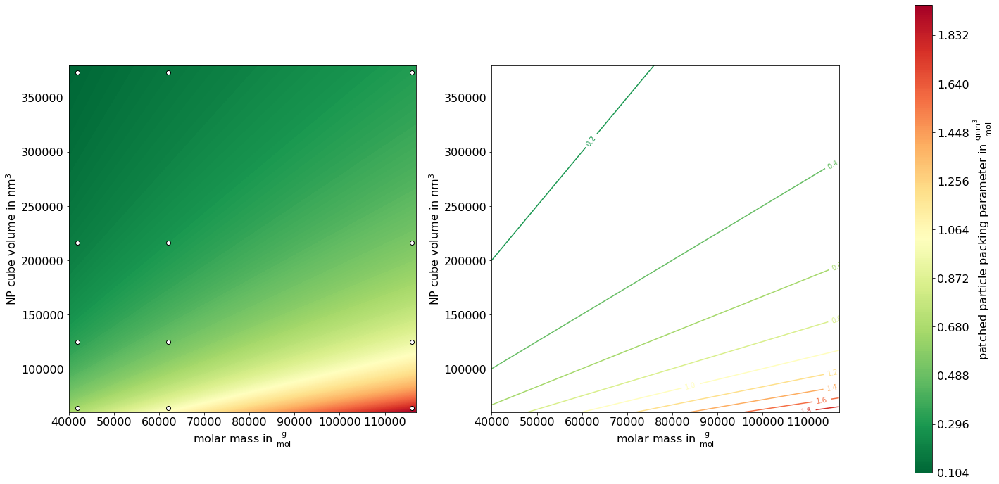

In [335]:
mol_mass = np.arange(40000, 117000, 100)
cube_vol = np.arange(60000, 380000, 100)

mol_mass, cube_vol = np.meshgrid(mol_mass, cube_vol)
patched_particle_parameter = mol_mass / cube_vol

data = np.array([[42000, 64000],
        [42000, 125000],
        [42000, 216000],
        [42000, 373250],
        [62000, 64000],
        [62000, 125000],
        [62000, 216000],
        [62000, 373250],
        [116000, 64000],
        [116000, 125000],
        [116000, 216000],
        [116000, 373250],
       ])


plt.close('all')
gs = mpl.gridspec.GridSpec(ncols=3, nrows=1, width_ratios=[1, 1, 0.05])
fig = plt.figure(figsize=(20, 10))

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1, sharey=ax1)
ax3 = fig.add_subplot(gs[2])

mappable = ax1.contourf(mol_mass, cube_vol, patched_particle_parameter, cmap='RdYlGn_r', levels=250)
ax1.scatter(*data.T, fc='white', ec='k')
ax1.set_aspect(1 / ax1.get_data_ratio())

CS = ax2.contour(mol_mass, cube_vol, patched_particle_parameter, cmap='RdYlGn_r', levels=10)
ax2.clabel(CS, inline=True, fontsize=10)
ax2.set_aspect(1 / ax1.get_data_ratio())

ax1.set_xlabel(r'molar mass in $\mathrm{\frac{g}{mol}}$')
ax1.set_ylabel(r'NP cube volume in $\mathrm{nm^3}$')
ax2.set_xlabel(r'molar mass in $\mathrm{\frac{g}{mol}}$')
ax2.set_ylabel(r'NP cube volume in $\mathrm{nm^3}$')

cb = plt.colorbar(mappable, cax=ax3)
ax3.set_ylabel(r'patched particle packing parameter in $\mathrm{\frac{g nm^3}{mol}}$')

plt.tight_layout()

# Imports

This notebook is for small figure production of my H1Ubi paper.

In [1]:
# nice packages which I use often enough to use abbreviations
import pandas as pd
import numpy as np
import mdtraj as md
import MDAnalysis as mda
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
import nglview as ngl
import pdbfixer as pdbf
import networkx as nx
import xarray as xr

# in-home developed packages
import encodermap as em
# import penetration_pangolin as pp
# import surface_distance_seal as sd

# import only some functions
from collections import Counter
from simtk.openmm.app import PDBFile
from Bio import pairwise2
from mpl_toolkits.axes_grid1 import make_axes_locatable

# import less used and built-in packages
import Bio
import pyemma
import os
import sys
import shutil
import re
import pickle
import glob
import itertools
import locale
import inspect
import IPython
# import trimesh
import time
import subprocess
import math
import scipy
import copy

# import blender
# only works with my bpy environment
# $ conda activate bpy
# import bpy

%matplotlib inline
# widget for jupyterlab, notebook for jupyter-notebooks, inline for debugging
%load_ext autoreload
%autoreload 2


sys.path.insert(0, '/home/kevin/projects/interpenetration_algorithm/ISA/')
import ISA

sys.path.insert(0, '/home/kevin/projects/custom_functions/')
import functions as custom_functions

sys.path.insert(0, '/home/kevin/projects/expansion_elephant/')
import expansion_elephant as ep

/home/kevin/projects/encoder_map_private/encodermap/loading/features.py:36: UserWarning: Features need Unittests
  warnings.warn("Features need Unittests")


In [2]:
# import running_rabbit as rr

In [3]:
# rr.update_gmx_environ()

In [4]:
def render_vmd_w_custom(traj, image_name='', scale_by='2'):
    # get a unified reference
    if not os.path.isfile('/tmp/H1Ub_reference.pdb'):
        from xplor.functions.analysis import align_principal_axes_mdtraj
        ref = md.load_frame('/home/kevin/master/analysis_and_pics/all_trajs/1GHC_K30_-100_20000.xtc', 0, top='/home/kevin/master/analysis_and_pics/K30/K30_0_nosolv.pdb')
        align_principal_axes_mdtraj(ref)
        ref.center_coordinates()
        ref.save_pdb('/tmp/H1Ub_reference.pdb')
    else:
        ref = md.load('/tmp/H1Ub_reference.pdb')
        
    superposed = traj.superpose(ref, 0, atom_indices=traj.top.select('name CA'), ref_atom_indices=ref.top.select('name CA'))
    superposed[0].save_pdb('/tmp/tmp.pdb')
    superposed[1:].save_xtc('/tmp/tmp.xtc')

    com_Ub = np.mean(md.compute_center_of_mass(superposed.atom_slice(superposed.top.select("resid 0 to 75"))) * 10, 0)
    assert superposed.top.atom(superposed.top.select("resid 0 to 75")[-1]).residue.name == 'GLQ'
    com_H5 = np.mean(md.compute_center_of_mass(superposed.atom_slice(superposed.top.select("resid 75 to 151"))) * 10, 0)
    additional_spheres = [com_Ub, com_H5]
    custom_script = f"""source /home/kevin/encodermap/vmd/sscache.tcl
    start_sscache 0
    mol load pdb /tmp/tmp.pdb xtc /tmp/tmp.xtc
    mol drawframes 0 0 0:{superposed.n_frames // 10}:{superposed.n_frames}
    mol modstyle 0 0 newcartoon 0.3 50
    mol modmaterial 0 0 AOChalky
    mol modcolor 0 0 structure
    color Display Background white
    color Axes Labels black
    display depthcue off
    display ambientocclusion on
    display aoambient 1.0
    display aodirect 0.3
    display antialias on
    # display resize 2000 2000
    axes location off
    scale by {scale_by}
    rotate y by 90
    """
    for com, color in zip(additional_spheres, ['grey', 'iceblue']):
        x, y, z = np.round(com, 2)
        custom_script += f"draw color {color}\n"
        custom_script += f"draw sphere {{ {x} {y} {z} }} radius 12.0 resolution 25\n"
        custom_script += "draw material Transparent\n"
    return render_vmd(None, custom_script=custom_script, renderer='tachyon', debug=False, image_name=image_name)

# Check Veronika's sims

In [22]:
dirs = glob.glob('/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K*')

data = {'ubq_site': [], 'rotation': [], 'steps': [], 'timestep': [], 'total_time': []}

for dir_ in dirs:
    ubq_site = dir_.split('/')[-1]
    if ubq_site in ['K47', 'K51', 'K56', 'K63']:
        for subdir in os.listdir(dir_):
            if '_' in subdir:
                rotation = subdir.split('_')[-1]
                this_dir = os.path.join(dir_, subdir) + '/3-NPT'
                contents = os.listdir(this_dir)
                if 'protein_1micros.xtc' in contents:
                    traj = 'protein_1micros.xtc'
                else:
                    traj = 'traj.xtc'
                process = subprocess.Popen(f'gmx check -f {this_dir}/protein_1micros.xtc', stdout=subprocess.PIPE, stderr=subprocess.PIPE, shell=True)
                out = process.stdout.read().decode('utf-8')
                err = process.stderr.read().decode('utf-8')
                
                for line in err.splitlines():
                    if 'Step' in line:
                        steps, timestep = map(lambda x: int(x), line.split()[-2:])
                        total_time = (steps - 1) * timestep
                        break
                
                data['ubq_site'].append(ubq_site)
                data['rotation'].append(rotation)
                data['steps'].append(steps)
                data['timestep'].append(timestep)
                data['total_time'].append(total_time)
                
                
df = pd.DataFrame(data)
df.to_csv("Veronika_sims.csv", index=False)

In [25]:
df

,ubq_site,rotation,steps,timestep,total_time
0,K47,-100,1000001,1,1000000
1,K47,140,1000001,1,1000000
2,K47,20,1000001,1,1000000
3,K51,-120,1000001,1,1000000
4,K51,0,1000001,1,1000000
5,K51,120,1000001,1,1000000
6,K56,-120,1000001,1,1000000
7,K56,0,1000001,1,1000000
8,K56,120,1000001,1,1000000
9,K63,run,1000001,1,1000000


In [24]:
df.to_csv("Veronika_sims.csv", index=False)

# Bad Sketch-map projections

In [8]:
# os.makedirs('bad_sketchmap_projections', exist_ok=True)

In [15]:
# np.savetxt('bad_sketchmap_projections/all_highd', trajs.highd)

In [11]:
# ep.sketchmap.run_dimlandmark(trajs, sketchmap_binaries, 'bad_sketchmap_projections/all_highd', 'bad_sketchmap_projections/highd-landmarks', stride=1)

In [19]:
highd_file = 'bad_sketchmap_projections/highd-landmarks'
lowd_prefix = 'bad_sketchmap_projections/lowd'


# ep.sketchmap.run_sketch_map(highd_file=highd_file, lowd_prefix=lowd_prefix,
#                            sketchmap_binaries=sketchmap_binaries, 
#                            sigma=6, A=10, B=3, a=2, b=3)
trajs.set_lowd_landmarks('bad_sketchmap_projections/lowd-landmarks')
trajs.set_highd_landmarks('bad_sketchmap_projections/highd-landmarks')

In [20]:
trajs.set_sigmoid_params(6, 10, 3, 2, 3)

In [33]:
# ep.sketchmap.run_dimproj(trajs, sketchmap_binaries, tmp_location='bad_sketchmap_projections/')
# trajs.save_lowd('/home/kevin/projects/paper_2019/bad')

Writing temporary files at bad_sketchmap_projections/
Projecting in parallel, using 12 threads.
Writing 1183 temporary highd-files using 12 threads.


FloatProgress(value=0.0, max=1183.0)

Temporary files written. Projecting...


AttributeError: can't set attribute

In [39]:
trajs.load_lowd("bad_sketchmap_projections/", cols=(0, 1))

In [62]:
# ep.misc.scale_projs(trajs, 150)
orig_lowds = np.vstack([np.load(f)[:,:2] for f in glob.glob('bad_sketchmap_projections/*lowd.npy')])

In [63]:
orig_lowds.shape

(483983, 2)

In [48]:
len(trajs.trajs)

1183

In [49]:
rmsds = np.load('combined_RMSDs_from_cryst_struct.npy')
print(rmsds.shape)
print(len(trajs))

(483983,)
483983


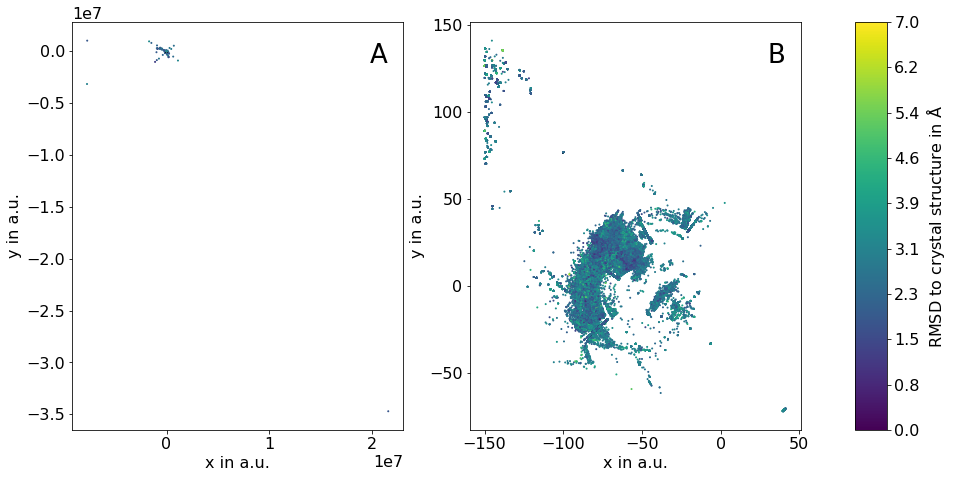

In [102]:
plt.close('all')
mpl.rcParams.update({'font.size': 16})
fig, (ax1, ax2) = plt.subplots(ncols=2)
fig.set_size_inches(15, 7.5)

ax1.scatter(*orig_lowds.T, s=1, c=rmsds)
ax1.set_xlabel('x in a.u.')
ax1.set_ylabel('y in a.u.')
ax2.scatter(*trajs.lowd[:,:2].T, s=1, c=rmsds)
ax2.set_xlabel('x in a.u.')
ax2.set_ylabel('y in a.u.')

txt = ax1.text(0.9, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')
txt = ax2.text(0.9, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='k')

# instead of axes divider use the adjust method
fig.subplots_adjust(right=0.8)
# create cax
cax = fig.add_axes([0.85, ax1.get_position().y0, 0.03, ax1.get_position().height])
# colors_rgba = [mpl.colors.hex2color(color) for color in colors]
cm = plt.viridis()
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
cmap_ticks = np.linspace(0, 1, 10)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=cmap_ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(np.round(np.linspace(0, rmsds.max(), 10)* 10, 1))
cax.set_ylabel(r"RMSD to crystal structure in $\mathrm{\AA}$")

plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/straightforward_sketchmap_highq.png", dpi=600, transparent=True)
plt.savefig("/home/kevin/projects/paper_2019/straightforward_sketchmap_highq.png", dpi=600, transparent=True)
plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/straightforward_sketchmap.png", dpi=300, transparent=True)
plt.savefig("/home/kevin/projects/paper_2019/straightforward_sketchmap.png", dpi=300, transparent=True)

In [105]:
np.savetxt('bad_sketchmap_projections/lowd-landmarks', trajs.lowd_landmarks)
np.savetxt('bad_sketchmap_projections/highd-landmarks', trajs.highd_landmarks)

# Structures from high density region

In [9]:
trajs.load_lowd('/home/kevin/projects/combined_sketch/SASA/original_params_paper_K30_to_K63/', parallel=False, cols=[0, 1])

In [12]:
trajs.generate_pandas(boundary=150)

Scaled 1306 points. Finding (x,y) duplicates. This might take some time.


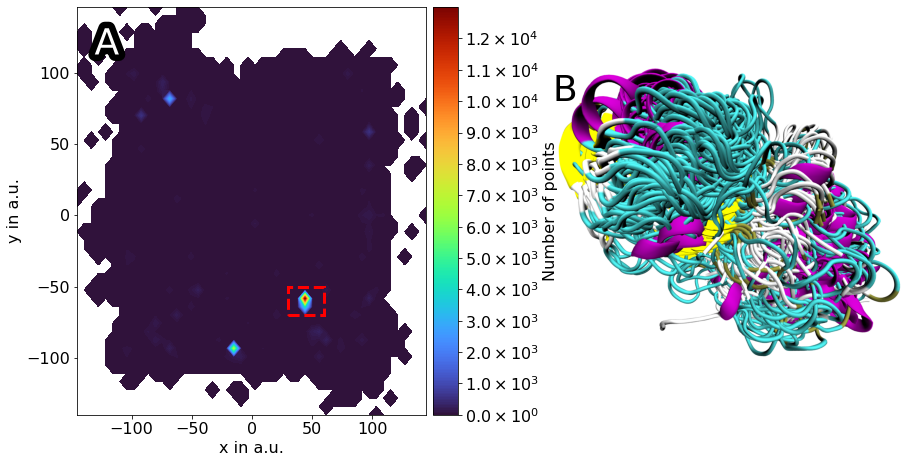

In [151]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from encodermap.plot.plotting import _zoomingBoxManual
from decimal import Decimal
import matplotlib.patheffects as patheffects

plt.close('all')
mpl.rcParams.update({'font.size': 16})
fig, (ax1, ax2) = plt.subplots(ncols=2)
fig.set_size_inches(15, 7.5)

bins = 50
pts = trajs.lowd


ll = np.array([25, -75])  # lower-left
ur = np.array([75, -25])  # upper-right

inidx = np.all(np.logical_and(ll <= pts, pts <= ur), axis=1)
inbox = pts[inidx]
x, y = trajs.lowd.T

H, xedges, yedges = np.histogram2d(x=x, y=y, bins=bins)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

with np.errstate(divide='ignore'):  # ignore division by zero error
    F = np.log(H)
    
pi = H / float(H.sum())
free_energy = np.inf * np.ones(shape=H.shape)
nonzero = pi.nonzero()
free_energy[nonzero] = -np.log(pi[nonzero])
free_energy[nonzero] -= np.min(free_energy[nonzero])

levels = np.linspace(0.001, free_energy[~np.isinf(free_energy)].max(), 10)

def neighbor_in_last_range(levels, H, bin_index):
    for i in range(-1, 1):
        for j in range(-1, 1):
            if H[bin_index[0] + i, bin_index[1] + j] >= levels[-2] and H[bin_index[0] + i, bin_index[1] + j] < levels[-1]:
                return H[bin_index[0] + i, bin_index[1] + j]
    return False

def latex_exponent_string_from_scientific(exponent_str):
    if not isinstance(exponent_str, str):
        raise Exception("Please provide a string with e format, e.g. 3.24e10.")
    x = Decimal(exponent_str).as_tuple()
    base = str(x.digits[0]) + '.' + ''.join(str(i) for i in x.digits[1:])
    if len(x.digits) == 1:
        base += '0'
    exponent = str(x.exponent)
    if exponent == '-1':
        exponent = '0'
    return r'$\mathrm{' + base + r' \times 10^{' + exponent + r'}}$'

free_energy_new = copy.deepcopy(free_energy)
for i in range(1, bins - 1):
    for j in range(1, bins - 1):
        if x := neighbor_in_last_range(levels, free_energy, (i, j)):
            free_energy_new[i, j] = x

cmap = plt.get_cmap('turbo').with_extremes(over='w')
mappable = ax1.contourf(X, Y, H.T, cmap=cmap, levels=np.linspace(0.001, H.max(), 1000), )
ax_divider = make_axes_locatable(ax1)
cax = ax_divider.append_axes("right", size="7%", pad="2%")
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax)
values = np.linspace(0, 130000, 13, endpoint=False)
tick_positions = np.linspace(0, 1, 13, endpoint=False)
new_labels = [f"{i:.1e}" for i in values]
new_labels = list(map(latex_exponent_string_from_scientific, new_labels))
cbar.set_ticks(tick_positions)
cax.set_yticklabels(new_labels)
cax.set_ylabel("Number of points")
# cbar.formatter.set_powerlimits((0, 0))
# mappable = ax2.contourf(X, Y, F.T, cmap=cmap, levels=np.linspace(0.001, F.max(), 1000), )
ax1.set_xlabel('x in a.u.')
ax1.set_ylabel('y in a.u.')
txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=36, verticalalignment='top', color='white',
path_effects=[patheffects.withStroke(linewidth=13, foreground='black', capstyle="round")])

# ax2.set_xlim([30, 60])
# ax2.set_ylim([-70, -50])
ax2.set_xticks([])
ax2.set_yticks([])
# list(ax2.spines.values())[0].set_linewidth(0)
[k.set_linewidth(0) for k in ax2.spines.values()]
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=36, verticalalignment='top', color='k')

rect = plt.Rectangle((30, -70), 30, 20, ls='--', ec='red', fc=(0, 0, 0, 0), lw=3)
ax1.add_patch(rect)
img = plt.imread('high_density_region_100_frames.png')
ax2.imshow(img)

plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/high_density_pathc_example_highq.png", dpi=600, transparent=True)
plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/high_density_pathc_example.png", dpi=300, transparent=True)
plt.savefig("/home/kevin/projects/paper_2019/high_density_pathc_example_highq.png", dpi=600, transparent=True)
plt.savefig("/home/kevin/projects/paper_2019/high_density_pathc_example.png", dpi=300, transparent=True)

# plt.tight_layout()

In [107]:
memberships = np.load("/home/kevin/projects/clustering/hdbscan_with_RMSD_cutoff/memberships_v2.npy")

In [111]:
import hdbscan

In [122]:
highd_density_ = trajs.lowd[memberships == -2]
highd_density = highd_density_[highd_density_[:,0] > 0]
# single_clusterer = hdbscan.HDBSCAN().fit(highd_density)

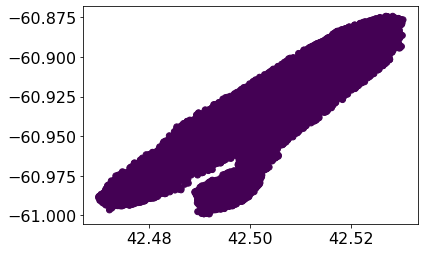

In [123]:
plt.scatter(*highd_density[single_clusterer.labels_ == 5].T, c=single_clusterer.labels_[single_clusterer.labels_ == 5])

In [137]:
fake_cluster_membership = np.full(trajs.n_frames, -1)
where = np.arange(trajs.n_frames)[memberships == -2][highd_density_[:,0] > 0][single_clusterer.labels_ == 5]
fake_cluster_membership[where] = 0
trajs.df['cluster_membership'] = fake_cluster_membership
view, traj = ep.clustering.gen_dummy_traj(trajs, 0, superpose=True, max_frames=100, nglview=True, stack_atoms=False)

/home/kevin/projects/expansion_elephant/expansion_elephant/clustering/clustering.py:134: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if isinstance(cluster_no, (int, np.int, np.int64)):
/home/kevin/projects/expansion_elephant/expansion_elephant/trajinfo/trajinfo.py:1201: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If yo

Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.


In [139]:
traj.save_pdb('high_density_region_100_frames.pdb')

# gmx energy and rms

In [3]:
# K47_0_energy = np.loadtxt('sketchmap_energy/K47_0_energy.xvg', comments=['@', '#'])
# K47_120_energy = np.loadtxt('sketchmap_energy/K47_120_energy.xvg', comments=['@', '#'])

In [21]:
K47_0_rms = np.loadtxt('sketchmap_energy/K47_0_rms_fit.xvg', comments=['@', '#'])
K47_120_rms = np.loadtxt('sketchmap_energy/K47_120_rms_fit.xvg', comments=['@', '#'])

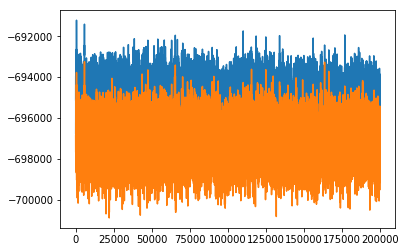

In [10]:
fig, ax = plt.subplots()
x = np.arange(len(K47_0_energy))
ax.plot(x, K47_0_energy[:,1])
ax.plot(x, K47_120_energy[:,1])

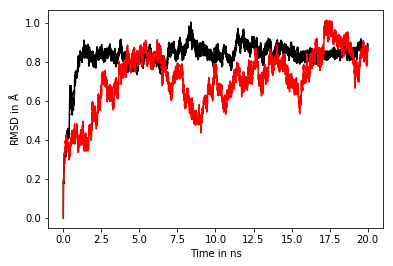

In [43]:
fig, ax = plt.subplots()
x = np.arange(len(K47_0_rms)) / 1000
ax.plot(x, K47_0_rms[:,1], color='black')
ax.plot(x, K47_120_rms[:,1], color='red')

_ = ax.set_xlabel(r"Time in ns")
_ = ax.set_ylabel(r"RMSD in $\mathrm{\AA}$")

plt.savefig("/home/kevin/projects/paper_2019/")

## With inset figure

### Load trajs

In [5]:
trajs = glob.glob('/home/kevin/master/analysis_and_pics/all_trajs/*.xtc')
refs = []
refs.append('/home/kevin/master/analysis_and_pics/K30/K30_0_nosolv.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K41/K41_0_nosolv.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K47/K47_0_no_water.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K51/K51_20_no_water.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K56/K56_0_nosolv.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K63/K63_0_nosolv.pdb')

In [6]:
if isinstance(trajs, list):
    trajs = ep.Info_all(trajs, refs, backend='no_load', common_str=['K30', 'K41', 'K47', 'K51', 'K56', 'K63'])
trajs.load_lowd('/home/kevin/projects/combined_sketch/SASA/original_params_paper_K30_to_K63/', parallel=False, cols=[0, 1])
trajs.load_highd('/home/kevin/projects/combined_sketch/SASA/original_params_K30_to_K63/', parallel=False)

# trajs.generate_pandas(boundary=150, overwrite=True)

# assert not np.any(np.isnan(trajs.lowd[:,:2])), "There are some NaNs in the array"

In [7]:
np.unique(np.abs(trajs.lowd[:,0]) > 1000000, return_counts=True)

(array([False,  True]), array([483978,      5]))

In [8]:
trajs.load()

In [9]:
assert np.any(trajs.lowd)

**Number of K30 trajs**

In [ ]:
_ = pd.Series(data=trajs.name_arr, name='traj_name')
_.str.contains('K30').value_counts()

**number of SASA CVs**

In [34]:
with open("/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/sasa_atom_numbers/histon_sasa_>=1.txt", 'r') as f:
    txt = f.read().splitlines()
    
def RepresentsInt(s):
    try: 
        int(s)
        return True
    except ValueError:
        return False
print(sum(list(map(RepresentsInt, txt))))

19


### Get the K47 starting trajs and load the coordinates from hiwi_project

In [398]:
indices = []
for i, traj in enumerate(trajs):
    if traj.basename.count('_') < 2 and 'K47' in traj.basename:
        indices.append(i)
trajs_K47 = trajs[indices]

In [399]:
for traj in trajs_K47:
    if traj.basename == 'K47_-100_nosolv':
        traj.lowd =  np.genfromtxt(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/K47/10th_run/Analysis/sketch/projs_new_after_3rd_1st-10th_run/lowd_K47_dists_K47_-100", usecols=[0, 1])
    elif traj.basename == 'K47_20_nosolv':
        traj.lowd =  np.genfromtxt(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/K47/10th_run/Analysis/sketch/projs_new_after_3rd_1st-10th_run/lowd_K47_dists_K47_20", usecols=[0, 1])
    elif traj.basename == 'K47_140_nosolv':
        traj.lowd =  np.genfromtxt(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/K47/10th_run/Analysis/sketch/projs_new_after_3rd_1st-10th_run/lowd_K47_dists_K47_140", usecols=[0, 1])
    else:
        traj.lowd =  np.genfromtxt(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/K47/10th_run/Analysis/sketch/projs_new_after_3rd_1st-10th_run/lowd_K47_dists_{traj.basename}", usecols=[0, 1])
trajs_K47.lowd.shape

(6015, 2)

### Same for K30

In [401]:
indices = []
for i, traj in enumerate(trajs):
    if traj.basename.count('_') < 2 and 'K30' in traj.basename:
        indices.append(i)
trajs_K30 = trajs[indices]

In [402]:
for traj in trajs_K30:
    traj.lowd =  np.genfromtxt(f"/home/kevin/master/molsim/1st_run/analysis/1GHC/K30/sketch_1st_scaled/lowd_{traj.basename}_mindistres")
trajs_K30.lowd

array([[18.88619234,  5.94485861],
       [19.71225275, -0.09985228],
       [19.25944912, -0.51754766],
       ...,
       [-6.03      , -4.02      ],
       [-5.28154596, -4.93063665],
       [-5.00645659, -4.05457479]])

### plot

In [403]:
colors_rgba = plt.cm.twilight(np.linspace(0, 1, 18))

In [115]:
%matplotlib inline

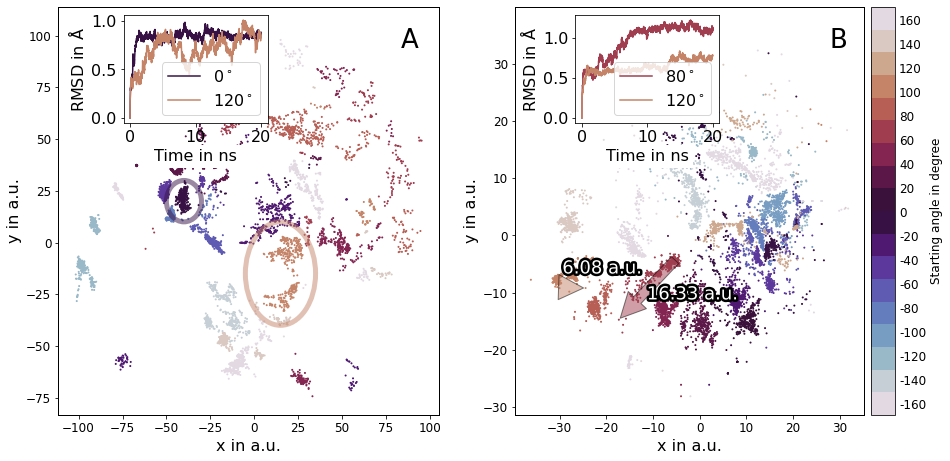

In [415]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

plt.close('all')
mpl.rcParams.update({'font.size': 16})
fig, (ax1, ax2) = plt.subplots(ncols=2)
fig.set_size_inches(15, 7.5)
ep.plotting.plot_angles(trajs_K47, title='', ax=ax1, remove_ticks=False, colorbar=False)
ep.plotting.plot_angles(trajs_K30, title='', ax=ax2, remove_ticks=False)
[k.set_linewidth(1) for k in ax1.spines.values()]
ax1.set_xlabel("x in a.u.")
ax1.set_ylabel("y in a.u.")
[k.set_linewidth(1) for k in ax2.spines.values()]
ax2.set_xlabel("x in a.u.")
ax2.set_ylabel("y in a.u.")

# circles in ax1
patch = mpl.patches.Circle((-40, 20), 10, fill=False, color=colors_rgba[8], lw=5, alpha=0.5)
ax1.add_artist(patch)
patch = mpl.patches.Ellipse((15, -15), 40, 50, fill=False, color=colors_rgba[14], lw=5, alpha=0.5)
ax1.add_artist(patch)

# A and B annotations
txt = ax1.text(0.9, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')
txt = ax2.text(0.9, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='k')

# inset figure
K47_0_rms = np.loadtxt('sketchmap_rms/K47_0_rms_fit.xvg', comments=['@', '#'])
K47_120_rms = np.loadtxt('sketchmap_rms/K47_120_rms_fit.xvg', comments=['@', '#'])
axins = inset_axes(ax1, width=2, height=1.5, loc=2, bbox_to_anchor=(.15, -.5, 2, 1.5), bbox_transform=ax1.transAxes)
x = (np.arange(len(K47_0_rms)) / 1000)[::10]
axins.plot(x, K47_0_rms[:,1][::10], color=colors_rgba[8], label=r"$\mathrm{0^\circ}$")
axins.plot(x, K47_120_rms[:,1][::10], color=colors_rgba[14], label=r"$\mathrm{120^\circ}$")
axins.legend()
_ = axins.set_xlabel(r"Time in ns")
_.set_bbox(dict(facecolor='w', edgecolor='none'))
_ = axins.set_ylabel(r"RMSD in $\mathrm{\AA}$")


# inset figure 2
K30_0_rms = np.loadtxt('sketchmap_rms/K30_0_rms.xvg', comments=['@', '#'])
K30_80_rms = np.loadtxt('sketchmap_rms/K30_80_rms.xvg', comments=['@', '#'])
K30_120_rms = np.loadtxt('sketchmap_rms/K30_120_rms.xvg', comments=['@', '#'])
K30_160_rms = np.loadtxt('sketchmap_rms/K30_160_rms.xvg', comments=['@', '#'])
axins2 = inset_axes(ax2, width=2, height=1.5, loc=2, bbox_to_anchor=(.15, -.5, 2, 1.5), bbox_transform=ax2.transAxes)
x = (np.arange(len(K30_80_rms)) / 1000)[::10]
axins2.plot(x, K30_80_rms[:,1][::10], color=colors_rgba[12], label=r"$\mathrm{80^\circ}$")
# axins2.plot(x, K30_160_rms[:,1][::10], color=colors_rgba[16], label=r"$\mathrm{160^\circ}$")
# axins2.plot(x, K30_0_rms[:,1][::10], color=colors_rgba[8], label=r"$\mathrm{0^\circ}$")
axins2.plot(x, K30_120_rms[:,1][::10], color=colors_rgba[14], label=r"$\mathrm{120^\circ}$")
axins2.legend()
_ = axins2.set_xlabel(r"Time in ns")
_.set_bbox(dict(facecolor='w', edgecolor='none'))
_ = axins2.set_ylabel(r"RMSD in $\mathrm{\AA}$")

# K30_80 arrow
x_min, y_min = trajs_K30[17].lowd[0]
x_max, y_max = trajs_K30[17].lowd[-1]
dx = x_max - x_min
dy = y_max - y_min
length = str(np.round(np.linalg.norm([dx, dy]), 2))

arrowprops = dict(arrowstyle="simple", facecolor=colors_rgba[12], alpha=0.5)
ax2.annotate('', xy=(x_min, y_min), xycoords='data', xytext=(x_max, y_max), textcoords='data', size=50, va='center', ha='center', arrowprops=arrowprops)
txt = ax2.text(x=x_min + 6, y=y_min + 6, s=length + ' a.u.', transform=ax2.transData, fontsize=18, verticalalignment='top', color='w')
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])

# K30_120 arrow
x_min, y_min = trajs_K30[10].lowd[0]
x_max, y_max = trajs_K30[10].lowd[-1]
dx = x_max - x_min
dy = y_max - y_min
length = str(np.round(np.linalg.norm([dx, dy]), 2))

arrowprops = dict(arrowstyle="simple", facecolor=colors_rgba[14], alpha=0.5)
ax2.annotate('', xy=(x_min, y_min), xycoords='data', xytext=(x_max, y_max), textcoords='data', size=50, va='center', ha='center', arrowprops=arrowprops)
txt = ax2.text(x=x_min -5, y=y_min + 5, s=length + ' a.u.', transform=ax2.transData, fontsize=18, verticalalignment='top', color='w')
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])

img_name = 'first_iteration_K47_and_K30'
living_ppt_dir = 'expansion_scheme'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")

# Problems when plotting histograms

For the histograms:  is it possible to do bigger bins, so that there are no such sharpedges seen.  I think those white sharp edges can be misleading.  For final pictures try todo much finer binning.

In [19]:
trajs.generate_pandas(boundary=150, overwrite=True)

Scaled 1306 points. Finding (x,y) duplicates. This might take some time.


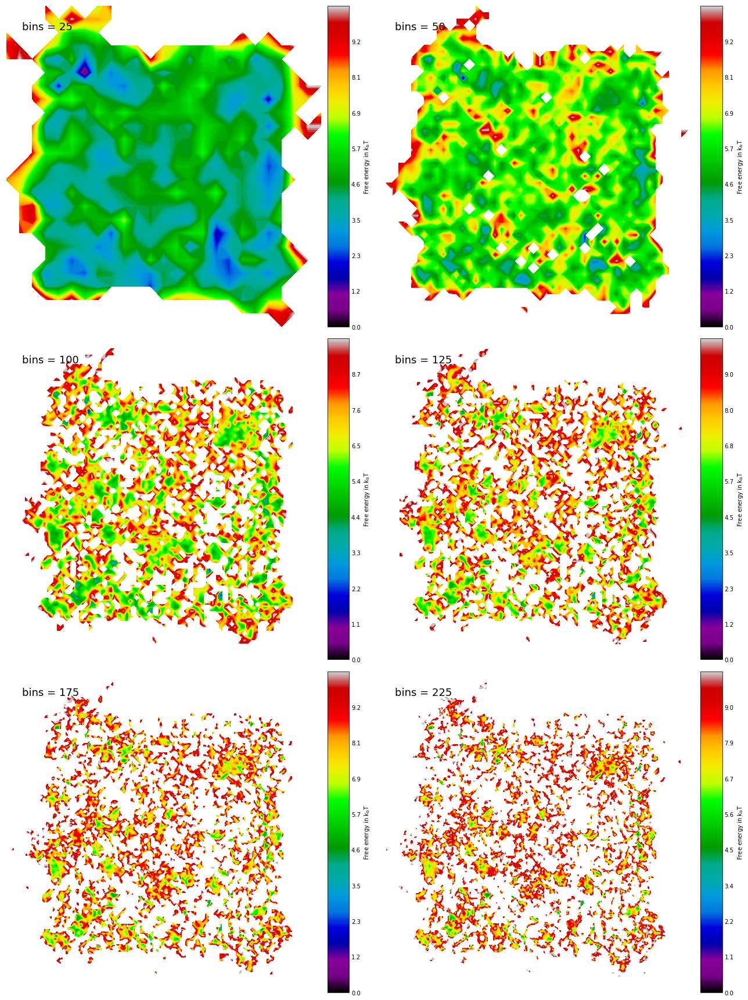

In [25]:
plt.close('all')

ncols=2
nrows=3


fig, axes = plt.subplots(ncols=ncols, nrows=nrows)
fig.set_size_inches(18, 24)

k = 0
bins = [25, 50, 100, 125, 175, 225]
for i in range(nrows):
    for j in range(ncols):
        ax = axes[i, j]
        ep.plotting.plot_density(trajs, bins=bins[k], to_plot='free_energy', cmap='nipy_spectral', ax=ax, exclude_region=[[-14, -12, -94, -92], [42, 42.75, -61.5, -60.5]])
        txt = ax.text(0.05, 0.95, f"bins = {bins[k]}", transform=ax.transAxes, fontsize=18, verticalalignment='top', color='k')
        
        k += 1
        
plt.savefig("/home/kevin/projects/paper_2019/comparison_bins.png", dpi=400, transparent=True)

# Density, inset figures and other stuff.

In [4]:
trajs.generate_pandas(boundary=150, overwrite=True)

Scaled 1306 points. Finding (x,y) duplicates. This might take some time.
Found 1897 (x,y) duplicates in the dataset.


In [150]:
from importlib import reload
ep = reload(ep)

## Render some inset figures from random frames from the RMSD centroids from hand selected clusters

In [4]:
for file in glob.glob("*inset*.png"):
    os.remove(file)
os.remove("indices.npy")

In [20]:
hand_selected_clusters = np.load("user_selected_points.npy")
trajs.set_cluster_membership(hand_selected_clusters)

if os.path.isfile("indices.npy"):
    indices = np.load("indices.npy")
else:
    indices = []

for i in range(np.max(hand_selected_clusters) + 1):
    # find rmsd centroid
    if not os.path.isfile("indices.npy"):
        _, dummy_traj = ep.clustering.gen_dummy_traj(trajs, i, max_frames=100)
        where = np.where(trajs.df['cluster_membership'].values == i)[0]
        idx = np.round(np.linspace(0, len(where) - 1, 100)).astype(int)
        where = where[idx]
        index, distances, centroid = ep.clustering.rmsd_centroid_of_cluster(dummy_traj)
        index = where[index]
        indices.append(index)
    else:
        index = indices[i]
        
    # align to cluster 0
    if os.path.isfile(f"inset_figure_{i}.pdb"):
        frame = md.load(f"inset_figure_{i}.pdb")
    else:
        frame = trajs.get_single_frame(index).traj
        H5_CA = frame.top.select("resid 76 to 151 and name CA")
        if i == 0:
            print(frame.top.atom(H5_CA[0]))
        if i > 0:
            frame.superpose(md.load("inset_figure_0.pdb"), atom_indices=H5_CA, ref_atom_indices=H5_CA)
        frame.save_pdb(f"inset_figure_{i}.pdb")
        
    # render
    if os.path.isfile(f"inset_figure_{i}.png"):
        pass
    else:
        central_Ub =(md.compute_center_of_mass(frame.atom_slice(frame.top.select("resid 0 to 75")))[0] * 10).tolist() + [12.0]
        central_H5 = (md.compute_center_of_mass(frame.atom_slice(frame.top.select("resid 76 to 151")))[0] * 10).tolist() + [12.0]
        additional_spheres = [central_H5, central_Ub]
        try: os.remove(f"inset_figure_{i}.png")
        except FileNotFoundError:
            pass
        image = ep.plotting.render_vmd(f"inset_figure_{i}.pdb", image_name=f"inset_figure_{i}.png", scale=2, additional_spheres=additional_spheres)
    
indices = np.array(indices)
np.save("indices.npy", indices)

Duplicates have already been reassigned.


In [ ]:
image = ep.plotting.render_vmd(f"inset_figure_{i}.pdb")

## Make image

In [5]:
trajs.generate_pandas(boundary=150, overwrite=True)

Scaled 1306 points. Finding (x,y) duplicates. This might take some time.


In [6]:
plt.gcf().canvas.get_supported_filetypes()

{'ps': 'Postscript',
 'eps': 'Encapsulated Postscript',
 'pdf': 'Portable Document Format',
 'pgf': 'PGF code for LaTeX',
 'png': 'Portable Network Graphics',
 'raw': 'Raw RGBA bitmap',
 'rgba': 'Raw RGBA bitmap',
 'svg': 'Scalable Vector Graphics',
 'svgz': 'Scalable Vector Graphics',
 'jpg': 'Joint Photographic Experts Group',
 'jpeg': 'Joint Photographic Experts Group',
 'tif': 'Tagged Image File Format',
 'tiff': 'Tagged Image File Format'}

<Figure size 432x288 with 0 Axes>

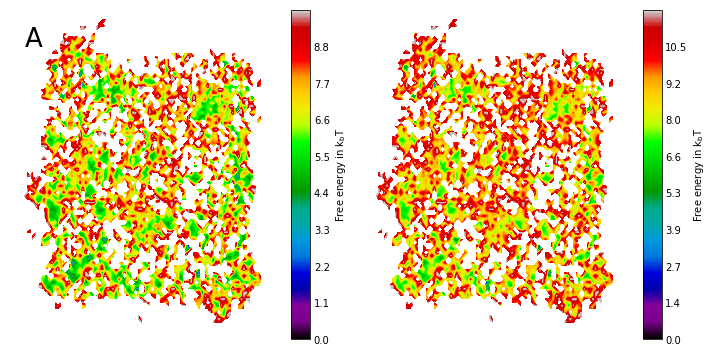

In [26]:
fig, (ax1, ax2) = plt.subplots(ncols=2)
fig.set_size_inches(10, 5)

ep.plotting.plot_density(trajs, to_plot='free_energy', cmap='nipy_spectral', ax=ax1, exclude_region=[[-14, -12, -94, -92], [42, 42.75, -61.5, -60.5], [0, 0, 0, 0]])
txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')

ep.plotting.plot_density(trajs, to_plot='free_energy', cmap='nipy_spectral', ax=ax2)#, exclude_region=[[-14, -12, -94, -92], [42, 42.75, -61.5, -60.5]])

In [70]:
fig.get_gridscpec()

AttributeError: 'Figure' object has no attribute 'get_gridscpec'

/tmp/ipykernel_2016760/249425531.py:234: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


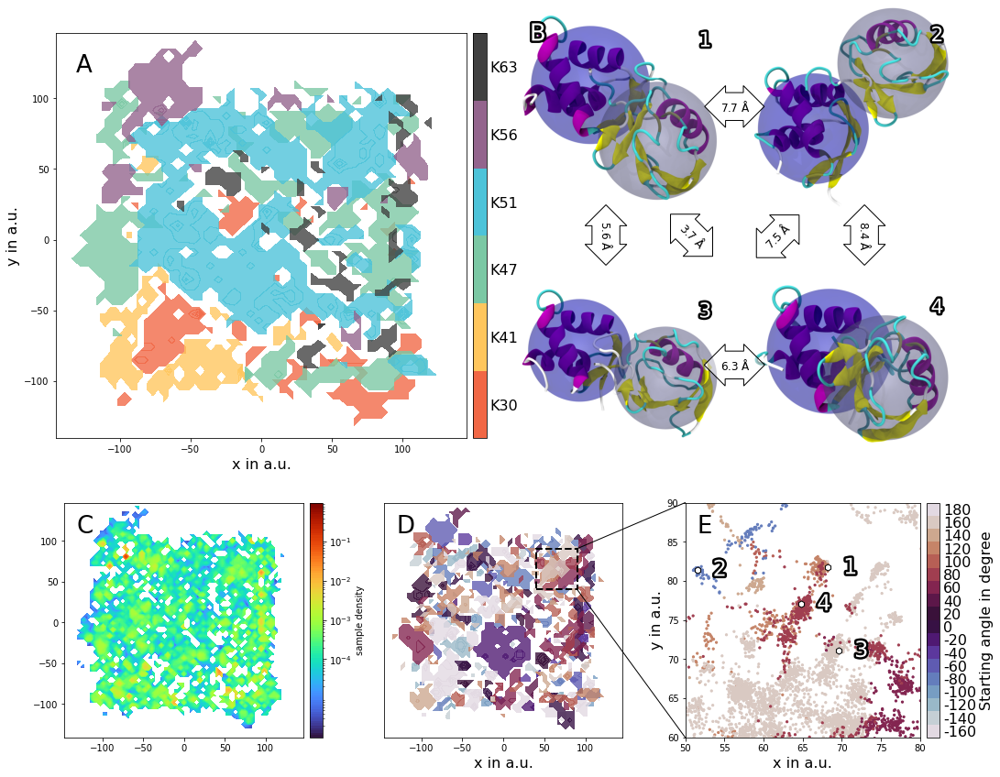

In [14]:
import matplotlib.patheffects as PathEffects

plt.close('all')

fig = plt.figure(constrained_layout=False, figsize=(17.5, 15))
gs = fig.add_gridspec(nrows=6, ncols=12, wspace=0.75)
ax1 = fig.add_subplot(gs[:4, :6], aspect='equal')
ax2 = fig.add_subplot(gs[:4, 6:], aspect='equal')
ax3 = fig.add_subplot(gs[4:, :4], aspect='equal')
ax4 = fig.add_subplot(gs[4:, 4:8], aspect='equal')
ax5 = fig.add_subplot(gs[4:, 8:], aspect='equal')

fax1 = fig.add_subplot(gs[:2, 6:9])
fax2 = fig.add_subplot(gs[:2, 9:])
fax3 = fig.add_subplot(gs[2:4, 6:9])
fax4 = fig.add_subplot(gs[2:4, 9:])

for ax in (fax1, fax2, fax3, fax4, ax2):
    ax.axis('off')
    
ax2.set_zorder(10)

# remove spines from ax2
ax2.set_xticks([])
ax2.set_yticks([])
[k.set_linewidth(0) for k in ax2.spines.values()]

# change ax names
ubq_site_axis = ax1
free_energy_axis = ax3
angle_all_axis = ax4
angle_zoomed_axis = ax5

# texts
for (ax, lbl) in zip([ax1, ax2, ax3, ax4, ax5], ['A', 'B', 'C', 'D', 'E']):
    if lbl == 'B':
        continue
    txt = ax.text(0.05, 0.95, lbl, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')

# ubiquitylation site axis
color_to_hex = lambda x: str(hex(x))[-2:].upper()
common_str = trajs.common_str
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
n_bins = 50
for cs, color in zip(trajs.common_str, colors):
    index = [cs in name for name in trajs.name_arr]

    H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=n_bins)

    xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
    ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
    X, Y = np.meshgrid(xcenters, ycenters)
    
    # map values of H to colors
    min_ = 200; max_ = 255
    H_ = np.interp(H, (H.min(), H.max()), (min_, max_)).astype(int)
    levels = np.unique(H_)
    mapping = {k: v + 1 for v, k in enumerate(levels)}
    H_new = np.vectorize(mapping.get)(H_)
    H_new[H == 0] = 0
    colors_ = [f"{color}{color_to_hex(i)}" for i in levels]

    cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', colors_)
    cmap.set_bad('w', alpha=0)
    H_new = np.ma.masked_where(H_new == 0, H_new)
    ubq_site_axis.contourf(X, Y, H_new.T, cmap=cmap, zorder=-1)
    
# ep.plotting.plot_common_str(trajs, ax=ax3, fontsize=16, remove_ticks=False)
ubq_site_axis.set_xlabel('x in a.u.', fontsize=16)
ubq_site_axis.set_ylabel('y in a.u.', fontsize=16)
# colormap
divider = make_axes_locatable(ubq_site_axis)
ubq_site_axis_cax = divider.append_axes("right", size=0.2, pad=0.1)#, sharey=ax1)
colors_rgba = [mpl.colors.hex2color(color) for color in colors]
cm = mpl.colors.LinearSegmentedColormap.from_list('name', colors_rgba, N=len(common_str))
norm = mpl.colors.Normalize(vmin=0, vmax=len(common_str))
norm = mpl.colors.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
cmap_ticks = np.linspace(0, 1, len(common_str) + 1)[:-1] + 1.0/(len(common_str) * 2)
cb = plt.colorbar(sm, cax=ubq_site_axis_cax, ticks=cmap_ticks)
yticklabels = cb.ax.set_yticklabels(common_str, fontsize=16)
cb.ax.tick_params(axis="y",direction="out", length=0)

# ax3 will be free energy
x, y = ep.plotting.plotting._exclude_points(trajs.lowd, [[-14, -12, -94, -92], [42, 42.75, -61.5, -60.5]])
fig, ax, misc = pyemma.plots.plot_density(x, y, ax=free_energy_axis, cmap='turbo', logscale=True, cbar=False, nbins=75)

divider = make_axes_locatable(free_energy_axis)
ubq_site_axis_cax = divider.append_axes("right", size=0.2, pad=0.1)#, sharey=ax1)
sm = misc['mappable']
cmap_ticks = [10**i for i in range(-4, 0)]
cb = plt.colorbar(sm, cax=ubq_site_axis_cax, ticks=cmap_ticks)
ubq_site_axis_cax.set_ylabel('sample density')

# ax4 will be angles
def decide_starting_angle(basename):
    if '1GHC' in basename:
        return int(basename.split('_')[2])
    else:
        return int(basename.split('_')[1])

n_bins = 50
angles = np.arange(-160, 181, 20)
colors_rgba = plt.cm.twilight(np.linspace(0, 1, 18))
starting_angles = np.array(list(map(decide_starting_angle, trajs.name_arr)))
for angle, color in zip(angles, colors_rgba):
    color = mpl.colors.to_hex(color).upper()
    index = np.where(starting_angles == angle)[0]
    
    H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=n_bins)

    xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
    ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
    X, Y = np.meshgrid(xcenters, ycenters)
    
    # map values of H to colors
    min_ = 200; max_ = 255
    H_ = np.interp(H, (H.min(), H.max()), (min_, max_)).astype(int)
    levels = np.unique(H_)
    mapping = {k: v + 1 for v, k in enumerate(levels)}
    H_new = np.vectorize(mapping.get)(H_)
    H_new[H == 0] = 0
    colors_ = [f"{color}{color_to_hex(i)}" for i in levels]
    
    cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', colors_)
    cmap.set_bad('w', alpha=0)
    H_new = np.ma.masked_where(H_new == 0, H_new)
    angle_all_axis.contourf(X, Y, H_new.T, cmap=cmap, zorder=-1)
angle_all_axis.set_xlabel('x in a.u.', fontsize=16)
angle_all_axis.set_yticks([])

# zoom in on next axis add a colorbar and a zoom plot
angles = np.arange(-160, 181, 20)
colors_rgba = plt.cm.twilight(np.linspace(0, 1, 18))
starting_angles = np.array(list(map(decide_starting_angle, trajs.name_arr)))
x = angles
y = starting_angles
xsorted = np.argsort(x)
ypos = np.searchsorted(x[xsorted], y)
starting_angles_indices = xsorted[ypos]
scatter_colors = colors_rgba[starting_angles_indices]

angle_zoomed_axis.scatter(*trajs.lowd[:,:2].T, c=scatter_colors, s=5)


angle_zoomed_axis.set_xlim(50, 80)
angle_zoomed_axis.set_ylim(60, 90)
angle_zoomed_axis.set_xlabel('x in a.u.', fontsize=16)
angle_zoomed_axis.set_ylabel('y in a.u.', fontsize=16)

# colorbar for angles
divider = make_axes_locatable(angle_zoomed_axis)
angle_zoomed_axis_cax = divider.append_axes("right", size=0.2, pad=0.1)#, sharey=ax1)
cm = mpl.colors.LinearSegmentedColormap.from_list('name', colors_rgba, N=len(angles))
norm = mpl.colors.Normalize(vmin=0, vmax=len(angles))
norm = mpl.colors.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
cmap_ticks = np.linspace(0, 1, len(angles) + 1)[:-1] + 1.0/(len(angles) * 2)
cb = plt.colorbar(sm, cax=angle_zoomed_axis_cax, ticks=cmap_ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(angles, fontsize=16)
# remove tick length
cb.ax.tick_params(axis="y",direction="out", length=0)
angle_zoomed_axis_cax.set_ylabel('Starting angle in degree', fontsize=16)
# cax4.yaxis.tick_left()


# zoom effect
roiKwargs = dict([('fill',False), ('linestyle','dashed'), ('color','k'), ('linewidth',2)])
limits = [40, 40, 50, 50]
rect = mpl.patches.Rectangle(limits[:2], limits[2], limits[3], **roiKwargs)
angle_all_axis.add_patch(rect)
con = mpl.patches.ConnectionPatch(xyA=(rect.get_x() + rect.get_width(), rect.get_y()), xyB=[0,0], coordsA='data', coordsB='axes fraction', axesA=angle_all_axis, axesB=angle_zoomed_axis)
con.set_color([0, 0, 0])
angle_all_axis.add_artist(con)
con = mpl.patches.ConnectionPatch(xyA=(rect.get_x() + rect.get_width(), rect.get_y() + rect.get_height()), xyB=[0,1], coordsA='data', coordsB='axes fraction', axesA=angle_all_axis, axesB=angle_zoomed_axis)
con.set_color([0, 0, 0])
angle_all_axis.add_artist(con)

# images
indices = np.load("indices.npy")
indices_ = [0, 1, 4, 5]
iter_ = 0
fig_axes = [fax1, fax2, fax3, fax4]
labels = []
for i in range(0, 2):
    for j in range(2, 4):
        image = plt.imread(f"inset_figure_{indices_[iter_]}.png")
        # load the trajs
        # _1 = md.load(f"inset_figure_{indices_[iter_]}.pdb")
        # _2 = md.load(f"inset_figure_{indices_[(iter_ + 1) % len(indices_)]}.pdb")
        # calculate rmsd
        # rmsd = np.round(md.rmsd(_1, _2)[0] * 10, 1)
        # debug
        # print(f"inset_figure_{indices_[iter_]}.pdb", f"inset_figure_{indices_[(iter_ + 1) % len(indices_)]}.pdb", 'RMSD=', rmsd)
        # append rmsd to labels
        # labels.append(str(rmsd) + r" $\mathrm{\AA}$")
        # create subplot and show image
        ax = fig_axes[iter_]
        where = np.where(image != [1., 1., 1.])
        ax.imshow(image[np.min(where[0]) - 20: np.max(where[0]) + 20, np.min(where[1]) - 20: np.max(where[1]) + 20,:], zorder=-1)
        # clean up
        if iter_ == 0:
            txt = ax.text(0.05, 0.95, 'B', transform=ax.transAxes, fontsize=26, verticalalignment='top', color='w')
            txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
        txt = ax.text(0.9, 0.9, iter_ + 1, transform=ax.transAxes, fontsize=22, verticalalignment='top', color='w')
        txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
        iter_ += 1
        
# add the cluster centroids
colors = ['red', 'blue', 'green', 'yellow']
iter_ = 0
for i, color in zip(indices_, colors):
    angle_zoomed_axis.scatter(*trajs.lowd[indices[i]], s=50, c='w', marker='h', edgecolors='k')
    txt = angle_zoomed_axis.text(*trajs.lowd[indices[i]] + np.array([2, 0]), iter_ + 1, fontsize=24, color='w', va='center')
    txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
    iter_ += 1   

coordsA = [(.4, .8), (.7, .6), (.4, .2), (.3, .6), (.2, .6), (.8, .6)]
coordsB = [(.6, .8), (.5, .4), (.6, .2), (.5, .4), (.2, .4), (.8, .4)]
rotations = [0, 45, 0, -45, -90, -90]
texts = ['7.7', '7.5', '6.3', '3.7', '5.6', '8.4']

for i, (txt, a, b, r) in enumerate(zip(texts, coordsA, coordsB, rotations)):
    xy = ((np.array(b, ndmin=2) + np.array(a, ndmin=2)) / 2).flatten()
    bbox_props = dict(boxstyle="darrow", fc=(1, 1, 1, .5))
    txt += r' $\mathrm{\AA}$'
    t = ax2.text(*xy, s=txt, ha="center", va="center", rotation=r, size=12, bbox=bbox_props, zorder=5)
    bb = t.get_bbox_patch()
    bb.set_boxstyle("darrow", pad=0.6)

plt.tight_layout()
plt.savefig("/home/kevin/projects/paper_2019/finished_map_examples.highq.png", dpi=600, transparent=True)
plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/finished_map_examples.highq.png", dpi=600, transparent=True)
plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/finished_map_examples.pdf")
plt.savefig("/home/kevin/projects/paper_2019/finished_map_examples.png", dpi=300, transparent=True)
plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/finished_map_examples.png", dpi=300, transparent=True)
plt.savefig("/home/kevin/projects/paper_2019/finished_map_examples.pdf")
plt.show()

## Test colored arrows

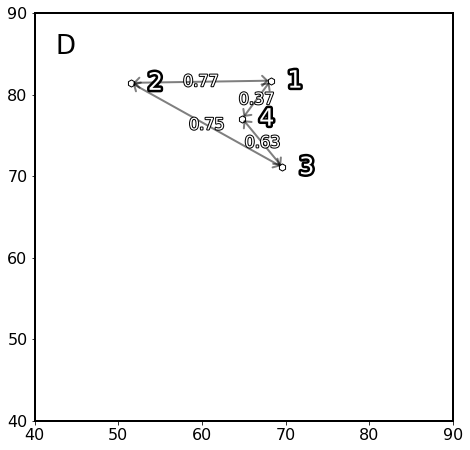

In [100]:
plt.close('all')
mpl.rcParams.update({'font.size': 16})
fig, ax = plt.subplots()#constrained_layout=True)
fig.set_size_inches(7.5, 7.5)
indices = np.load("indices.npy")
# starting angle
# ep.plotting.plot_angles(trajs, ax=ax)
txt = ax.text(0.05, 0.95, 'D', transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')

[k.set_linewidth(2) for k in ax.spines.values()]
ax.set_xlim(40, 90)
ax.set_ylim(40, 90)



indices_ = [0, 1, 4, 5]
colors = ['red', 'blue', 'green', 'yellow']
iter_ = 0
for i, color in zip(indices_, colors):
    ax.scatter(*trajs.lowd[indices[i]], s=50, c='w', marker='h', edgecolors='k')
    txt = ax.text(*trajs.lowd[indices[i]] + np.array([2, 0]), iter_ + 1, fontsize=24, color='w', va='center')
    txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
    
    arrowprops = dict(arrowstyle="<->, head_width=.1, head_length=.1", facecolor='k', alpha=0.5, lw=2)
    iter_ += 1
    xy_start = trajs.lowd[indices[i]]
    try:
        xy_end = trajs.lowd[indices[indices_[iter_]]]
        middle = xy_start + 0.5 * (xy_end - xy_start)
        ax.annotate('', xy=xy_start, xycoords='data', xytext=xy_end, textcoords='data', size=50, va='center', ha='center', arrowprops=arrowprops)
        _1 = md.load(f"inset_figure_{i}.pdb")
        _2 = md.load(f"inset_figure_{indices_[iter_]}.pdb")
        # calculate rmsd
        rmsd = np.round(md.rmsd(_1, _2)[0], 2)
        txt = ax.text(*middle, s=rmsd, color='w', ha='center', va='center')
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
    except IndexError:
        xy_end = trajs.lowd[indices[indices_[0]]]
        middle = xy_start + 0.5 * (xy_end - xy_start)
        ax.annotate('', xy=xy_start, xycoords='data', xytext=xy_end, textcoords='data', size=50, va='center', ha='center', arrowprops=arrowprops)
        _1 = md.load(f"inset_figure_{i}.pdb")
        _2 = md.load(f"inset_figure_{indices_[0]}.pdb")
        # calculate rmsd
        rmsd = np.round(md.rmsd(_1, _2)[0], 2)
        txt = ax.text(*middle, s=rmsd, color='w', ha='center', va='center')
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])

In [ ]:
arrowprops = dict(arrowstyle="->, head_width=.1, head_length=.1", facecolor='k', alpha=0.5, lw=1)
    iter_ += 1
    xy_start = trajs.lowd[indices[i]]
    xy_end = trajs.lowd[indices[indices_[iter_]]]
    middle = xy_start + np.linalg.norm(xy_end - xy_start)
    try:
        ax.annotate('', xy=xy_start, xycoords='data', xytext=xy_end, textcoords='data', size=50, va='center', ha='center', arrowprops=arrowprops)
    except IndexError:
        xy_end = trajs.lowd[indices[indices_[0]]]
        middle = xy_start + np.linalg.norm(xy_end - xy_start)
        ax.annotate('', xy=xy_start, xycoords='data', xytext=xy_end, textcoords='data', size=50, va='center', ha='center', arrowprops=arrowprops)
else:
    pass

# Clustering

## Remove all clusters under 50 points

In [ ]:
memberships = np.load("/home/kevin/projects/clustering/hdbscan_with_RMSD_cutoff/memberships_v2.npy")

In [ ]:
memberships = np.load("/home/kevin/projects/clustering/hdbscan_with_RMSD_cutoff/memberships_v2.npy")
uniques, counts = np.unique(memberships, return_counts=True)
keep = uniques[counts > 50]
keep = np.isin(memberships, keep)
memberships[~keep] = -1

uniques, counts = np.unique(memberships, return_counts=True)
assert np.all(counts > 50)

np.save("/home/kevin/projects/paper_2019/memberships_v2_small_clusters_removed.npy", memberships)

## Image of multimodal

Load the cluster membership and delete the -3 entries. These are the duplicates. The Info_all class should reassign them

In [18]:
len(np.unique(np.load("/home/kevin/projects/paper_2019/memberships_v2_small_clusters_removed.npy")))

710

In [29]:
# trajs.generate_pandas(boundary=150, overwrite=True)
memberships = np.load("/home/kevin/projects/paper_2019/memberships_v2_small_clusters_removed.npy")
memberships = memberships[memberships != -3]  # let duplicate reassignment be handled by Info_all
print(len(np.unique(memberships)[2:]))
trajs.generate_pandas(boundary=150)
trajs.set_cluster_membership(memberships)
assert 'cluster_membership' in trajs.df.keys(), print(trajs.df.keys())

707
Scaled 0 points. Finding (x,y) duplicates. This might take some time.
Setting data


Load the pickled list with further info

| 0         | 1           | 2                      | 3                      | 4                                                 | 5    | 6    | 7        | 8       | 9                                              |   |
|-----------|-------------|------------------------|------------------------|---------------------------------------------------|------|------|----------|-------------------------------------------------------|---|--|
| iteration | cluster_num | selected (True, False) | current min_clust_size | where the whole cluster comes from |where the rmsd calculations come from dataset | rmsd | dips | skewness | distances to the remaining x sructures in the cluster |   |

In [20]:
import pickle
import warnings
with open("/home/kevin/projects/clustering/hdbscan_with_RMSD_correction/info_all_v3.pickle", 'rb') as f:
    info_list = pickle.load(f)

In [21]:
len(info_list)

7704

Select a row that has been excluded due to multimodality

In [22]:
for i in range(30, 280):
    row = info_list[i]
    if row[2] == False and len(row[7]) > 1:
        break

/home/kevin/.conda/envs/py39_tf2/lib/python3.9/site-packages/pyemma/plots/plots2d.py:251: UserWarning: bins=25 is not an allowed optional parameter and will be ignored
  _warn(


483983
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within v

/tmp/ipykernel_1085963/895768751.py:157: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "tranparent" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig("new_outlier_removal.highq.png", dpi=600, tranparent=True)
/tmp/ipykernel_1085963/895768751.py:158: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "tranparent" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig("/home/kevin/projects/living_ppt/clustering/new_outlier_removal.highq.png", dpi=600, tranparent=True)
/tmp/ipykernel_1085963/895768751.py:159: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "tranparent" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig("new_outlier_removal.png", dpi=300, tranparent=True)
/tmp/ipykernel_1085963/895768751.py:160: MatplotlibDeprecationWarning: savefig() got unexpected key

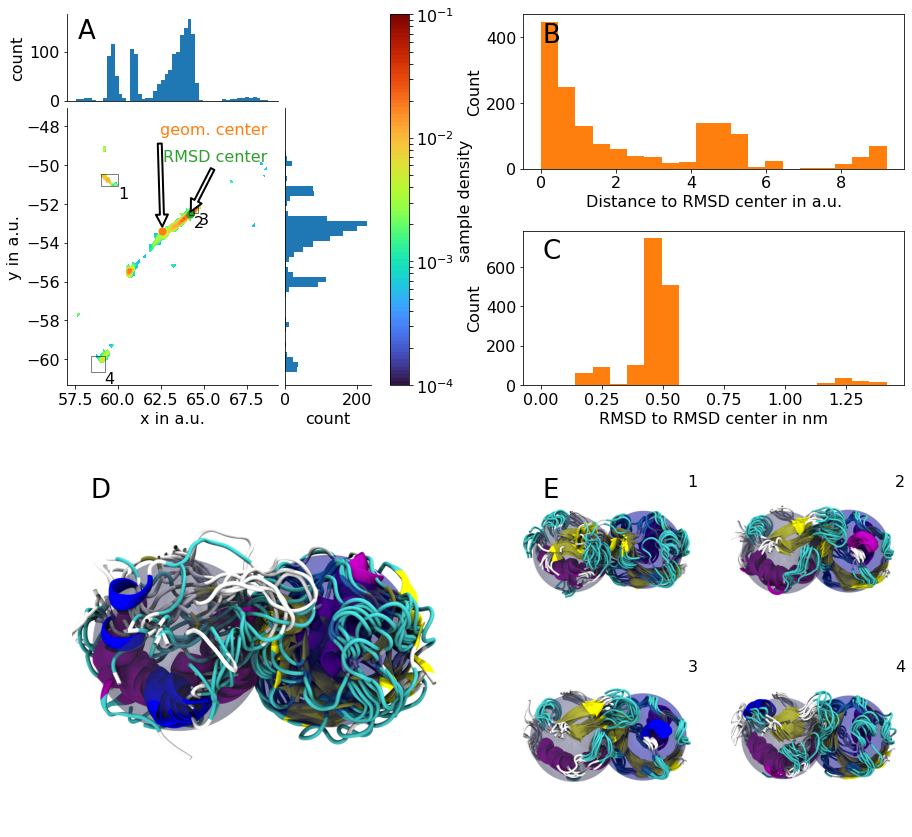

In [185]:
mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig = plt.figure(figsize=(15, 15))

# gridspec and subplot gridspec
gs = mpl.gridspec.GridSpec(nrows=2, ncols=2, wspace=0.2)
sub_gs = gs[0, 1].subgridspec(2, 1, hspace=0.4)
sub_gs2 = gs[1, 1].subgridspec(2, 2, hspace=0.0)

# main axes
ax1 = fig.add_subplot(gs[0, 0])
ax21 = fig.add_subplot(sub_gs[0, 0])
ax22 = fig.add_subplot(sub_gs[1, 0])
ax3 = fig.add_subplot(gs[1, 0])
ax41 = fig.add_subplot(sub_gs2[0, 0])
ax42= fig.add_subplot(sub_gs2[0, 1])
ax43 = fig.add_subplot(sub_gs2[1, 0])
ax44 = fig.add_subplot(sub_gs2[1, 1])
ax4 = fig.add_subplot(gs[1, 1])
ax4.axis('off')
txt = ax4.text(0.05, 0.95, 'E', transform=ax4.transAxes, fontsize=26, verticalalignment='top', color='k')
image_axes = [ax41, ax42, ax43, ax44]
for ax in image_axes:
    ax.axis('off')

# histogram axes
divider = make_axes_locatable(ax1)
axHistx = divider.append_axes("top", size=1.2, pad=0.1)#, sharex=ax1)
axHisty = divider.append_axes("right", size=1.2, pad=0.1)#, sharey=ax1)

# data to plot
df = trajs.df.copy()
data = df[['x', 'y']].values
where = row[4]
x = data[where,0]
y = data[where,1]

# density
fig, ax, misc = pyemma.plots.plot_density(x, y, ax=ax1, bins=25, cmap='turbo', logscale=True, cbar=True)

# nicen up density
spines = [k for k in ax1.spines.values()]
spines[3].set_linewidth(0)
spines[1].set_linewidth(0)
ax1.set_xlabel('x in a.u.')
ax1.set_ylabel('y in a.u.')
ax1.set_xticks(ax1.get_xticks()[:-1])

# x hist
spines = [k for k in axHistx.spines.values()]
spines[1].set_linewidth(0)
spines[3].set_linewidth(0)
axHistx.set_xticks([])
H, edges, patches = axHistx.hist(data[:,0][where], bins=50)
axHistx.set_ylabel('count')
txt = axHistx.text(0.05, 0.95, 'A', transform=axHistx.transAxes, fontsize=26, verticalalignment='top', color='k')

# y hist
spines = [k for k in axHisty.spines.values()]
spines[1].set_linewidth(0)
spines[3].set_linewidth(0)
axHisty.set_yticks([])
H, edges, patches = axHisty.hist(data[:,1][where], bins=50, orientation='horizontal')
axHisty.set_xlabel('count')

# annotate geometric center
centroid = [np.mean(x), np.mean(y)]
ax1.scatter(*centroid, s=50, c='C1')
ax1.annotate('geom. center',
            xy=centroid, xycoords='data',
            xytext=(0.95, 0.95), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', shrink=0.05, fc="w", ec="k", lw=2),
            horizontalalignment='right', verticalalignment='top', color='C1')

# annotate rmsd center
max_frames = 200
index = row[9].argmin()
idx = np.round(np.linspace(0, len(where) - 1, max_frames)).astype(int)
index = where[idx][index]
centroid_ = trajs.get_single_frame(index)

# assert np.array_equal(centroid.xyz[0,0], centroid_.xyz[0,0])
ax1.scatter(*trajs.lowd[index,:2], s=50, c='C2')
ax1.annotate('RMSD center',
            xy=trajs.lowd[index,:2], xycoords='data',
            xytext=(0.95, 0.85), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', shrink=0.05, fc="w", ec="k", lw=2),
            horizontalalignment='right', verticalalignment='top', color='C2')

# calculate distances between rmsd centroid and all other points
distances = scipy.spatial.distance.cdist(trajs.lowd[index,:2].reshape(1, 2), np.stack([x, y]).T)
H, edges, patches = ax21.hist(distances.flatten(), color='C1', bins=20)
txt = ax21.text(0.05, 0.95, 'B', transform=ax21.transAxes, fontsize=26, verticalalignment='top', color='k')
ax21.set_xlabel("Distance to RMSD center in a.u.")
ax21.set_ylabel("Count")

# do the same with rmsd distances
print(trajs.n_frames)
a = np.full(len(trajs.df), -1)
a[where] = 0
trajs.df['selfmade cluster membership'] = a
if 'dummy_traj_outlier' not in globals():
    _, dummy_traj_outlier = ep.clustering.gen_dummy_traj(trajs, cluster_no=0, col='selfmade cluster membership')
atom_indices = [a.index for a in dummy_traj_outlier.topology.atoms if a.element.symbol != 'H']
rmsds = md.rmsd(dummy_traj_outlier, dummy_traj_outlier, frame=row[9].argmin(), atom_indices=atom_indices)
H, edges, patches = ax22.hist(rmsds.flatten(), color='C1', bins=20)
txt = ax22.text(0.05, 0.95, 'C', transform=ax22.transAxes, fontsize=26, verticalalignment='top', color='k')
ax22.set_xlabel("RMSD to RMSD center in nm")
ax22.set_ylabel("Count")

# # test the unit of rmsd
# frames = dummy_traj_outlier[:2]
# rmsd = md.rmsd(frames, frames, 0, atom_indices=atom_indices)[1]
# frames[0].save_pdb('/tmp/one.pdb')
# frames[1].save_pdb('/tmp/two.pdb')

# from subprocess import Popen, PIPE

# p = Popen('echo -e "0\n0\n" | gmx rms -s /tmp/one.pdb -f /tmp/two.pdb -o /tmp/rms.xvg', stdin=PIPE, stdout=PIPE, stderr=PIPE, shell=True)
# output, err = p.communicate()
# rc = p.returncode
# with open('/tmp/rms.xvg') as f:
#     print(f.read())
# print(rmsd)

# find cluster_memberships inside this region
final_clusters = df.iloc[where]['cluster_membership'].unique()[1:]
for i, (ax, final_cluster) in enumerate(zip(image_axes, final_clusters)):
    xy = df[df['cluster_membership'] == final_cluster][['x', 'y']].values
    x_min = np.min(xy[:, 0])
    x_max = np.max(xy[:, 0])
    y_min = np.min(xy[:, 1])
    y_max = np.max(xy[:, 1])
    width = np.ptp(xy[:, 0])
    height = np.ptp(xy[:, 1])
    rect = mpl.patches.Rectangle((x_min, y_min), width, height, fc='none', lw=0.5, ec='k')
    ax1.add_patch(rect)
    ax1.annotate(i + 1, (x_max, y_min), ha='left', va='top')
    
    _, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_no=final_cluster, col='cluster_membership', max_frames=10)
    superposed = dummy_traj.superpose(ref, 0, atom_indices=dummy_traj.top.select('name CA'), ref_atom_indices=ref.top.select('name CA'))
    img = render_vmd_w_custom(superposed)
    ax.imshow(img)
    txt = ax.text(0.95, 0.95, i + 1, transform=ax.transAxes, fontsize=16, verticalalignment='top', color='k')
    
    if i == 3:
        break


img = render_vmd_w_custom(dummy_traj_outlier)
ax3.imshow(img)
ax3.axis('off')
txt = ax3.text(0.05, 0.95, 'D', transform=ax3.transAxes, fontsize=26, verticalalignment='top', color='k')

plt.savefig("new_outlier_removal.highq.png", dpi=600, tranparent=True)
plt.savefig("/home/kevin/projects/living_ppt/clustering/new_outlier_removal.highq.png", dpi=600, tranparent=True)
plt.savefig("new_outlier_removal.png", dpi=300, tranparent=True)
plt.savefig("/home/kevin/projects/living_ppt/clustering/new_outlier_removal.png", dpi=300, tranparent=True)
plt.savefig("new_outlier_removal.pdf")
plt.savefig("/home/kevin/projects/living_ppt/clustering/new_outlier_removal.pdf")

plt.show()

mpl.rcParams.update({'font.size': 10})

<ipython-input-28-69a9a3886b07>:69: UserWarning: Dummy image is loaded. Make sure to delete tmp.png in the final production.
  warnings.warn("Dummy image is loaded. Make sure to delete tmp.png in the final production.")


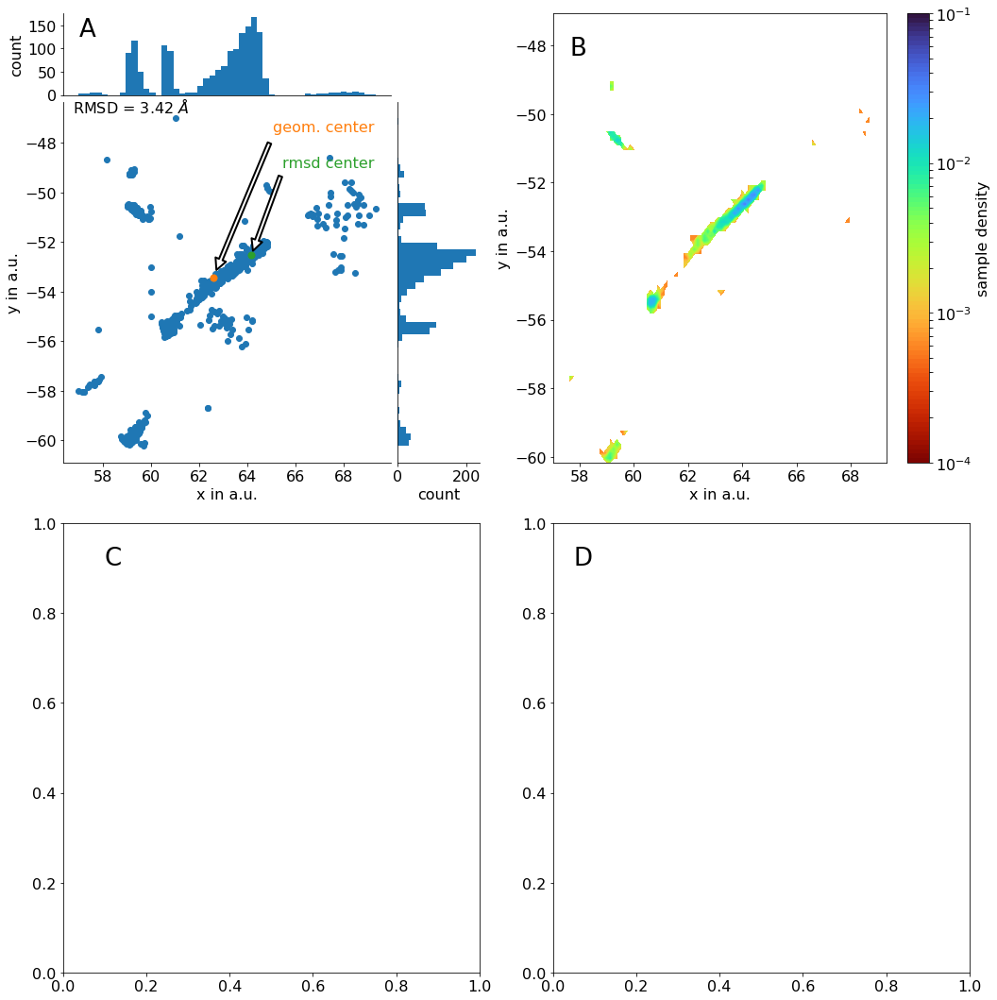

In [28]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

df = copy.deepcopy(trajs.df)

from turbo_colormap import turbo_colormap_data
cmap = mpl.colors.ListedColormap(turbo_colormap_data)

mpl.rcParams.update({'font.size': 16})

plt.close('all')
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2)
fig.set_size_inches(15,15)

# prepare ax1 to make the two side histograms
divider = make_axes_locatable(ax1)
axHistx = divider.append_axes("top", size=1.2, pad=0.1)#, sharex=ax1)
axHisty = divider.append_axes("right", size=1.2, pad=0.1)#, sharey=ax1)

# some data management
data = df[['x', 'y']].values
where = row[4]
x = data[where,0]
y = data[where,1]

# scatter data
ax1.scatter(x=data[where,0], y=data[where,1])
spines = [k for k in ax1.spines.values()]
spines[3].set_linewidth(0)
spines[1].set_linewidth(0)
ax1.set_xlabel('x in a.u.')
ax1.set_ylabel('y in a.u.')
ax1.set_xticks(ax1.get_xticks()[:-1])

# annotate rms
# rms = np.sqrt((1 / len(data[where])) * np.sum((data[where,0] - np.mean(data[where,0]))**2 + (data[where,1] - np.mean(data[where,1]))**2))
rmsd = np.mean(row[9]) * 10
text = f"RMSD = {rmsd:.2f}"
text += r" $\AA$"
ax1.text(0.03, 0.97, text, transform=ax1.transAxes)

# annotate geometric center
centroid = [np.mean(x), np.mean(y)]
ax1.scatter(*centroid, s=50, c='C1')
ax1.annotate('geom. center',
            xy=centroid, xycoords='data',
            xytext=(0.95, 0.95), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', shrink=0.05, fc="w", ec="k", lw=2),
            horizontalalignment='right', verticalalignment='top', color='C1')

# annotate rmsd center
max_frames = 200
index = row[9].argmin()
idx = np.round(np.linspace(0, len(where) - 1, max_frames)).astype(int)
index = where[idx][index]
centroid_ = trajs.get_single_frame(index)

# assert np.array_equal(centroid.xyz[0,0], centroid_.xyz[0,0])
            
ax1.scatter(*trajs.lowd[index,:2], s=50, c='C2')
ax1.annotate('rmsd center',
            xy=trajs.lowd[index,:2], xycoords='data',
            xytext=(0.95, 0.85), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', shrink=0.05, fc="w", ec="k", lw=2),
            horizontalalignment='right', verticalalignment='top', color='C2')

# make vmd snapshot
if os.path.isfile("tmp.png") and True:
    image = plt.imread("tmp.png")
    warnings.warn("Dummy image is loaded. Make sure to delete tmp.png in the final production.")
else:
    view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, where, shorten=True)
    
    # align to 
    H5_CA = dummy_traj.top.select("resid 76 to 151 and name CA")
    dummy_traj.superpose(md.load("inset_figure_0.pdb"), atom_indices=H5_CA, ref_atom_indices=H5_CA)
    
    # additional spheres
    frame = dummy_traj[0]
    central_Ub =(md.compute_center_of_mass(frame.atom_slice(frame.top.select("resid 0 to 75")))[0] * 10).tolist() + [12.0]
    central_H5 = (md.compute_center_of_mass(frame.atom_slice(frame.top.select("resid 76 to 151")))[0] * 10).tolist() + [12.0]
    additional_spheres = [central_H5, central_Ub]
            
    # save and render
    pdb_path = f"/home/kevin/projects/clustering/hdbscan_with_RMSD_correction/tmp.pdb"
    dummy_traj.save_pdb(pdb_path)
    image = ep.plotting.render_vmd(pdb_path, drawframes=True, renderer='tachyon', debug=False, scale=2, image_name='tmp.png')#, additional_spheres=additional_spheres)
# ax4.imshow(image)
# [k.set_linewidth(0) for k in ax4.spines.values()]
txt = ax4.text(0.05, 0.95, 'D', transform=ax4.transAxes, fontsize=26, verticalalignment='top', color='k')

# x hist
spines = [k for k in axHistx.spines.values()]
spines[1].set_linewidth(0)
spines[3].set_linewidth(0)
axHistx.set_xticks([])
H, edges, patches = axHistx.hist(data[:,0][where], bins=50)
axHistx.set_ylabel('count')
txt = axHistx.text(0.05, 0.95, 'A', transform=axHistx.transAxes, fontsize=26, verticalalignment='top', color='k')

# y hist
spines = [k for k in axHisty.spines.values()]
spines[1].set_linewidth(0)
spines[3].set_linewidth(0)
axHisty.set_yticks([])
H, edges, patches = axHisty.hist(data[:,1][where], bins=50, orientation='horizontal')
axHisty.set_xlabel('count')

# density
bin_density = 1
log_density = True

# hexbin density
fig, ax, misc = pyemma.plots.plot_density(x, y, ax=ax2, bins=25, cmap='turbo_r', logscale=True, cbar=True)

# cmap = plt.get_cmap('turbo').with_extremes(under='w')
# mappable = ax2.contourf(X, Y, H.T, cmap=cmap, levels=np.linspace(0.0001, H.max(), 50))
# mappable = ax2.hexbin(x=X.ravel(), y=Y.ravel(), C=F.T.ravel(), cmap=cmap, extent=extent)#, norm=mpl.colors.LogNorm())
ax2.set_xlabel("x in a.u.")
ax2.set_ylabel("y in a.u.")
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='k')

# calculate distances between rmsd centroid and all other points
# distances = scipy.spatial.distance.cdist(trajs.lowd[index,:2].reshape(1, 2), np.stack([x, y]).T)
# H, edges, patches = ax4.hist(distances.flatten(), color='C1', bins=20)
# ax4.set_xlabel("Distance to rmsd centroid in a.u.")
# ax4.set_ylabel("Count")
txt = ax3.text(0.1, 0.95, 'C', transform=ax3.transAxes, fontsize=26, verticalalignment='top', color='k')

plt.tight_layout()

# plt.savefig("outlier_removal.highq.png", dpi=600, tranparent=True)
# plt.savefig("/home/kevin/projects/living_ppt/clustering/outlier_removal.highq.png", dpi=600, tranparent=True)
# plt.savefig("outlier_removal.png", dpi=300, tranparent=True)
# plt.savefig("/home/kevin/projects/living_ppt/clustering/outlier_removal.png", dpi=300, tranparent=True)
# plt.savefig("outlier_removal.pdf")
# plt.savefig("/home/kevin/projects/living_ppt/clustering/outlier_removal.pdf")

mpl.rcParams.update({'font.size': 10})

## Test colormaps

In [47]:
from turbo_colormap import turbo_colormap_data

Text(0, 0.5, 'Number of points in 10^x')

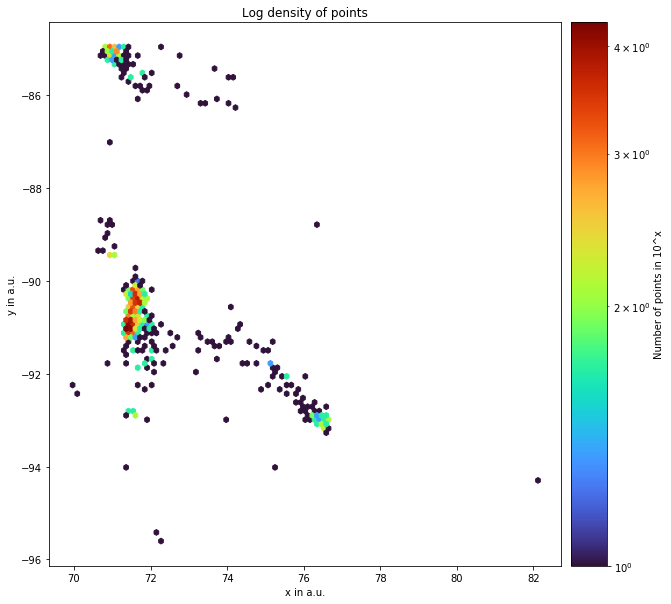

In [58]:
from turbo_colormap import turbo_colormap_data
cmap = mpl.colors.ListedColormap(turbo_colormap_data)

plt.close('all')

fig, ax = plt.subplots()
fig.set_size_inches(10, 10)

mappable = ax.hexbin(x=X.ravel(), y=Y.ravel(), C=F.T.ravel(), cmap=cmap, extent=extent, norm=mpl.colors.LogNorm())
ax.set_xlabel("x in a.u.")
ax.set_ylabel("y in a.u.")
ax.set_title("Log density of points")

# colorbar for ax
# colorbar
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
# initialize colormap
cb = plt.colorbar(mappable, cax=cax)
cax.set_ylabel("Number of points in 10^x")

## Finished clustering with example render

In [24]:
num_clustered = len(np.where(memberships >= 0)[0])
max_clusters = len(np.unique(memberships[memberships >= 0]))
percent = np.round(num_clustered / trajs.n_frames * 100, 3)
print(f"Total of {max_clusters} clusters. {num_clustered} points are in clusters. That is {percent} of the whole dataset")

Total of 707 clusters. 143223 points are in clusters. That is 29.593 of the whole dataset


Number of clusters with only oen traj in them

In [151]:
single_traj_clusters = 0
total_counts = 0
for cluster_num in np.unique(memberships[memberships >= 0]):
    where = np.where(memberships == cluster_num)[0]
    traj_nums, counts = np.unique(trajs.index_arr[where,0], return_counts=True)
    if len(traj_nums) == 1:
        total_counts += counts[0]
        single_traj_clusters += 1
percent = np.round(total_counts / num_clustered * 100, 3)
percent2 = np.round(total_counts / trajs.n_frames * 100, 3)
print(f"There are {single_traj_clusters} clusters which originate just from one traj. This represents {percent} of all clustered structures and {percent2} of all structures.")

There are 64 which originate just from one traj. This represents 4.464 of all clustered structures and 1.321 of all structures.


Find a cluster with mixed structures

In [155]:
mixed_clusters = []
found = False

for cluster_num in np.unique(memberships[memberships >= 0]):
    where = np.where(memberships == cluster_num)[0]
    names = np.unique(trajs.name_arr[where])
    names = [name if '1GHC' not in name else name.split('1GHC_')[1] for name in names]
    ubqs = np.unique([name.split('_')[0] for name in names])
    if len(ubqs) > 2:
        mixed_clusters.append(cluster_num)
    if len(ubqs) > 2 and cluster_num >= 75 and not found:
        print(f"This is a test. Cluster {cluster_num} contains {len(where)} structures from {len(names)} simulations. These simulations have these ubiquitination sites: {ubqs}")
        found = True
        
total_counts = sum([len(np.where(memberships == i)[0]) for i in mixed_clusters])
percent = np.round(total_counts / num_clustered * 100, 3)
percent2 = np.round(total_counts / trajs.n_frames * 100, 3)
print(f"There are {len(mixed_clusters)} clusters with at least 2 different isopeptides in them. That is {percent}% of all clustered structures. {percent2}% of all structures.")

This is a test. Cluster 106 contains 127 structures from 6 simulations. These simulations have these ubiquitination sites: ['K47' 'K51' 'K63']
There are 147 clusters with at least 2 different isopeptides in them. That is 20.049% of all clustered structures. 5.933% of all structures.


Check modality of cluster 43

Cluster 43 seems to be unimodal with the Unidip method. I don't think any further refinement would be needed.

In [ ]:
where = np.where(trajs.df['cluster_membership'].values == cluster_num)[0]
ax2.scatter(*trajs.lowd[where].T, alpha=0.0)

In [301]:
for row in info_list:
    if row[2] and row[1] - 1 == 43:
        print(row)
        break

[310, 44, True, 250, array([ 72209,  72212,  72213,  72217,  72220,  72221,  72222,  72227,
        72228,  72598,  72604,  72605,  72606,  72607,  72610,  75212,
        75215,  81084,  81085,  81094,  81095,  81096,  81097,  81098,
        81099,  81100,  81102,  81103,  81117,  81125,  81133,  81134,
        81137,  82198,  82667,  82669, 127920, 127929, 127930, 127931,
       127932, 127933, 127934, 127935, 127937, 127943, 127946, 127952,
       135447, 135603, 135604, 135605, 135606, 135607, 135608, 135609,
       135610, 135612, 135642, 296051, 296054, 296084, 296085, 296086,
       296089, 296091, 301310, 301321, 301333, 301344, 311957, 311958,
       311959, 311960, 311961, 311964, 311965, 311966, 311967, 311968,
       311971, 311972, 311973, 321499, 337126, 337130, 337133, 337230,
       337231, 345716, 345750, 345837, 345840, 345841, 345844, 345845,
       345846, 345850, 345851, 345853, 345865, 345934, 346160, 346162,
       346163, 346164, 346165, 346167, 346168, 346574, 3

In [313]:
test = row[4]
where = np.where(memberships == 43)[0]
print(test[:5], where[:20])

[72209 72212 72213 72217 72220] [72138 72141 72142 72146 72149 72150 72151 72156 72157 72527 72533 72534
 72535 72536 72539 75131 75134 81001 81002 81011]


This fits, because memberships is smaller than the dataset used to create row[4]. The steps in between the indices are the same.

### Make the image

In [27]:
trajs.df.keys()

Index(['traj_name', 'traj_num', 'traj_frame', 'frame_index', 'common_str',
       'x_orig', 'y_orig', 'traj_loc', 'traj_ref', 'x', 'y', 'dup_mask',
       'dup_of'],
      dtype='object')

<ipython-input-33-82372dd4332e>:88: UserWarning: Dummy image is loaded. Make sure to delete tmp_2.png in the final production.
  warnings.warn("Dummy image is loaded. Make sure to delete tmp_2.png in the final production.")


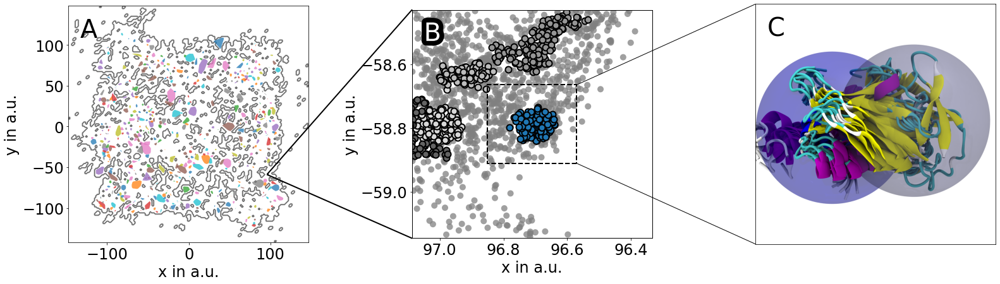

In [33]:
import warnings
import matplotlib.patheffects as PathEffects

mpl.rcParams.update({'font.size': 24})

plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, nrows=1)
fig.set_size_inches(22.5,7.5)

# get cluster colors
color_palette = sns.color_palette('Paired', trajs.df['cluster_membership'].values.max() + 1)
cluster_colors = np.array([(*color_palette[x], 1) if x >= 0 else (0.5, 0.5, 0.5, 0.75) for x in trajs.df['cluster_membership'].values])

# plot the complete clustering
ax1_bins = 200

H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=ax1_bins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)
for i in range(ax1_bins):
    for j in range(ax1_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
for i in range(1, ax1_bins - 1):
    for j in range(1, ax1_bins - 1):
        _ = (H[i-1, j] == 1 or H[i, j-1] == 1 or H[i-1, j-1] == 1 or H[i+1, j] == 1 or H[i, j+1] == 1 or H[i+1, j+1] == 1)
        if _:
            H_new[i, j] = 1
ax1.set_aspect('equal')
ax1.contour(X, Y, H_new.T, cmap=plt.cm.Greys, levels=2, zorder=1)
txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=40, verticalalignment='top', color='k')
ax1.set_xlabel('x in a.u.', fontsize=24)
ax1.set_ylabel('y in a.u.', fontsize=24)


plot_clusters_as = 'polygons'

if plot_clusters_as == 'polygons':
    cmap = plt.get_cmap('tab10')
    for cluster_num in range(trajs.df['cluster_membership'].to_numpy().max() + 1):
        where = np.where(trajs.df['cluster_membership'].to_numpy() == cluster_num)[0]
        if where.size == 0:
            continue
        hull = scipy.spatial.ConvexHull(trajs.lowd[where])
        fc = cmap(np.random.randint(0, cmap.N))
        poly = mpl.patches.Polygon(hull.points[hull.vertices], fc=fc, alpha=0.75)
        ax1.add_patch(poly)
elif plot_clusters_as == 'scatter':
    where = np.where(trajs.df['cluster_membership'].to_numpy() > 0)[0]
    ax1.scatter(*trajs.lowd[where,][::5].T, c=cluster_colors[where][::5], s=20, edgecolor='k', linewidths=.1, zorder=4)

# plot a certain cluster
cmap = plt.cm.tab20c
cmap_subsampled = [cmap(19), cmap(18), cmap(17), cmap(16)]
cluster_num = 106
where = np.where(trajs.df['cluster_membership'].values == cluster_num)[0]
ax2.scatter(*trajs.lowd[where].T, color='C0', s=100, zorder=4, edgecolor='k', linewidths=2)
xlim = np.array(ax2.get_xlim()) + np.array([-.3, .3])
ylim = np.array(ax2.get_ylim()) + np.array([-.3, .3])

ax2.set_xlim([xlim[1], xlim[0]])
ax2.set_ylim(ylim)
where = np.where(((trajs.lowd[:,0] >= xlim[0]) & (trajs.lowd[:,0] < xlim[1])) & ((trajs.lowd[:,1] >= ylim[0]) & (trajs.lowd[:,1] < ylim[1])))[0]
ax2.scatter(*trajs.lowd[where].T, color=(0.5, 0.5, 0.5, 0.75), edgecolors='none', s=100)
other_clusters = trajs.df['cluster_membership'].to_numpy()[where]

for i, c in zip([251, 252, 424, 748], cmap_subsampled):
    where = np.where(trajs.df['cluster_membership'].values == i)[0]
    ax2.scatter(*trajs.lowd[where].T, color=c, alpha=1, edgecolor='k', linewidths=2, s=100)
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=40, verticalalignment='top', color='w')
txt.set_path_effects([PathEffects.withStroke(linewidth=15, foreground='k')])

# zooming box
ep.plotting.plotting._zoomingBoxManual(ax1, ax2, roiKwargs={'color': 'black'}, arrowKwargs={'color': 'black'})
ax2.set_xlabel('x in a.u.', fontsize=24)
ax2.set_ylabel('y in a.u.', fontsize=24)
ax2.set_aspect('equal')
[k.set_linewidth(1) for k in ax2.spines.values()]


# make vmd snapshot
# if os.path.isfile("tmp_2.png"):
#     os.remove("tmp_2.png")
if os.path.isfile("tmp_2.png"):
    image = plt.imread("tmp_2.png")
    warnings.warn("Dummy image is loaded. Make sure to delete tmp_2.png in the final production.")
else:
    view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_num, shorten=True)
    
    # align to 
    H5_CA = dummy_traj.top.select("resid 76 to 151 and name CA")
    dummy_traj.superpose(md.load("inset_figure_0.pdb"), atom_indices=H5_CA, ref_atom_indices=H5_CA)
    
    # additional spheres
    frame = dummy_traj[0]
    central_Ub =(md.compute_center_of_mass(frame.atom_slice(frame.top.select("resid 0 to 75")))[0] * 10).tolist() + [16.0]
    central_H5 = (md.compute_center_of_mass(frame.atom_slice(frame.top.select("resid 76 to 151")))[0] * 10).tolist() + [16.0]
    additional_spheres = [central_H5, central_Ub]
            
    # save and render
    pdb_path = f"/home/kevin/projects/clustering/hdbscan_with_RMSD_correction/tmp_2.pdb"
    dummy_traj.save_pdb(pdb_path)
    image = ep.plotting.render_vmd(pdb_path, drawframes=True, renderer='tachyon', debug=False, scale=2, image_name='tmp_2.png', additional_spheres=additional_spheres)
    
# another zooming box
where = np.where(trajs.df['cluster_membership'].values == cluster_num)[0]
adjust = 0.07
limits = np.array([trajs.lowd[where,0].min(), trajs.lowd[where,1].min(), np.ptp(trajs.lowd[where,0]), np.ptp(trajs.lowd[where,1])])
limits[0] -= adjust
limits[1] -= adjust
limits[2] += 2 * adjust
limits[3] += 2 * adjust

roiKwargs = dict([('fill',False), ('linestyle','dashed'), ('color','k'), ('linewidth',2)])
rect = mpl.patches.Rectangle(limits[:2], limits[2], limits[3], **roiKwargs)
ax2.add_patch(rect)

con = mpl.patches.ConnectionPatch(xyA=(rect.get_x(), rect.get_y()), xyB=[0,0], coordsA='data', coordsB='axes fraction', axesA=ax2, axesB=ax3)
con.set_color([0, 0, 0])
ax2.add_artist(con)

con = mpl.patches.ConnectionPatch(xyA=(rect.get_x(), rect.get_y() + rect.get_height()), xyB=[0,1], coordsA='data', coordsB='axes fraction', axesA=ax2, axesB=ax3)
con.set_color([0, 0, 0])
ax2.add_artist(con)
    
ax3.imshow(image)
ax3.set_xticks([])
ax3.set_yticks([])
txt = ax3.text(0.05, 0.95, 'C', transform=ax3.transAxes, fontsize=40, verticalalignment='top', color='k')

plt.tight_layout()

img_name = 'finished_cluster_example'
living_ppt_dir = 'clustering'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")

In [221]:
test = trajs.basenames[:10]

In [237]:
text = ''

for i, bs in enumerate(test):
    if i % 2 == 0:
        text += '{:<40}  {}\n'.format(bs, test[i + 1])

print(text)

1GHC_K30_-100_20000                       1GHC_K30_-120_20000
1GHC_K30_-140_11200                       1GHC_K30_-140_11200_20000
1GHC_K30_-140_11200_20000_20000           1GHC_K30_-160_1100
1GHC_K30_-160_1700                        1GHC_K30_-160_1700_20000
1GHC_K30_-160_1700_20000_20000            1GHC_K30_-160_1700_20000_20000_20000



## Better clustering image

### Find clusters in region

In [342]:
xlim = [-50, 0]
ylim = [0, 50]

where = np.where(((trajs.lowd[:,0] >= xlim[0]) & (trajs.lowd[:,0] < xlim[1])) & ((trajs.lowd[:,1] >= ylim[0]) & (trajs.lowd[:,1] < ylim[1])))[0]
uniques, counts = np.unique(trajs.df['cluster_membership'][where], return_counts=True)
uniques = uniques[1:]

basedir = '/home/kevin/projects/living_ppt/clustering_inset_figures'
os.makedirs(basedir, exist_ok=True)

clusters = []
RMSDs = []
for i, cluster_num in enumerate(uniques):
    if i == 0:
        view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_num, superpose=True, shorten=True, stack_atoms=False, align_string='name CA')
        superpose = copy.deepcopy(dummy_traj)
    else:
        view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_num, superpose=superpose, shorten=True, stack_atoms=False, align_string='name CA')
    clusters.append(dummy_traj)
    RMSDs.append(np.mean(md.rmsd(dummy_traj, dummy_traj[0])))
    
RMSDs = np.array(RMSDs)
inds = np.argsort(RMSDs)[:11]
print(RMSDs[inds])

for ind in inds:
    cluster_num = uniques[ind]
    dummy_traj = clusters[ind]
    dummy_traj.save_pdb(os.path.join(basedir, f'cluster_{cluster_num}.pdb'))
    
cluster_nums = uniques[inds]
inset_clusters = cluster_nums[1:]
zoomed_cluster = cluster_nums[0]

Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
Provided alignment string results in 151 atoms. Fi

In [29]:
cluster_nums

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


array([406, 100, 196, 707, 215, 419, 206])

### Find a cluster with mixed topologies

In [218]:
xlim = [-50, 0]
ylim = [0, 50]

import pprint

where = np.where(((trajs.lowd[:,0] >= xlim[0]) & (trajs.lowd[:,0] < xlim[1])) & ((trajs.lowd[:,1] >= ylim[0]) & (trajs.lowd[:,1] < ylim[1])))[0]
uniques, counts = np.unique(trajs.df['cluster_membership'][where], return_counts=True)
uniques = uniques[1:]
counts = counts[1:]

def decide_ubq_site(basename):
    if '1GHC' in basename:
        return basename.split('_')[1]
    else:
        return basename.split('_')[0]

cluster_tops = {}
for cluster_num in uniques:
    where = np.where(trajs.df['cluster_membership'] == cluster_num)[0]
    names = list(set(trajs.name_arr[where]))
    names = set(list(map(decide_ubq_site, names)))
    names = ' '.join(list(names))
    cluster_tops[str(cluster_num)] = names
# pprint.pprint(cluster_tops)
# cluster 8 does mostly contain K63, search for other clusters
# cluster 239 contains similar parts K30 and K47
# cluster_num = max(cluster_tops, key=cluster_tops.get) # this returns cluster 8, but other clusters might be better for visualization purposes
cluster_num = '239'
print(cluster_num, cluster_tops[cluster_num], counts[uniques == int(cluster_num)])
print(pd.value_counts(trajs.name_arr[trajs.df['cluster_membership'] == int(cluster_num)]))
cluster_num = int(cluster_num)


view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_num, superpose=superpose, shorten=True, stack_atoms=False, align_string='name CA')
basedir = '/home/kevin/projects/living_ppt/clustering_inset_figures'
dummy_traj.save_pdb(os.path.join(basedir, f'cluster_{cluster_num}.pdb'))

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


239 K47 K30 [175]
K30_180                   78
K47_-20_12350             59
K47_100_7150              10
K47_100_7150_6150         10
1GHC_K30_0_3200            6
K47_100_4250               4
K47_100_7150_6150_1600     4
K47_-140_12600             2
K47_120_20000_3100         2
dtype: int64
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.


### Plot with inset figures

In [110]:
cm = mpl.cm.get_cmap('bone')
linspace = np.linspace(0.25, 0.75, 34)
print(cm(linspace))
print(linspace)

[[0.21960784 0.21960776 0.30554135 1.        ]
 [0.22990196 0.22990187 0.3198636  1.        ]
 [0.24362745 0.24362736 0.33895993 1.        ]
 [0.25735294 0.25735284 0.35805627 1.        ]
 [0.27107843 0.27107833 0.3771526  1.        ]
 [0.28480392 0.28480381 0.39624893 1.        ]
 [0.29852941 0.29852929 0.41534527 1.        ]
 [0.3122549  0.31225478 0.4344416  1.        ]
 [0.32598039 0.32843137 0.45098027 1.        ]
 [0.33627451 0.34258578 0.46127439 1.        ]
 [0.35       0.36145832 0.47499988 1.        ]
 [0.36372549 0.38033087 0.48872538 1.        ]
 [0.37745098 0.39920341 0.50245087 1.        ]
 [0.39117647 0.41807596 0.51617636 1.        ]
 [0.40490196 0.4369485  0.52990186 1.        ]
 [0.41862745 0.45582105 0.54362735 1.        ]
 [0.43235294 0.4746936  0.55735284 1.        ]
 [0.44264706 0.48884801 0.56764696 1.        ]
 [0.45637255 0.50772055 0.58137245 1.        ]
 [0.47009804 0.5265931  0.59509795 1.        ]
 [0.48382353 0.54546564 0.60882344 1.        ]
 [0.49754902 

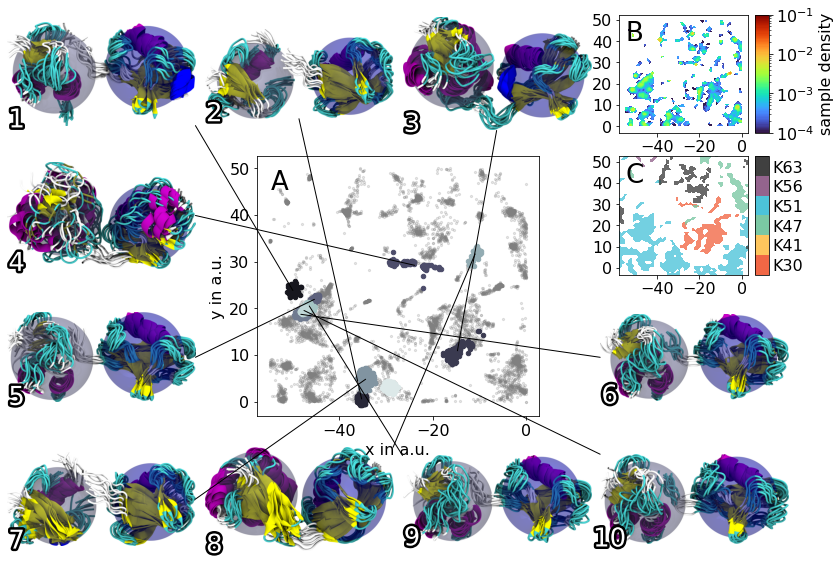

In [362]:
import matplotlib.patheffects as PathEffects
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pyemma

mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig = plt.figure(constrained_layout=False, figsize=(14, 10))
gs = mpl.gridspec.GridSpec(ncols=4, nrows=4, figure=fig, wspace=0.05)

# create figure axes
fax1 = fig.add_subplot(gs[0, 0])
fax2 = fig.add_subplot(gs[0, 1])
fax3 = fig.add_subplot(gs[0, 2])
fax4 = fig.add_subplot(gs[1, 0])
fax5 = fig.add_subplot(gs[2, 0])
fax6 = fig.add_subplot(gs[2, 3])
fax7 = fig.add_subplot(gs[3, 0])
fax8 = fig.add_subplot(gs[3, 1])
fax9 = fig.add_subplot(gs[3, 2])
fax10 = fig.add_subplot(gs[3, 3])
figure_axes = [fax1, fax2, fax3, fax4, fax5, fax6, fax7, fax8, fax9, fax10]

# create plotting axes
free_energy_axis = fig.add_subplot(gs[0, 3], aspect='equal')
ubq_site_zoomed_axis = fig.add_subplot(gs[1, 3], aspect='equal')
scatter_axis = fig.add_subplot(gs[1:3, 1:3], aspect='equal')
# zoomed_cluster_axis = fig.add_subplot(gs[1:, 3:])
# zoomed_density_axis = zoomed_cluster_axis.inset_axes([0, 0.75, 0.25, 0.25])
# zoomed_scatter_axis = zoomed_cluster_axis.inset_axes([0.75, 0, 0.25, 0.25])


for (ax, lbl) in zip([scatter_axis, ubq_site_zoomed_axis], ['A', 'C']):
    txt = ax.text(0.05, 0.95, lbl, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')

def decide_ubq_site(basename):
    if '1GHC' in basename:
        return int(basename.split('_')[1])
    else:
        return int(basename.split('_')[0])
# full_ubq_sites = np.array(list(map()))

# zoomed scatter
# where = np.where(trajs.df['cluster_membership'].values == zoomed_cluster)[0]
# zoomed_scatter_axis.scatter(*trajs.lowd[where].T, c='C0', s=100, zorder=4, edgecolor='k', linewidths=2)
# xlim = np.array(zoomed_scatter_axis.get_xlim()) + np.array([-5, 5])
# ylim = np.array(zoomed_scatter_axis.get_ylim()) + np.array([-5, 5])

# zoomed_scatter_axis.set_xlim(xlim)
# zoomed_scatter_axis.set_ylim(ylim)
# where = np.where(((trajs.lowd[:,0] >= xlim[0]) & (trajs.lowd[:,0] < xlim[1])) & ((trajs.lowd[:,1] >= ylim[0]) & (trajs.lowd[:,1] < ylim[1])))[0]
# zoomed_scatter_axis.scatter(*trajs.lowd[where].T, c=(0.5, 0.5, 0.5, 0.3), edgecolors='none', s=100)

# remove unwanted stuff from figure axes
for i, fax in enumerate(figure_axes):
    fax.axis('off')
    
# what segment of complete map to use to visualize clustering
xlim = [-55, 0]
ylim = [0, 50]

# get the xy points to be plotted
lowd_limits, index = ep.plotting.plotting._exclude_points(trajs.lowd, [[-14, -12, -94, -92], [42, 42.75, -61.5, -60.5]], return_index=True)
lowd_limits = np.stack(lowd_limits).T
cluster_membership = trajs.df['cluster_membership'].values[~ index]
where = np.where(((lowd_limits[:,0] >= xlim[0]) & (lowd_limits[:,0] < xlim[1])) & ((lowd_limits[:,1] >= ylim[0]) & (lowd_limits[:,1] < ylim[1])))[0]
x, y = lowd_limits[where].T
cluster_membership = cluster_membership[where]

scatter_axis.scatter(x, y, c='grey', alpha=0.2, s=5)
scatter_axis.set_xlabel('x in a.u.', fontsize=16)
scatter_axis.set_ylabel('y in a.u.', fontsize=16)

to_plot = 'selected'
if to_plot == 'all':
    no_of_clusters = len(np.unique(cluster_membership[cluster_membership >= 0]))
    linspace = np.linspace(0.1, 0.9, no_of_clusters)
    cm = mpl.cm.get_cmap('bone')
    for cluster_num, color in zip(np.unique(cluster_membership), cm(linspace)):
        if cluster_num < 0:
            continue
        scatter_axis.scatter(*trajs.df[trajs.df['cluster_membership'] == cluster_num][['x', 'y']].values.T, color=color, s=20)
        
elif to_plot == 'selected':
    no_of_clusters = len(cluster_nums)
    linspace = np.linspace(0.1, 0.9, no_of_clusters)
    cm = mpl.cm.get_cmap('bone')
    for i, (cluster_num, color) in enumerate(zip(cluster_nums, cm(linspace))):
        if i == 3:
            cluster_num = 239
        scatter_axis.scatter(*trajs.df[trajs.df['cluster_membership'] == cluster_num][['x', 'y']].values.T, color=color, s=20)


# ubiquitylation site
color_to_hex = lambda x: str(hex(x))[-2:].upper()
common_str = trajs.common_str
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
n_bins = 250
for cs, color in zip(trajs.common_str, colors):
    index = [cs in name for name in trajs.name_arr]

    H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=n_bins)

    xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
    ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
    X, Y = np.meshgrid(xcenters, ycenters)
    
    # map values of H to colors
    min_ = 200; max_ = 255
    H_ = np.interp(H, (H.min(), H.max()), (min_, max_)).astype(int)
    levels = np.unique(H_)
    mapping = {k: v + 1 for v, k in enumerate(levels)}
    H_new = np.vectorize(mapping.get)(H_)
    H_new[H == 0] = 0
    colors_ = [f"{color}{color_to_hex(i)}" for i in levels]

    cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', colors_)
    cmap.set_bad('w', alpha=0)
    H_new = np.ma.masked_where(H_new == 0, H_new)
    ubq_site_zoomed_axis.contourf(X, Y, H_new.T, cmap=cmap, zorder=-1)

# colormap
divider = make_axes_locatable(ubq_site_zoomed_axis)
ubq_site_axis_cax = divider.append_axes("right", size=0.2, pad=0.1)#, sharey=ax1)
colors_rgba = [mpl.colors.hex2color(color) for color in colors]
cm = mpl.colors.LinearSegmentedColormap.from_list('name', colors_rgba, N=len(common_str))
norm = mpl.colors.Normalize(vmin=0, vmax=len(common_str))
norm = mpl.colors.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
cmap_ticks = np.linspace(0, 1, len(common_str) + 1)[:-1] + 1.0/(len(common_str) * 2)
cb = plt.colorbar(sm, cax=ubq_site_axis_cax, ticks=cmap_ticks)
yticklabels = cb.ax.set_yticklabels(common_str, fontsize=16)
cb.ax.tick_params(axis="y",direction="out", length=0)

# density
fig, ax, misc = pyemma.plots.plot_density(x, y, ax=free_energy_axis, cmap='turbo', logscale=True, cbar=False, nbins=75)
txt = free_energy_axis.text(0.05, 0.95, 'B', transform=free_energy_axis.transAxes, fontsize=26, verticalalignment='top', color='k')

divider = make_axes_locatable(free_energy_axis)
ubq_site_axis_cax = divider.append_axes("right", size=0.2, pad=0.1)#, sharey=ax1)
sm = misc['mappable']
cmap_ticks = [10**i for i in range(-4, 0)]
cb = plt.colorbar(sm, cax=ubq_site_axis_cax, ticks=cmap_ticks)
ubq_site_axis_cax.set_ylabel('sample density')

def crop_image(img):
    mask = ~ np.all(img == 1, 2)
    coords = np.argwhere(mask)
    
    # bounding box of non-white pixels
    x0, y0 = coords.min(axis=0)
    x1, y1 = coords.max(axis=0) + 1
    
    cropped = img[x0:x1, y0:y1]
    return cropped


# connection patches for clusters
B_locations = [[1, 0], [0.5, 0], [0.5, 0], [1, 0.5], [1, 0.5], [0, 0.5], [1, 0.5], [1, 1], [0, 1], [0, 1], [0, 1]]
for i, (fax, cluster_num, B_loc) in enumerate(zip(figure_axes, cluster_nums, B_locations)):
    txt = fax.text(0.05, 0.05, i + 1, transform=fax.transAxes, fontsize=26, va='center', ha='center', color='w')
    txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
    if i == 3:
        cluster_num = 239
    where = np.where(trajs.df['cluster_membership'] == cluster_num)
    center = np.mean(trajs.lowd[where], axis=0)
    con = mpl.patches.ConnectionPatch(xyA=center, xyB=B_loc, coordsA='data', coordsB='axes fraction', axesA=scatter_axis, axesB=fax)
    con.set_color([0, 0, 0])
    scatter_axis.add_artist(con)
    imfile = os.path.join(basedir, f'new_cluster_{cluster_num}.png')
    if not os.path.exists(imfile):
        _, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_num)
        im = render_vmd_w_custom(dummy_traj, image_name=imfile, scale_by=2)
    else:
        im = plt.imread(imfile)
    fax.imshow(crop_image(im))
    
free_energy_axis.set_xticks([-60., -40., -20.,   0.,  20.])
free_energy_axis.set_yticks(scatter_axis.get_yticks())
free_energy_axis.set_xlim(scatter_axis.get_xlim())
free_energy_axis.set_ylim(scatter_axis.get_ylim())
ubq_site_zoomed_axis.set_xticks([-60., -40., -20.,   0.,  20.])
ubq_site_zoomed_axis.set_yticks(scatter_axis.get_yticks())
ubq_site_zoomed_axis.set_xlim(scatter_axis.get_xlim())
ubq_site_zoomed_axis.set_ylim(scatter_axis.get_ylim())
    
img_name = 'new_finished_cluster_example'
living_ppt_dir = 'clustering'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=False)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=False)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=False)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=False)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")

plt.show()


In [364]:
import PIL

def crop_image(img):
    mask = ~ np.all(img == 1, 2)
    coords = np.argwhere(mask)
    
    # bounding box of non-white pixels
    x0, y0 = coords.min(axis=0)
    x1, y1 = coords.max(axis=0) + 1
    
    cropped = img[x0:x1, y0:y1]
    return cropped

img_name = 'new_finished_cluster_example'
living_ppt_dir = 'clustering'
imagefile = f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png"
mpl_data = plt.imread(imagefile)
im_data = (crop_image(plt.imread(imagefile)) * 255).astype(np.uint8)
assert mpl_data.size < im_data.size

img = PIL.Image.fromarray(im_data)
img.save(imagefile.replace('.png', '_cropped.png'))

AssertionError: 

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.


<ipython-input-87-25f0c5ec1d4f>:128: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.tight_layout()


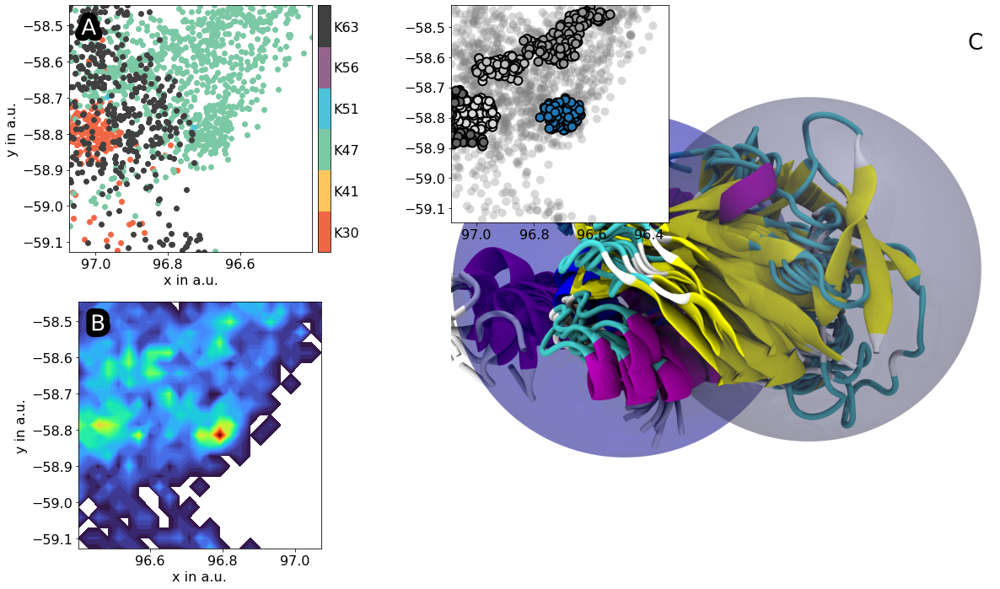

In [87]:
import warnings

mpl.rcParams.update({'font.size': 16})

plt.close('all')

cluster_num = 106
view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_num, superpose=True, shorten=True, stack_atoms=False, align_string='name CA')
dummy_traj.save(f'/home/kevin/projects/living_ppt/clustering_inset_figures/cluster_{cluster_num}.pdb')

fig = plt.figure(constrained_layout=True, figsize=(18, 10))
gs = mpl.gridspec.GridSpec(ncols=3, nrows=2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0], aspect='equal', sharex=ax2, sharey=ax2)
ax2 = fig.add_subplot(gs[1, 0], aspect='equal')
ax3 = fig.add_subplot(gs[:, 1:])
ax3.axis('off')
# ax3 = fig.add_subplot(gs[1, 0])
# ax4 = fig.add_subplot(gs[1, 1])

# texts
for (ax, lbl) in zip([ax1, ax2, ax3], ['A', 'B', 'C']):
    if lbl == 'C':
        txt = ax.text(0.95, 0.95, lbl, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')
    if lbl == 'B' or lbl == 'A':
        txt = ax.text(0.05, 0.95, lbl, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='w')
        txt.set_path_effects([PathEffects.withStroke(linewidth=15, foreground='k')])

# inset scatter
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# axins = inset_axes(ax3, width=2, height=1.5, loc=2, bbox_to_anchor=(.15, -.5, 2, 1.5), bbox_transform=ax3.transAxes)
axins = ax3.inset_axes((0, 0.6, 0.4, 0.4))
where = np.where(trajs.df['cluster_membership'].values == cluster_num)[0]
axins.scatter(*trajs.lowd[where].T, c='C0', s=100, zorder=4, edgecolor='k', linewidths=2)
xlim = np.array(axins.get_xlim()) + np.array([-.3, .3])
ylim = np.array(axins.get_ylim()) + np.array([-.3, .3])

axins.set_xlim([xlim[1], xlim[0]])
axins.set_ylim(ylim)
inside = ((trajs.lowd[:,0] >= xlim[0]) & (trajs.lowd[:,0] < xlim[1])) & ((trajs.lowd[:,1] >= ylim[0]) & (trajs.lowd[:,1] < ylim[1]))
where = np.where(inside)[0]
axins.scatter(*trajs.lowd[where].T, c=(0.5, 0.5, 0.5, 0.3), edgecolors='none', s=100)

# remaining clusters
cmap = plt.cm.tab20c
cmap_subsampled = [cmap(19), cmap(18), cmap(17), cmap(16)]
for i, c in zip([251, 252, 424, 748], cmap_subsampled):
    where = np.where(trajs.df['cluster_membership'].values == i)[0]
    axins.scatter(*trajs.lowd[where].T, c=np.full((len(trajs.lowd[where]), 4), c), alpha=1, edgecolor='k', linewidths=2, s=100)

# density config
where = np.where(inside)[0]
bin_density = 1
log_density = True
x, y = trajs.lowd[where].T

# hexbin density
H, xedges, yedges = np.histogram2d(x=x, y=y, bins=25)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]] 
xcenters = np.mean(np.vstack([xedges[0:-1],xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1],yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
if log_density:
    with np.errstate(divide = 'ignore'): # ignore division by zero error
        F = np.log(H)
else:
    F = H

cmap = plt.get_cmap('turbo')#.with_extremes(under='w')
mappable = ax2.contourf(np.flip(X), Y, H.T, cmap=cmap, levels=np.linspace(0.0001, H.max(), 50))
# mappable = ax2.hexbin(x=X.ravel(), y=Y.ravel(), C=F.T.ravel(), cmap=cmap, extent=extent)#, norm=mpl.colors.LogNorm())
ax2.set_xlabel("x in a.u.")
ax2.set_ylabel("y in a.u.")


# ubiquitylation site
color_to_hex = lambda x: str(hex(x))[-2:].upper()
common_str = trajs.common_str
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
for cs, color in zip(trajs.common_str, colors):
    # inside = ((trajs.lowd[:,0] >= ax2.get_xlim()[0]) & (trajs.lowd[:,0] < ax2.get_xlim()[1])) & ((trajs.lowd[:,1] >= ax2.get_ylim()[0]) & (trajs.lowd[:,1] < ax2.get_ylim()[1]))
    index = np.array([cs in name for name in trajs.name_arr])
    # index = np.logical_and(index, inside)
    ax1.scatter(*trajs.lowd[index,].T, c=color)
ax1.set_xlim(np.flip(np.array(ax2.get_xlim())))
ax1.set_ylim(ax2.get_ylim())
ax1.set_xlabel('x in a.u.', fontsize=16)
ax1.set_ylabel('y in a.u.', fontsize=16)

# colormap
divider = make_axes_locatable(ax1)
ubq_site_axis_cax = divider.append_axes("right", size=0.2, pad=0.1)#, sharey=ax1)
colors_rgba = [mpl.colors.hex2color(color) for color in colors]
cm = mpl.colors.LinearSegmentedColormap.from_list('name', colors_rgba, N=len(common_str))
norm = mpl.colors.Normalize(vmin=0, vmax=len(common_str))
norm = mpl.colors.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
cmap_ticks = np.linspace(0, 1, len(common_str) + 1)[:-1] + 1.0/(len(common_str) * 2)
cb = plt.colorbar(sm, cax=ubq_site_axis_cax, ticks=cmap_ticks)
yticklabels = cb.ax.set_yticklabels(common_str, fontsize=16)
cb.ax.tick_params(axis="y",direction="out", length=0)

override = True
if os.path.isfile("tmp_2.png") and not override:
    image = plt.imread("tmp_2.png")
    warnings.warn("Dummy image is loaded. Make sure to delete tmp_2.png in the final production.")
else:
    view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_num, shorten=True)
    
    # align to 
    CA = dummy_traj.top.select("name CA")
    dummy_traj.superpose(md.load("inset_figure_0.pdb"), atom_indices=CA, ref_atom_indices=CA)
    
    # additional spheres
    frame = dummy_traj[0]
    central_Ub =(md.compute_center_of_mass(frame.atom_slice(frame.top.select("resid 0 to 75")))[0] * 10).tolist() + [16.0]
    central_H5 = (md.compute_center_of_mass(frame.atom_slice(frame.top.select("resid 76 to 151")))[0] * 10).tolist() + [16.0]
    additional_spheres = [central_H5, central_Ub]
            
    # save and render
    pdb_path = f"/home/kevin/projects/clustering/hdbscan_with_RMSD_correction/tmp_2.pdb"
    dummy_traj.save_pdb(pdb_path)
    # image = ep.plotting.render_vmd(pdb_path, drawframes=True, renderer='tachyon', debug=False, scale=2, image_name='tmp_2.png', additional_spheres=additional_spheres)
ax3.imshow(image)


plt.tight_layout()

# Which is the most mobile residue

In [144]:
res_indices = [106, 41+76, 47+76, 51+76, 56+76, 63+76]
res_CA_indices = []
positions = []
ref = trajs[0].traj[0]
ref_CA = ref.top.select('name CA')

for r_ind in res_indices:
    i = ref.top.select(f'residue {r_ind} and name CA')
    res_CA_indices.append(i)
    print(ref.top.atom(i[0]))
    
for i, traj in enumerate(trajs):
    superposed = traj.traj.superpose(reference=ref, atom_indices=traj.select('name CA'), ref_atom_indices=ref_CA)
    pos = superposed.xyz[:,res_CA_indices]
    positions.append(pos)
        
positions = np.vstack(positions)
positions = np.reshape(positions, (len(positions), 6, 3))
np.save("CA_positions_of_lys_residues.npy", positions)

for i, r_ind in enumerate(res_indices):
    ind = ref.top.select(f'residue {r_ind} and name CA')
    var = np.mean(np.var(positions[:,i], axis=0))
    print(ref.top.atom(ind[0]), var)

LYQ106-CA
LYS117-CA
LYS123-CA
LYS127-CA
LYS132-CA
LYS139-CA
LYQ106-CA 0.2913859
LYS117-CA 0.57625264
LYS123-CA 0.2635554
LYS127-CA 0.3107319
LYS132-CA 0.543894
LYS139-CA 0.65277094


(483983, 6, 3)


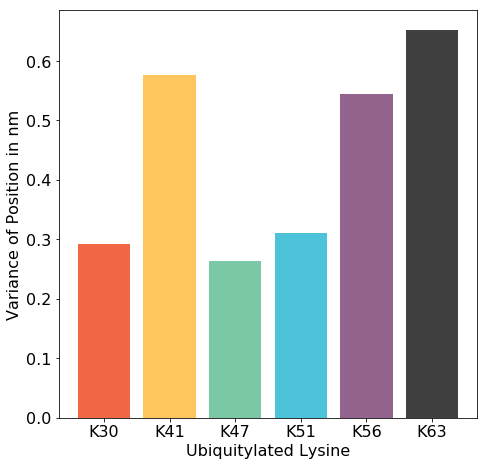

In [155]:
positions = np.load("CA_positions_of_lys_residues.npy")
ubqs = ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
print(positions.shape)
bar_heights = []
for i in range(6):
    var = np.mean(np.var(positions[:,i], axis=0))
    bar_heights.append(var)
mpl.rcParams.update({'font.size': 16})
plt.close('all')
fig, ax = plt.subplots()
fig.set_size_inches(7.5, 7.5)
ax.bar(ubqs, bar_heights, color=colors)
ax.set_xlabel('Ubiquitylated Lysine')
ax.set_ylabel('Variance of Position in nm')

plt.savefig("/home/kevin/projects/paper_2019/mobile_lys_residues.png", dpi=600, tranparent=True)
plt.savefig("/home/kevin/projects/living_ppt/H5Ub/mobile_lys_residues.png", dpi=600, tranparent=True)

# Structural differences between UBQ sites via RMSD

In [79]:
trajs_K30 = []
for traj in trajs:
    if 'K30' in traj.basename:
        trajs_K30.append(traj)
trajs_K30 = ep.Info_all.from_list(trajs_K30)
print(trajs_K30)

trajs_K47 = []
for traj in trajs:
    if 'K47' in traj.basename:
        trajs_K47.append(traj)
trajs_K47 = ep.Info_all.from_list(trajs_K47)
print(trajs_K47)

trajs_K63 = []
for traj in trajs:
    if 'K63' in traj.basename:
        trajs_K63.append(traj)
trajs_K63 = ep.Info_all.from_list(trajs_K63)
print(trajs_K63)

trajs_K51 = []
for traj in trajs:
    if 'K51' in traj.basename:
        trajs_K51.append(traj)
trajs_K51 = ep.Info_all.from_list(trajs_K51)
print(trajs_K51)

expansion_elephant.Info_all object. Current backend is mdtraj. Containing 198 frames. Common str is ['K30']. Lowd data loaded. HighD data loaded.
expansion_elephant.Info_all object. Current backend is mdtraj. Containing 198 frames. Common str is ['K47']. Lowd data loaded. HighD data loaded.
expansion_elephant.Info_all object. Current backend is mdtraj. Containing 198 frames. Common str is ['K63']. Lowd data loaded. HighD data loaded.
expansion_elephant.Info_all object. Current backend is mdtraj. Containing 193 frames. Common str is ['K51']. Lowd data loaded. HighD data loaded.


## Choose 1000 random points from there.

In [62]:
max_ = min([len(trajs_K30), len(trajs_K47)])
np.random.seed(1)
idx = np.random.randint(0, max_, 1000)
_K30 = trajs_K30[trajs_K30.index_arr[idx]]
_K47 = trajs_K47[trajs_K47.index_arr[idx]]

In [64]:
print(_K30, _K47)

expansion_elephant.Info_all object. Current backend is mdtraj. Containing 1000 frames. Common str is ['K30']. Lowd data loaded. HighD data loaded. expansion_elephant.Info_all object. Current backend is mdtraj. Containing 1000 frames. Common str is ['K47']. Lowd data loaded. HighD data loaded.


## RMSD between K63 and K63. And K63 and K51

In [77]:
ref_K63 = trajs_K63[0][0].traj
ref_K63_CA = ref_K63.top.select('backbone')
ref_K51 = trajs_K51[0][0].traj
ref_K51_CA = ref_K51.top.select('backbone')

rmsds = [[], [], [], []]

for t in trajs_K51:
    r = md.rmsd(t.traj, ref_K51, atom_indices=t.traj.top.select('backbone'))
    rmsds[0].extend(r)
    r = md.rmsd(t.traj, ref_K63, atom_indices=t.traj.top.select('backbone'))
    rmsds[1].extend(r)
    
for t in trajs_K63:
    r = md.rmsd(t.traj, ref_K51, atom_indices=t.traj.top.select('backbone'))
    rmsds[2].extend(r)
    r = md.rmsd(t.traj, ref_K63, atom_indices=t.traj.top.select('backbone'))
    rmsds[3].extend(r)

In [89]:
lens = [len(l) for l in rmsds]
maxlen=max(lens)
arr = np.zeros((len(rmsds), maxlen))
mask = np.arange(maxlen) < np.array(lens)[:,None] # key line
arr[mask] = np.concatenate(rmsds)
np.save("rmsds_K51_to_K63_data.npy", arr)
np.save("rmsds_K51_to_K63_mask.npy", mask)

In [14]:
mask = np.load("rmsds_K51_to_K63_mask.npy")
arr = np.ma.array(data=np.load("rmsds_K51_to_K63_data.npy"), mask=~mask)

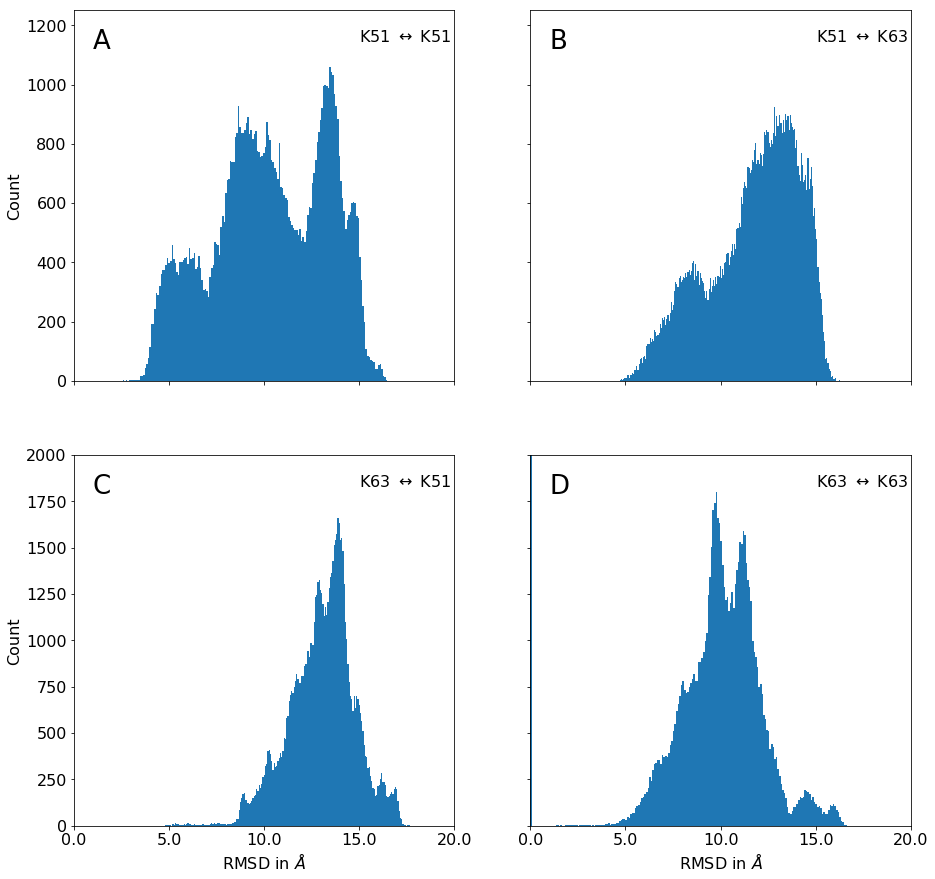

In [15]:
mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, sharex=True)
axes = [ax1, ax2, ax3, ax4]
labels = ['A', 'B', 'C', 'D']
annotations = [r'K51 $\leftrightarrow$ K51', r'K51 $\leftrightarrow$ K63', r'K63 $\leftrightarrow$ K51', r'K63 $\leftrightarrow$ K63']

fig.set_size_inches(15, 15)

for i, (ax, data) in enumerate(zip(axes, arr)):
    ax.hist(data, bins=200)
    ax.set_xlim([0, 2])
    if i < 2:
        ax.set_ylim([0, 1250])
    else:
        ax.set_ylim([0, 2000])
    if i == 1 or i == 3:
        ax.set_yticklabels([])
    if i == 0 or i == 2:
        ax.set_ylabel("Count")
    if i == 2 or i == 3:
        ax.set_xlabel(r"RMSD in $\AA$")
    ax.set_xticklabels(ax.get_xticks() * 10)
    txt = ax.text(0.75, 0.95, annotations[i], transform=ax.transAxes, fontsize=16, verticalalignment='top', color='k')
    txt = ax.text(0.05, 0.95, labels[i], transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')

## Make some images for rmsd clustering

In [23]:
traj = md.load('/home/kevin/git/mdtraj/tests/data/ala_dipeptide.dcd', top='/home/kevin/git/mdtraj/tests/data/ala_dipeptide.pdb')

In [7]:
distances = np.empty((trajs_K51.n_frames, trajs_K51.n_frames))
for i in range(trajs_K51.n_frames):
    _ = []
    ref = trajs_K51.get_single_frame(i)
    for j, t in enumerate(trajs_K51):
        _.extend(md.rmsd(t.traj, ref))
    distances[i] = np.array(_)

# np.save("complete_K51_rmsd_matrix.npy", distances)

## Load xarrays

They have been created in the numpy_netcdf_xarray notebook

In [5]:
dataset = xr.open_dataset("K51_K63_rmsd_matrices.h5")

In [7]:
dataset.data_vars['K63']

<xarray.DataArray 'K63' (frame1: 822, frame2: 822)>
[675684 values with dtype=float64]
Coordinates:
  * frame1   (frame1) int64 0 100 200 300 400 ... 81700 81800 81900 82000 82100
  * frame2   (frame2) int64 0 100 200 300 400 ... 81700 81800 81900 82000 82100

RMSD clustering with SciPy

In [9]:
dataset.data_vars['K63'].values

array([[1.64019968e-03, 8.67474496e-01, 1.06478143e+00, ...,
                   nan,            nan,            nan],
       [8.67474914e-01, 8.20099842e-04, 4.55551237e-01, ...,
                   nan,            nan,            nan],
       [1.06478167e+00, 4.55551237e-01, 0.00000000e+00, ...,
                   nan,            nan,            nan],
       ...,
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan]])

In [14]:
dataset.data_vars['K63'].dims

('frame1', 'frame2')

In [195]:
K63 = dataset.data_vars['K63'].values
K63 = K63[~np.isnan(K63)]
newshape = int(np.sqrt(K63.shape))
K63 = K63.reshape((newshape, newshape))
print(K63.shape)
diags = np.diagonal(K63)
assert np.allclose(diags, 0, atol=1e-02)
linkage_K63 = scipy.cluster.hierarchy.ward(K63)

K51 = dataset.data_vars['K51'].values
K51 = K51[~np.isnan(K51)]
newshape = int(np.sqrt(K51.shape))
K51 = K51.reshape((newshape, newshape))
print(K51.shape)
diags = np.diagonal(K51)
assert np.allclose(diags, 0, atol=1e-02)
linkage_K51 = scipy.cluster.hierarchy.ward(K51)

(794, 794)
(822, 822)


## Plot the dendrograms

In [184]:
plt.imread("RMSD_clusters_blender/K51_RMSD_clusters_1.png").shape

(1920, 1920, 4)

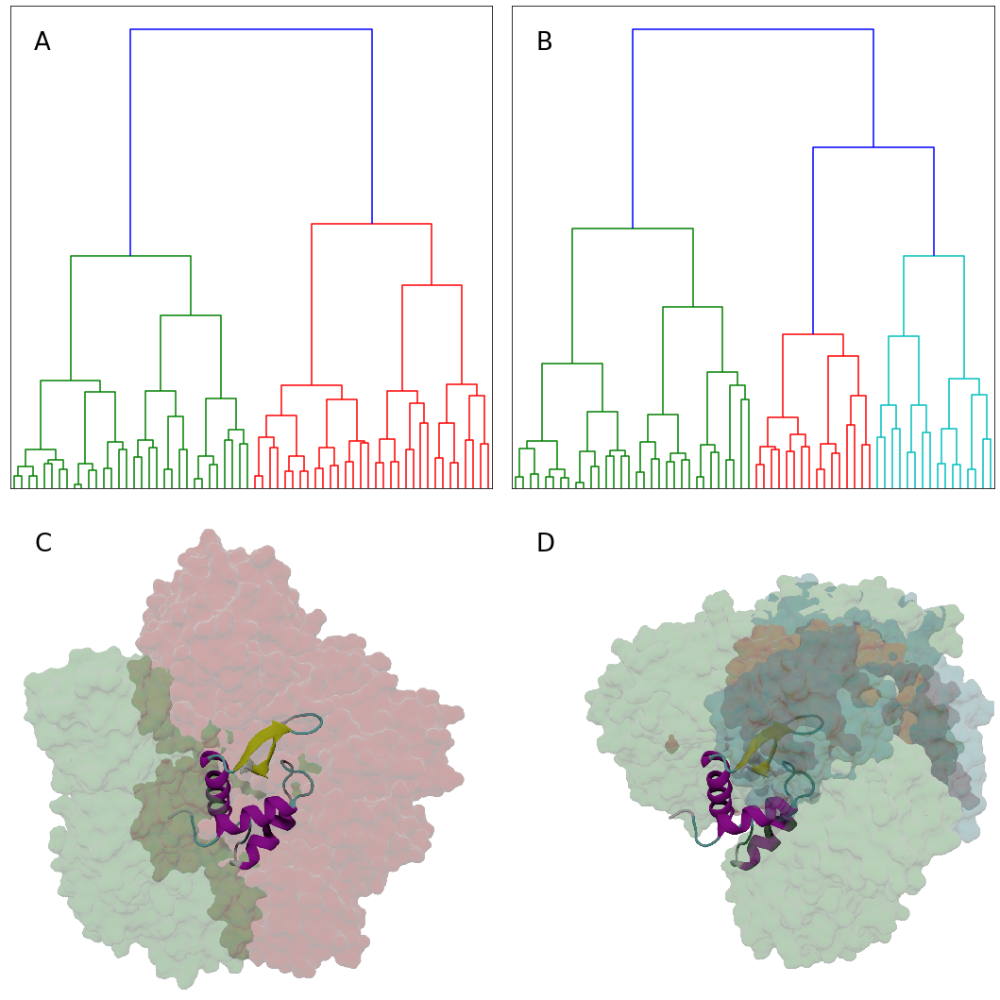

In [194]:
mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2)
fig.set_size_inches(15, 15)

graph = scipy.cluster.hierarchy.dendrogram(linkage_K51, ax=ax1, no_labels=True, count_sort='descendent', p=5, truncate_mode='level')
txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')
ax1.set_yticks([])
graph = scipy.cluster.hierarchy.dendrogram(linkage_K63, ax=ax2, no_labels=True, count_sort='descendent', p=5, truncate_mode='level')
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='k')
ax2.set_yticks([])

ax3.imshow(plt.imread("RMSD_clusters_blender/K51_RMSD_clusters_1.png")[250:-250,250:-250,:])
ax3.set_xticks([])
ax3.set_yticks([])
[k.set_linewidth(0) for k in ax3.spines.values()]
txt = ax3.text(0.05, 0.95, 'C', transform=ax3.transAxes, fontsize=26, verticalalignment='top', color='k')

ax4.imshow(plt.imread("RMSD_clusters_blender/K63_RMSD_clusters_1.png")[250:-250,250:-250,:])
ax4.set_xticks([])
ax4.set_yticks([])
[k.set_linewidth(0) for k in ax4.spines.values()]
txt = ax4.text(0.05, 0.95, 'D', transform=ax4.transAxes, fontsize=26, verticalalignment='top', color='k')

plt.tight_layout()

plt.savefig("/home/kevin/projects/paper_2019/RMSDs_K51_K63.png", dpi=600, tranparent=True)
plt.savefig("/home/kevin/projects/living_ppt/clustering/RMSDs_K51_K63.png", dpi=600, tranparent=True)

## Make images

**Define a reference**

In [163]:
indices = scipy.cluster.hierarchy.fcluster(linkage_K51, t=2, criterion='maxclust')
memberships = np.full(shape=len(trajs_K51), fill_value=-1)
memberships[::100] = indices
idx = np.where(memberships == 1)[0][0]
ref = trajs_K51.get_single_frame(idx).traj
print(ref)

<mdtraj.Trajectory with 1 frames, 1452 atoms, 151 residues, and unitcells>


** Align to that reference**

In [167]:
print(globals()['trajs_K51'])

expansion_elephant.Info_all object. Current backend is mdtraj. Containing 193 frames. Common str is ['K51']. Lowd data loaded. HighD data loaded.


In [179]:
names = ['K51', 'K51', 'K63', 'K63', 'K63']
cluster_nos = [1, 2, 1, 2, 3]
thresholds = [2, 2, 3, 3, 3]

for thresh, name, cn in zip(thresholds, names, cluster_nos):
    indices = scipy.cluster.hierarchy.fcluster(globals()[f"linkage_{name}"], t=thresh, criterion='maxclust')
    t = globals()[f"trajs_{name}"]
    memberships = np.full(shape=len(t), fill_value=-1)
    memberships[::100] = indices
    t.set_cluster_membership(memberships)
    view, traj = ep.clustering.gen_dummy_traj(t, cn, max_frames=100, superpose=ref, stack_atoms=False, nglview=False, align_string='residue 1 to 76 and name CA')
    ref_Ub_CA = ref.top.select("resid 77 to 999 and name CA")
    traj_Ub_CA = traj.top.select("resid 77 to 999 and name CA")
    superposed = traj.superpose(ref, atom_indices=traj_Ub_CA, ref_atom_indices=ref_Ub_CA)
    superposed.save_pdb(f"RMSD_clusters_{name}_{cn}.pdb")
    print(f'saved as RMSD_clusters_{name}_{cn}.pdb')

Duplicates have already been reassigned.
Provided alignment string results in 76 atoms. First atom is MET1-CA. Last atom is GLQ76-CA.
saved as RMSD_clusters_K51_1.pdb
Duplicates have already been reassigned.
Provided alignment string results in 76 atoms. First atom is MET1-CA. Last atom is GLQ76-CA.
saved as RMSD_clusters_K51_2.pdb
Duplicates have already been reassigned.
Provided alignment string results in 76 atoms. First atom is MET1-CA. Last atom is GLQ76-CA.
saved as RMSD_clusters_K63_1.pdb
Duplicates have already been reassigned.
Provided alignment string results in 76 atoms. First atom is MET1-CA. Last atom is GLQ76-CA.
saved as RMSD_clusters_K63_2.pdb
Duplicates have already been reassigned.
Provided alignment string results in 76 atoms. First atom is MET1-CA. Last atom is GLQ76-CA.
saved as RMSD_clusters_K63_3.pdb


In [99]:
view.clear_representations()
view.add_representation('cartoon', selection='residue 1 to 76', color='red')

In [136]:
for i, atom in enumerate(trajs_K51[0].traj.top.atoms):
    print(i, atom, atom.index)

0 MET1-N 0
1 MET1-H 1
2 MET1-H2 2
3 MET1-H3 3
4 MET1-CA 4
5 MET1-CB 5
6 MET1-CG 6
7 MET1-SD 7
8 MET1-CE 8
9 MET1-C 9
10 MET1-O 10
11 GLN2-N 11
12 GLN2-H 12
13 GLN2-CA 13
14 GLN2-CB 14
15 GLN2-CG 15
16 GLN2-CD 16
17 GLN2-OE1 17
18 GLN2-NE2 18
19 GLN2-HE21 19
20 GLN2-HE22 20
21 GLN2-C 21
22 GLN2-O 22
23 ILE3-N 23
24 ILE3-H 24
25 ILE3-CA 25
26 ILE3-CB 26
27 ILE3-CG1 27
28 ILE3-CG2 28
29 ILE3-CD1 29
30 ILE3-C 30
31 ILE3-O 31
32 PHE4-N 32
33 PHE4-H 33
34 PHE4-CA 34
35 PHE4-CB 35
36 PHE4-CG 36
37 PHE4-CD1 37
38 PHE4-HD1 38
39 PHE4-CD2 39
40 PHE4-HD2 40
41 PHE4-CE1 41
42 PHE4-HE1 42
43 PHE4-CE2 43
44 PHE4-HE2 44
45 PHE4-CZ 45
46 PHE4-HZ 46
47 PHE4-C 47
48 PHE4-O 48
49 VAL5-N 49
50 VAL5-H 50
51 VAL5-CA 51
52 VAL5-CB 52
53 VAL5-CG1 53
54 VAL5-CG2 54
55 VAL5-C 55
56 VAL5-O 56
57 LYS6-N 57
58 LYS6-H 58
59 LYS6-CA 59
60 LYS6-CB 60
61 LYS6-CG 61
62 LYS6-CD 62
63 LYS6-CE 63
64 LYS6-NZ 64
65 LYS6-HZ1 65
66 LYS6-HZ2 66
67 LYS6-HZ3 67
68 LYS6-C 68
69 LYS6-O 69
70 THR7-N 70
71 THR7-H 71
72 THR7-CA 72
73

686 LEU69-CG 686
687 LEU69-CD1 687
688 LEU69-CD2 688
689 LEU69-C 689
690 LEU69-O 690
691 VAL70-N 691
692 VAL70-H 692
693 VAL70-CA 693
694 VAL70-CB 694
695 VAL70-CG1 695
696 VAL70-CG2 696
697 VAL70-C 697
698 VAL70-O 698
699 LEU71-N 699
700 LEU71-H 700
701 LEU71-CA 701
702 LEU71-CB 702
703 LEU71-CG 703
704 LEU71-CD1 704
705 LEU71-CD2 705
706 LEU71-C 706
707 LEU71-O 707
708 ARG72-N 708
709 ARG72-H 709
710 ARG72-CA 710
711 ARG72-CB 711
712 ARG72-CG 712
713 ARG72-CD 713
714 ARG72-NE 714
715 ARG72-HE 715
716 ARG72-CZ 716
717 ARG72-NH1 717
718 ARG72-HH11 718
719 ARG72-HH12 719
720 ARG72-NH2 720
721 ARG72-HH21 721
722 ARG72-HH22 722
723 ARG72-C 723
724 ARG72-O 724
725 LEU73-N 725
726 LEU73-H 726
727 LEU73-CA 727
728 LEU73-CB 728
729 LEU73-CG 729
730 LEU73-CD1 730
731 LEU73-CD2 731
732 LEU73-C 732
733 LEU73-O 733
734 ARG74-N 734
735 ARG74-H 735
736 ARG74-CA 736
737 ARG74-CB 737
738 ARG74-CG 738
739 ARG74-CD 739
740 ARG74-NE 740
741 ARG74-HE 741
742 ARG74-CZ 742
743 ARG74-NH1 743
744 ARG74-HH11 

1351 THR141-HG1 1351
1352 THR141-CG2 1352
1353 THR141-C 1353
1354 THR141-O 1354
1355 GLY142-N 1355
1356 GLY142-H 1356
1357 GLY142-CA 1357
1358 GLY142-C 1358
1359 GLY142-O 1359
1360 ALA143-N 1360
1361 ALA143-H 1361
1362 ALA143-CA 1362
1363 ALA143-CB 1363
1364 ALA143-C 1364
1365 ALA143-O 1365
1366 SER144-N 1366
1367 SER144-H 1367
1368 SER144-CA 1368
1369 SER144-CB 1369
1370 SER144-OG 1370
1371 SER144-HG 1371
1372 SER144-C 1372
1373 SER144-O 1373
1374 GLY145-N 1374
1375 GLY145-H 1375
1376 GLY145-CA 1376
1377 GLY145-C 1377
1378 GLY145-O 1378
1379 SER146-N 1379
1380 SER146-H 1380
1381 SER146-CA 1381
1382 SER146-CB 1382
1383 SER146-OG 1383
1384 SER146-HG 1384
1385 SER146-C 1385
1386 SER146-O 1386
1387 PHE147-N 1387
1388 PHE147-H 1388
1389 PHE147-CA 1389
1390 PHE147-CB 1390
1391 PHE147-CG 1391
1392 PHE147-CD1 1392
1393 PHE147-HD1 1393
1394 PHE147-CD2 1394
1395 PHE147-HD2 1395
1396 PHE147-CE1 1396
1397 PHE147-HE1 1397
1398 PHE147-CE2 1398
1399 PHE147-HE2 1399
1400 PHE147-CZ 1400
1401 PHE147-HZ

## RMSD between K47 and K63 (not neccessary)

In [10]:
ref_K63 = trajs_K63[0][0].traj
ref_K63_CA = ref_K63.top.select('backbone')
ref_K47 = trajs_K47[0][0].traj
ref_K47_CA = ref_K47.top.select('backbone')

rmsds = [[], [], [], []]

for t in trajs_K47:
    r = md.rmsd(t.traj, ref_K47, atom_indices=t.traj.top.select('backbone'))
    rmsds[0].extend(r)
    r = md.rmsd(t.traj, ref_K63, atom_indices=t.traj.top.select('backbone'))
    rmsds[1].extend(r)
    
for t in trajs_K63:
    r = md.rmsd(t.traj, ref_K47, atom_indices=t.traj.top.select('backbone'))
    rmsds[2].extend(r)
    r = md.rmsd(t.traj, ref_K63, atom_indices=t.traj.top.select('backbone'))
    rmsds[3].extend(r)

In [11]:
lens = [len(l) for l in rmsds]
maxlen=max(lens)
arr = np.zeros((len(rmsds), maxlen))
mask = np.arange(maxlen) < np.array(lens)[:,None] # key line
arr[mask] = np.concatenate(rmsds)
np.save("rmsds_K47_to_K63_data.npy", arr)
np.save("rmsds_K47_to_K63_mask.npy", mask)

In [12]:
mask = np.load("rmsds_K47_to_K63_mask.npy")
arr = np.ma.array(data=np.load("rmsds_K47_to_K63_data.npy"), mask=~mask)

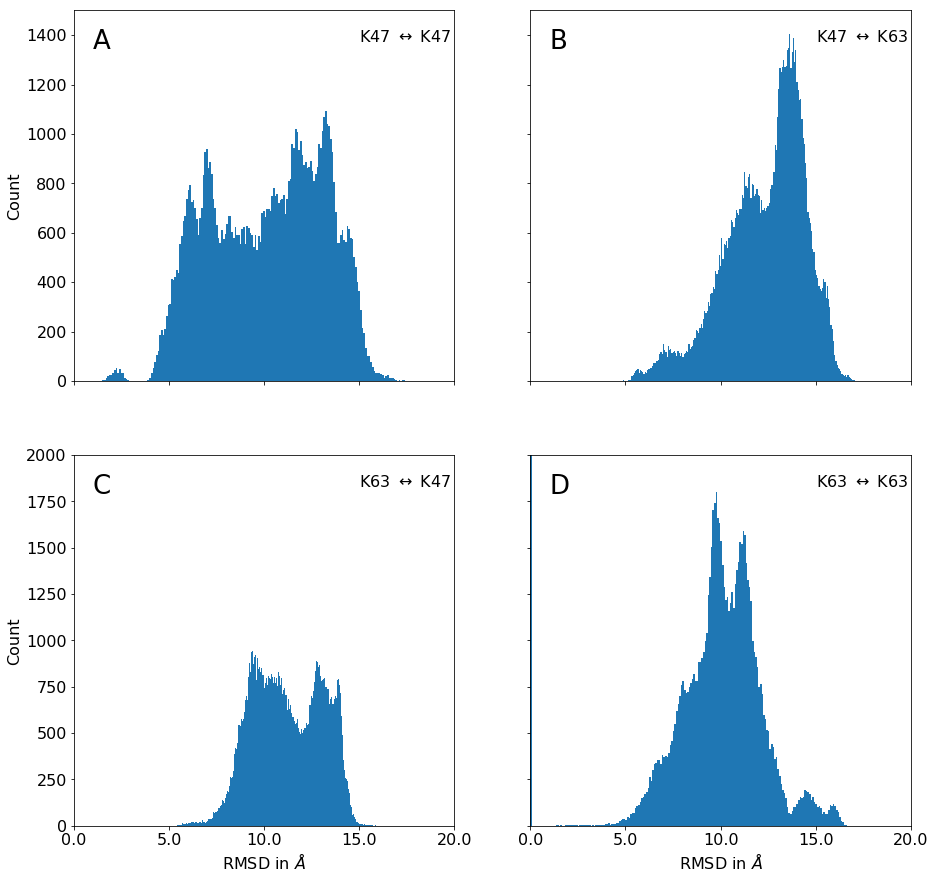

In [13]:
mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, sharex=True)
axes = [ax1, ax2, ax3, ax4]
labels = ['A', 'B', 'C', 'D']
annotations = [r'K47 $\leftrightarrow$ K47', r'K47 $\leftrightarrow$ K63', r'K63 $\leftrightarrow$ K47', r'K63 $\leftrightarrow$ K63']

fig.set_size_inches(15, 15)

for i, (ax, data) in enumerate(zip(axes, arr)):
    ax.hist(data, bins=200)
    ax.set_xlim([0, 2])
    if i < 2:
        ax.set_ylim([0, 1500])
    else:
        ax.set_ylim([0, 2000])
    if i == 1 or i == 3:
        ax.set_yticklabels([])
    if i == 0 or i == 2:
        ax.set_ylabel("Count")
    if i == 2 or i == 3:
        ax.set_xlabel(r"RMSD in $\AA$")
    ax.set_xticklabels(ax.get_xticks() * 10)
    txt = ax.text(0.75, 0.95, annotations[i], transform=ax.transAxes, fontsize=16, verticalalignment='top', color='k')
    txt = ax.text(0.05, 0.95, labels[i], transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')

# Secondary structure and stability

## Load H1Ub  dssp arrays

In [199]:
# load file if there
all_dssp = np.load("dssp_savefile.npy")

# calculation
# dssp_single_traj = md.compute_dssp(traj, simpliefied=True)
# all_dssp = [md.compute_dssp(traj, simpliefied=True)]
# try to stack somehwo
# _ = np.vstack(all_dssp)
# check shape
# print(_.shape)
# maybe overwrite
# all_dssp = _
# np.save('dssp_savefile_new.npy')

# shape is equal to n_frames x n_residues
print(all_dssp.shape)

# array if full of C (coil), E (extended), H (helical)
print(all_dssp[:5, :5])

# ubiquitin subunit
dssp = all_dssp[:,76:]
counts = []
for i, col in enumerate(dssp.T):
    H = len(np.where(col == 'H')[0])
    E = len(np.where(col == 'E')[0])
    C = len(np.where(col == 'C')[0])
    counts.append([H, E, C])
counts = np.array(counts)
H, E, C = counts.T
N = dssp.shape[1]
ind = np.arange(N)

# histone subunit
dssp = all_dssp[:,:76]
counts = []
for i, col in enumerate(dssp.T):
    H_His = len(np.where(col == 'H')[0])
    E_His = len(np.where(col == 'E')[0])
    C_His = len(np.where(col == 'C')[0])
    counts.append([H_His, E_His, C_His])
counts = np.array(counts)
H_His, E_His, C_His = counts.T
N_His = dssp.shape[1]
ind_His = np.arange(N_His)

(483983, 151)
[['C' 'E' 'E' 'E' 'E']
 ['C' 'E' 'E' 'E' 'E']
 ['C' 'E' 'E' 'E' 'E']
 ['C' 'E' 'E' 'E' 'E']
 ['C' 'C' 'E' 'E' 'E']]


## Convert Andrej's sims to hdf5

In [18]:
dirs = glob.glob("/home/andrejb/Research/SIMS/*_2ub_NaCl_k*/")
out_dir = "/home/kevin/projects/andrej_sims/"
for dir_ in dirs:
    xtc_file = f'{dir_}traj_nojump.xtc'
    gro_file = f'{dir_}start.gro'
    basename = dir_.split('/')[-2]
    out_file = f'{out_dir}{basename}.h5'
    if not os.path.isfile(out_file):
        cmd = f"mdconvert -o {out_file} -t {gro_file} {xtc_file}"
        print(cmd)
        proc = subprocess.Popen(cmd , stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE, shell=True)
        out_proc = proc.stderr.read().decode('utf-8')
        # print(out_proc)

mdconvert -o /home/kevin/projects/andrej_sims/2017_11_08_2ub_NaCl_k48_01_01.h5 -t /home/andrejb/Research/SIMS/2017_11_08_2ub_NaCl_k48_01_01/start.gro /home/andrejb/Research/SIMS/2017_11_08_2ub_NaCl_k48_01_01/traj_nojump.xtc
mdconvert -o /home/kevin/projects/andrej_sims/2017_11_08_2ub_NaCl_k48_01_02.h5 -t /home/andrejb/Research/SIMS/2017_11_08_2ub_NaCl_k48_01_02/start.gro /home/andrejb/Research/SIMS/2017_11_08_2ub_NaCl_k48_01_02/traj_nojump.xtc
mdconvert -o /home/kevin/projects/andrej_sims/2017_11_08_2ub_NaCl_k48_01_03.h5 -t /home/andrejb/Research/SIMS/2017_11_08_2ub_NaCl_k48_01_03/start.gro /home/andrejb/Research/SIMS/2017_11_08_2ub_NaCl_k48_01_03/traj_nojump.xtc
mdconvert -o /home/kevin/projects/andrej_sims/2017_11_08_2ub_NaCl_k48_01_04.h5 -t /home/andrejb/Research/SIMS/2017_11_08_2ub_NaCl_k48_01_04/start.gro /home/andrejb/Research/SIMS/2017_11_08_2ub_NaCl_k48_01_04/traj_nojump.xtc
mdconvert -o /home/kevin/projects/andrej_sims/2017_11_08_2ub_NaCl_k48_01_05.h5 -t /home/andrejb/Research

mdconvert -o /home/kevin/projects/andrej_sims/2017_11_16_2ub_NaCl_k27_01_02.h5 -t /home/andrejb/Research/SIMS/2017_11_16_2ub_NaCl_k27_01_02/start.gro /home/andrejb/Research/SIMS/2017_11_16_2ub_NaCl_k27_01_02/traj_nojump.xtc
mdconvert -o /home/kevin/projects/andrej_sims/2017_11_16_2ub_NaCl_k27_01_03.h5 -t /home/andrejb/Research/SIMS/2017_11_16_2ub_NaCl_k27_01_03/start.gro /home/andrejb/Research/SIMS/2017_11_16_2ub_NaCl_k27_01_03/traj_nojump.xtc
mdconvert -o /home/kevin/projects/andrej_sims/2017_11_16_2ub_NaCl_k27_01_04.h5 -t /home/andrejb/Research/SIMS/2017_11_16_2ub_NaCl_k27_01_04/start.gro /home/andrejb/Research/SIMS/2017_11_16_2ub_NaCl_k27_01_04/traj_nojump.xtc
mdconvert -o /home/kevin/projects/andrej_sims/2017_11_16_2ub_NaCl_k27_01_05.h5 -t /home/andrejb/Research/SIMS/2017_11_16_2ub_NaCl_k27_01_05/start.gro /home/andrejb/Research/SIMS/2017_11_16_2ub_NaCl_k27_01_05/traj_nojump.xtc
mdconvert -o /home/kevin/projects/andrej_sims/2017_11_16_2ub_NaCl_k27_01_06.h5 -t /home/andrejb/Research

In [38]:
_ = ep.Info_single(glob.glob("/home/kevin/projects/andrej_sims/*NaCl*.h5")[0], index=slice(None, None, 1000))
print(_.n_frames)

6


In [60]:
andrej_trajs = ep.Info_all(glob.glob("/home/kevin/projects/andrej_sims/*NaCl*.h5"), common_str=['k11', 'k27', 'k29', 'k33', 'k48', 'k63', 'k6'])

In [62]:
andrej_trajs[0].n_frames

5017

In [66]:
andrej_trajs.subsample(10, inplace=True)

In [67]:
andrej_trajs

<expansion_elephant.Info_all object. Current backend is no_load. Containing 301919 frames. Common str is ['k11', 'k27', 'k29', 'k33', 'k48', 'k63', 'k6']. No lowd data loaded. No highD data loaded. Object at 0x7f05c2e71710>

In [74]:
if not os.path.isfile("andrej_diub_DSSP.npy"):
    all_dssp = ep.plotting.utils.calculate_dssps(andrej_trajs)
    np.save("andrej_diub_DSSP.npy", all_dssp)
else:
    all_dssp = np.load("andrej_diub_DSSP.npy")

In [80]:
print(all_dssp[:,:76].T.shape)
print(all_dssp[:,76:].T.shape)

(76, 301919)
(76, 301919)


In [93]:
counts = []
for i, col in enumerate(all_dssp[:,:76].T):
    H_Ub = len(np.where(col == 'H')[0])
    E_Ub = len(np.where(col == 'E')[0])
    C_Ub = len(np.where(col == 'C')[0])
    col = all_dssp[i,76:].T
    H_Ub += len(np.where(col == 'H')[0])
    E_Ub += len(np.where(col == 'E')[0])
    C_Ub += len(np.where(col == 'C')[0])
    counts.append([H_Ub, E_Ub, C_Ub])
counts = np.array(counts)
print(counts.shape)
H_Ub, E_Ub, C_Ub = counts.T
N_Ub = int(all_dssp.shape[1] / 2)
ind_Ub = np.arange(N_Ub)
print(H_Ub.shape, N_Ub, ind_Ub.shape)

(76, 3)
(76,) 76 (76,)


## RMSDs from crystal structure

In [167]:
RMSDs_His = []
RMSDs_Ub_me = []
RMSDs_Ub_an = []
His_crystal = md.load_pdb('https://files.rcsb.org/view/1GHC.pdb')
Ub_crystal = md.load_pdb('https://files.rcsb.org/view/1UBQ.pdb')

overwrite = False

if not np.all([os.path.isfile(i) for i in ["RMSDs_His.npy", "RMSDs_Ub_me.npy", "RMSDs_Ub_an.npy"]]) or overwrite:

    for traj in trajs:
        selection = traj.top.select("resid 76 to 151")
        _ = traj.traj.atom_slice(selection)
        # print(traj.top.atom(selection[0]), traj.top.atom(selection[-1]))
        rmsd = md.rmsd(_, His_crystal, frame=0, atom_indices=_.top.select("name CA"))
        RMSDs_His.extend(rmsd)
        selection = traj.top.select("resid 0 to 75")
        _ = traj.traj.atom_slice(selection)
        # print(traj.top.atom(selection[0]), traj.top.atom(selection[-1]))
        rmsd = md.rmsd(_, His_crystal, frame=0, atom_indices=_.top.select("name CA"))
        RMSDs_Ub_me.extend(rmsd)

    for traj in andrej_trajs:
        selection = traj.top.select("resid 76 to 152")
        _ = traj.traj.atom_slice(selection)
        # print(traj.top.atom(selection[0]), traj.top.atom(selection[-1]))
        rmsd = md.rmsd(_, His_crystal, frame=0, atom_indices=_.top.select("name CA"))
        RMSDs_Ub_an.extend(rmsd)
        selection = traj.top.select("resid 0 to 75")
        _ = traj.traj.atom_slice(selection)
        # print(traj.top.atom(selection[0]), traj.top.atom(selection[-1]))
        rmsd = md.rmsd(_, His_crystal, frame=0, atom_indices=_.top.select("name CA"))
        RMSDs_Ub_an.extend(rmsd)

    RMSDs_His = np.array(RMSDs_His)
    RMSDs_Ub_me = np.array(RMSDs_Ub_me)
    RMSDs_Ub_an = np.array(RMSDs_Ub_an)
    np.save("RMSDs_His.npy", RMSDs_His)
    np.save("RMSDs_Ub_me.npy", RMSDs_Ub_me)
    np.save("RMSDs_Ub_an.npy", RMSDs_Ub_an)
    
else:
    RMSDs_His = np.load("RMSDs_His.npy")
    RMSDs_Ub_me = np.load("RMSDs_Ub_me.npy")
    RMSDs_Ub_an = np.load("RMSDs_Ub_an.npy")

In [168]:
print(RMSDs_His.shape)
print(RMSDs_Ub_me.shape)
print(RMSDs_Ub_an.shape)

(483983,)
(483983,)
(603838,)


## Plotting

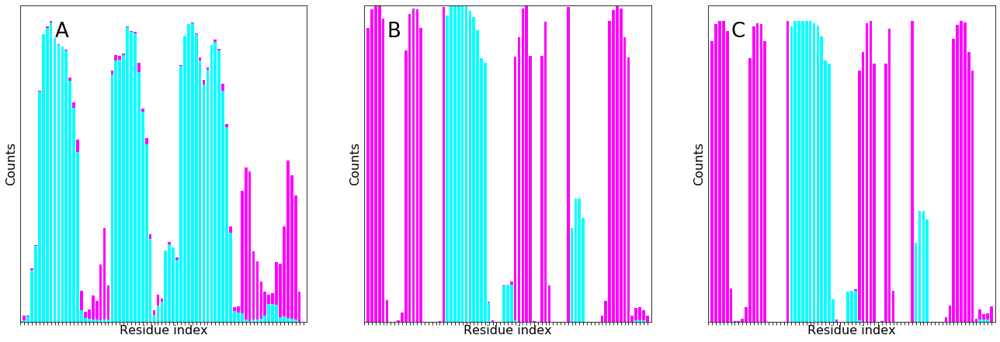

In [124]:
plt.close('all')
mpl.rcParams.update({'font.size': 16})
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3)
fig.set_size_inches(22.5, 7.5)
width = 0.75

p1 = ax1.bar(ind, H, width, color='cyan')
p2 = ax1.bar(ind, E, width, bottom=H, color='magenta')
ax1.set_yticks([])
ax1.set_xticks(range(N))
[l.set_visible(False) for l in ax1.xaxis.get_ticklabels()]
for label in ax1.xaxis.get_ticklabels()[::10]:
    label.set_visible(True)
ax1.set_xlim(0, N)
ax1.set_xlabel('Residue index')
ax1.set_ylabel("Counts")
txt = ax1.text(0.12, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')

p1 = ax2.bar(ind_His, H_His, width, color='cyan')
p2 = ax2.bar(ind_His, E_His, width, bottom=H_His, color='magenta')
ax2.set_yticks([])
ax2.set_xticks(range(N_His))
[l.set_visible(False) for l in ax2.xaxis.get_ticklabels()]
for label in ax2.xaxis.get_ticklabels()[::10]:
    label.set_visible(True)
ax2.set_xlim(0, N_His)
ax2.set_xlabel('Residue index')
ax2.set_ylabel("Counts")
txt = ax2.text(0.08, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='k')

p1 = ax3.bar(ind_Ub, H_Ub, width, color='cyan')
p2 = ax3.bar(ind_Ub, E_Ub, width, bottom=H_Ub, color='magenta')
ax3.set_yticks([])
ax3.set_xticks(range(N_Ub))
[l.set_visible(False) for l in ax3.xaxis.get_ticklabels()]
for label in ax3.xaxis.get_ticklabels()[::10]:
    label.set_visible(True)
ax3.set_xlim(0, N_Ub)
ax3.set_xlabel('Residue index')
ax3.set_ylabel("Counts")
txt = ax3.text(0.08, 0.95, 'C', transform=ax3.transAxes, fontsize=26, verticalalignment='top', color='k')

0.02465835
0.01238982
0.071079776


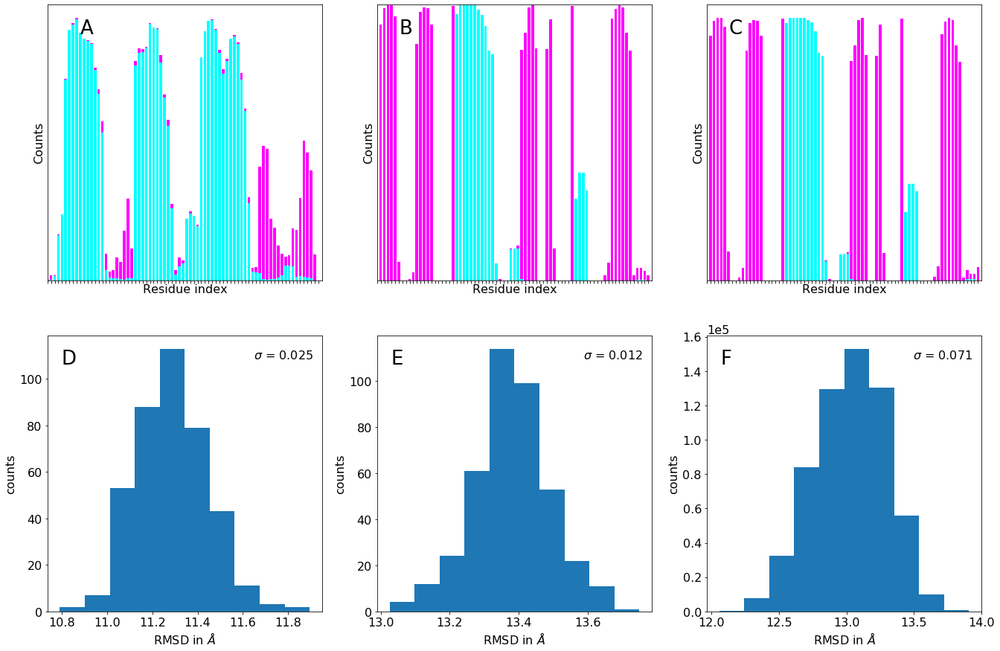

In [139]:
plt.close('all')
mpl.rcParams.update({'font.size': 16})
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(ncols=3, nrows=2)
fig.set_size_inches(22.5, 15)
width = 0.75

p1 = ax1.bar(ind, H, width, color='cyan')
p2 = ax1.bar(ind, E, width, bottom=H, color='magenta')
ax1.set_yticks([])
ax1.set_xticks(range(N))
[l.set_visible(False) for l in ax1.xaxis.get_ticklabels()]
for label in ax1.xaxis.get_ticklabels()[::10]:
    label.set_visible(True)
ax1.set_xlim(0, N)
ax1.set_xlabel('Residue index')
ax1.set_ylabel("Counts")

p1 = ax2.bar(ind_His, H_His, width, color='cyan')
p2 = ax2.bar(ind_His, E_His, width, bottom=H_His, color='magenta')
ax2.set_yticks([])
ax2.set_xticks(range(N_His))
[l.set_visible(False) for l in ax2.xaxis.get_ticklabels()]
for label in ax2.xaxis.get_ticklabels()[::10]:
    label.set_visible(True)
ax2.set_xlim(0, N_His)
ax2.set_xlabel('Residue index')
ax2.set_ylabel("Counts")

p1 = ax3.bar(ind_Ub, H_Ub, width, color='cyan')
p2 = ax3.bar(ind_Ub, E_Ub, width, bottom=H_Ub, color='magenta')
ax3.set_yticks([])
ax3.set_xticks(range(N_Ub))
[l.set_visible(False) for l in ax3.xaxis.get_ticklabels()]
for label in ax3.xaxis.get_ticklabels()[::10]:
    label.set_visible(True)
ax3.set_xlim(0, N_Ub)
ax3.set_xlabel('Residue index')
ax3.set_ylabel("Counts")

for i, (ax, data, annotation) in enumerate(zip([ax4, ax5, ax6], [RMSDs_His, RMSDs_Ub_me, RMSDs_Ub_an], ['D', 'E', 'F'])):
    ax.hist(data)
    txt = ax.text(0.05, 0.95, annotation, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')
    ax.set_xticklabels(np.round(ax.get_xticks() * 10, 1))
    ax.set_ylabel("counts")
    ax.set_xlabel(r'RMSD in $\AA$')
    print(np.var(data * 10))
    var = str(np.round(np.var(data * 10), 3))
    s = r'$\sigma$ = '
    s += var
    txt = ax.text(0.75, 0.95, s, transform=ax.transAxes, fontsize=16, verticalalignment='top', color='k')
    if i == 2:
        ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
    
txt = ax1.text(0.12, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')
txt = ax2.text(0.08, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='k')
txt = ax3.text(0.08, 0.95, 'C', transform=ax3.transAxes, fontsize=26, verticalalignment='top', color='k')

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-192-ef2563d2dc6a>:39: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(np.round(ax.get_xticks() * 10, 1))


0.3475654
0.058614988


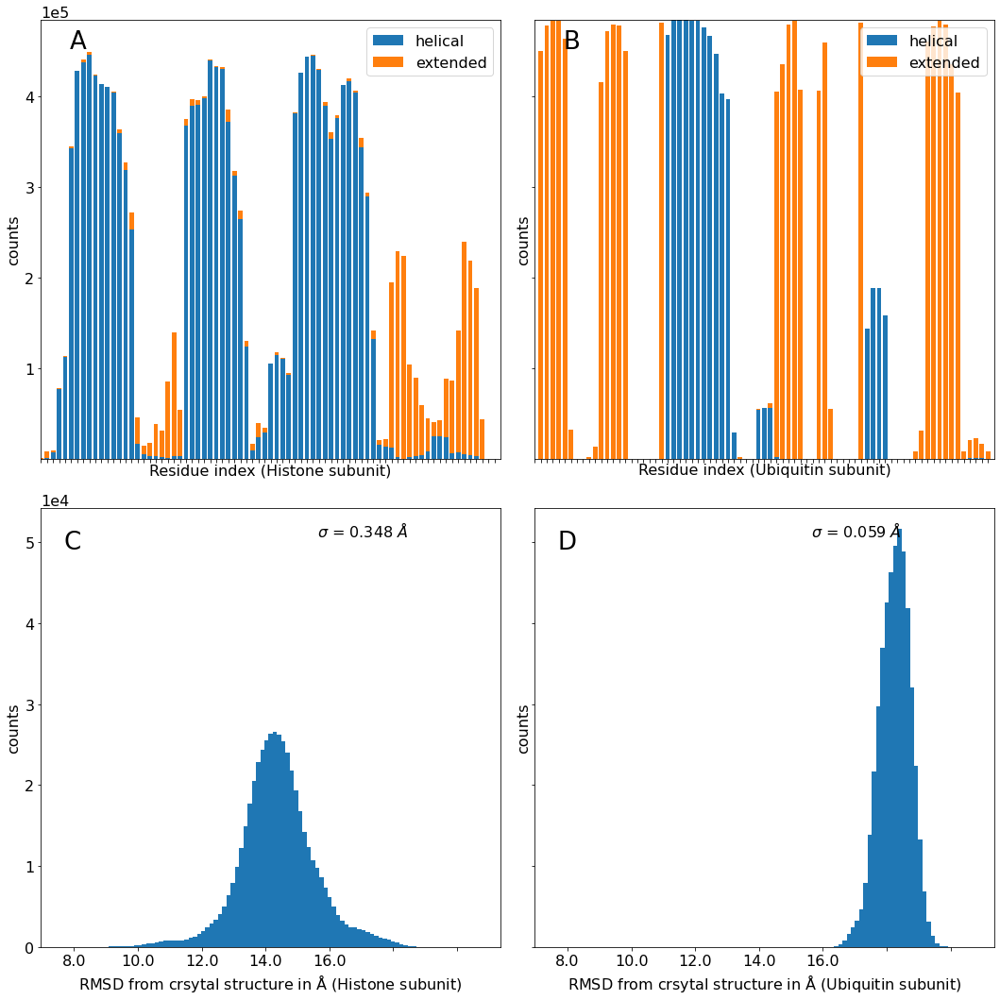

In [192]:
plt.close('all')
mpl.rcParams.update({'font.size': 16})
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, sharey='row', sharex='row')
fig.set_size_inches(15, 15)
width = 0.75

p1 = ax1.bar(ind, H, width, color='C0', label='helical')
p2 = ax1.bar(ind, E, width, bottom=H, color='C1', label='extended')
ax1.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax1.set_xticks(range(N))
ax1.legend()
[l.set_visible(False) for l in ax1.xaxis.get_ticklabels()]
for label in ax1.xaxis.get_ticklabels()[::10]:
    label.set_visible(True)
ax1.set_xlim(0, N)
ax1.set_xlabel('Residue index (Histone subunit)')
ax1.set_ylabel("counts")

p1 = ax2.bar(ind_His, H_His, width, color='C0', label='helical')
p2 = ax2.bar(ind_His, E_His, width, bottom=H_His, color='C1', label='extended')
ax2.legend()
ax2.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax2.set_xticks(range(N_His))
[l.set_visible(False) for l in ax2.xaxis.get_ticklabels()]
for label in ax2.xaxis.get_ticklabels()[::10]:
    label.set_visible(True)
ax2.set_xlim(0, N_His)
ax2.set_xlabel('Residue index (Ubiquitin subunit)')
ax2.set_ylabel("counts")

_ = np.vstack([RMSDs_His, RMSDs_Ub_me])
min_ = np.min(_)
max_ = np.max(_)
bin_edges = np.linspace(min_, max_, 100)

for i, (ax, data, annotation) in enumerate(zip([ax3, ax4], [RMSDs_His, RMSDs_Ub_me], ['C', 'D'])):
    ax.hist(data, bins=bin_edges)
    txt = ax.text(0.05, 0.95, annotation, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')
    ax.set_xticklabels(np.round(ax.get_xticks() * 10, 1))
    ax.set_ylabel("counts")
    s = r'RMSD from crsytal structure in $\mathrm{\AA}$'
    if i == 0:
        s += ' (Histone subunit)'
    else:
        s += ' (Ubiquitin subunit)'
    ax.set_xlabel(s)
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
    print(np.var(data * 10))
    var = str(np.round(np.var(data * 10), 3))
    s = r'$\sigma$ = '
    s += var
    s += r' $\AA$'
    txt = ax.text(0.7, 0.95, s, transform=ax.transAxes, fontsize=16, va='center', ha='center', color='k')
    if i == 2:
        ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
    
txt = ax1.text(0.08, 0.95, 'A', transform=ax1.transAxes, fontsize=26, va='center', ha='center', color='k')
txt = ax2.text(0.08, 0.95, 'B', transform=ax2.transAxes, fontsize=26, va='center', ha='center', color='k')

plt.tight_layout()

plt.savefig("/home/kevin/projects/paper_2019/sec_struct_propensity.highq.png", transparent=True, dpi=600)
plt.savefig("/home/kevin/projects/paper_2019/sec_struct_propensity.png", transparent=True, dpi=300)
plt.savefig("/home/kevin/projects/living_ppt/H5Ub/sec_struct_propensity.highq.png", transparent=True, dpi=600)
plt.savefig("/home/kevin/projects/living_ppt/H5Ub/sec_struct_propensity.png", transparent=True, dpi=300)

# Rmsd matrix between cluster centroids

Define a function to get the ubiquitination site out of a basename

In [380]:
def get_ubq_site(inp):
    if '1GHC' in inp:
        inp = inp.split('1GHC_')[1]
    return inp.split('_')[0]

Load the info_list

In [397]:
with open("/home/kevin/projects/clustering/hdbscan_with_RMSD_correction/info_all_v3.pickle", 'rb') as f:
    info_list = pickle.load(f)

Some checks. These are currently not working. I need to look into that later.,

In [419]:
index = row[9].argmin()
idx = np.round(np.linspace(0, len(row[4]) - 1, max_frames)).astype(int)
index = row[4][idx][index]
centroid_ = trajs.get_single_frame(index)
print(centroid_.xyz[0, 0])
print(centroid.xyz[0, 0])

[7.017     8.047     3.7760003]
[7.485363  6.6419263 4.9528403]


Iterate over the list and find clusters with 75% structures from the saem ubiquitination site.

In [447]:
num_mixed_clusters = 0
num_definitive_clusters = 0

cluster_centroids = []
cluster_centroid_indices = []
cluster_ubqs = []

for row in info_list:
    if row[2]:
        if len(row[4]) <= 50:
            continue
        cluster_num = row[1] - 1
        uniques, counts = np.unique(list(map(get_ubq_site, trajs.name_arr[row[4]].tolist())), return_counts=True)
        if counts.max() > 0.75 * counts.sum():
            num_definitive_clusters += 1
            ubq = uniques[counts.argmax()]
            index = row[5][row[9].argmin()]
            centroid_ = trajs.get_single_frame(index)
            cluster_centroids.append(centroid_.traj)
            cluster_centroid_indices.append(index)
            cluster_ubqs.append(ubq)
            
            # print(f'Cluster {cluster_num} contains mainly (> 75 percent)structures from {ubq}')
            
            # include a test
            if cluster_num == 0:
                pass
                # view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, 0, max_frames=max_frames, stack_atoms=False)
                # index, distances, centroid = ep.clustering.rmsd_centroid_of_cluster(dummy_traj)
                # print(centroid_.xyz[0, 0])
                # print(centroid.xyz[0, 0])
                # assert np.array_equal(centroid_.xyz[0], centroid.xyz[0])
        else:
            num_mixed_clusters += 1
            print(f'Cluster {cluster_num} is undecided')

Cluster 7 is undecided
Cluster 43 is undecided
Cluster 59 is undecided
Cluster 65 is undecided
Cluster 72 is undecided
Cluster 95 is undecided
Cluster 128 is undecided
Cluster 148 is undecided
Cluster 152 is undecided
Cluster 168 is undecided
Cluster 195 is undecided
Cluster 220 is undecided
Cluster 222 is undecided
Cluster 223 is undecided
Cluster 239 is undecided
Cluster 251 is undecided
Cluster 252 is undecided
Cluster 316 is undecided
Cluster 317 is undecided
Cluster 327 is undecided
Cluster 332 is undecided
Cluster 350 is undecided
Cluster 351 is undecided
Cluster 372 is undecided
Cluster 387 is undecided
Cluster 433 is undecided
Cluster 455 is undecided
Cluster 456 is undecided
Cluster 457 is undecided
Cluster 458 is undecided
Cluster 460 is undecided
Cluster 461 is undecided
Cluster 465 is undecided
Cluster 537 is undecided
Cluster 560 is undecided
Cluster 592 is undecided
Cluster 641 is undecided
Cluster 645 is undecided
Cluster 672 is undecided
Cluster 724 is undecided
Cluster

Order these cluster centroids based on the ubiquitination site

In [474]:
ubqs = np.unique(cluster_ubqs)
print(ubqs)

cluster_centroid_indices_sorted = [[], [], [], [], [], []]

for c, u in zip(cluster_centroid_indices, cluster_ubqs):
    index = [i == u for i in ubqs].index(True)
    cluster_centroid_indices_sorted[index].append(c)

['K30' 'K41' 'K47' 'K51' 'K56' 'K63']


Sort by RMSD inside a UBQ site, flatten the list and get a dummy_traj

In [477]:
for i, subset in enumerate(cluster_centroid_indices_sorted):
    where = np.array(subset)
    view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, where, superpose=False)
    distances = md.rmsd(dummy_traj, dummy_traj, 0, atom_indices=atom_indices, parallel=False)
    cluster_centroid_indices_sorted[i] = np.array(subset)[distances.argsort()]
    
cluster_centroid_indices_sorted = [item for sublist in cluster_centroid_indices_sorted for item in sublist]

print(len(cluster_centroid_indices_sorted))
where = np.array(cluster_centroid_indices_sorted)
view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, where, superpose=False)

632


Get an rmsd matrix

In [478]:
atom_indices = [a.index for a in dummy_traj.topology.atoms if a.element.symbol != 'H']
distances = np.empty((dummy_traj.n_frames, dummy_traj.n_frames))
for i in range(dummy_traj.n_frames):
    distances[i] = md.rmsd(dummy_traj, dummy_traj, i, atom_indices=atom_indices, parallel=False)

Plot the histogram

In [479]:
distances.shape

(632, 632)

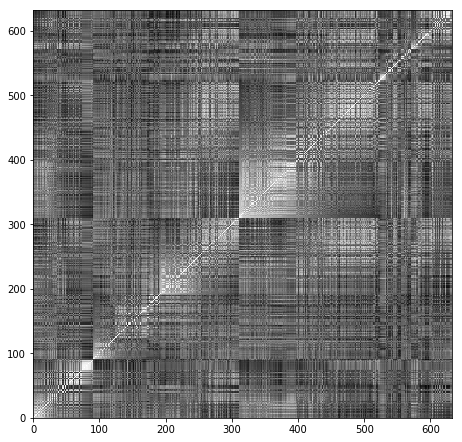

In [480]:
plt.close('all')

fig, ax = plt.subplots()

fig.set_size_inches(7.5, 7.5)

ax.pcolormesh(distances, cmap=plt.cm.Greys)

# NetworkX cluster comparison

Fill the diagonal with zeros

In [483]:
np.fill_diagonal(distances, 0)

In [489]:
distances.shape[0]

632

In [ ]:
def get_ubq_site(inp):
    if '1GHC' in inp:
        inp = inp.split('1GHC_')[1]
    return inp.split('_')[0]

In [499]:
for i, index in enumerate(cluster_centroid_indices_sorted):
    if i in stack:
        continue
    ubq = get_ubq_site(trajs.get_single_frame(index).basename)
    color = colors[ubqs.index(ubq)]
    print(color)
    nx.draw_networkx_nodes(G, pos, nodelist=[i], node_color=color, node_size=100)

#F16745


## Plot

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

G = nx.Graph()

mpl.rcParams.update({'font.size': 16})

# color definitions
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
ubqs = ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']

for i in range(distances.shape[0]):
    for j in range(distances.shape[0]):
        if i == j:
            continue
        if distances[i, j] > .6:
            continue
        G.add_edge(i, j, weight=distances[i, j])

# old draw method
# edgelist = [(u, v) for (u, v, d) in G.edges(data=True)]
# nx.draw_networkx_edges(G, pos, edgelist=edgelist, width=6)
# nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

# check if all nodes are drawn
stack = list(range(distances.shape[0]))
for n in G.nodes():
    stack.remove(n)    
print(f"Clusters {stack} are not considered")

fig, ax = plt.subplots()
fig.set_size_inches(20, 20)
ax.set_xlim([-1, 1.1])
ax.set_ylim([-1, 1.1])

# nodes
pos = nx.kamada_kawai_layout(G)#, seed=np.random.seed(0))  # positions for all nodes

# # normalize and get viridis
# norm = mpl.colors.Normalize(vmin=scores_df_iterations['total_score'].min(), vmax=scores_df_iterations['total_score'].max())
# cm = mpl.cm.get_cmap('viridis')

# iterate over nodes
for i, index in enumerate(cluster_centroid_indices_sorted):
    if i in stack:
        continue
    ubq = get_ubq_site(trajs.get_single_frame(index).basename)
    color = colors[ubqs.index(ubq)]
    nx.draw_networkx_nodes(G, pos, nodelist=[i], node_color=color, node_size=100)
    
# draw all nodes in the same color
# nx.draw_networkx_nodes(G, pos=pos, node_size=100, ax=ax)

# color bar
colors_rgba = [mpl.colors.hex2color(color) for color in colors]
cm = mpl.colors.LinearSegmentedColormap.from_list('name', colors_rgba, N=len(ubqs))
norm = mpl.colors.Normalize(vmin=0, vmax=len(ubqs))
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
cmap_ticks = np.linspace(0, 1, len(ubqs) + 1) + 1.0/(len(ubqs) * 2)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=cmap_ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ubqs)
# remove tick length
cb.ax.tick_params(axis="y",direction="out", length=0)

# edges
edgelist = [(u, v) for (u, v, d) in G.edges(data=True)]
nx.draw_networkx_edges(G, pos, edgelist=edgelist, width=.5, ax=ax)

# labels
# labels={}
# for i in range(clusterer_labels.max()):
#     if i in stack:
#         continue
#     labels[i]=i
# _ = nx.draw_networkx_labels(G, pos, labels, font_size=10, ax=ax, font_color='w')

ax.set_xticks([])
ax.set_yticks([])
# remove outside frame
[k.set_linewidth(0) for k in ax.spines.values()]

plt.savefig("/home/kevin/projects/paper_2019/cluster_rmsd_network.png", transparent=True, dpi=600)
plt.savefig("/home/kevin/projects/living_ppt/clustering/cluster_rmsd_network.png", transparent=True, dpi=600)

mpl.rcParams.update({'font.size': 10})

# Scoring

In [4]:
# %load /home/kevin/projects/interpenetration_algorithm/ISA/ISA.py
import numpy as np
import mdtraj as md
import matplotlib as mpl
import matplotlib.pyplot as plt

import os
import glob
import subprocess
import sys
import itertools
import time

from math import ceil

from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
# from mpl_toolkits.basemap import Basemap

from matplotlib.widgets import Lasso

from matplotlib.colors import colorConverter

from matplotlib.collections import RegularPolyCollection

from matplotlib import path

from multiprocessing import cpu_count, Pool, TimeoutError
from joblib import Parallel, delayed

from ipywidgets import FloatProgress
from IPython.display import display
from IPython.display import clear_output

# ISA
# Interpenetration and Scoring Algorithm

class ISA:
    """This docstring is just a placeholder
    
    Args:
        input_arr (np.ndarray): The atomic positions of the nucleosome.
        
    Methods:
        get_score:
        
    """
    
    init_bins = 25
    propagation_factor = 1.0
    threshold = 0.2
    
    def test(self):
        """placeholder function to check autoreload.
        
        It works.
        
        """
        print('Hello')
    
    def __init__(self, input_arr, weights=False):
        self.input_arr = input_arr
        self.weights = weights
        if not type(self.input_arr) is np.ndarray:
            raise Exception('Please give a N,3 numpy ndarray')
        if not type(self.weights) is bool:
            if not type(self.weights) is np.ndarray:
                raise Exception('Please give a N, numpy ndarray')
        self.point_no = self.input_arr.shape[0]
        print('creating ISA object with '+str(self.point_no)+' points.')
        self.dimnum = self.input_arr.shape[1]
        if self.dimnum != 3:
            raise Exception('Currently only supports 3D datasets')
        if not type(self.weights) is bool:
            if len(self.weights) != self.point_no:
                raise Exception('Weight array needs to be same length as input array')
        
        self.print_debug()
    
    def gen_histogram(self):
        # run numpy histogram
        if self.dimnum == 3:
            if not type(self.weights) is bool:
                self.H, self.edges = np.histogramdd(self.input_arr, weights=self.weights, bins=self.init_bins)
                # due to the weighing the lowest achievable value is below 0 and the background gets 
                # a lighter color
            else:
                self.H, self.edges = np.histogramdd(self.input_arr, bins=self.init_bins)
            # There has been a lot of confusion regarding the plotting of histograms.
            # For some unknown reason matplotlib expects for histograms the first dimension to be y.
            # So the calculation is correct, but for the plotting the histogram should be transposed
            # see: https://stackoverflow.com/questions/43568370/matplotlib-2d-histogram-seems-transposed
            # However this made the surface look not so good. I got a bad color gradient.
            # Maybe I need to reevaluate about this.
            # Pyemma does transpose the 2D histogram right after creation in its plot_free_energy function
            # If I would do this, the histogram needs to be transposed slice-wise
#             self.H_tmp = np.ones(shape=self.H.shape)
#             for slice_ in self.H:
#                 self.H_tmp[slice_] = self.H[slice_].T
#             self.H = self.H_tmp
        else:
            raise Exception('Currently only support 3d binning')
        # set histo_out
        self.histo_out = self.H
        
        # define some minor stuff
        self.x_bins = self.H.shape[0]
        self.y_bins = self.H.shape[1]
        self.z_bins = self.H.shape[2]
        self.n_bins = self.x_bins * self.y_bins * self.z_bins
        
    def gen_cumulative_histograms(self):
        # define corners
        self.corners = []
        for x in [0, self.x_bins - 1]:
            for y in [0, self.x_bins - 1]:
                for z in [0, self.x_bins - 1]:
                    append = [x, y, z]
                    self.corners.append(append)
        
        # initialize cumulative histogram search
        self.no_of_search_bubbles = 2 ** self.dimnum
        
        # initialize search bubbles
        self.iter_bubbles = []
        for i in range(self.no_of_search_bubbles):
            iteration = self.make_iter_bubble(i, self.corners[i])
            self.iter_bubbles.append(iteration)
        
        # get the values for each bubble
        self.values = []
        for i in range(self.no_of_search_bubbles):
            value = self.make_value_bubble(i, self.corners[i], self.iter_bubbles[i])
            self.values.append(value)
            
        # add the values according to my idea with 1D histograms
        self.histo_out = self.add_values()
        # I decided to skip the normalization to get integer values of the scores
        self.histo_out = self.histo_out / np.max(self.histo_out)
            
        # mean over all bubbles
        # self.histo_out = np.zeros((self.H.shape[0], self.H.shape[1], self.H.shape[2]))
        # mean = 0
        # for histo in self.values:
        #     self.histo_out = self.histo_out + histo
        #     mean += 1
        # self.histo_out = self.histo_out / mean
        
    def make_iter_bubble(self, number, corner):
        # print('generating iteration bubble for corner '+str(corner))
        H_iter = np.zeros((self.H.shape[0], self.H.shape[1], self.H.shape[2]), dtype=int)
        H_iter[corner[0],corner[1],corner[2]] = 1
        
        iteration = 1
        while 0 in H_iter:
            for (x, y, z), value in np.ndenumerate(self.H):
                # iterate over all bins
                if H_iter[x][y][z] != 0:
                    # only continue if bin is not finished
                    pass
                else:
                    # only calculate nearest neighbour values, if (x, y, z) aren't out of bounds
                    values = []
                    if x < self.init_bins - 1:
                        X_val = H_iter[x+1, y, z]
                        values.append(X_val)
                    if x > 0:
                        x_val = H_iter[x-1, y, z]
                        values.append(x_val)
                    if y < self.init_bins -1:
                        Y_val = H_iter[x, y+1, z]
                        values.append(Y_val)
                    if y > 0:
                        y_val = H_iter[x, y-1, z]
                        values.append(y_val)
                    if z < self.init_bins - 1:
                        Z_val = H_iter[x, y, z+1]
                        values.append(Z_val)
                    if z > 0:
                        z_val = H_iter[x, y, z-1]
                        values.append(z_val)
                    # if the iteration value occurs in neighbours. set new values
                    if iteration in values:
                        H_iter[x][y][z] = iteration + 1
            iteration += 1
        # globally subtract 1    
        H_iter = H_iter - 1
        return(H_iter)
    
    def make_value_bubble(self, number, corner, iter_bubble):
        H_out = np.zeros((self.H.shape[0], self.H.shape[1], self.H.shape[2])).astype(np.float)
        H_out[corner[0],corner[1],corner[2]] = 0.0
        
        for iteration in range(np.max(iter_bubble) + 1): # +1 is needed so the last bin also gets calculated
            if iteration == 0:
                pass
            else:
                iter_count = len(np.where(iter_bubble == iteration)[0])
                # print('assigning new values to '+str(iter_count)+' bins')
                # at what iteration are we
                where_x = np.where(iter_bubble == iteration)[0]
                where_y = np.where(iter_bubble == iteration)[1]
                where_z = np.where(iter_bubble == iteration)[2]
                append_values = []
                for i in range(len(where_x)):
                    x = where_x[i]
                    y = where_y[i]
                    z = where_z[i]
                    # print('searching for neighbours for bin ('+str(x)+', '+str(y)+', '+str(z)+')')
                    # define all the nearest neighbours of the bin
                    neighbours = []
                    # +1 neighbours
                    X_neighbour = [x+1, y, z]; neighbours.append(X_neighbour)
                    x_neighbour = [x-1, y, z]; neighbours.append(x_neighbour)
                    Y_neighbour = [x, y+1, z]; neighbours.append(Y_neighbour)
                    y_neighbour = [x, y-1, z]; neighbours.append(y_neighbour)
                    Z_neighbour = [x, y, z+1]; neighbours.append(Z_neighbour)
                    z_neighbour = [x, y, z-1]; neighbours.append(z_neighbour)
                    # +2 neighbours
#                     xx_neighbour = [x-2, y, z]; neighbours.append(xx_neighbour)
#                     XX_neighbour = [x+2, y, z]; neighbours.append(XX_neighbour)
#                     yy_neighbour = [x, y-2, z]; neighbours.append(yy_neighbour)
#                     YY_neighbour = [x, y+2, z]; neighbours.append(YY_neighbour)
#                     zz_neighbour = [x, y, z-2]; neighbours.append(zz_neighbour)
#                     ZZ_neighbour = [x, y, z+2]; neighbours.append(ZZ_neighbour)
#                     zx_neighbour = [x-1, y, z-1]; neighbours.append(zx_neighbour)
#                     zX_neighbour = [x+1, y, z-1]; neighbours.append(zX_neighbour)
#                     zy_neighbour = [x, y-1, z-1]; neighbours.append(zy_neighbour)
#                     zY_neighbour = [x, y+1, z-1]; neighbours.append(zY_neighbour)
#                     Zx_neighbour = [x-1, y, z+1]; neighbours.append(Zx_neighbour)
#                     ZX_neighbour = [x+1, y, z+1]; neighbours.append(ZX_neighbour)
#                     Zy_neighbour = [x, y-1, z+1]; neighbours.append(Zy_neighbour)
#                     ZY_neighbour = [x, y+1, z+1]; neighbours.append(ZY_neighbour)
                    # check, whether some neighbours are out of bounds
                    neighbours_tmp = []
                    for neighbour in neighbours:
                        if -1 in neighbour or self.init_bins in neighbour or -2 in neighbour or self.init_bins + 1 in neighbour:
                            pass # removes out of bound neighbours
                        else:
                            neighbours_tmp.append(neighbour)
                    # print('bin ('+str(x)+', '+str(y)+', '+str(z)+') has '+str(len(neighbours_out))+' neighbours inside boundaries')
                    # remove neighbours which are in front of the iter bubble
                    neighbours_out = []
                    for coords in neighbours_tmp:
                        x_n = coords[0]
                        y_n = coords[1]
                        z_n = coords[2]
                        if iter_bubble[x_n][y_n][z_n] == iteration + 1:
                            pass # removes neighbour in front of iter bubble
                        else:
                            neighbours_out.append(coords)
                    # count number of neighbours from previous iterations
                    neighbour_count = 0
                    for coords in neighbours_out:
                        x_n = coords[0]
                        y_n = coords[1]
                        z_n = coords[2]
                        if iter_bubble[x_n][y_n][z_n] == iteration - 1:
                            neighbour_count += 1
                    if neighbour_count != len(neighbours_out):
                        raise Exception('I have a mismatch between the list containing the past neighbours and the count of the neighbours to be considered')
                    # add the values up
                    val = 0.0
                    for coords in neighbours_out:
                        x_n = coords[0]
                        y_n = coords[1]
                        z_n = coords[2]
                        if iter_bubble[x_n][y_n][z_n] == iteration - 1:
                            # Option 1. The new bin only gets 1/nth of each neighbours count, where n
                            # is the number of neighbours
                            val = val + (1.0 / neighbour_count * H_out[x_n][y_n][z_n] * self.propagation_factor)
                            # Option 2. The new bin gets the full values of all of its neighbouring bins
                            # This makes the algorithm too quickly jump to too high numbers and leads to an integer overflow
                            # I have changed dataformat of H_out to np.float but this hasn't worked either, because
                            # The value is rising to quickly
                            # val = val + (H_out[x_n][y_n][z_n]) * self.propagation_factor
                    append_values.append(val + self.H[x][y][z])
                # 2nd for loop is needed, so the 2nd bin in iteration k doesn't already receive the value of it neighbour,
                # which has also to be calculated within iteration k
                for i in range(len(where_x)):
                    x = where_x[i]
                    y = where_y[i]
                    z = where_z[i]
                    new_val = append_values[i]
                    H_out[x][y][z] = new_val
        # normalize
        H_out = H_out / np.max(H_out)
        # don't normalize
        return(H_out)
            
    def remove_halo(self):
        self.histo_no_halo = self.histo_out
        
        for (x, y, z), value in np.ndenumerate(self.histo_no_halo):
            neighbours = []
            # +1 neighbours
            X_neighbour = [x+1, y, z]; neighbours.append(X_neighbour)
            x_neighbour = [x-1, y, z]; neighbours.append(x_neighbour)
            Y_neighbour = [x, y+1, z]; neighbours.append(Y_neighbour)
            y_neighbour = [x, y-1, z]; neighbours.append(y_neighbour)
            Z_neighbour = [x, y, z+1]; neighbours.append(Z_neighbour)
            z_neighbour = [x, y, z-1]; neighbours.append(z_neighbour)
            # +2 neighbours
            xx_neighbour = [x-2, y, z]; neighbours.append(xx_neighbour)
            XX_neighbour = [x+2, y, z]; neighbours.append(XX_neighbour)
            yy_neighbour = [x, y-2, z]; neighbours.append(yy_neighbour)
            YY_neighbour = [x, y+2, z]; neighbours.append(YY_neighbour)
            zz_neighbour = [x, y, z-2]; neighbours.append(zz_neighbour)
            ZZ_neighbour = [x, y, z+2]; neighbours.append(ZZ_neighbour)
            zx_neighbour = [x-1, y, z-1]; neighbours.append(zx_neighbour)
            zX_neighbour = [x+1, y, z-1]; neighbours.append(zX_neighbour)
            zy_neighbour = [x, y-1, z-1]; neighbours.append(zy_neighbour)
            zY_neighbour = [x, y+1, z-1]; neighbours.append(zY_neighbour)
            Zx_neighbour = [x-1, y, z+1]; neighbours.append(Zx_neighbour)
            ZX_neighbour = [x+1, y, z+1]; neighbours.append(ZX_neighbour)
            Zy_neighbour = [x, y-1, z+1]; neighbours.append(Zy_neighbour)
            ZY_neighbour = [x, y+1, z+1]; neighbours.append(ZY_neighbour)
            
            # remove out of bounds neighbours
            neighbours_out = []
            for neighbour in neighbours:
                if -1 in neighbour or self.init_bins in neighbour or -2 in neighbour or self.init_bins + 1 in neighbour:
                    pass
                else:
                    neighbours_out.append(neighbour)
            
            # count number of zero neighbours
            check = 0
            for coords in neighbours_out:
                x_n = coords[0]
                y_n = coords[1]
                z_n = coords[2]
                if self.H[x_n][y_n][z_n] == 0:
                    check += 1
                    
            if check >= len(neighbours_out):
                self.histo_no_halo[x][y][z] = 0
                
    def add_values(self):
        
        H_out = np.zeros((self.H.shape[0], self.H.shape[1], self.H.shape[2]))
        for (x, y, z), value in np.ndenumerate(self.H):
            if self.H[x][y][z] <= self.threshold:
                H_out[x][y][z] = self.H[x][y][z]
            else:
                # search for the smallest value in the 2 ** dimnum value bubbles
                test_values = []
                for i in range(len(self.values)):
                    test_values.append(self.values[i][x][y][z])
                min_pos = test_values.index(min(test_values))
                H_out[x][y][z] = self.values[min_pos][x][y][z]
                if min_pos > self.no_of_search_bubbles:
                    raise Exception('That did not work')
                # add the inverse of all greater values to the smallest value (see Test 1)
                # append_value = self.values[i][x][y][z]
                # for i in range(len(self.values)):
                #     if i != min_pos:
                #         append_value = append_value + ( 1.0 / self.values[i][x][y][z])
                # write value to out array
        return(H_out)
    
    def gen_net_charge(self):
        
        # H_tmp = np.zeros((self.H.shape[0], self.H.shape[1], self.H.shape[2]))
        self.H_net_charge = np.zeros((self.H.shape[0], self.H.shape[1], self.H.shape[2]))
        
        counter = 0
        for x, y, z in self.input_arr:
            try:
                x_b = (x <= self.edges[0]).tolist().index(True) - 1
                # this is an old line and not needed, because x_b can't possibly be 25
                # because edges has only a length of 26 (0..25), and 25 - 1  = 24
                # if x_b == 25: x_b = 24
            except ValueError: # means the x coordinate is outside the histogram boundaries
                if x > self.edges[0][25]: # right outside bounds
                    x_b = 24
                else: # left outside bounds
                    x_b = 0
            try:
                y_b = (y <= self.edges[1]).tolist().index(True) - 1
                # this is an old line and not needed, because y_b can't possibly be 25
                # because edges has only a length of 26 (0..25), and 25 - 1  = 24
                # if y_b == 25: y_b = 24
            except ValueError: # means the y coordinate is outside the histogram boundaries
                if y > self.edges[1][25]: # right outside bounds
                    y_b = 24
                else: # left outside bounds
                    y_b = 0
            try:
                z_b = (z <= self.edges[2]).tolist().index(True) - 1
                # this is an old line and not needed, because z_b can't possibly be 25
                # because edges has only a length of 26 (0..25), and 25 - 1  = 24
                # if z_b == 25: z_b = 24
            except ValueError: # means the z coordinate is outside the histogram boundaries
                if z > self.edges[2][25]: # right outside bounds
                    z_b = 24
                else: # left outside bounds
                    z_b = 0
            self.H_net_charge[x_b][y_b][z_b] = self.H_net_charge[x_b][y_b][z_b] + self.weights[counter]
            counter += 1
            
        for (x, y, z), value in np.ndenumerate(self.H_net_charge):
            if self.H_net_charge[x][y][z] > 0:
                self.H_net_charge[x][y][z] = 1
            else:
                self.H_net_charge[x][y][z] = 0
         
    def get_score(self, input_arr, halo=False):
        
        if len(input_arr[0]) != 3:
            raise ValueError('Currently only supports 3D objects')
        out = 0.0
        values = []
        for x, y, z in input_arr:
            # print('checking point x: '+str(x)+', y: '+str(y)+', z:'+str(z))
            try:
                x_b = (x <= self.edges[0]).tolist().index(True)
                if x_b == 25:
                    x_b = 24
            except ValueError: # means the x coordinate is outside the histogram boundaries
                if x > self.edges[0][25]: # right outside bounds
                    x_b = 24
                else: # left outside bounds
                    x_b = 0
            try:
                y_b = (y <= self.edges[1]).tolist().index(True)
                if y_b == 25:
                    y_b = 24
            except ValueError: # means the y coordinate is outside the histogram boundaries
                if y > self.edges[1][25]: # right outside bounds
                    y_b = 24
                else: # left outside bounds
                    y_b = 0
            try:
                z_b = (z <= self.edges[2]).tolist().index(True)
                if z_b == 25:
                    z_b = 24
            except ValueError: # means the z coordinate is outside the histogram boundaries
                if z > self.edges[2][25]: # right outside bounds
                    z_b = 24
                else: # left outside bounds
                    z_b = 0
            # print('This point is inside bin ('+str(x_b)+', '+str(y_b)+', '+str(z_b)+')')
            # print('The value of this bin is: '+str(self.histo_out[x_b][y_b][z_b]))
                
            if halo:
                values.append(self.histo_no_halo[x_b][y_b][z_b])
                out = out + self.histo_no_halo[x_b][y_b][z_b]
            else:
                values.append(self.histo_out[x_b][y_b][z_b])
                out = out + self.histo_out[x_b][y_b][z_b]
                
            # print('cumulative score currently at '+str(out))
            """This can to be changed so that it divides the total score
            by the number of atoms in non-zero bins. If this would be
            advantageous, needs to be discussed.
            
            """
        no_of_non_zero_bins = len(np.where(np.array(values) > 0.0)[0])
        if no_of_non_zero_bins == 0:
            return(out)
        else:
            return(out)
    
    def draw_histogram(self, net_charge=False):
               
        fig, axes = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True)

        X, Y = np.meshgrid(self.edges[0], self.edges[1])
        ct = np.linspace(0, self.init_bins - 1, 9, dtype=int)

        counter = 0
        for i in range(3):
            for j in range(3):
                if not net_charge:
                    axes[i,j].pcolormesh(X, Y, self.H[:,:,ct[counter]].T)
                else:
                    axes[i,j].pcolormesh(X, Y, self.H_net_charge[:,:,ct[counter]].T)

                axes[i,j].title.set_text('slice no. '+str(ct[counter]))
                axes[i,j].set_xlabel('x')
                axes[i,j].set_ylabel('y')
                counter += 1

        ticks = np.linspace(0, 1, 6)
        labels = np.linspace(self.H.min(), self.H.max(), 6).astype(int)
        sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
        sm.set_array([])
        cbaxes = fig.add_axes([0.91, 0.1, 0.03, 0.8]) 
        cbar1 = fig.colorbar(sm, cax=cbaxes, cmap=plt.cm.viridis, ticks=ticks)
        cbar1.ax.tick_params(length=0)
        cbar1.ax.set_yticklabels(labels)
        cbar1.set_label('Atom count')

        #plt.tight_layout()
        plt.show()
            
    def draw_histogram_3d(self, layers):
        self.layers = layers
        # Setup a 3D figure and plot points as well as a series of slices
        fig = plt.figure()
        ax1 = fig.add_subplot(111, projection='3d')
        ax1 = fig.add_subplot(111, projection='3d')
        ax1.plot(self.input_arr[:,0],self.input_arr[:,1],self.input_arr[:,2],'k.',alpha=0.1)

        # Use one less than bin edges to give rough bin location
        X, Y = np.meshgrid(self.edges[0][:-1],self.edges[1][:-1])

        #Loop over range of slice locations (default histogram uses 10 bins)
        norm = mpl.colors.Normalize(vmin=np.min(self.H), vmax=np.max(self.H))
        for ct in np.linspace(0, self.init_bins - 1, self.layers, dtype=int): 
            cs = ax1.contourf(X,Y,self.H[:,:,ct].T, zdir='z', offset=self.edges[2][ct], level=100, cmap=plt.cm.RdYlBu_r, alpha=0.5, antialiased=False, norm=norm)

        ax1.set_xlim(np.min(self.input_arr[:,0]) - 1, np.max(self.input_arr[:,0]) + 1)
        ax1.set_ylim(np.min(self.input_arr[:,1]) - 1, np.max(self.input_arr[:,1]) + 1)
        ax1.set_zlim(np.min(self.input_arr[:,2]) - 1, np.max(self.input_arr[:,2]) + 1)
        ax1.set_xlabel('X')
        ax1.set_ylabel('Y')
        ax1.set_zlabel('Z')

        # plt.colorbar(cs)
        plt.show()
        
    def draw_cumulative_histogram(self):
        fig, ax = plt.subplots(3,3, facecolor='w', edgecolor='k')

        ax = ax.ravel()

        X, Y = np.meshgrid(self.edges[0], self.edges[1])

        i = 0
        norm = mpl.colors.Normalize(vmin=np.min(self.histo_out), vmax=np.max(self.histo_out))
        for ct in np.linspace(0, self.init_bins - 1, 9, dtype=int):
            ax[i].pcolormesh(X, Y, self.histo_out[:,:,ct].T, norm=norm)
            ax[i].set_title('slice no. '+str(ct))
            i += 1
            
    def draw_single_bubble(self, number):
        if number >= self.no_of_search_bubbles:
            raise ValueError('Input must be less than '+str(self.no_of_search_bubbles))
            
        fig, axes = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True)

        X, Y = np.meshgrid(self.edges[0], self.edges[1])
        ct = np.linspace(0, self.init_bins - 1, 9, dtype=int)

        draw = self.values[number]
        
        counter = 0
        for i in range(3):
            for j in range(3):
                axes[i,j].pcolormesh(X, Y, draw[:,:,ct[counter]].T)

                axes[i,j].title.set_text('slice no. '+str(ct[counter]))
                axes[i,j].set_xlabel('X in nm')
                axes[i,j].set_ylabel('Y in nm')
                counter += 1

        ticks = np.linspace(0, 1, 6)
        labels = np.linspace(self.H.min(), self.H.max(), 6).astype(int)
        sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
        sm.set_array([])
        cbaxes = fig.add_axes([0.91, 0.1, 0.03, 0.8]) 
        cbar1 = fig.colorbar(sm, cax=cbaxes, cmap=plt.cm.viridis, ticks=ticks)
        cbar1.ax.tick_params(length=0)
        cbar1.ax.set_yticklabels(labels)
        cbar1.set_label('cumulative count')

        #plt.tight_layout()
        plt.show()
            
    def draw_iter_bubble(self, number):
        if number >= self.no_of_search_bubbles:
            raise ValueError('Input must be less than '+str(self.no_of_search_bubbles))
        fig, ax = plt.subplots(3,3, facecolor='w', edgecolor='k')

        ax = ax.ravel()

        X, Y = np.meshgrid(self.edges[0], self.edges[1])

        i = 0
        draw = self.iter_bubbles[number]
        norm = mpl.colors.Normalize(vmin=np.min(draw), vmax=np.max(draw))
        for ct in np.linspace(0, self.init_bins - 1, 9, dtype=int):
            ax[i].pcolormesh(X, Y, draw[:,:,ct], norm=norm)
            ax[i].set_title('slice no. '+str(ct))
            i += 1
            
    def draw_no_halo(self):
        fig, ax = plt.subplots(3,3, facecolor='w', edgecolor='k')

        ax = ax.ravel()

        X, Y = np.meshgrid(self.edges[0], self.edges[1])

        i = 0
        norm = mpl.colors.Normalize(vmin=np.min(self.histo_no_halo), vmax=np.max(self.histo_no_halo))
        for ct in np.linspace(0, self.init_bins - 1, 9, dtype=int):
            ax[i].pcolormesh(X, Y, self.histo_no_halo[:,:,ct], norm=norm)
            ax[i].set_title('slice no. '+str(ct))
            i += 1
        
    def print_debug(self):
        pass
        # print(self.bubbles)
        # print(self.corners)
            
    def get_bin_occupancy(self):
        self.max_val = np.max(self.H)
        self.min_val = np.min(self.H)
        print('Lowest occupied bin: '+str(self.min_val)+'. Highest occupied bin: '+str(self.max_val))
        
    def __repr__(self):
        return 'ISA (interpenetration and scoring algorithm) object with '+str(self.point_no)+' points.'
    
    def __str__(self):
        return 'ISA (interpenetration and scoring algorithm) object with '+str(self.point_no)+' points.'
        
    @classmethod
    def set_init_bins(cls, init_bins):
        cls.init_bins = init_bins
        
    @classmethod
    def set_propagation_factor(cls, propagation_factor):
        cls.propagation_factor = propagation_factor
        
    @classmethod
    def set_threshold(cls, threshold):
        cls.threshold = threshold

## Load the chromatosome and Nucleosome structures

In [67]:
import ast

In [68]:
chromatosomes = {}
chromatosomes_ids = ['5NL0', 'Bai', '5WCU', '4QLC']

# chain A to J is the NCP and the DNA. Chain Q is the linker histone. this corresponds to the following selection string chainid 0 to 9 or chainid 16
chromatosomes['5NL0'] = md.load_pdb("/home/kevin/projects/h1_ub_chromatosome_penetration/pdb_files/5nl0_aligned_princ.pdb")
# off dyad by Bai et al.)
chromatosomes['Bai'] = md.load("/home/kevin/projects/h1_ub_chromatosome_penetration/pdb_files/Bai_aligned_princ.pdb")
# chain A to J is the NCP and the DNA. Chain U is the linker histone.
chromatosomes['5WCU'] = md.load_pdb("/home/kevin/projects/h1_ub_chromatosome_penetration/pdb_files/5WCU_aligned_princ.pdb")
# Also on-dyad, but with shorter DNA linkers
chromatosomes['4QLC'] = md.load_pdb("/home/kevin/projects/h1_ub_chromatosome_penetration/pdb_files/4QLC_aligned_princ.pdb")

# Remove unwanted chains
# this doesn't need to be done with the aligned to princ files
# chromatosomes[0] = chromatosomes[0].atom_slice(chromatosomes[0].top.select('chainid 0 to 9 or chainid 16')) # remove assembly 2 which is not needed
# chromatosomes[2] = chromatosomes[2].atom_slice(chromatosomes[2].top.select('chainid 0 to 9 or chainid 20'))
# chromatosomes[3] = chromatosomes[3].atom_slice(chromatosomes[3].top.select('not chainid 11 and not chainid 12')) # remove citric acid

# rename chain 16 in 5NL0 to chain 10 and chain 20 in 5WCU
# chromatosomes[0].top.chain(10).index = 10
# chromatosomes[2].top.chain(10).index = 10

protein_df = pd.read_csv("/home/kevin/projects/h1_ub_chromatosome_penetration/protein_dict.csv")

# set the index and reinstantiate the list
protein_df = protein_df.set_index("chromatosome_name")
protein_df = protein_df.applymap(ast.literal_eval)

nucleosomes = {}
for key, item in chromatosomes.items():
    index = np.delete(item.top.select('all'), protein_df['H1/5'][key])
    nucleosomes[key] = item.atom_slice(index)

In [69]:
protein_df

,H3.2a,H4a,H2Aa,H2Ba,H3.2b,H4b,H2Ab,H2Bb,DNAa,DNAb,H1/5
chromatosome_name,,,,,,,,,,,
5NL0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[808, 809, 810, 811, 812, 813, 814, 815, 816, ...","[1470, 1471, 1472, 1473, 1474, 1475, 1476, 147...","[2279, 2280, 2281, 2282, 2283, 2284, 2285, 228...","[3025, 3026, 3027, 3028, 3029, 3030, 3031, 303...","[3827, 3828, 3829, 3830, 3831, 3832, 3833, 383...","[4489, 4490, 4491, 4492, 4493, 4494, 4495, 449...","[5284, 5285, 5286, 5287, 5288, 5289, 5290, 529...","[6040, 6041, 6042, 6043, 6044, 6045, 6046, 604...","[9997, 9998, 9999, 10000, 10001, 10002, 10003,...","[13953, 13954, 13955, 13956, 13957, 13958, 139..."
Bai,"[3610, 3611, 3612, 3613, 3614, 3615, 3616, 361...","[4684, 4685, 4686, 4687, 4688, 4689, 4690, 469...","[5387, 5388, 5389, 5390, 5391, 5392, 5393, 539...","[6334, 6335, 6336, 6337, 6338, 6339, 6340, 634...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[1074, 1075, 1076, 1077, 1078, 1079, 1080, 108...","[1866, 1867, 1868, 1869, 1870, 1871, 1872, 187...","[2813, 2814, 2815, 2816, 2817, 2818, 2819, 282...",False,"[7829, 7830, 7831, 7832, 7833, 7834, 7835, 783...","[7119, 7120, 7121, 7122, 7123, 7124, 7125, 712..."
5WCU,"[2974, 2975, 2976, 2977, 2978, 2979, 2980, 298...","[3775, 3776, 3777, 3778, 3779, 3780, 3781, 378...","[4428, 4429, 4430, 4431, 4432, 4433, 4434, 443...","[5214, 5215, 5216, 5217, 5218, 5219, 5220, 522...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[797, 798, 799, 800, 801, 802, 803, 804, 805, ...","[1435, 1436, 1437, 1438, 1439, 1440, 1441, 144...","[2231, 2232, 2233, 2234, 2235, 2236, 2237, 223...","[5942, 5943, 5944, 5945, 5946, 5947, 5948, 594...","[9285, 9286, 9287, 9288, 9289, 9290, 9291, 929...","[12726, 12727, 12728, 12729, 12730, 12731, 127..."
4QLC,"[9761, 9762, 9763, 9764, 9765, 9766, 9767, 976...","[7613, 7614, 7615, 7616, 7617, 7618, 7619, 762...","[11204, 11205, 11206, 11207, 11208, 11209, 112...","[11998, 11999, 12000, 12001, 12002, 12003, 120...","[6807, 6808, 6809, 6810, 6811, 6812, 6813, 681...","[10567, 10568, 10569, 10570, 10571, 10572, 105...","[8231, 8232, 8233, 8234, 8235, 8236, 8237, 823...","[9029, 9030, 9031, 9032, 9033, 9034, 9035, 903...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[3386, 3387, 3388, 3389, 3390, 3391, 3392, 339...","[12741, 12742, 12743, 12744, 12745, 12746, 127..."


## Visualize

In [48]:
for key, item in chromatosomes.items():
    if key == '5NL0':
        stacked = copy.deepcopy(item)
    else:
        stacked = stacked.stack(item)
view = ngl.show_mdtraj(stacked)
view

NGLWidget()

## Instantiate ISA classes fitting to the Chromatosomes

In [49]:
sys.path.insert(0, '/home/kevin/projects/interpenetration_algorithm/ISA/')
import ISA

sys.path.insert(0, '/home/kevin/projects/custom_functions/')
import functions as custom_functions

In [50]:
ISAs = {}

for key, item in chromatosomes.items():
    index = np.delete(item.top.select('all'), protein_df['H1/5'][key])
    tmp = item.atom_slice(index)
    ISAs[key] = ISA.ISA(tmp.xyz[0])
    ISAs[key].gen_histogram()
    ISAs[key].gen_cumulative_histograms()
    
view = ngl.show_mdtraj(tmp)
view

creating ISA object with 13953 points.
creating ISA object with 18064 points.
creating ISA object with 12726 points.
creating ISA object with 12741 points.


NGLWidget()

## Iterative parallel scoring

### Preparation: H, Ub indices

In [14]:
from multiprocessing import cpu_count, Pool, TimeoutError
from joblib import Parallel, delayed
from IPython.display import clear_output

n_threads = cpu_count()
print('Computer has {} threads.'.format(n_threads))

Computer has 64 threads.


In [15]:
traj = trajs[0]
traj.load_traj('mdtraj')
traj = traj[0].traj

print(traj.top.atom(traj.top.select('resid 76 to 152')[0]))
print(traj.top.atom(traj.top.select('resid 76 to 152')[-1]))

H5_CA_tmp = traj.top.select('resid 76 to 152 and name CA')

chr_CA = {}
H5_CA = {}
for i, chr_ in enumerate(chromatosomes.values()):
    name = chromatosomes_ids[i]
    CAs = [chromatosomes[name].top.atom(a).index for a in protein_df['H1/5'][i] if chromatosomes[name].top.atom(a).name == 'CA']
    if i == 0:
        chr_CA[name] = CAs
        H5_CA[name] = H5_CA_tmp[2:]
    elif i == 1:
        chr_CA[name] = CAs
        H5_CA[name] = H5_CA_tmp[:74]
    else:
        chr_CA[name] = CAs[1:]
        H5_CA[name] = H5_CA_tmp
        
for a, b in zip(H5_CA, chr_CA):
    assert len(a) == len(b)

MET77-N
LYS151-OXT


### Prallel delayed scoring

In [560]:
r = custom_functions.get_score_parallel(trajs[0].traj, trajs[0].basename, chr_CA, H5_CA, key, chromatosomes, item)

In [53]:
for key, item in ISAs.items():
    r = Parallel(n_jobs=40)(delayed(custom_functions.get_score_parallel)(traj.traj, traj.basename, chr_CA, H5_CA, key, chromatosomes, item) for traj in trajs)
    r = np.vstack(r)
    r = np.hstack([np.full(len(r), key).reshape(len(r), 1), r])
    if key == '5NL0':
        df_on_dyad = pd.DataFrame(r, columns=['chr_name', 'traj_name', 'frame', 'score']).astype({'frame': int, 'score': float})
    else:
        df_on_dyad = df_on_dyad.append(pd.DataFrame(r, columns=['chr_name', 'traj_name', 'frame', 'score']).astype({'frame': int, 'score': float}))
df_on_dyad_nov_2020 = copy.deepcopy(df_on_dyad)
# df_on_dyad.to_csv("/home/kevin/projects/paper_2019/scores_4_chromatosomes_2nd_attempt.csv")

## Saving and loading

**Scoring is deterministic**

In [154]:
# df_on_dyad_nov_2020.to_csv("scores_4_chromatosomes_nov_2020.csv") 

In [8]:
# df_on_dyad.to_csv("/home/kevin/projects/paper_2019/scores_4_chromatosomes_only_5NL0.csv")

When reading the Unnamed column needs to be used as index column

In [15]:
df_on_dyad = pd.read_csv("scores_4_chromatosomes_nov_2020.csv")
df_on_dyad = df_on_dyad.set_index('Unnamed: 0')
df_on_dyad.index.names = ['']
df_on_dyad

,chr_name,traj_name,frame,score
,,,,
0,5NL0,1GHC_K30_-100_20000,0,112.446670
1,5NL0,1GHC_K30_-100_20000,1,110.231565
2,5NL0,1GHC_K30_-100_20000,2,115.024846
3,5NL0,1GHC_K30_-100_20000,3,124.769549
4,5NL0,1GHC_K30_-100_20000,4,139.093300
...,...,...,...,...
483978,4QLC,K63_80,396,177.935334
483979,4QLC,K63_80,397,215.378697
483980,4QLC,K63_80,398,199.372599


In [27]:
np.percentile(df_on_dyad['score'].values, 75)

89.72736092852892

How to access the other Datas in the dataframe. Index is 4 times going through all frames.

In [36]:
(df_on_dyad['score'] <= 100).value_counts(normalize=True) * 100

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


True     77.686561
False    22.313439
Name: score, dtype: float64

## Render an example

In [72]:
# get the argmin traj
key = '5NL0'
argmin = df_on_dyad[df_on_dyad['chr_name'] == key]['score'].values.argmin()
to_superpose = trajs.get_single_frame(argmin).traj
superposed = to_superpose.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])

# get the nucleosome and stack
stacked = chromatosomes[key]
index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
stacked = chromatosomes[key].atom_slice(index)

# view
stacked = stacked.stack(superposed)
view = ngl.show_mdtraj(stacked)
view

NGLWidget()

In [12]:
def find_nearest(a, a0):
    """Element in nd array `a` closest to the scalar value `a0`
    
    Args:
        a (np.ndarray): The array to process.
        a0 (float): The number to search for.
        
    Returns:
        tuple: A tuple containing the following:
            float: The value in the array closest to `a0`.
            int: The index of the position in array `a`.
    
    """
    idx = np.abs(a - a0).argmin()
    return a.flat[idx], idx
    
key = '5NL0'

sub_df = df_on_dyad[df_on_dyad['chr_name'] == key]

_, index = find_nearest(sub_df['score'].values, 100)
cluster_no = index

row = sub_df.iloc[index]

print(f"Rendering {row['traj_name']} into {key} which has a score of {row['score']} and a cluster_membership of {row['cluster_memberships']}.")

dummy_traj = trajs.get_single_frame(index).traj

superposed = dummy_traj.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])

# stacked = nucleosomes[key].stack(superposed)
# view = ngl.show_mdtraj(stacked)
# view

os.makedirs("structure_5NL0_score_close_to_100", exist_ok=True)
_ = copy.deepcopy(nucleosomes[key])
_.xyz[:,:,1] += 10
_.save_pdb("structure_5NL0_score_close_to_100/receptor.pdb")
_ = copy.deepcopy(superposed)
_.xyz[:,:,1] += 10
_.save_pdb("structure_5NL0_score_close_to_100/ligand.pdb")

KeyError: 'cluster_memberships'

## Load clusterings

In [14]:
memberships = np.load("/home/kevin/projects/paper_2019/memberships_v2_small_clusters_removed.npy")
memberships = memberships[memberships != -3] # let duplicate reassignment be handled by Info_all
trajs.set_cluster_membership(memberships)

Setting data


KeyError: 'dup_mask'

## Add cluster average score to df

In [54]:
cluster_average_scores = np.full(len(df_on_dyad), -1.0)
cluster_memberships = np.full(len(df_on_dyad), -1)

for cluster_num in range(int(memberships.max())):
    # for traj in pd.unique(df_on_dyad['traj_name']):
    where = np.where(trajs.df['cluster_membership'].values == cluster_num)[0]
    sub_df = df_on_dyad.iloc[where]
    avg_score = np.mean(sub_df['score'].values)
    cluster_average_scores[where] = avg_score
    cluster_memberships[where] = cluster_num
    for i in range(3):
        where += trajs.n_frames
        sub_df = df_on_dyad.iloc[where]
        avg_score = np.mean(sub_df['score'].values)
        cluster_average_scores[where] = avg_score
        cluster_memberships[where] = cluster_num
        
df_on_dyad['cluster_average_scores'] = cluster_average_scores
df_on_dyad['cluster_memberships'] = cluster_memberships

/home/kevin/.conda/envs/py39_tf2/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/kevin/.conda/envs/py39_tf2/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


## Histograms of all scores combined

In [77]:
import itertools

In [78]:
norm = mpl.colors.Normalize(vmin=0, vmax=scores_df['score'].max())

NameError: name 'scores_df' is not defined

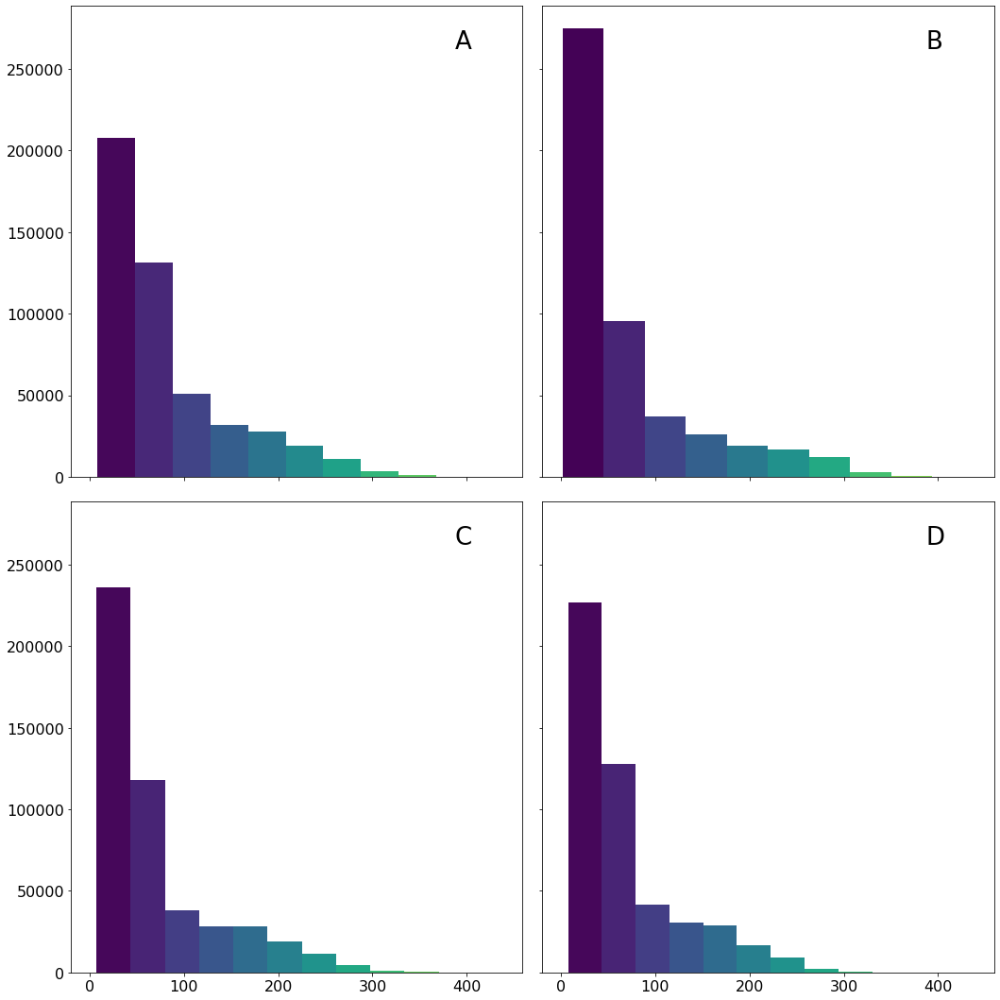

In [171]:
mpl.rcParams.update({'font.size': 16})

plt.close('all')
fig, axes = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True)
fig.set_size_inches(15,15)

# norm the values and get a colormap
norm = mpl.colors.Normalize(vmin=0, vmax=scores_df['score'].max())
cm = plt.cm.get_cmap('viridis')

annotations = ['A', 'B', 'C', 'D']
iter_ = 0
for (key, value), (i, j) in zip(chromatosomes.items(), itertools.product(range(2), range(2))):
    values = scores_df[scores_df['chr_name'] == key]['score'].values
    H, bins, patches = axes[i, j].hist(values)
    txt = axes[i, j].text(0.85, 0.95, annotations[iter_], transform=axes[i, j].transAxes, fontsize=26, verticalalignment='top', color='k')
    iter_ += 1
    
    for b, p in zip(bins, patches):
        plt.setp(p, 'facecolor', cm(norm(b)))
plt.tight_layout()

## Color sketchmap

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-248-44765339008d>:43: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2bottom.set_yticklabels([0, 0.25, 0.5, 0.75, 0.1])


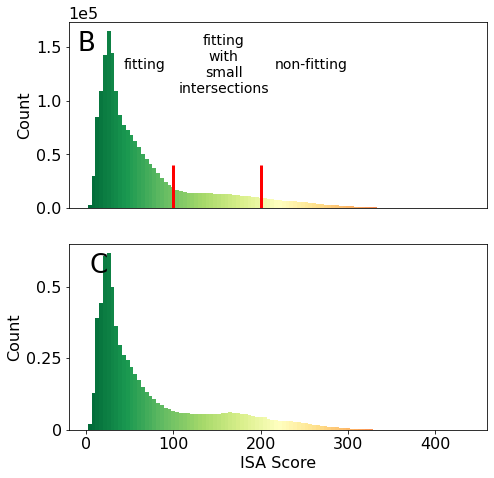

In [248]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.patches import ConnectionPatch

mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig, ax = plt.subplots(figsize=(7.5, 7.5))

# ax2 is the histogram
# get a colormap
divider = make_axes_locatable(ax)
ax2top = divider.append_axes("top", size="100%", pad=0.5)
ax2bottom = ax
norm = mpl.colors.Normalize(vmin=0, vmax=df_on_dyad['score'].max())
cm = plt.cm.get_cmap('RdYlGn_r')
# plot the hist
values = df_on_dyad['score'].values
index = np.hstack([trajs.df['cluster_membership'] >= 0 for i in range(4)])
values_clusters = df_on_dyad[index]['score'].values
H, bins, patches = ax2top.hist(values, bins=100)
# change the color
for b, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cm(norm(b)))
ax2top.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
ax2top.set_ylabel('Count')
ax2top.set_xticks([])
txt = ax2top.text(0.02, 0.95, 'B', transform=ax2top.transAxes, fontsize=26, verticalalignment='top', color='k')

# # make a vline
ax2top.vlines(100, ymin=0, ymax=40000, colors='red', linewidth=3)
ax2top.vlines(200, ymin=0, ymax=40000, colors='red', linewidth=3)
ax2top.text(0.18, 0.77, 'fitting', transform=ax2top.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')
ax2top.text(0.37, 0.77, '\n'.join(['fitting', 'with', 'small', 'intersections']), transform=ax2top.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')
ax2top.text(0.58, 0.77, 'non-fitting', transform=ax2top.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')

H, bins, patches = ax2bottom.hist(values_clusters, bins=100, range=(values.min(), values.max()))
# change the color
for b, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cm(norm(b)))
ax2bottom.set_xlabel('ISA Score')
ax2bottom.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax2bottom.set_yticklabels([0, 0.25, 0.5, 0.75, 0.1])
ax2bottom.set_ylabel('Count')
txt = ax2bottom.text(0.05, 0.95, 'C', transform=ax2bottom.transAxes, fontsize=26, verticalalignment='top', color='k')

In [31]:
UBQ_SITES = ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']

def add_ubq_site(row):
    index = [ubq_site in row for ubq_site in UBQ_SITES].index(True)
    ubq_site = UBQ_SITES[index]
    return ubq_site
    
df_on_dyad['ubq_site'] = df_on_dyad['traj_name'].apply(add_ubq_site)

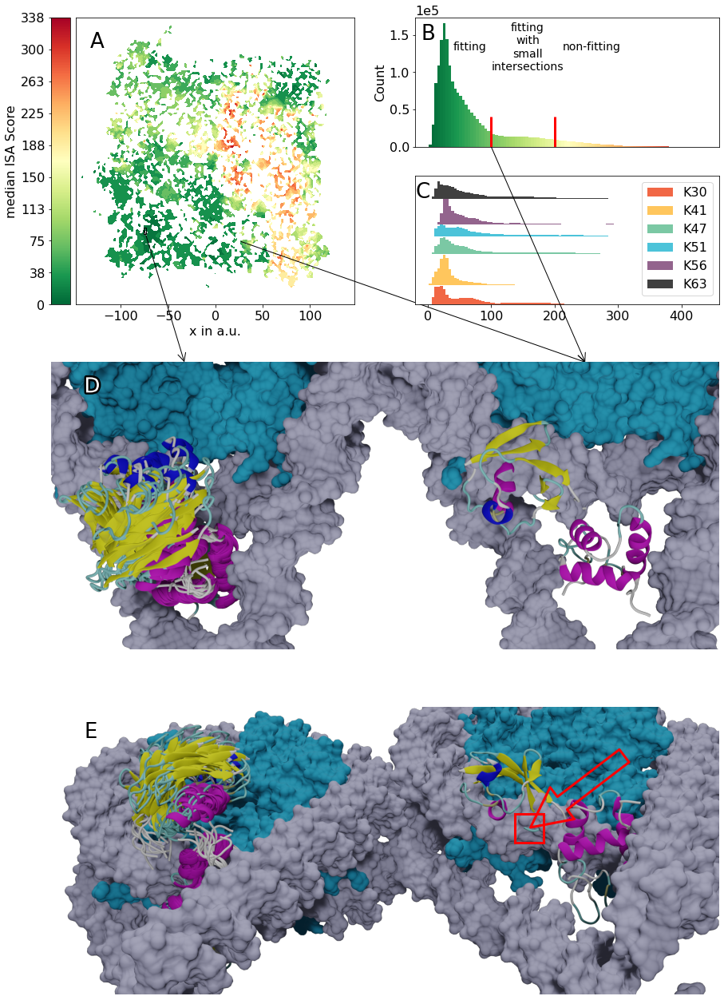

In [59]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.patches import ConnectionPatch
import matplotlib.patheffects as PathEffects

mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig = plt.figure(figsize=(15, 22.5), constrained_layout=False)
gs = fig.add_gridspec(3, 2)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 =  fig.add_subplot(gs[1,:])
ax4 = fig.add_subplot(gs[2,:])

bins = 200

# ax1 is gonna be the colored sketchmap with contourf
x = np.hstack([trajs.lowd[:,0] for i in range(4)])
y = np.hstack([trajs.lowd[:,1] for i in range(4)])

# digitize to fill bins wiht average values
digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=df_on_dyad['score'], bins=bins, statistic='median')

# some histogram plotting purposes
H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=bins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

# contourf with .T
ax1.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)

# color bar
cm = plt.cm.get_cmap('RdYlGn_r')
norm = mpl.colors.Normalize(vmin=0, vmax=df_on_dyad['score'].max())
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax1)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("left", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
ticks = np.linspace(0, 1, 10)
ticklabels = np.round(np.linspace(start=0, stop=digitized[0][~np.isnan(digitized[0])].max(), num=10)).astype(int)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ticklabels)
# remove tick length
cb.ax.yaxis.set_ticks_position('left')
cb.ax.yaxis.set_label_position("left")
# cb.ax.tick_params(axis="y", rotation=45)

txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')
cax.set_ylabel("median ISA Score")
ax1.set_xlabel('x in a.u.')
ax1.set_yticks([])

# ax2 is the histogram
# get a colormap
divider = make_axes_locatable(ax2)
ax2top = divider.append_axes("top", size="100%", pad=0.5)
ax2bottom = ax2
norm = mpl.colors.Normalize(vmin=0, vmax=df_on_dyad['score'].max())
cm = plt.cm.get_cmap('RdYlGn_r')
# plot the hist
values = df_on_dyad['score'].values
index = np.hstack([trajs.df['cluster_membership'] >= 0 for i in range(4)])
values_clusters = df_on_dyad[index]['score'].values
H, bins, patches = ax2top.hist(values, bins=100)
# change the color
for b, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cm(norm(b)))
ax2top.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
ax2top.set_ylabel('Count')
ax2top.set_xticks([])
txt = ax2top.text(0.02, 0.95, 'B', transform=ax2top.transAxes, fontsize=26, verticalalignment='top', color='k')

# make a vline
ax2top.vlines(100, ymin=0, ymax=40000, colors='red', linewidth=3)
ax2top.vlines(200, ymin=0, ymax=40000, colors='red', linewidth=3)
ax2top.text(0.18, 0.77, 'fitting', transform=ax2top.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')
ax2top.text(0.37, 0.77, '\n'.join(['fitting', 'with', 'small', 'intersections']), transform=ax2top.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')
ax2top.text(0.58, 0.77, 'non-fitting', transform=ax2top.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')

colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
for i, (color, (ubq_site, sub_df)) in enumerate(zip(colors, df_on_dyad.groupby('ubq_site'))):
    if i == 0:
        H, bins, patches = ax2bottom.hist(sub_df['score'], bins=100, range=(df_on_dyad['score'].min(), df_on_dyad['score'].max()), fc=color, label=ubq_site)
        lower = H.max() + 500
    else:
        H, bins, patches = ax2bottom.hist(sub_df['score'], bottom=lower, bins=100, range=(df_on_dyad['score'].min(), df_on_dyad['score'].max()), fc=color, label=ubq_site)
        lower += H.max() + 500
    
ax2bottom.legend()
ax2bottom.yaxis.set_visible(False)

# old stuff
# H, bins, patches = ax2bottom.hist(values_clusters, bins=100, range=(values.min(), values.max()))
# # change the color
# for b, p in zip(bins, patches):
#     plt.setp(p, 'facecolor', cm(norm(b)))
# ax2bottom.set_xlabel('ISA Score')
# ax2bottom.ticklabel_format(style='sci', axis='y', scilimits=(3, 3))
# ax2bottom.set_yticklabels([0, 0.25, 0.5, 0.75, 0.1])
ax2bottom.set_ylabel('Count')
txt = ax2bottom.text(0.0, 0.95, 'C', transform=ax2bottom.transAxes, fontsize=26, verticalalignment='top', color='k')

# some arrows
index = 254912
xy = trajs.lowd[index]
con = mpl.patches.ConnectionPatch(xyA=xy, xyB=[0.8,1], coordsA='data', coordsB='axes fraction',
                                  axesA=ax1, axesB=ax3, arrowstyle='->', mutation_scale=25)
con.set_color([0, 0, 0])
ax1.add_artist(con)
con = mpl.patches.ConnectionPatch(xyA=[100,0], xyB=[0.8,1], coordsA='data', coordsB='axes fraction',
                                  axesA=ax2top, axesB=ax3, arrowstyle='->', mutation_scale=25)
con.set_color([0, 0, 0])
ax2top.add_artist(con)

index = np.where(trajs.df['cluster_membership'].values == 500)[0]
xy = np.mean(trajs.lowd[index], axis=0)
ax1.add_patch(mpl.patches.Rectangle(trajs.lowd[index].min(axis=0), *np.ptp(trajs.lowd[index], axis=0), fill=False))
con = mpl.patches.ConnectionPatch(xyA=xy, xyB=[0.2,1], coordsA='data', coordsB='axes fraction',
                                  axesA=ax1, axesB=ax3, arrowstyle='->', mutation_scale=25)
con.set_color([0, 0, 0])
ax1.add_artist(con)
# con = mpl.patches.ConnectionPatch(xyA=[17, 0], xyB=[0.2,1], coordsA='data', coordsB='axes fraction',
#                                   axesA=ax2bottom, axesB=ax3, arrowstyle='->', mutation_scale=25)
# con.set_color([0, 0, 0])
# ax1.add_artist(con)

# ax3 is a visualization
txt = ax3.text(0.05, 0.95, 'D', transform=ax3.transAxes, fontsize=26, verticalalignment='top', color='w')
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
image = plt.imread("example_scores.png")
ax3.imshow(image)
ax3.axis('off')

# def get_ax_size(ax):
#     bbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
#     width, height = bbox.width, bbox.height
#     width *= fig.dpi
#     height *= fig.dpi
#     return width, height
# print(get_ax_size(ax3))

# ax4 is a visualization
txt = ax4.text(0.05, 0.95, 'E', transform=ax4.transAxes, fontsize=26, verticalalignment='top', color='k')
image = plt.imread("example_scores_pivot.png")
ax4.imshow(image)
ax4.add_patch(mpl.patches.Rectangle((4845, 1117), 300, 300, fc=(0, 0, 0, 0), ec='red', lw=3))
ax4.add_patch(mpl.patches.FancyArrowPatch((6000, 500), (4995, 1267), mutation_scale=100, fc=(0, 0, 0, 0), ec='red', lw=3))
ax4.axis('off')

img_name = 'scores'
living_ppt_dir = 'penetration_scoring'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")

In [40]:
df_on_dyad

,chr_name,traj_name,frame,score,ubq_site
,,,,,
0,5NL0,1GHC_K30_-100_20000,0,112.446670,K30
1,5NL0,1GHC_K30_-100_20000,1,110.231565,K30
2,5NL0,1GHC_K30_-100_20000,2,115.024846,K30
3,5NL0,1GHC_K30_-100_20000,3,124.769549,K30
4,5NL0,1GHC_K30_-100_20000,4,139.093300,K30
...,...,...,...,...,...
483978,4QLC,K63_80,396,177.935334,K63
483979,4QLC,K63_80,397,215.378697,K63
483980,4QLC,K63_80,398,199.372599,K63


/tmp/cluster_500.png
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
/tmp/cluster_34.png
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.


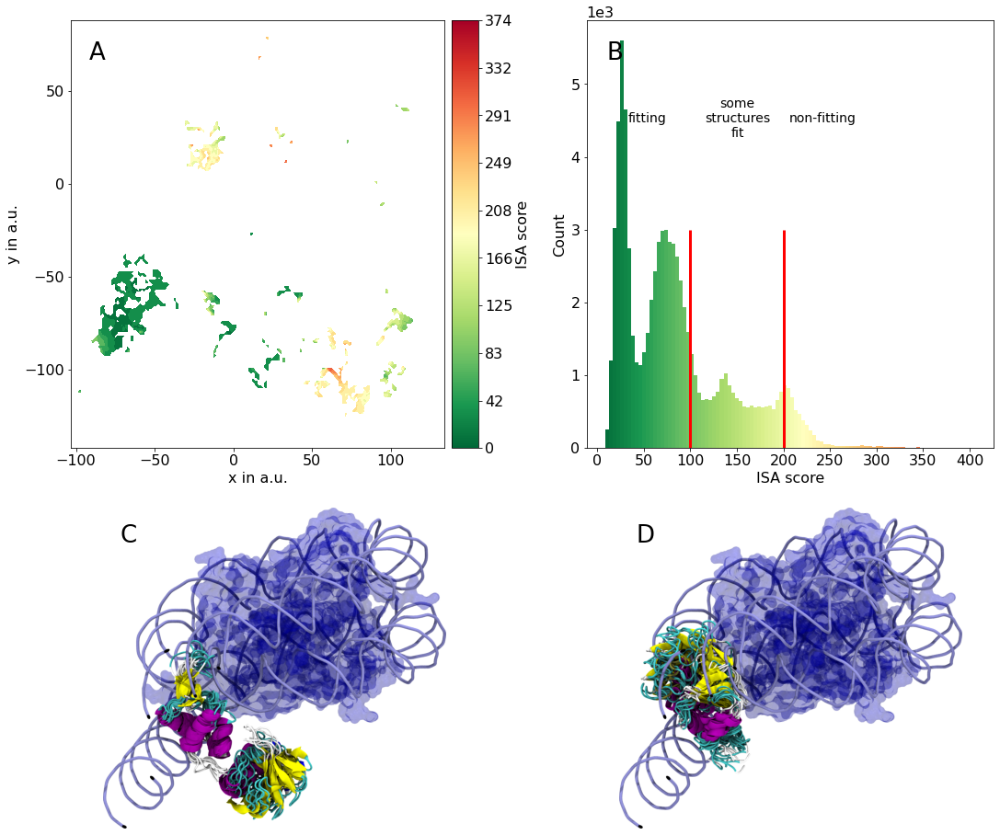

In [280]:
from string import ascii_uppercase
from encodermap.plot.plotting import render_vmd

mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig, axes = plt.subplots(ncols=2, nrows=2, gridspec_kw={'height_ratios':  [1, 0.75], 'hspace': 0.05, 'wspace': 0.15},
                                             constrained_layout=True, figsize=(15, 12.5))
((ax1, ax2), (ax3, ax4)) = axes

for ax, letter in zip(axes.flatten(), ascii_uppercase):
    txt = ax.text(0.05, 0.95, letter, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')
    
# score distribution for K30 5NL0
bins = 200
xy = trajs.df.loc[trajs.df['common_str'].str.lower().str.contains('k30'), ['x', 'y']]
scores = df_on_dyad.loc[(df_on_dyad['ubq_site'].str.lower().str.contains('k30')) & (df_on_dyad['chr_name'].str.lower().str.contains('5nl0')), 'score']

# digitize to fill bins wiht average values
digitized = scipy.stats.binned_statistic_2d(*xy.values.T, values=scores, bins=bins, statistic='median')

# some histogram plotting purposes
H, xedges, yedges = np.histogram2d(*xy.values.T, bins=bins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

# contourf with .T
ax1.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)

# color bar
cm = plt.cm.get_cmap('RdYlGn_r')
norm = mpl.colors.Normalize(vmin=0, vmax=max(scores))
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax1)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
ticks = np.linspace(0, 1, 10)
ticklabels = np.round(np.linspace(start=0, stop=digitized[0][~np.isnan(digitized[0])].max(), num=10)).astype(int)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ticklabels)
# remove tick length
# cb.ax.tick_params(axis="y", rotation=45)

cax.set_ylabel("ISA score")
ax1.set_xlabel('x in a.u.')
ax1.set_ylabel('y in a.u.')


norm = mpl.colors.Normalize(vmin=0, vmax=df_on_dyad['score'].max())
cm = plt.cm.get_cmap('RdYlGn_r')
# plot the hist
values = scores
H, bins, patches = ax2.hist(values, bins=100)
# change the color
for b, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cm(norm(b)))
ax2.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
ax2.set_ylabel('Count')
ax2.set_xlabel('ISA score')

# make a vline
ax2.vlines(100, ymin=0, ymax=3000, colors='red', linewidth=3)
ax2.vlines(200, ymin=0, ymax=3000, colors='red', linewidth=3)
str1 = '\n'.join(['fitting', 'can be', 'minimized'])
str1 = 'fitting'
str2 = '\n'.join(['some', 'structures', 'fit'])
ax2.text(0.15, 0.77, str1, transform=ax2.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')
ax2.text(0.37, 0.77, str2, transform=ax2.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')
ax2.text(0.58, 0.77, 'non-fitting', transform=ax2.transAxes, fontsize=14, verticalalignment='top', color='k', va='center', ha='center')

# render two clusters with score 0 and score 200
key = '5NL0'

lowest = df_on_dyad.loc[(df_on_dyad['ubq_site'].str.lower().str.contains('k30')) & (df_on_dyad['chr_name'].str.lower().str.contains(key.lower())), ['cluster_memberships', 'cluster_average_scores']]
lowest = lowest[lowest['cluster_memberships'] != -1.0]
lowest_cluster_value = lowest['cluster_average_scores'].min()
lowest_cluster_id = lowest.loc[lowest['cluster_average_scores'].idxmin(), 'cluster_memberships']

# save the nucleosome
index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
nucleosome = chromatosomes[key].atom_slice(index)
nucleosome.save_pdb(f'/tmp/{key}_nucleosome.pdb')

cluster_files = (f'/tmp/cluster_{lowest_cluster_id}.pdb', f'/tmp/cluster_{lowest_cluster_id}.xtc')
image_file = f'/tmp/cluster_{lowest_cluster_id}.png'
print(image_file)
if not any([os.path.isfile(f) for f in cluster_files]):
    _, cluster_traj = ep.clustering.gen_dummy_traj(trajs, lowest_cluster_id, shorten=True)
    cluster_traj = cluster_traj.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
    cluster_traj[0].save_pdb(cluster_files[0])
    cluster_traj[1:].save_xtc(cluster_files[1])
    
custom_script = f"""\
source /home/kevin/encodermap/vmd/sscache.tcl
start_sscache 0
mol load pdb {cluster_files[0]} xtc {cluster_files[1]}
mol modstyle 0 0 newcartoon 0.3 50
mol modmaterial 0 0 AOChalky
mol modcolor 0 0 structure
mol drawframes 0 0 0:1:999

mol new /tmp/{key}_nucleosome.pdb
mol addrep 1
mol modselect 0 1 protein
mol modselect 1 1 nucleic
mol modstyle 0 1 Surf
mol modstyle 1 1 Tube 0.5 15
mol modcolor 0 1 ColorID 0
mol modcolor 1 1 ColorID 15
material change opacity Opaque 0.2
mol modmaterial 1 1 AOChalky

color Display Background white
color Axes Labels black
display depthcue off
display ambientocclusion on
display aoambient 1.0
display aodirect 0.3
display antialias on
# display resize 2000 2000
axes location off
scale by 2
rotate x by -80
rotate y by 45
rotate z by 35
translate by 0 0 1
"""

def crop_image(img):
    mask = ~ np.all(img == 1, 2)
    coords = np.argwhere(mask)
    
    # bounding box of non-white pixels
    x0, y0 = coords.min(axis=0)
    x1, y1 = coords.max(axis=0) + 1
    
    cropped = img[x0:x1, y0:y1]
    return cropped

if not os.path.isfile(image_file):
    image = render_vmd(None, renderer='tachyon', custom_script=custom_script, debug=False, image_name=image_file)
else:
    image = plt.imread(image_file)
ax3.imshow(crop_image(image))
ax3.axis('off')


# render cluster close to 100
check_score = 125
sub_df = df_on_dyad.loc[(df_on_dyad['ubq_site'].str.lower().str.contains('k30')) & (df_on_dyad['chr_name'].str.lower().str.contains(key.lower())), ['cluster_memberships', 'cluster_average_scores']]
sub_df = sub_df[sub_df['cluster_memberships'] != -1.0]
closest_score_index = np.argmin(np.abs(check_score - sub_df['cluster_average_scores'].unique()))
closest_score = sub_df['cluster_average_scores'].unique()[closest_score_index]
closest_score_id = lowest.loc[sub_df['cluster_average_scores'] == closest_score, 'cluster_memberships'].unique()
assert len(closest_score_id) == 1
closest_score_id = closest_score_id[0]


cluster_files = (f'/tmp/cluster_{closest_score_id}.pdb', f'/tmp/cluster_{closest_score_id}.xtc')
image_file = f'/tmp/cluster_{closest_score_id}.png'
print(image_file)
if not any([os.path.isfile(f) for f in cluster_files]):
    _, cluster_traj = ep.clustering.gen_dummy_traj(trajs, closest_score_id, shorten=True)
    cluster_traj = cluster_traj.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
    cluster_traj[0].save_pdb(cluster_files[0])
    cluster_traj[1:].save_xtc(cluster_files[1])
    
custom_script = f"""\
source /home/kevin/encodermap/vmd/sscache.tcl
start_sscache 0
mol load pdb {cluster_files[0]} xtc {cluster_files[1]}
mol modstyle 0 0 newcartoon 0.3 50
mol modmaterial 0 0 AOChalky
mol modcolor 0 0 structure
mol drawframes 0 0 0:1:999

mol new /tmp/{key}_nucleosome.pdb
mol addrep 1
mol modselect 0 1 protein
mol modselect 1 1 nucleic
mol modstyle 0 1 Surf
mol modstyle 1 1 Tube 0.5 15
mol modcolor 0 1 ColorID 0
mol modcolor 1 1 ColorID 15
material change opacity Opaque 0.2
mol modmaterial 1 1 AOChalky

color Display Background white
color Axes Labels black
display depthcue off
display ambientocclusion on
display aoambient 1.0
display aodirect 0.3
display antialias on
# display resize 2000 2000
axes location off
scale by 2
rotate x by -80
rotate y by 45
rotate z by 35
translate by 0 0 1
"""

if not os.path.isfile(image_file):
    image = render_vmd(None, renderer='tachyon', custom_script=custom_script, debug=False, image_name=image_file)
else:
    image = plt.imread(image_file)
ax4.imshow(crop_image(image))
ax4.axis('off')

living_ppt_dir = 'penetration_scoring'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")

plt.show()

In [453]:
os.makedirs('/home/kevin/projects/paper_2019/all_K30_5NL0_clusters', exist_ok=True)
key = '5NL0'

for cluster_membership in df_on_dyad[(df_on_dyad['ubq_site'] == 'K30') & (df_on_dyad['chr_name'] == '5NL0')]['cluster_memberships'].unique():
    if cluster_membership < 0:
        continue
    else:
        print(cluster_membership)
        score_id = cluster_membership
        score = df_on_dyad[(df_on_dyad['ubq_site'] == 'K30') & (df_on_dyad['chr_name'] == '5NL0') & (df_on_dyad['cluster_memberships'] == cluster_membership)]['score'].mean().round(2)
        cluster_files = (f'/tmp/cluster_{score_id}.pdb', f'/tmp/cluster_{score_id}.xtc')
        _, cluster_traj = ep.clustering.gen_dummy_traj(trajs, score_id, shorten=True)
        cluster_traj = cluster_traj.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
        cluster_traj[0].save_pdb(cluster_files[0])
        cluster_traj[1:].save_xtc(cluster_files[1])
        
        for rotation in [(0, 0, 0), (-80, 45, 35)]:
            image_file = f'/home/kevin/projects/paper_2019/all_K30_5NL0_clusters/cluster_id_{score_id}_score_{score}_rotation_{rotation}.png'

            custom_script = f"""\
            source /home/kevin/encodermap/vmd/sscache.tcl
            start_sscache 0
            mol load pdb {cluster_files[0]} xtc {cluster_files[1]}
            mol modstyle 0 0 newcartoon 0.3 50
            mol modmaterial 0 0 AOChalky
            mol modcolor 0 0 structure
            mol drawframes 0 0 0:1:999

            mol new /tmp/{key}_nucleosome.pdb
            mol addrep 1
            mol modselect 0 1 protein
            mol modselect 1 1 nucleic
            mol modstyle 0 1 Surf
            mol modstyle 1 1 Tube 0.5 15
            mol modcolor 0 1 ColorID 0
            mol modcolor 1 1 ColorID 15
            material change opacity Opaque 0.2
            mol modmaterial 1 1 AOChalky

            color Display Background white
            color Axes Labels black
            display depthcue off
            display ambientocclusion on
            display aoambient 1.0
            display aodirect 0.3
            display antialias on
            # display resize 2000 2000
            axes location off
            scale by 2
            rotate x by {rotation[0]}
            rotate y by {rotation[1]}
            rotate z by {rotation[2]}
            translate by 0 0 1
            """

            if not os.path.isfile(image_file):
                image = render_vmd(None, renderer='tachyon', custom_script=custom_script, debug=False, image_name=image_file)

173
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
251
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
748
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encoderma

/home/kevin/.conda/envs/py39_tf2/lib/python3.9/subprocess.py:1052: ResourceWarning: subprocess 2458963 is still running
  _warn("subprocess %s is still running" % self.pid,
/home/kevin/.conda/envs/py39_tf2/lib/python3.9/site-packages/mdtraj/core/topology.py:1692: ResourceWarning: unclosed file <_io.BufferedReader name=78>
  bond.type = type
/home/kevin/.conda/envs/py39_tf2/lib/python3.9/site-packages/mdtraj/core/topology.py:1692: ResourceWarning: unclosed file <_io.BufferedReader name=80>
  bond.type = type
/home/kevin/.conda/envs/py39_tf2/lib/python3.9/subprocess.py:1052: ResourceWarning: subprocess 2467157 is still running
  _warn("subprocess %s is still running" % self.pid,
/home/kevin/.conda/envs/py39_tf2/lib/python3.9/subprocess.py:1052: ResourceWarning: subprocess 2483467 is still running
  _warn("subprocess %s is still running" % self.pid,
/home/kevin/.conda/envs/py39_tf2/lib/python3.9/site-packages/mdtraj/core/topology.py:1692: ResourceWarning: unclosed file <_io.BufferedReader

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
374
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
394
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
36
Provide

46
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
7
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
765
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/v

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
65
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
94
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
95
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/v

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
5
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
483
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
71
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/v

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
855
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
2151
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
1
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
2018
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
456
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
2031
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encoder

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
866
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
316
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
361
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encoderma

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
1733
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
457
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
458
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encoderm

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
883
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
323
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
560
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
For the ssupdate function to work encoderma

For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.


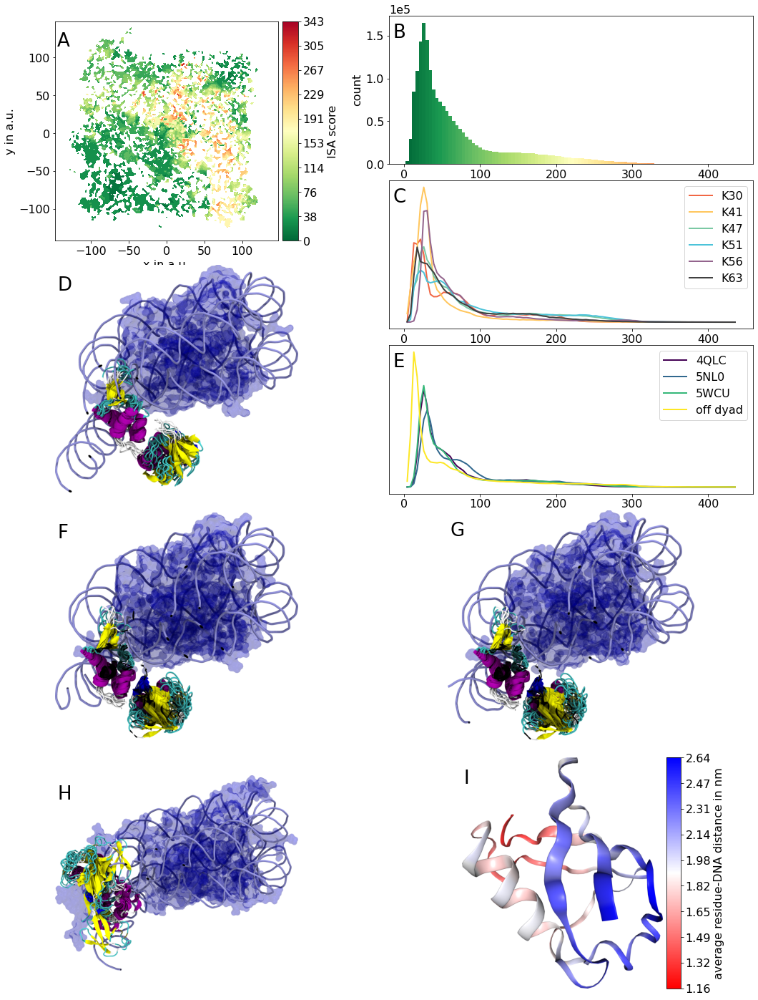

In [542]:
from string import ascii_uppercase
from encodermap.plot.plotting import render_vmd

mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig = plt.figure(figsize=(17.5, 25))

gs = mpl.gridspec.GridSpec(nrows=12, ncols=2, hspace=0.25, wspace=0.3, width_ratios=[1, 1.5])

ax1 = fig.add_subplot(gs[:3, 0])
ax1.set_aspect('equal')
ax2 = fig.add_subplot(gs[:2, 1])
ax3 = fig.add_subplot(gs[2:4, 1], sharex=ax2)
ax4 = fig.add_subplot(gs[3:6, 0])
ax5 = fig.add_subplot(gs[4:6, 1], sharex=ax2)
ax6 = fig.add_subplot(gs[6:9, 0])
ax7 = fig.add_subplot(gs[6:9, 1])
ax8 = fig.add_subplot(gs[9:, 0])
ax9 = fig.add_subplot(gs[9:, 1])

axes = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9]

for ax, letter in zip(axes, ascii_uppercase):
    txt = ax.text(0.01, 0.95, letter, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')
    
# ax1 is gonna be the colored sketchmap with contourf
x = np.hstack([trajs.lowd[:,0] for i in range(4)])
y = np.hstack([trajs.lowd[:,1] for i in range(4)])

# digitize to fill bins wiht average values
bins = 200
digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=df_on_dyad['score'], bins=bins, statistic='median')

# some histogram plotting purposes
H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=bins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

# contourf with .T
ax1.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)

# color bar
cm = plt.cm.get_cmap('RdYlGn_r')
norm = mpl.colors.Normalize(vmin=0, vmax=max(scores))
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax1)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
ticks = np.linspace(0, 1, 10)
ticklabels = np.round(np.linspace(start=0, stop=digitized[0][~np.isnan(digitized[0])].max(), num=10)).astype(int)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ticklabels)
# remove tick length
# cb.ax.tick_params(axis="y", rotation=45)

cax.set_ylabel("ISA score")
ax1.set_xlabel('x in a.u.')
ax1.set_ylabel('y in a.u.')

# ax2 is the histogram
# get a colormap
norm = mpl.colors.Normalize(vmin=0, vmax=df_on_dyad['score'].max())
cm = plt.cm.get_cmap('RdYlGn_r')
# plot the hist
values = df_on_dyad['score'].values
index = np.hstack([trajs.df['cluster_membership'] >= 0 for i in range(4)])
values_clusters = df_on_dyad[index]['score'].values
H, bins, patches = ax2.hist(values, bins=100)
# change the color
for b, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cm(norm(b)))
ax2.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
ax2.set_ylabel('count')
ax2.set_xlabel('ISA score')

# per ubq-site
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
for i, (color, (ubq_site, sub_df)) in enumerate(zip(colors, df_on_dyad.groupby('ubq_site'))):
    H, bins = np.histogram(sub_df['score'].values, bins=100, range=(df_on_dyad['score'].min(), df_on_dyad['score'].max()))
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    ax3.plot(bin_centers, H, c=color, label=ubq_site, lw=2)
#     if i == 0:
#         H, bins, patches = ax3.hist(sub_df['score'], bins=100, range=(df_on_dyad['score'].min(), df_on_dyad['score'].max()), fc=color, label=ubq_site)
#         lower = H.max() + 500
#     else:
#         H, bins, patches = ax3.hist(sub_df['score'], bottom=lower, bins=100, range=(df_on_dyad['score'].min(), df_on_dyad['score'].max()), fc=color, label=ubq_site)
#         lower += H.max() + 500
    
ax3.legend()
ax3.yaxis.set_visible(False)
ax3.set_ylabel('count')
ax3.set_xlabel('ISA score')


# per core
no_of_cores = len(np.unique(df_on_dyad['chr_name']))
colors = mpl.cm.get_cmap('viridis')(np.linspace(0, 1, no_of_cores))
# colors = mpl.cm.get_cmap('tab10')(np.arange(no_of_cores))
for i, (color, (chr_name, sub_df)) in enumerate(zip(colors, df_on_dyad.groupby('chr_name'))):
    if chr_name == 'Bai':
        chr_name = 'off dyad'
    H, bins = np.histogram(sub_df['score'].values, bins=100, range=(df_on_dyad['score'].min(), df_on_dyad['score'].max()))
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    ax5.plot(bin_centers, H, c=color, label=chr_name, lw=2)
#     if i == 0:
#         H, bins, patches = ax5.hist(sub_df['score'], bins=100, range=(df_on_dyad['score'].min(), df_on_dyad['score'].max()), fc=color, label=chr_name)
#         lower = H.max() + 800
#     else:
#         H, bins, patches = ax5.hist(sub_df['score'], bottom=lower, bins=100, range=(df_on_dyad['score'].min(), df_on_dyad['score'].max()), fc=color, label=chr_name)
#         lower += H.max() + 800
    
ax5.legend()
ax5.yaxis.set_visible(False)
ax5.set_ylabel('count')
ax5.set_xlabel('ISA score')

for ax, chr_name in zip([ax4, ax6, ax7, ax8], ['5NL0', '5WCU', '4QLC', 'Bai']):
    # render two clusters with score 0 and score 200
    key = chr_name

    sub_df = df_on_dyad.loc[df_on_dyad['chr_name'].str.lower().str.contains(key.lower()), ['cluster_memberships', 'cluster_average_scores']]
    sub_df = sub_df[sub_df['cluster_memberships'] != -1.0]
    lowest_cluster_value = sub_df['cluster_average_scores'].min()
    lowest_cluster_id = sub_df.loc[sub_df['cluster_average_scores'].idxmin(), 'cluster_memberships']

    # save the nucleosome
    index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
    nucleosome = chromatosomes[key].atom_slice(index)
    nucleosome.save_pdb(f'/tmp/{key}_nucleosome.pdb')

    cluster_files = (f'/tmp/cluster_{lowest_cluster_id}.pdb', f'/tmp/cluster_{lowest_cluster_id}.xtc')
    image_file = f'/tmp/cluster_{lowest_cluster_id}_{chr_name}.png'
    
    if not any([os.path.isfile(f) for f in cluster_files]):
        _, cluster_traj = ep.clustering.gen_dummy_traj(trajs, lowest_cluster_id, shorten=True)
        cluster_traj = cluster_traj.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atoscores_m_indices=chr_CA[key])
        cluster_traj[0].save_pdb(cluster_files[0])
        cluster_traj[1:].save_xtc(cluster_files[1])

    custom_script = f"""\
source /home/kevin/encodermap/vmd/sscache.tcl
start_sscache 0
mol load pdb {cluster_files[0]} xtc {cluster_files[1]}
mol modstyle 0 0 newcartoon 0.3 50
mol modmaterial 0 0 AOChalky
mol modcolor 0 0 structure
mol drawframes 0 0 0:1:999

mol new /tmp/{key}_nucleosome.pdb
mol addrep 1
mol modselect 0 1 protein
mol modselect 1 1 nucleic
mol modstyle 0 1 Surf
mol modstyle 1 1 Tube 0.5 15
mol modcolor 0 1 ColorID 0
mol modcolor 1 1 ColorID 15
material change opacity Opaque 0.2
mol modmaterial 1 1 AOChalky

color Display Background white
color Axes Labels black
display depthcue off
display ambientocclusion on
display aoambient 1.0
display aodirect 0.3
display antialias on
# display resize 2000 2000
axes location off
scale by 2
rotate x by -80
rotate y by 45
rotate z by 35
translate by 0 0 1
"""

    if not os.path.isfile(image_file):
        image = render_vmd(None, renderer='tachyon', custom_script=custom_script, debug=False, image_name=image_file)
    else:
        image = plt.imread(image_file)
    ax.imshow(crop_image(image))
    ax.axis('off')
    

img = plt.imread('/home/kevin/projects/living_ppt/ubq_ca_closeness.png')
ax9.imshow(crop_image(img))
ax9.axis('off')
    
UBQ_CA_closeness = np.load('UBQ_CA_closeness.npy')
closeness_means = np.mean(UBQ_CA_closeness, axis=0)[1:]

# color bar
cm = plt.cm.get_cmap('bwr_r')
norm = mpl.colors.Normalize(vmin=0, vmax=max(closeness_means))
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax9)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
ticks = np.linspace(0, 1, 10)
ticklabels = np.round(np.linspace(start=closeness_means.min(), stop=closeness_means.max(), num=10), 2)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ticklabels)
# remove tick length
# cb.ax.tick_params(axis="y", rotation=45)
cax.set_ylabel("average residue-DNA distance in nm")

img_name = 'scores_all'
living_ppt_dir = 'penetration_scoring'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")
    
plt.show()

In [216]:
df_on_dyad

,chr_name,traj_name,frame,score,ubq_site,cluster_average_scores,cluster_memberships
,,,,,,,
0,5NL0,1GHC_K30_-100_20000,0,112.446670,K30,-1.0,-1
1,5NL0,1GHC_K30_-100_20000,1,110.231565,K30,-1.0,-1
2,5NL0,1GHC_K30_-100_20000,2,115.024846,K30,-1.0,-1
3,5NL0,1GHC_K30_-100_20000,3,124.769549,K30,-1.0,-1
4,5NL0,1GHC_K30_-100_20000,4,139.093300,K30,-1.0,-1
...,...,...,...,...,...,...,...
483978,4QLC,K63_80,396,177.935334,K63,-1.0,-1
483979,4QLC,K63_80,397,215.378697,K63,-1.0,-1
483980,4QLC,K63_80,398,199.372599,K63,-1.0,-1


## Decide on sensible cutoffs

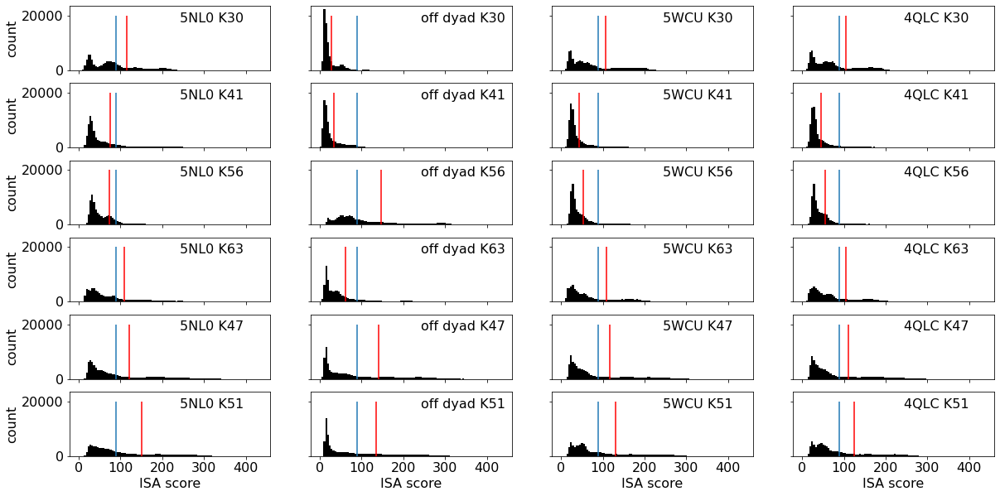

In [480]:
plt.close('all')

fig, axes = plt.subplots(nrows=6, ncols=4, sharex=True, sharey=True, figsize=(20, 10))

for i, ubq_site in enumerate(df_on_dyad['ubq_site'].unique()):
    for j, chr_name in enumerate(df_on_dyad['chr_name'].unique()):
        values = df_on_dyad[(df_on_dyad['chr_name'] == chr_name) & (df_on_dyad['ubq_site'] == ubq_site)]['score'].values
        percentile = np.percentile(values, 75)
        ax = axes[i, j]
        ax.hist(values, bins=100, range=(0, df_on_dyad['score'].max()), color='k')
        if chr_name == 'Bai':
            chr_name = 'off dyad'
        ax.text(0.55, 0.75, chr_name + ' ' + ubq_site, transform=ax.transAxes)
        ax.vlines(percentile, 0, 20000, color='red')
        ax.vlines(np.percentile(df_on_dyad['score'].values, 75), 0, 20000, color='C0')
        if i == 5:
            ax.set_xlabel('ISA score')
        if j == 0:
            ax.set_ylabel('count')
        
plt.show()

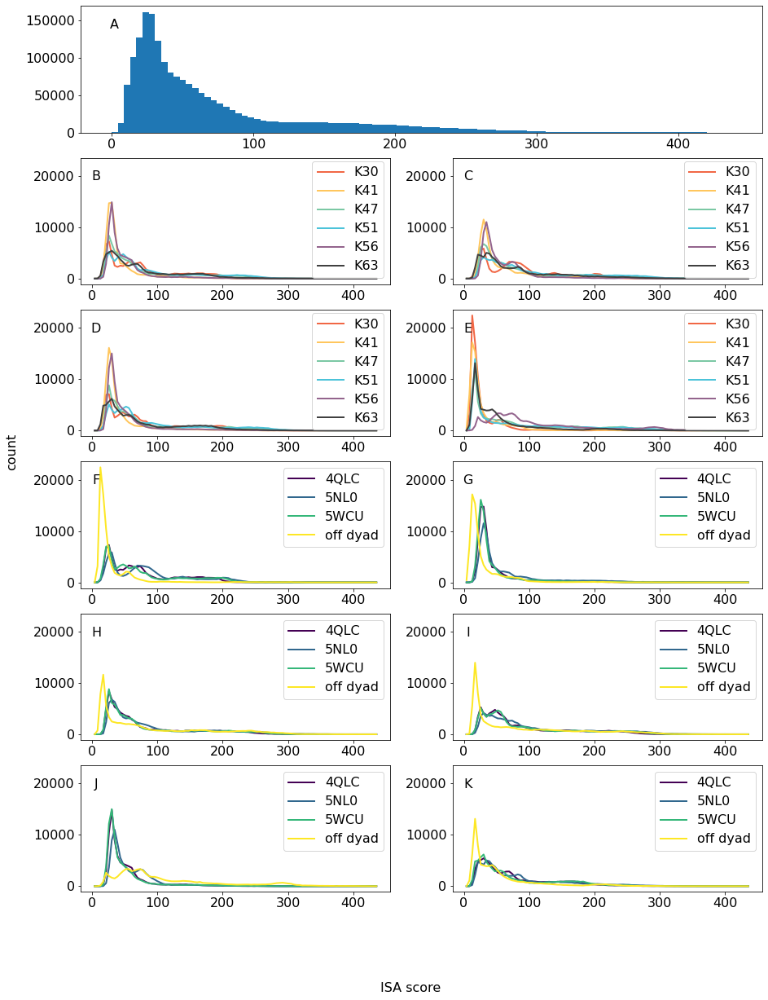

In [551]:
plt.close('all')

fig = plt.figure(figsize=(15, 20))

gs = mpl.gridspec.GridSpec(nrows=6, ncols=2)

ax_all = fig.add_subplot(gs[0, :])

ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1], sharey=ax1)
ax3 = fig.add_subplot(gs[2, 0], sharey=ax1)
ax4 = fig.add_subplot(gs[2, 1], sharey=ax1)
chr_axes = [ax1, ax2, ax3, ax4]

ax5 = fig.add_subplot(gs[3, 0])
ax6 = fig.add_subplot(gs[3, 1], sharey=ax5)
ax7 = fig.add_subplot(gs[4, 0], sharey=ax5)
ax8 = fig.add_subplot(gs[4, 1], sharey=ax5)
ax9 = fig.add_subplot(gs[5, 0], sharey=ax5)
ax10 = fig.add_subplot(gs[5, 1], sharey=ax5)
ubq_axes = [ax5, ax6, ax7, ax8, ax9, ax10]

all_axes = [ax_all, *chr_axes, *ubq_axes]
for ax, lbl in zip(all_axes, ascii_uppercase):
    ax.text(0.05, 0.85, lbl, va='center', ha='center', transform=ax.transAxes)

max_all = df_on_dyad['score'].max()
min_all = 0
range_all = (min_all, max_all)

_ = ax_all.hist(df_on_dyad['score'].values, bins=100, range=range_all)

for ax, (chr_name, values) in zip(chr_axes, df_on_dyad.groupby('chr_name')):
    if chr_name == 'Bai':
        chr_name = 'off dyad'
    # ax.text(0.55, 0.90, chr_name, transform=ax.transAxes, va='center', ha='center')
    colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
    for color, (ubq_site, values) in zip(colors, values.groupby('ubq_site')):
        H, edges = np.histogram(values['score'], bins=100, range=range_all)
        bin_centers = 0.5 * (bins[1:] + bins[:-1])
        ax.plot(bin_centers, H, c=color, label=ubq_site, lw=2)
        percentile = np.percentile(values['score'].values, 75)
#         ax.vlines(percentile, 0, 20000, color='red')
#         ax.vlines(np.percentile(df_on_dyad['score'].values, 75), 0, 20000, color='C0')
    ax.legend()
    ax.set
    
    
for ax, (ubq_site, values) in zip(ubq_axes, df_on_dyad.groupby('ubq_site')):
    # ax.text(0.55, 0.90, ubq_site, transform=ax.transAxes, va='center', ha='center')
    no_of_cores = len(np.unique(df_on_dyad['chr_name']))
    colors = mpl.cm.get_cmap('viridis')(np.linspace(0, 1, no_of_cores))
    for color, (chr_name, values) in zip(colors, values.groupby('chr_name')):
        if chr_name == 'Bai':
            chr_name = 'off dyad'
        H, edges = np.histogram(values['score'], bins=100, range=range_all)
        bin_centers = 0.5 * (bins[1:] + bins[:-1])
        ax.plot(bin_centers, H, c=color, label=chr_name, lw=2)
        percentile = np.percentile(values['score'].values, 75)
#         ax.vlines(percentile, 0, 20000, color='red')
#         ax.vlines(np.percentile(df_on_dyad['score'].values, 75), 0, 20000, color='C0')
    ax.legend()
    
    
fig.text(0.5, 0.04, 'ISA score', ha='center')
fig.text(0.04, 0.5, 'count', va='center', rotation='vertical')



img_name = 'scores_comparison_all'
living_ppt_dir = 'penetration_scoring'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")

## Summarize clusters and UBQ_site

- For every cluster percent uf UBQ site
- For every ubq site the percentage of free and clustered structures

In [65]:
if len(dummy_traj) > 500:
    idx = np.round(np.linspace(0, len(dummy_traj) - 1, 500)).astype(int)
    atom_indices = [a.index for a in traj.topology.atoms if a.element.symbol != 'H']
    distances = np.empty((dummy_traj[idx].n_frames, dummy_traj[idx].n_frames))
    for i in range(dummy_traj[idx].n_frames):
        distances[i] = md.rmsd(dummy_traj[idx], dummy_traj[idx], i, atom_indices=atom_indices)
    beta = 1
    centroid_index = idx[np.exp(-beta*distances / distances.std()).sum(axis=1).argmax()]
else:
    atom_indices = [a.index for a in traj.topology.atoms if a.element.symbol != 'H']
    distances = np.empty((dummy_traj.n_frames, dummy_traj.n_frames))
    for i in range(dummy_traj.n_frames):
        distances[i] = md.rmsd(dummy_traj, dummy_traj, i, atom_indices=atom_indices)
    beta = 1
    centroid_index = np.exp(-beta*distances / distances.std()).sum(axis=1).argmax()
    
centroid = dummy_traj[centroid_index]
rmsd = md.rmsd(dummy_traj, centroid)

<mdtraj.Trajectory with 500 frames, 1452 atoms, 151 residues, and unitcells at 0x7fa05f1e5520>

In [70]:
per_cluster_rmsd_copy = copy.deepcopy(per_cluster_rmsd)

In [396]:
UBQ_SITES = ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']

out_df = pd.DataFrame({}, columns=['cluster size'] + [f'% {i}' for i in UBQ_SITES])
out_df.index.name = 'cluster num'

def matcher(x):
    for i in UBQ_SITES:
        if i.lower() in x.lower():
            return i
    else:
        return np.nan
    
    
overwrite = True
    
    
if 'per_cluster_rmsd' not in globals() or overwrite:
    if not os.path.isfile('per_cluster_rmsd.npy') or overwrite:
        if 'per_cluster_rmsd' not in globals() or overwrite:
            per_cluster_rmsd = []
        for cluster_num in np.unique(trajs.df['cluster_membership']):
            if cluster_num <= -1:
                continue
            if len(per_cluster_rmsd) > 0:
                if cluster_num in np.array(per_cluster_rmsd)[:, 0] and not overwrite:
                    print(f"Cluster {cluster_num} already there.")
                    continue
            print(cluster_num)
            _, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_num)
            
            # gte the centroid
            if len(dummy_traj) > 500:
                idx = np.round(np.linspace(0, len(dummy_traj) - 1, 500)).astype(int)
                atom_indices = [a.index for a in dummy_traj.topology.atoms if a.element.symbol != 'H']
                distances = np.empty((dummy_traj[idx].n_frames, dummy_traj[idx].n_frames))
                for i in range(dummy_traj[idx].n_frames):
                    distances[i] = md.rmsd(dummy_traj[idx], dummy_traj[idx], i, atom_indices=atom_indices)
                beta = 1
                centroid_index = idx[np.exp(-beta*distances / distances.std()).sum(axis=1).argmax()]
            else:
                atom_indices = [a.index for a in dummy_traj.topology.atoms if a.element.symbol != 'H']
                distances = np.empty((dummy_traj.n_frames, dummy_traj.n_frames))
                for i in range(dummy_traj.n_frames):
                    distances[i] = md.rmsd(dummy_traj, dummy_traj, i, atom_indices=atom_indices)
                beta = 1
                centroid_index = np.exp(-beta*distances / distances.std()).sum(axis=1).argmax()

            centroid = dummy_traj[centroid_index]
            rmsd = md.rmsd(dummy_traj, centroid)
            mean_rmsd = np.mean(rmsd)
            var_rmsd = np.std(rmsd)
            
            # decide whether ubq points up or down in 5NL0
            key = '5NL0'
            stacked = chromatosomes[key]
            index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
            stacked = chromatosomes[key].atom_slice(index)
            to_superpose = dummy_traj
            superposed = to_superpose.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
            
            # get the cogs
            cog_H5 = np.mean(superposed.xyz[:, superposed.top.select('resid 76 to 152 and name CA')[:, np.newaxis], 2])
            cog_Ub = np.mean(superposed.xyz[:, superposed.top.select('resid 0 to 75 and name CA')[:, np.newaxis], 2])
            
            if cog_Ub < cog_H5:
                lower = 0
            else:
                lower = 1
            
            # append
            per_cluster_rmsd.append([cluster_num, mean_rmsd, var_rmsd, lower])
            
        per_cluster_rmsd = np.array(per_cluster_rmsd)
        np.save('per_cluster_rmsd.npy', per_cluster_rmsd)
        print(per_cluster_rmsd)
        print(per_cluster_rmsd.shape)
        
            
    else:
        per_cluster_rmsd = np.load('per_cluster_rmsd.npy')

for cluster_num, sub_df in trajs.df.groupby('cluster_membership'):
    if cluster_num <= -1:
        continue
    matched = pd.value_counts(sub_df['traj_name'].apply(matcher))
    percentages = matched / sum(matched.values) * 100
    percentages = percentages.apply('{:.1f}'.format)
    percentages.index = percentages.index.map(lambda x: f'% {x}')
    ensemble_percent = sum(matched.values) / trajs.n_frames * 100
    scores = df_on_dyad[(df_on_dyad['traj_name'].isin(sub_df['traj_name'])) & (df_on_dyad['frame'].isin(sub_df['traj_frame']))]['score'].values
    data = {'cluster size': sum(matched.values), '% of combined ensemble': ensemble_percent, 'μ ISA score': np.mean(scores), 'σ ISA score': np.std(scores)}
    new_series = pd.Series(data=dict(data, **percentages))
    new_series.name = cluster_num
    out_df = out_df.append(new_series)
    
rmsd_df = pd.DataFrame(per_cluster_rmsd, columns=['cluster num', 'μ internal rmsd in nm', 'σ internal rmsd in nm']).astype({'cluster num': int, 'μ internal rmsd in nm': float, 'σ² internal rmsd in nm': float})
# rmsd_df = pd.DataFrame(per_cluster_rmsd, columns=['cluster num', 'μ internal rmsd in nm']).astype({'cluster num': int, 'μ internal rmsd in nm': float})
rmsd_df = rmsd_df.set_index('cluster num')
out_df = out_df.merge(rmsd_df, how='outer', left_index=True, right_index=True)
out_df = out_df.sort_values(by='cluster size', ascending=False)
out_df = out_df.reset_index(drop=False)
out_df.index.name = 'cluster num by count'
out_df = out_df.rename(columns={'cluster num': 'hdbscan id'})
cluster_linkage_score_df = out_df.copy()

0
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
2
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
3
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
4
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
5
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
6
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
7
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
8
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
9
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
10
Provided alignment string r

84
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
85
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
86
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
87
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
88
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
89
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
90
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
91
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
92
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
93
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
94
Provided alignmen

167
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
168
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
169
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
170
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
171
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
172
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
173
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
174
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
175
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
176
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
177
Provid

250
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
251
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
252
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
253
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
254
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
255
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
256
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
257
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
258
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
259
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
260
Provid

333
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
334
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
335
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
336
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
337
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
338
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
339
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
340
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
341
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
342
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
343
Provid

416
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
417
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
418
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
419
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
420
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
421
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
422
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
423
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
424
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
425
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
426
Provid

566
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
571
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
574
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
576
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
577
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
578
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
582
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
584
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
588
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
592
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
593
Provid

743
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
747
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
748
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
749
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
750
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
752
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
758
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
765
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
767
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
768
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
769
Provid

1322
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1337
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1344
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1369
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1391
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1419
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1422
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1438
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1441
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
1444
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.


ValueError: Shape of passed values is (707, 4), indices imply (707, 3)

In [108]:
latex_df = out_df.copy()
latex_df.index += 1
latex_df = latex_df[:50]
formatters = {'μ internal rmsd in nm': '{:.2f}',
              'σ² internal rmsd in nm': '{:.2f}',
              'μ ISA score': '{:.2f}',
              'σ² ISA score': '{:.2f}',
              '% of combined ensemble': '{:.2f}'
             }
for key, value in formatters.items():
    latex_df[key] = latex_df[key].apply(value.format)
print(latex_df.to_latex(na_rep=''))

\begin{tabular}{lllllllllllll}
\toprule
{} & cluster size &  \% K30 &  \% K41 &  \% K47 &  \% K51 &  \% K56 &  \% K63 & \% of combined ensemble & μ ISA score & σ² ISA score & μ internal rmsd in nm & σ² internal rmsd in nm \\
cluster num by count &              &        &        &        &        &        &        &                        &             &              &                       &                        \\
\midrule
1                    &         3272 &  100.0 &        &        &        &        &        &                   0.68 &       24.95 &       474.99 &                  0.26 &                   0.00 \\
2                    &         2691 &    0.6 &        &        &        &        &   99.4 &                   0.56 &       85.23 &      3515.08 &                  0.37 &                   0.01 \\
3                    &         2417 &  100.0 &        &        &        &        &        &                   0.50 &       26.17 &      1259.38 &                  0.42 &         

In [81]:
styled_df = out_df.drop('hdbscan id')
styled_df = styled_df.style.set_na_rep("")\
                        .format('{:.2f}', subset=['μ internal rmsd in nm', 'σ² internal rmsd in nm', 'μ ISA score', 'σ² ISA score'])\
                        .format('{:.2f}%', subset='% of combined ensemble')
styled_df

,cluster size,k30,k41,k47,k51,k56,k63,% of combined ensemble,μ ISA score,σ² ISA score,μ internal rmsd in nm,σ² internal rmsd in nm
cluster num by count,,,,,,,,,,,,
0,3272,100.0%,,,,,,0.68%,24.95,474.99,0.26,0.00
1,2691,0.6%,,,,,99.4%,0.56%,85.23,3515.08,0.37,0.01
2,2417,100.0%,,,,,,0.50%,26.17,1259.38,0.42,0.02
3,2168,,100.0%,,,,,0.45%,51.81,2651.51,0.56,0.13
4,1756,100.0%,,,,,,0.36%,22.56,42.25,0.26,0.00
5,1568,,100.0%,,,,,0.32%,30.28,253.89,0.45,0.05
6,1466,,,,100.0%,,,0.30%,158.32,8161.70,0.36,0.01
7,1434,,,,100.0%,,,0.30%,58.29,472.38,0.28,0.00
8,1383,0.1%,,,0.4%,,99.4%,0.29%,117.28,2219.93,0.32,0.01


**Now per UBQ site**

In [552]:
out_df = pd.DataFrame({}, columns=['total frames', 'frames in clusters', '% clustered', '% not clustered'])
out_df.index.name = 'ubq site'

for ubq_site, sub_df in trajs.df.groupby('common_str'):
    total_frames = len(sub_df)
    frames_in_cluster = pd.value_counts(sub_df['cluster_membership'] >= 0)[True]
    data = {'total frames': total_frames, 'frames in clusters': frames_in_cluster}
    data['% clustered'] = '{:.2f}'.format(frames_in_cluster / total_frames * 100)
    data['% not clustered'] = '{:.2f}'.format(100 - (frames_in_cluster / total_frames * 100))
    for chr_name in df_on_dyad['chr_name'].unique():
        scores = df_on_dyad[(df_on_dyad['chr_name'] == chr_name) & (df_on_dyad['traj_name'].isin(sub_df['traj_name']))]['score']
        if chr_name == 'Bai':
            chr_name = 'off dyad'
        data[f'μ ISA scores {chr_name}'] = np.round(scores.mean(), 2)
        data[f'σ ISA scores {chr_name}'] = np.round(scores.std(), 2)
    scores = df_on_dyad[df_on_dyad['traj_name'].isin(sub_df['traj_name'])]['score']
    data[f'μ ISA scores all'] = np.round(scores.mean(), 2)
    data[f'σ ISA scores all'] = np.round(scores.std(), 2)
    new_series = pd.Series(data=data)
    new_series.name = ubq_site
    out_df = out_df.append(new_series)
out_df

,total frames,frames in clusters,% clustered,% not clustered,μ ISA scores 4QLC,μ ISA scores 5NL0,μ ISA scores 5WCU,μ ISA scores all,μ ISA scores off dyad,σ ISA scores 4QLC,σ ISA scores 5NL0,σ ISA scores 5WCU,σ ISA scores all,σ ISA scores off dyad
ubq site,,,,,,,,,,,,,,
K30,79398,28346,35.70,64.30,74.46,85.44,75.17,65.87,28.39,53.67,59.49,57.94,57.16,36.67
K41,79398,23355,29.42,70.58,43.42,65.70,43.34,45.67,30.23,35.77,61.16,37.99,45.74,35.44
K47,84198,26095,30.99,69.01,79.42,89.12,82.36,84.21,85.92,65.46,72.67,70.21,73.13,82.73
K51,82193,41761,50.81,49.19,88.47,104.30,93.22,92.72,84.88,67.73,77.87,73.52,75.93,82.43
K56,79398,7867,9.91,90.09,48.94,58.94,48.82,66.99,111.26,35.29,39.51,39.18,58.64,82.06
K63,79398,15799,19.90,80.10,74.76,81.84,74.68,71.01,52.74,57.17,64.86,61.30,60.46,53.95


In [553]:
print(out_df.to_latex())

\begin{tabular}{lllllrrrrrrrrrr}
\toprule
{} & total frames & frames in clusters & \% clustered & \% not clustered &  μ ISA scores 4QLC &  μ ISA scores 5NL0 &  μ ISA scores 5WCU &  μ ISA scores all &  μ ISA scores off dyad &  σ ISA scores 4QLC &  σ ISA scores 5NL0 &  σ ISA scores 5WCU &  σ ISA scores all &  σ ISA scores off dyad \\
ubq site &              &                    &             &                 &                    &                    &                    &                   &                        &                    &                    &                    &                   &                        \\
\midrule
K30      &        79398 &              28346 &       35.70 &           64.30 &              74.46 &              85.44 &              75.17 &             65.87 &                  28.39 &              53.67 &              59.49 &              57.94 &             57.16 &                  36.67 \\
K41      &        79398 &              23355 &       29.42 &     

## Render Clusters

Best fitting cluster that contains 90% of a specific linkage and put it into the parent chromatosome

In [31]:
from encodermap.plot.plotting import render_vmd

Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
<mdtraj.Trajectory with 1 frames, 13953 atoms, 1146 residues, and unitcells>
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
<mdtraj.Trajectory with 1 frames, 13953 atoms, 1146 residues, and unitcells>
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS151-CA.
<mdtraj.Trajectory with 1 frames, 13953 atoms, 1146 residues, and unitcells>
For the ssupdate function to work encodermap/vmd/sscache.tcl will be sourced within vmd. If no Error is thrown the file is present.
Provided alignment string results in 151 atoms. First atom is MET1-CA. Last atom is LYS1

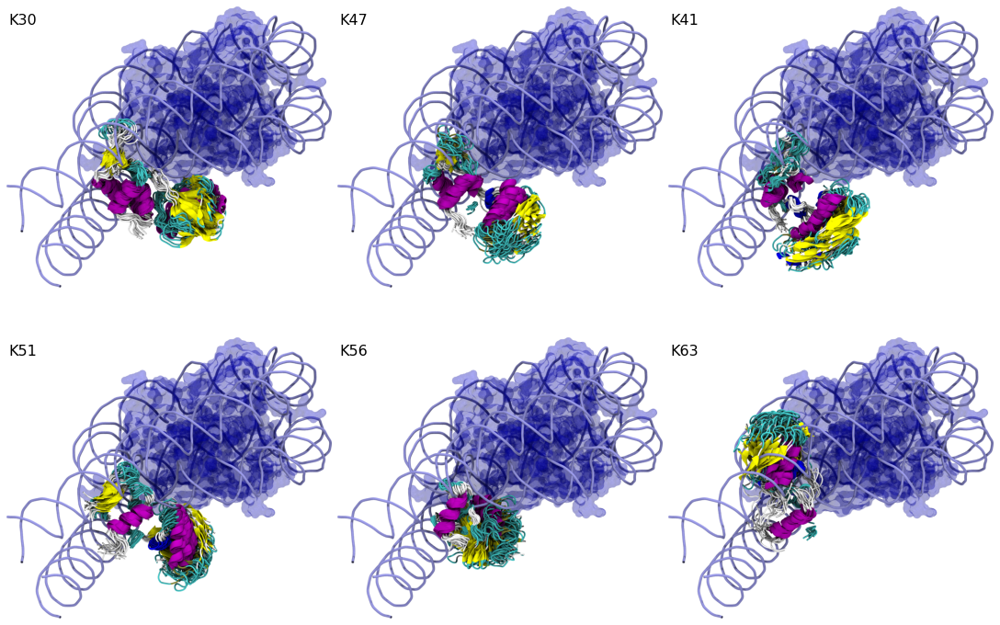

In [385]:
overwrite = False

plt.close('all')

fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(15, 10), gridspec_kw={'wspace': 0, 'hspace': 0}, constrained_layout=True)
axes = axes.flatten()

found = []
UBQ_PERCENTAGES = [f'% {i}' for i in UBQ_SITES]

for i, row in cluster_linkage_score_df.sort_values(by='μ ISA score').rename(columns=dict(zip(UBQ_PERCENTAGES, UBQ_SITES))).iterrows():
    percentages = row[UBQ_SITES].astype(float)
    value_counts = pd.value_counts(percentages)
    if not (percentages >= 90).any(None):
        continue
    ubq_site = percentages[percentages.values == value_counts.index[0]].index[0]
    if ubq_site in found:
        continue
    
    load_df = trajs.df[trajs.df['cluster_membership'] == row['hdbscan id']]
    cluster_num = load_df
    
    imagefile = f'90_percent_{ubq_site}_lowest_score_cluster_in_5nl0.png'
    if not os.path.exists(imagefile) or overwrite:
        _, out_traj = ep.clustering.gen_dummy_traj(trajs, cluster_no=row['hdbscan id'], max_frames=20)
    #     for j, (_, load_row) in enumerate(load_df.iterrows()):
    #         frame = md.load_frame(load_row['traj_loc'], index=load_row['traj_frame'], top=load_row['traj_ref'])
    #         if j == 0:
    #             out_traj = copy.deepcopy(frame)
    #         else:
    #             out_traj = out_traj.join(frame)

        # align to 5NL0
        key = '5NL0'
        stacked = chromatosomes[key]
        index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
        stacked = chromatosomes[key].atom_slice(index)

        out_traj = out_traj.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])

        # save
        out_traj.save_pdb('/tmp/traj.pdb')
        print(stacked)
        stacked.save_pdb('/tmp/nucleosome.pdb')

        additional_lines = ['mol addrep 1',
                            'mol modselect 0 1 protein',
                            'mol modselect 1 1 not protein',
                            'mol modmaterial 0 1 Opaque',
                            'mol modcolor 0 1 ColorID 0',
                            'mol modmaterial 1 1 AOChalky',
                            'mol modstyle 0 1 Surf',
                            'material change opacity Opaque 0.2',
                            'mol modstyle 1 1 Tube 0.5 15',
                            'mol modcolor 1 1 ColorID 15']

        img = render_vmd(['/tmp/traj.pdb', '/tmp/nucleosome.pdb'], drawframes=True, renderer='tachyon', scale=2, rotation=[-80, 45, 35],
                        additional_lines=additional_lines,
                        image_name=imagefile, debug=False)
    else:
        img = plt.imread(imagefile)
        
    axes[len(found)].axis('off')
    axes[len(found)].text(0.05, 0.95, ubq_site, ha='center', va='center', transform=axes[len(found)].transAxes)
    axes[len(found)].imshow(crop_image(img))
    found.append(ubq_site)
    
plt.savefig('/home/kevin/projects/living_ppt/penetration_scoring/clusters_per_ubq_site.png', dpi=600)
    
plt.show()

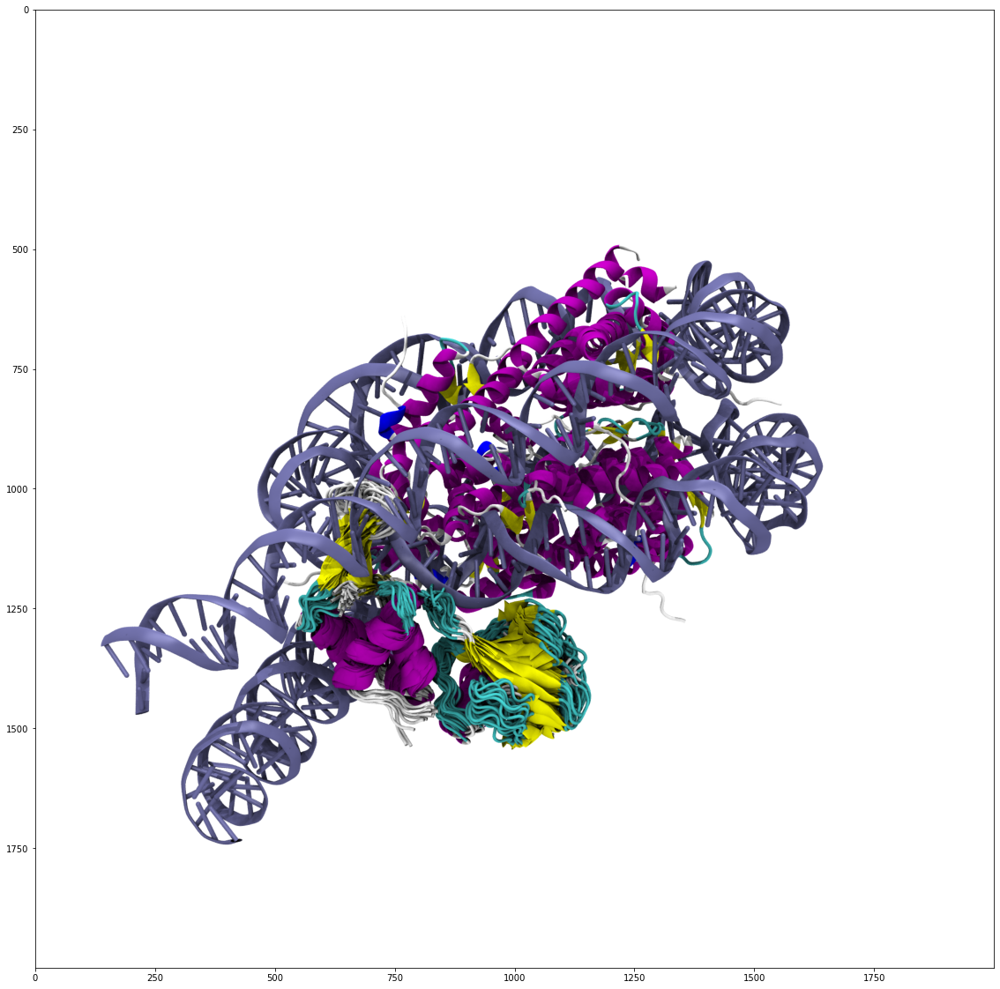

In [70]:
plt.close('all')
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(img)

In [204]:
key = '5NL0'
argindex = 0

sub_df = df_on_dyad[df_on_dyad['chr_name'] == key]
uniques = np.unique(sub_df['cluster_average_scores'].values)[1::]

where = np.where(sub_df['cluster_average_scores'].values == uniques[argindex])[0]
cluster_no = sub_df['cluster_memberships'].values[where]

assert np.all(cluster_no == cluster_no[0])
cluster_no = cluster_no[0]

print(f"{argindex}th lowest scored scluster is cluster no {cluster_no} in chromatosome {key} has average score of {uniques[argindex]}")

view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_no, align_string='resid 76 to 152 and name CA', shorten=True, superpose=True, stack_atoms=False, nglview=True)

stacked = chromatosomes[key]
index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
stacked = chromatosomes[key].atom_slice(index)

to_superpose = dummy_traj
superposed = to_superpose.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
# for frame in superposed:
#     stacked = stacked.stack(frame)
# view = ngl.show_mdtraj(stacked)
# view

# os.makedirs("cluster_5NL0_lowest_avg_score", exist_ok=True)
# nucleosomes[key].save_pdb("cluster_5NL0_lowest_avg_score/receptor.pdb")
# superposed.save_pdb("cluster_5NL0_lowest_avg_score/ligand.pdb")

0th lowest scored scluster is cluster no 500 in chromatosome 5NL0 has average score of 17.224332038904446
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.


In [309]:
index = np.where(trajs.df['cluster_membership'].values == 500)[0]
xy = np.mean(trajs.lowd[index], axis=0)
print(xy.shape)

(2,)


## Render  cluster close to 100

**Problems:** The images from the current version were not correct, because they did not average over the cluster scores, but the cluster id.

In [244]:
def find_nearest(a, a0):
    """Element in nd array `a` closest to the scalar value `a0`
    
    Args:
        a (np.ndarray): The array to process.
        a0 (float): The number to search for.
        
    Returns:
        tuple: A tuple containing the following:
            float: The value in the array closest to `a0`.
            int: The index of the position in array `a`.
    
    """
    idx = np.abs(a - a0).argmin()
    return a.flat[idx], idx
    
key = '5NL0'

sub_df = df_on_dyad[df_on_dyad['chr_name'] == key]
uniques = np.unique(sub_df['cluster_average_scores'].values)[1::]

_, index = find_nearest(sub_df['cluster_average_scores'].values, 113)
cluster_no = sub_df.loc[index, 'cluster_memberships']

print(f"cluster no {cluster_no} in chromatosome {key} has average score of {_}")

view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_no, align_string='resid 76 to 152 and name CA', shorten=True, superpose=True, stack_atoms=False, nglview=True)

stacked = chromatosomes[key]
index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
stacked = chromatosomes[key].atom_slice(index)

to_superpose = dummy_traj
superposed = to_superpose.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
for frame in superposed:
    stacked = stacked.stack(frame)
view = ngl.show_mdtraj(stacked)
view

# os.makedirs("cluster_5NL0_lowest_score_close_to_100", exist_ok=True)
# _ = copy.deepcopy(nucleosomes[key])
# _.xyz[:,:,1] += 10
# _.save_pdb("cluster_5NL0_lowest_score_close_to_100/receptor.pdb")
# _ = copy.deepcopy(superposed)
# _.xyz[:,:,1] += 10
# _.save_pdb("cluster_5NL0_lowest_score_close_to_100/ligand.pdb")

cluster no 332 in chromatosome 5NL0 has average score of 113.25571974410062
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.


NGLWidget()

## Load and combine

In [222]:
chr1 = md.load("cluster_5NL0_lowest_avg_score//receptor.pdb")
chr2 = md.load("cluster_5NL0_lowest_score_close_to_100/receptor.pdb")

chr2.xyz[:,:,1] += 10

stacked = chr1.stack(chr2)
view = ngl.show_mdtraj(stacked)
view

NGLWidget()

## Combined render

In [356]:
argindex = 0

os.makedirs("all_4_nucleosomes/", exist_ok=True)

for i, key in enumerate(['Bai', '5NL0', '4QLC', '5WCU']):
    sub_df = df_on_dyad[df_on_dyad['chr_name'] == key]
    uniques = np.unique(sub_df['cluster_average_scores'].values)[1::]

    where = np.where(sub_df['cluster_average_scores'].values == uniques[argindex])[0]
    cluster_no = sub_df['cluster_memberships'].values[where]

    assert np.all(cluster_no == cluster_no[0])
    cluster_no = cluster_no[0]

    print(f"{argindex}th lowest scored scluster is cluster no {cluster_no} in chromatosome {key} has average score of {uniques[argindex]}")

    view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_no, align_string='resid 76 to 152 and name CA', shorten=True, superpose=True, stack_atoms=False, nglview=False)

    if i == 0:
        _ = copy.deepcopy(nucleosomes[key])
        stacked =_
    elif i == 1:
        _ = copy.deepcopy(nucleosomes[key])
        _.xyz[:,:,1] += 12.5
        stacked = stacked.stack(_)
    elif i == 2:
        _ = copy.deepcopy(nucleosomes[key])
        _.xyz[:,:,0] -= 20
        stacked = stacked.stack(_)
    elif i == 3:
        _ = copy.deepcopy(nucleosomes[key])
        _.xyz[:,:,0] -= 20
        _.xyz[:,:,1] += 12.5
        stacked = stacked.stack(_)
        
    _.save_pdb(f"all_4_nucleosomes/receptor_{key}.pdb")

    to_superpose = dummy_traj
    superposed = to_superpose.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
    if i == 1:
        superposed.xyz[:,:,1] += 12.5
    elif i == 2:
        superposed.xyz[:,:,0] -= 20
    elif i == 3:
        superposed.xyz[:,:,0] -= 20
        superposed.xyz[:,:,1] += 12.5
    superposed.save_pdb(f"all_4_nucleosomes/ligand_{key}.pdb")
    for frame in superposed:
        stacked = stacked.stack(frame)
        
view = ngl.show_mdtraj(stacked)
view

0th lowest scored scluster is cluster no 305 in chromatosome Bai has average score of 6.685254137548208
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
0th lowest scored scluster is cluster no 500 in chromatosome 5NL0 has average score of 17.224332038904446
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
0th lowest scored scluster is cluster no 388 in chromatosome 4QLC has average score of 16.553879433361658
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
0th lowest scored scluster is cluster no 388 in chromatosome 5WCU has average score of 14.99394212063342
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.


NGLWidget()

In [16]:
trajs.df.keys()

Index(['traj_name', 'traj_num', 'traj_frame', 'frame_index', 'common_str',
       'x_orig', 'y_orig', 'traj_loc', 'traj_ref', 'x', 'y', 'dup_mask',
       'dup_of', 'cluster_membership'],
      dtype='object')

In [17]:
trajs.df[trajs.df['cluster_membership'] == 388]['traj_name'].value_counts()

1GHC_K30_-160_1700_3450                      121
1GHC_K30_-160_300_1050_20000                   3
1GHC_K30_-160_2800_7050_650                    2
1GHC_K30_-160_300_1050                         1
1GHC_K30_-160_2800_7050_20000_16300_20000      1
Name: traj_name, dtype: int64

## Render for lowest clusters per_ubq_site

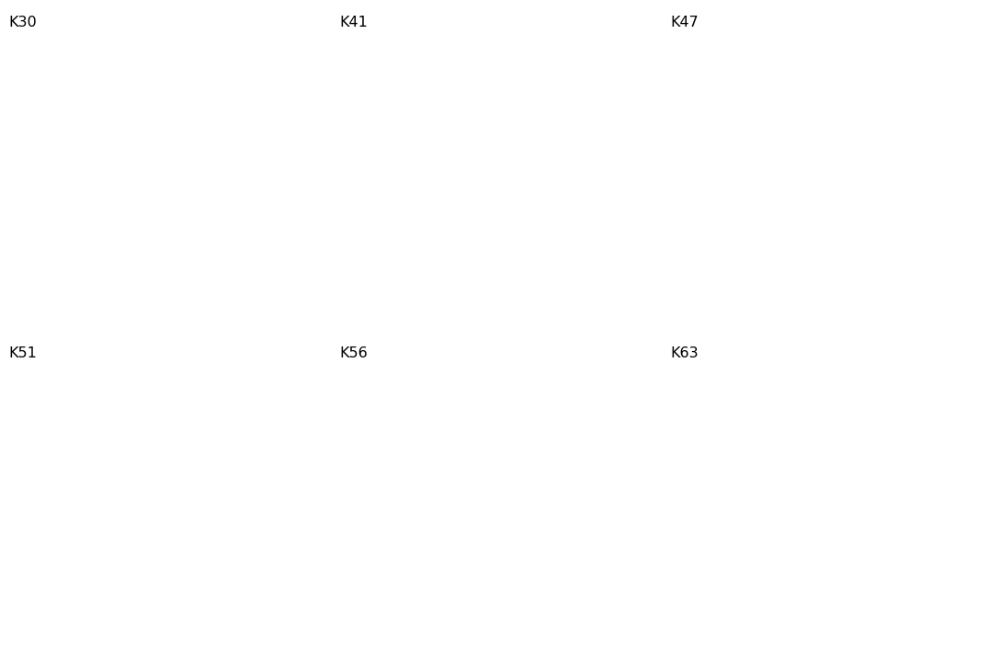

In [367]:
plt.close('all')

fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(15, 10), gridspec_kw={'wspace': 0, 'hspace': 0}, constrained_layout=True)

for ubq_site, ax in zip(UBQ_SITES, axes.flatten()):
    ax.axis('off')
    text = ax.text(0.05, 0.95, ubq_site, ha='center', va='center', transform=ax.transAxes)
    
    

plt.show()

# Plot scores dependent on UBQ-site

In [11]:
%matplotlib inline

In [49]:
trajs.generate_pandas(150)

Scaled 1306 points. Finding (x,y) duplicates. This might take some time.


In [43]:
df_on_dyad

,chr_name,traj_name,frame,score,cluster_average_scores,cluster_memberships
,,,,,,
0,5NL0,1GHC_K30_-100_20000,0,112.446670,-1.0,-1
1,5NL0,1GHC_K30_-100_20000,1,110.231565,-1.0,-1
2,5NL0,1GHC_K30_-100_20000,2,115.024846,-1.0,-1
3,5NL0,1GHC_K30_-100_20000,3,124.769549,-1.0,-1
4,5NL0,1GHC_K30_-100_20000,4,139.093300,-1.0,-1
...,...,...,...,...,...,...
483978,4QLC,K63_80,396,177.935334,-1.0,-1
483979,4QLC,K63_80,397,215.378697,-1.0,-1
483980,4QLC,K63_80,398,199.372599,-1.0,-1


In [53]:
ubq_sites = trajs.common_str
print(ubq_sites)

['K30', 'K41', 'K47', 'K51', 'K56', 'K63']


In [161]:
np.unique(df_on_dyad['chr_name'])

array(['4QLC', '5NL0', '5WCU', 'Bai'], dtype=object)

4QLC
5NL0
5WCU
Bai
K30
317592 317592
K41
317592 317592
K47
432792 336792
K51
328768 328772
K56
317592 317592
K63
317592 317592


<ipython-input-166-f27993cfa321>:209: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


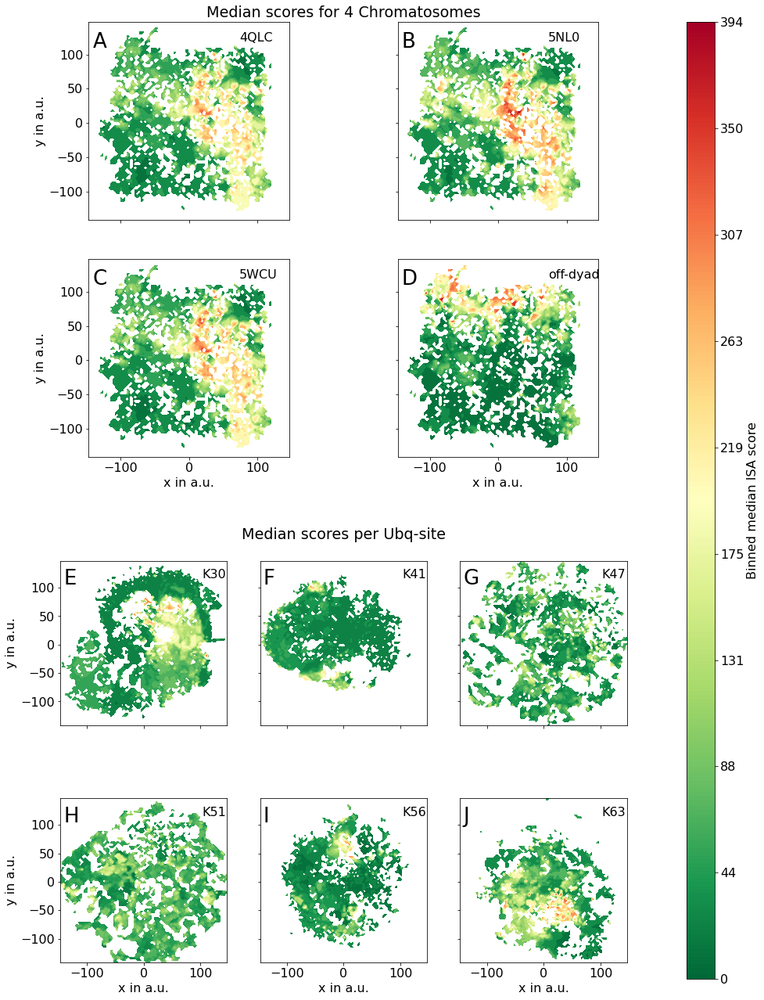

In [166]:
from string import ascii_uppercase
from mpl_toolkits.axes_grid1 import make_axes_locatable
mpl.rcParams.update({'font.size': 16})

ncols = 2
nrows = 5


plt.close('all')
fig = plt.figure(constrained_layout=False, figsize=(15, 22.5))
sup_gs = fig.add_gridspec(2, 2, hspace=0.2, width_ratios=[1, 0.05])

gs_top = sup_gs[0, 0].subgridspec(2, 2)
gs_bottom = sup_gs[1, 0].subgridspec(2, 3)

top_inv_axis = fig.add_subplot(sup_gs[0, 0])
top_inv_axis.axis('off')
top_inv_axis.set_title('Median scores for 4 Chromatosomes')

bottom_inv_axis = fig.add_subplot(sup_gs[1, 0])
bottom_inv_axis.axis('off')
bottom_inv_axis.set_title('Median scores per Ubq-site')

cbar_ax = fig.add_subplot(sup_gs[:, 1])

top_axes = []
bottom_axes = []

iter_ = 0
upper_right = ['4QLC', '5NL0', '5WCU', 'off-dyad', 'K30', 'K41', 'K47', 'K51', 'K56', 'K63']
for i in range(2):
    for j in range(2):
        if i == 0 and j == 0:
            ax = fig.add_subplot(gs_top[i, j])
        else:
            ax = fig.add_subplot(gs_top[i, j], sharex=top_axes[0], sharey=top_axes[0])
        ax.set_aspect('equal')
        txt = ax.text(0.02, 0.95, ascii_uppercase[iter_], transform=ax.transAxes,
                      fontsize=26, verticalalignment='top', color='k')
        txt = ax.text(0.75, 0.95, upper_right[iter_], transform=ax.transAxes,
                      fontsize=16, verticalalignment='top', color='k')
        if i == 1:
            ax.set_xlabel('x in a.u.')
        if j == 0:
            ax.set_ylabel('y in a.u.')
        if i == 0:
            plt.setp(ax.get_xticklabels(), visible=False)
        if j == 1:
            plt.setp(ax.get_yticklabels(), visible=False)
        top_axes.append(ax)
        iter_ += 1
        
for i in range(2):
    for j in range(3):
        if i == 0 and j == 0:
            ax = fig.add_subplot(gs_bottom[i, j])
        else:
            ax = fig.add_subplot(gs_bottom[i, j], sharex=bottom_axes[0], sharey=bottom_axes[0])
        ax.set_aspect('equal')
        txt = ax.text(0.02, 0.95, ascii_uppercase[iter_], transform=ax.transAxes,
                      fontsize=26, verticalalignment='top', color='k')
        txt = ax.text(0.85, 0.95, upper_right[iter_], transform=ax.transAxes,
                      fontsize=16, verticalalignment='top', color='k')
        if i == 1:
            ax.set_xlabel('x in a.u.')
        if j == 0:
            ax.set_ylabel('y in a.u.')
        if i == 0:
            plt.setp(ax.get_xticklabels(), visible=False)
        if j >= 1:
                plt.setp(ax.get_yticklabels(), visible=False)
        bottom_axes.append(ax)
        iter_ += 1
        
nbins = 100

# some histogram plotting purposes
# this is the same for all plots
H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=nbins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

# summarize plotting to find vmax
vmax = 0
plot_H = []
plot_ax = []
        
chromatosome_names = np.unique(df_on_dyad['chr_name'].values)
for i, chromatosome_name in enumerate(chromatosome_names):
    print(chromatosome_name)
    ax = top_axes[i]
    # ax1 is gonna be the colored sketchmap with contourf
    # x = np.hstack([trajs.lowd[:,0] for i in range(4)])
    # y = np.hstack([trajs.lowd[:,1] for i in range(4)])
    
    x = trajs.lowd[:, 0]
    y = trajs.lowd[:, 1]
    values = df_on_dyad[df_on_dyad['chr_name'] == chromatosome_name]['score'].values

    # digitize to fill bins wiht average values
    digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=values, bins=nbins, statistic='median')

    # contourf with .T
    # ax.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)
    if np.nanmax(digitized[0]) > vmax:
        vmax = np.nanmax(digitized[0])
    plot_H.append(digitized[0].T)
    plot_ax.append(ax)
    
for i, ubq_site in enumerate(trajs.common_str):
    print(ubq_site)
    ax = bottom_axes[i]
    
    from_where = 'individual'
    if from_where == 'combined_sketchmap':
        index_trajs_for_ubq = pd.Series(trajs.name_arr).str.contains(ubq_site)
        lowd = trajs.lowd[index_trajs_for_ubq]
    elif from_where == 'individual':
        trajs_tmp_list_index = [_.common_str[0] == ubq_site for _ in trajs_tmp_list].index(True)
        lowd = trajs_tmp_list[trajs_tmp_list_index].lowd
    else:
        raise Exception("Arg `from_where` needs to be either 'combined_sketchmap' or 'individual'.")
        
    # quadruple lowd
    x = np.hstack([lowd[:,0] for i in range(4)])
    y = np.hstack([lowd[:,1] for i in range(4)])
    
    values = df_on_dyad[df_on_dyad['traj_name'].str.contains(ubq_site)]['score'].values
    
    print(len(x), len(values))

    # digitize to fill bins wiht average values
    try:
        digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=values, bins=nbins, statistic='median')
    except AttributeError as e:
        _ = trajs_tmp_list[trajs_tmp_list_index]
            
        lowds = []
        dfs = []
            
        for traj in _:
            df = df_on_dyad[df_on_dyad['traj_name'] == traj.basename]
            if len(df) != len(traj.lowd) * 4:
                if len(df) > len(traj.lowd) * 4:
                    max_ = len(traj.lowd)
                    index_ = df['frame'].astype(int) < max_
                    df = df[index_]
                else:
                    if 'k47' in traj.basename.lower():
                        pass
                    else:
                        raise Exception("Don't know what to do here.")
            else:
                lowds.append(traj.lowd)
                dfs.append(df)
            if not ubq_site.lower() in traj.basename.lower():
                raise Exception(f"Trajs from wrong commom strings in loop: {traj}")
            
        lowds = np.vstack(lowds)
        x = np.hstack([lowds[:,0] for i in range(4)])
        y = np.hstack([lowds[:,1] for i in range(4)])
        df = pd.concat(dfs)
        values = df['score'].values
        
        if len(x) > len(df):
            raise Exception("More trajs in _, than values in df")
            
        if len(df) > len(x):
            raise Exception("More values in df than trajs in _")
        
        try:
            digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=values, bins=nbins, statistic='median')
        except Exception as e2:
            raise e2 from e

    # contourf with .T
    # ax.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)
    if np.nanmax(digitized[0]) > vmax:
        vmax = np.nanmax(digitized[0])
    plot_H.append(digitized[0].T)
    plot_ax.append(ax)
    
for ax, H in zip(plot_ax, plot_H):
    ax.contourf(X, Y, H, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1, vmax=vmax)
    
# color bar
cm = plt.cm.get_cmap('RdYlGn_r')
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
ticks = np.linspace(0, 1, 10)
ticklabels = np.round(np.linspace(start=0, stop=vmax, num=10)).astype(int)
# initialize colormapr
cb = plt.colorbar(sm, cax=cbar_ax, ticks=ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ticklabels)
# remove tick length
cb.ax.yaxis.set_ticks_position('right')
cb.ax.yaxis.set_label_position("right")
# cb.ax.tick_params(axis="y", rotation=45)
cbar_ax.set_ylabel("Binned median ISA score")
        

plt.tight_layout()

img_name = 'median_scores_per_ubq_site_and_chromatosome'
living_ppt_dir = 'penetration_scoring'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")

plt.show()

4QLC
5NL0
5WCU
Bai


/tmp/ipykernel_2016760/2549884777.py:209: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


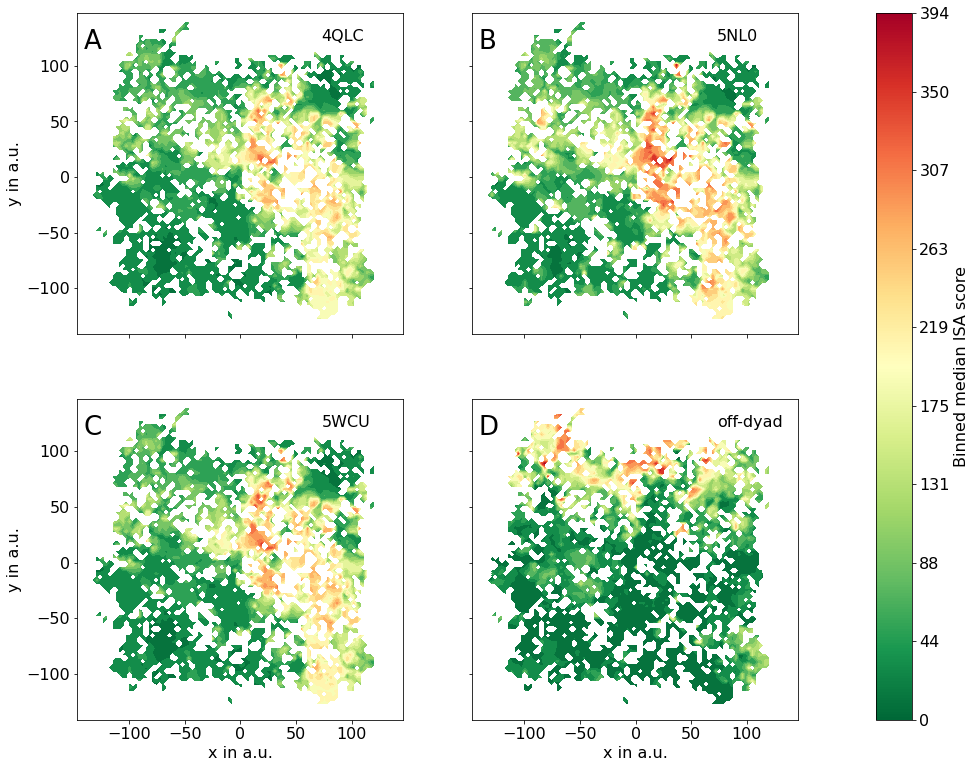

In [340]:
from string import ascii_uppercase
from mpl_toolkits.axes_grid1 import make_axes_locatable
mpl.rcParams.update({'font.size': 16})

ncols = 2
nrows = 5


plt.close('all')
fig = plt.figure(constrained_layout=False, figsize=(15, 13))
sup_gs = fig.add_gridspec(1, 2, hspace=0.2, width_ratios=[1, 0.05])

gs_top = sup_gs[0, 0].subgridspec(2, 2)
# gs_bottom = sup_gs[1, 0].subgridspec(2, 3)

top_inv_axis = fig.add_subplot(sup_gs[0, 0])
top_inv_axis.axis('off')
# top_inv_axis.set_title('Median scores for 4 Chromatosomes')

# bottom_inv_axis = fig.add_subplot(sup_gs[1, 0])
# bottom_inv_axis.axis('off')
# bottom_inv_axis.set_title('Median scores per Ubq-site')

cbar_ax = fig.add_subplot(sup_gs[:, 1])

top_axes = []
bottom_axes = []

iter_ = 0
upper_right = ['4QLC', '5NL0', '5WCU', 'off-dyad', 'K30', 'K41', 'K47', 'K51', 'K56', 'K63']
for i in range(2):
    for j in range(2):
        if i == 0 and j == 0:
            ax = fig.add_subplot(gs_top[i, j])
        else:
            ax = fig.add_subplot(gs_top[i, j], sharex=top_axes[0], sharey=top_axes[0])
        ax.set_aspect('equal')
        txt = ax.text(0.02, 0.95, ascii_uppercase[iter_], transform=ax.transAxes,
                      fontsize=26, verticalalignment='top', color='k')
        txt = ax.text(0.75, 0.95, upper_right[iter_], transform=ax.transAxes,
                      fontsize=16, verticalalignment='top', color='k')
        if i == 1:
            ax.set_xlabel('x in a.u.')
        if j == 0:
            ax.set_ylabel('y in a.u.')
        if i == 0:
            plt.setp(ax.get_xticklabels(), visible=False)
        if j == 1:
            plt.setp(ax.get_yticklabels(), visible=False)
        top_axes.append(ax)
        iter_ += 1
        
# for i in range(2):
#     for j in range(3):
#         if i == 0 and j == 0:
#             ax = fig.add_subplot(gs_bottom[i, j])
#         else:
#             ax = fig.add_subplot(gs_bottom[i, j], sharex=bottom_axes[0], sharey=bottom_axes[0])
#         ax.set_aspect('equal')
#         txt = ax.text(0.02, 0.95, ascii_uppercase[iter_], transform=ax.transAxes,
#                       fontsize=26, verticalalignment='top', color='k')
#         txt = ax.text(0.85, 0.95, upper_right[iter_], transform=ax.transAxes,
#                       fontsize=16, verticalalignment='top', color='k')
#         if i == 1:
#             ax.set_xlabel('x in a.u.')
#         if j == 0:
#             ax.set_ylabel('y in a.u.')
#         if i == 0:
#             plt.setp(ax.get_xticklabels(), visible=False)
#         if j >= 1:
#                 plt.setp(ax.get_yticklabels(), visible=False)
#         bottom_axes.append(ax)
#         iter_ += 1
        
nbins = 100

# some histogram plotting purposes
# this is the same for all plots
H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=nbins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

# summarize plotting to find vmax
vmax = 0
plot_H = []
plot_ax = []
        
chromatosome_names = np.unique(df_on_dyad['chr_name'].values)
for i, chromatosome_name in enumerate(chromatosome_names):
    print(chromatosome_name)
    ax = top_axes[i]
    # ax1 is gonna be the colored sketchmap with contourf
    # x = np.hstack([trajs.lowd[:,0] for i in range(4)])
    # y = np.hstack([trajs.lowd[:,1] for i in range(4)])
    
    x = trajs.lowd[:, 0]
    y = trajs.lowd[:, 1]
    values = df_on_dyad[df_on_dyad['chr_name'] == chromatosome_name]['score'].values

    # digitize to fill bins wiht average values
    digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=values, bins=nbins, statistic='median')

    # contourf with .T
    # ax.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)
    if np.nanmax(digitized[0]) > vmax:
        vmax = np.nanmax(digitized[0])
    plot_H.append(digitized[0].T)
    plot_ax.append(ax)
    
# for i, ubq_site in enumerate(trajs.common_str):
#     print(ubq_site)
#     ax = bottom_axes[i]
    
#     from_where = 'individual'
#     if from_where == 'combined_sketchmap':
#         index_trajs_for_ubq = pd.Series(trajs.name_arr).str.contains(ubq_site)
#         lowd = trajs.lowd[index_trajs_for_ubq]
#     elif from_where == 'individual':
#         trajs_tmp_list_index = [_.common_str[0] == ubq_site for _ in trajs_tmp_list].index(True)
#         lowd = trajs_tmp_list[trajs_tmp_list_index].lowd
#     else:
#         raise Exception("Arg `from_where` needs to be either 'combined_sketchmap' or 'individual'.")
        
#     # quadruple lowd
#     x = np.hstack([lowd[:,0] for i in range(4)])
#     y = np.hstack([lowd[:,1] for i in range(4)])
    
#     values = df_on_dyad[df_on_dyad['traj_name'].str.contains(ubq_site)]['score'].values
    
#     print(len(x), len(values))

#     # digitize to fill bins wiht average values
#     try:
#         digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=values, bins=nbins, statistic='median')
#     except AttributeError as e:
#         _ = trajs_tmp_list[trajs_tmp_list_index]
            
#         lowds = []
#         dfs = []
            
#         for traj in _:
#             df = df_on_dyad[df_on_dyad['traj_name'] == traj.basename]
#             if len(df) != len(traj.lowd) * 4:
#                 if len(df) > len(traj.lowd) * 4:
#                     max_ = len(traj.lowd)
#                     index_ = df['frame'].astype(int) < max_
#                     df = df[index_]
#                 else:
#                     if 'k47' in traj.basename.lower():
#                         pass
#                     else:
#                         raise Exception("Don't know what to do here.")
#             else:
#                 lowds.append(traj.lowd)
#                 dfs.append(df)
#             if not ubq_site.lower() in traj.basename.lower():
#                 raise Exception(f"Trajs from wrong commom strings in loop: {traj}")
            
#         lowds = np.vstack(lowds)
#         x = np.hstack([lowds[:,0] for i in range(4)])
#         y = np.hstack([lowds[:,1] for i in range(4)])
#         df = pd.concat(dfs)
#         values = df['score'].values
        
#         if len(x) > len(df):
#             raise Exception("More trajs in _, than values in df")
            
#         if len(df) > len(x):
#             raise Exception("More values in df than trajs in _")
        
#         try:
#             digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=values, bins=nbins, statistic='median')
#         except Exception as e2:
#             raise e2 from e

#     # contourf with .T
#     # ax.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)
#     if np.nanmax(digitized[0]) > vmax:
#         vmax = np.nanmax(digitized[0])
#     plot_H.append(digitized[0].T)
#     plot_ax.append(ax)
    
for ax, H in zip(plot_ax, plot_H):
    ax.contourf(X, Y, H, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1, vmax=vmax)
    
# color bar
cm = plt.cm.get_cmap('RdYlGn_r')
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
ticks = np.linspace(0, 1, 10)
ticklabels = np.round(np.linspace(start=0, stop=vmax, num=10)).astype(int)
# initialize colormapr
cb = plt.colorbar(sm, cax=cbar_ax, ticks=ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ticklabels)
# remove tick length
cb.ax.yaxis.set_ticks_position('right')
cb.ax.yaxis.set_label_position("right")
# cb.ax.tick_params(axis="y", rotation=45)
cbar_ax.set_ylabel("Binned median ISA score")
        

plt.tight_layout()

img_name = 'median_scores_per_ubq_site_and_chromatosome_new'
living_ppt_dir = 'penetration_scoring'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")

plt.show()

In [159]:
np.nanmax(digitized[0])

334.52718945466074

# How much faster is ISA?

## ISA

Parallel scoring of all conformations (`trajs.iterframes()`) into all 4 chromatosomes (5NL0, 5WCU, 4QLC, Bai) in:
```
executed in 3h 49m 23s, finished 18:33:42 2020-11-13
```
This means: per structure we are looking at a time of:

In [32]:
from datetime import datetime, timedelta

In [36]:
ISA_time = '3h 49m 23s'
t = datetime.strptime(ISA_time,"%Hh %Mm %Ss")
# ...and use datetime's hour, min and sec properties to build a timedelta
delta = timedelta(hours=t.hour, minutes=t.minute, seconds=t.second)
per_second_ISA = trajs.n_frames * 4 / delta.total_seconds()
print(f'ISA scores {per_second_ISA} poses per second.')

ISA scores 140.66206495676815 poses per second.


## Rosetta

For Rosetta we take the time creation dates of files from parallel scoring:

In [37]:
import os, glob
files = glob.glob('/home/kevin/projects/h1_ub_chromatosome_penetration/scores_per_traj/*')
files = sorted(files, key=os.path.getctime)

In [39]:
d_start = datetime.fromtimestamp(os.path.getctime(files[0]))
d_end = datetime.fromtimestamp(os.path.getctime(files[-1]))
delta = d_end - d_start
per_second_Rosetta = len(files) / delta.total_seconds()
print(f'ISA scores {per_second_Rosetta} poses per second.')

ISA scores 0.13314387298367605 poses per second.


In [40]:
per_second_ISA / per_second_Rosetta

1056.4666762699164

# Render UBQ based on basicity

In [5]:
AAs = np.genfromtxt('amino_acid_names_3_1_letter.txt', delimiter=' - ', dtype=str)
AAs = pd.DataFrame(AAs, columns=['name', '3letter', '1letter'])
AAs = AAs.set_index('1letter')

pKa = pd.read_table('Amino_Acid_pka.txt', comment='#', header=0, names=['name', 'pKa1', 'pKa2', 'pKa3', 'pI'])
pKa['name'] = pKa['name'].str.lower()

combined = AAs.reset_index().merge(pKa, how="left").set_index('1letter')

# 0-1 mapping
cmap_values_pKa1 = ((combined['pKa1'] - combined['pKa1'].min()) / (combined['pKa1'].max() - combined['pKa1'].min()) * 256).astype(int)
combined['cmap_values_pKa1'] = cmap_values_pKa1

# 0 - 1 mapping for pI
cmap_values_pKa1 = ((combined['pI'] - combined['pI'].min()) / (combined['pI'].max() - combined['pI'].min()) * 256).astype(int)
combined['cmap_values_pI'] = cmap_values_pKa1

combined

,name,3letter,pKa1,pKa2,pKa3,pI,cmap_values_pKa1,cmap_values_pI
1letter,,,,,,,,
A,alanine,ala,2.34,9.69,---,6.00,131,103
R,arginine,arg,2.17,9.04,12.48,10.76,88,256
N,asparagine,asn,2.02,8.80,---,5.41,50,84
D,aspartic acid,asp,1.88,9.60,3.65,2.77,15,0
C,cysteine,cys,1.96,8.18,---,5.07,35,73
Q,glutamine,gln,2.17,9.13,---,5.65,88,92
E,glutamic acid,glu,2.19,9.67,4.25,3.22,93,14
G,glycine,gly,2.34,9.60,---,5.97,131,102
H,histidine,his,1.82,9.17,6.00,7.59,0,154


In [10]:
traj = md.load_pdb('https://files.rcsb.org/view/1UBQ.pdb')
traj = traj.atom_slice(traj.top.select('protein'))

dssp = md.compute_dssp(traj)[0]

data = {'resname': [], 'secstruct': [], 'pKa1': []}

for i, (r, d) in enumerate(zip(traj.top.residues, dssp)):
    pKa1 = combined[combined['3letter'].str.upper() == r.name]['pKa1'].values[0]
    data['resname'].append(str(r))
    data['secstruct'].append(d)
    data['pKa1'].append(pKa1)
    
def color_sec_struct(v, props={'C': 'background-color:blue', 'H': 'background-color:purple', 'E': 'background-color:yellow'}):
    return props[v] if v in props else None

    
df = pd.DataFrame(data, index=np.arange(traj.n_residues))
pd.options.display.min_rows = -1
s = df.style.applymap(color_sec_struct)
s

,resname,secstruct,pKa1
0,MET1,C,2.280000
1,GLN2,E,2.170000
2,ILE3,E,2.360000
3,PHE4,E,1.830000
4,VAL5,E,2.320000
5,LYS6,E,2.180000
6,THR7,E,2.090000
7,LEU8,C,2.360000
8,THR9,C,2.090000
9,GLY10,C,2.340000


In [353]:
for i in [0, 1, 10, 100, 200, 300, 400, 500, 600]:
    print(i, cmap(i))

0 (0.0, 0.0, 1.0, 1.0)
1 (0.00784313725490196, 0.00784313725490196, 1.0, 1.0)
10 (0.0784313725490196, 0.0784313725490196, 1.0, 1.0)
100 (0.7843137254901961, 0.7843137254901961, 1.0, 1.0)
200 (1.0, 0.43137254901960786, 0.43137254901960786, 1.0)
300 (1.0, 0.0, 0.0, 1.0)
400 (1.0, 0.0, 0.0, 1.0)
500 (1.0, 0.0, 0.0, 1.0)
600 (1.0, 0.0, 0.0, 1.0)


In [11]:
def _set_color_by_residue(self, colors, component_index=0, repr_index=0):
        self._remote_call('setColorByResidue',
                           target='Widget',
                           args=[colors, component_index, repr_index])

ubq = md.load_pdb('https://files.rcsb.org/view/1ubq.pdb')
ubq = ubq.atom_slice(ubq.top.select('protein'))
fasta = [i for i in ubq.top.to_fasta()[0]]
pKas = combined.loc[fasta]['pI'].values
cmap_values = combined.loc[fasta]['cmap_values_pI'].values
cmap = mpl.cm.get_cmap('bwr_r')

colors = ['0x' + mpl.colors.to_hex(cmap(i))[1:7].upper() for i in cmap_values]
view = ngl.show_mdtraj(ubq, gui=True)
view._set_color_by_residue = _set_color_by_residue
view._set_color_by_residue(view, colors, component_index=0, repr_index=0)
view

NGLWidget()

# Verify basins with sims

In [7]:
xtcs = glob.glob("/home/kevin/projects/verify_basins_with_sims/new_sims_paper/results/*/*K*.xtc")
refs = []
refs.append('/home/kevin/master/analysis_and_pics/K30/K30_0_nosolv.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K41/K41_0_nosolv.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K47/K47_0_no_water.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K51/K51_20_no_water.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K56/K56_0_nosolv.pdb')
refs.append('/home/kevin/master/analysis_and_pics/K63/K63_0_nosolv.pdb')

common_str = ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']

verification_trajs = ep.Info_all(xtcs, refs, common_str=common_str)
print(verification_trajs.n_trajs)

30


In [278]:
dir_ = "/home/kevin/projects/paper_2019/verify_basins_with_sims_highd_lowd/"
verification_trajs.load_lowd(dir_, cols=[0, 1])
verification_trajs.generate_pandas(boundary=150, overwrite=True)

Scaled 498 points. Finding (x,y) duplicates. This might take some time.


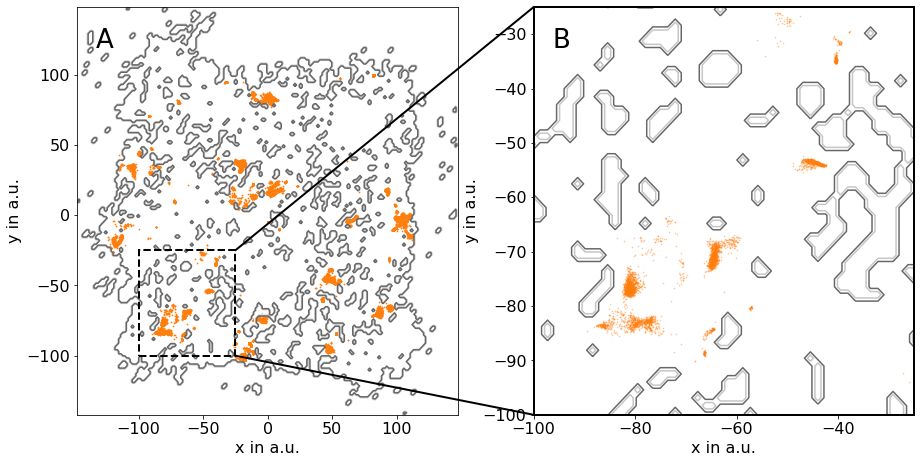

In [289]:
mpl.rcParams.update({'font.size': 16})

plt.close('all')
fig, (ax1, ax2) = plt.subplots(ncols=2)
fig.set_size_inches(15, 7.5)

txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='k')

ax1.scatter(*verification_trajs.lowd.T, c='C1', s=0.5)
ax1.set_xlabel('x in a.u.')
ax1.set_ylabel('y in a.u.')

ax1_bins = 200
H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=ax1_bins)

xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

for i in range(ax1_bins):
    for j in range(ax1_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
for i in range(1, ax1_bins - 1):
    for j in range(1, ax1_bins - 1):
        _ = (H[i-1, j] == 1 or H[i, j-1] == 1 or H[i-1, j-1] == 1 or H[i+1, j] == 1 or H[i, j+1] == 1 or H[i+1, j+1] == 1)
        if _:
            H_new[i, j] = 1

ax1.contour(X, Y, H_new.T, cmap=plt.cm.Greys, levels=2, zorder=1)


# same on ax2, but zoom
ax2.contour(X, Y, H_new.T, cmap=plt.cm.Greys, levels=2, zorder=1)
ax2.set_xlim([-100, -25])
ax2.set_ylim([-100, -25])
ax2.scatter(*verification_trajs.lowd.T, c='C1', s=0.5, alpha=0.35)
ax2.set_xlabel('x in a.u.')
ax2.set_ylabel('y in a.u.')
[k.set_linewidth(2) for k in ax2.spines.values()]

ep.plotting.plotting._zoomingBoxManual(ax1, ax2, roiKwargs={'color': 'k'})

plt.savefig("/home/kevin/projects/paper_2019/verify_basins_with_sims.png", transparent=True, dpi=600)
plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/verify_basins_with_sims.png", transparent=True, dpi=600)

# Cumulative Histograms

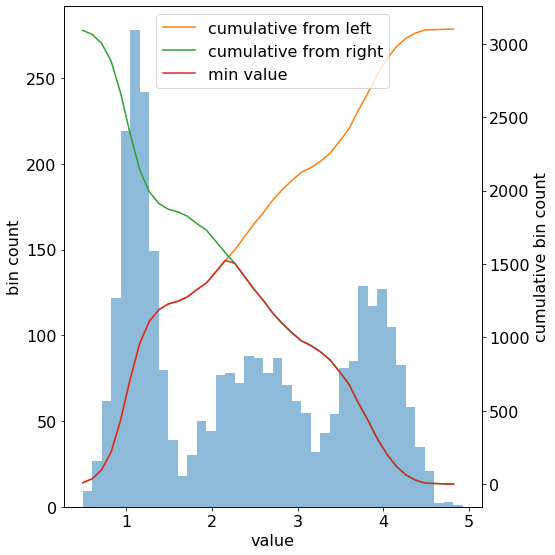

In [296]:
# fix numpy random seed
np.random.seed(seed=1)
# some fake data
data = np.concatenate((np.random.normal(loc=1.1, scale=.2, size=1200),
                      np.random.normal(loc=3.9, scale=.3, size=900),
                      np.random.normal(loc=2.5, scale=0.5, size=1000)))
nbins=40

fig, ax = plt.subplots()
fig.set_size_inches(8, 8)
# evaluate the histogram
hist, bin_edges = np.histogram(data, bins=nbins)
# plot histogram
ax.hist(data, bins=nbins, label='base histogram', alpha=0.5)
# evaluate the cumulative
cumulative = np.cumsum(hist)

# plot the cumulative function
ax2 = ax.twinx()
ax2.plot(bin_edges[:-1], cumulative, c='C1', label='cumulative from left')
# plot the survival function
ax2.plot(bin_edges[:-1], len(data)-cumulative, c='C2', label='cumulative from right')

# plot the lowest hist
values = []
for b in range(nbins):
    if cumulative[b] < (len(data)-cumulative)[b]:
        values.append(cumulative[b])
    else:
        values.append((len(data)-cumulative)[b])
ax2.plot(bin_edges[:-1], values, c='C3', label='min value')
ax.set_ylabel("bin count")
ax2.set_ylabel("cumulative bin count")
ax.set_xlabel("value")
plt.legend()
plt.tight_layout()
# plt.savefig("1D_cumulative_historgams.png")
plt.savefig("/home/kevin/projects/living_ppt/penetration_scoring/1D_cumulative_historgams.png")

In [314]:
def gen_cumulative_histograms(H):
    # define corners
    corners = []
    for x in [0, x_bins - 1]:
        for y in [0, y_bins - 1]:
            append = [x, y]
            corners.append(append)

    # initialize cumulative histogram search
    no_of_search_bubbles = 2 ** len(H.shape)

    # initialize search bubbles
    iter_bubbles = []
    for i in range(no_of_search_bubbles):
        iteration = make_iter_bubble(i, corners[i])
        iter_bubbles.append(iteration)

    # get the values for each bubble
    values = []
    for i in range(no_of_search_bubbles):
        value = make_value_bubble(i, corners[i], iter_bubbles[i])
        values.append(value)

    # add the values according to my idea with 1D histograms
    histo_out = add_values(values, no_of_search_bubbles)
    # I decided to skip the normalization to get integer values of the scores
    histo_out = histo_out / np.max(histo_out)
    return histo_out, values, iter_bubbles
        
def make_iter_bubble(number, corner):
    # print('generating iteration bubble for corner '+str(corner))
    H_iter = np.zeros((H.shape[0], H.shape[1]), dtype=int)
    H_iter[corner[0],corner[1]] = 1

    iteration = 1
    while 0 in H_iter:
        for (x, y), value in np.ndenumerate(H):
            # iterate over all bins
            if H_iter[x][y] != 0:
                # only continue if bin is not finished
                pass
            else:
                # only calculate nearest neighbour values, if (x, y, z) aren't out of bounds
                values = []
                if x < nbins - 1:
                    X_val = H_iter[x+1, y]
                    values.append(X_val)
                if x > 0:
                    x_val = H_iter[x-1, y]
                    values.append(x_val)
                if y < nbins -1:
                    Y_val = H_iter[x, y+1]
                    values.append(Y_val)
                if y > 0:
                    y_val = H_iter[x, y-1]
                    values.append(y_val)
                # if the iteration value occurs in neighbours. set new values
                if iteration in values:
                    H_iter[x][y] = iteration + 1
        iteration += 1
    # globally subtract 1    
    H_iter = H_iter - 1
    return(H_iter)

def make_value_bubble(number, corner, iter_bubble):
    H_out = np.zeros((H.shape[0], H.shape[1])).astype(np.float)
    H_out[corner[0],corner[1]] = 0.0

    for iteration in range(np.max(iter_bubble) + 1): # +1 is needed so the last bin also gets calculated
        if iteration == 0:
            pass
        else:
            iter_count = len(np.where(iter_bubble == iteration)[0])
            # print('assigning new values to '+str(iter_count)+' bins')
            # at what iteration are we
            where_x = np.where(iter_bubble == iteration)[0]
            where_y = np.where(iter_bubble == iteration)[1]
            append_values = []
            for i in range(len(where_x)):
                x = where_x[i]
                y = where_y[i]
                # print('searching for neighbours for bin ('+str(x)+', '+str(y)+', '+str(z)+')')
                # define all the nearest neighbours of the bin
                neighbours = []
                # +1 neighbours
                X_neighbour = [x+1, y]; neighbours.append(X_neighbour)
                x_neighbour = [x-1, y]; neighbours.append(x_neighbour)
                Y_neighbour = [x, y+1]; neighbours.append(Y_neighbour)
                y_neighbour = [x, y-1]; neighbours.append(y_neighbour)
                neighbours_tmp = []
                for neighbour in neighbours:
                    if -1 in neighbour or nbins in neighbour or -2 in neighbour or nbins + 1 in neighbour:
                        pass # removes out of bound neighbours
                    else:
                        neighbours_tmp.append(neighbour)
                # print('bin ('+str(x)+', '+str(y)+', '+str(z)+') has '+str(len(neighbours_out))+' neighbours inside boundaries')
                # remove neighbours which are in front of the iter bubble
                neighbours_out = []
                for coords in neighbours_tmp:
                    x_n = coords[0]
                    y_n = coords[1]
                    if iter_bubble[x_n][y_n] == iteration + 1:
                        pass # removes neighbour in front of iter bubble
                    else:
                        neighbours_out.append(coords)
                # count number of neighbours from previous iterations
                neighbour_count = 0
                for coords in neighbours_out:
                    x_n = coords[0]
                    y_n = coords[1]
                    if iter_bubble[x_n][y_n] == iteration - 1:
                        neighbour_count += 1
                if neighbour_count != len(neighbours_out):
                    raise Exception('I have a mismatch between the list containing the past neighbours and the count of the neighbours to be considered')
                # add the values up
                val = 0.0
                for coords in neighbours_out:
                    x_n = coords[0]
                    y_n = coords[1]
                    if iter_bubble[x_n][y_n] == iteration - 1:
                        # Option 1. The new bin only gets 1/nth of each neighbours count, where n
                        # is the number of neighbours
                        val = val + (1.0 / neighbour_count * H_out[x_n][y_n] * propagation_factor)
                        # Option 2. The new bin gets the full values of all of its neighbouring bins
                        # This makes the algorithm too quickly jump to too high numbers and leads to an integer overflow
                        # I have changed dataformat of H_out to np.float but this hasn't worked either, because
                        # The value is rising to quickly
                        # val = val + (H_out[x_n][y_n][z_n]) * self.propagation_factor
                append_values.append(val + H[x][y])
            # 2nd for loop is needed, so the 2nd bin in iteration k doesn't already receive the value of it neighbour,
            # which has also to be calculated within iteration k
            for i in range(len(where_x)):
                x = where_x[i]
                y = where_y[i]
                new_val = append_values[i]
                H_out[x][y] = new_val
    # normalize
    # H_out = H_out / np.max(H_out)
    # don't normalize
    return(H_out)
    
def add_values(values, no_of_search_bubbles):
    H_out = np.zeros((H.shape[0], H.shape[1]))
    for (x, y), value in np.ndenumerate(H):
        if H[x][y] <= threshold:
            H_out[x][y] = H[x][y]
        else:
            # search for the smallest value in the 2 ** dimnum value bubbles
            test_values = []
            for i in range(len(values)):
                test_values.append(values[i][x][y])
            min_pos = test_values.index(min(test_values))
            H_out[x][y] = values[min_pos][x][y]
            if min_pos > no_of_search_bubbles:
                raise Exception('That did not work')
    return(H_out)

In [321]:
print(xy.shape)

(5000, 2)


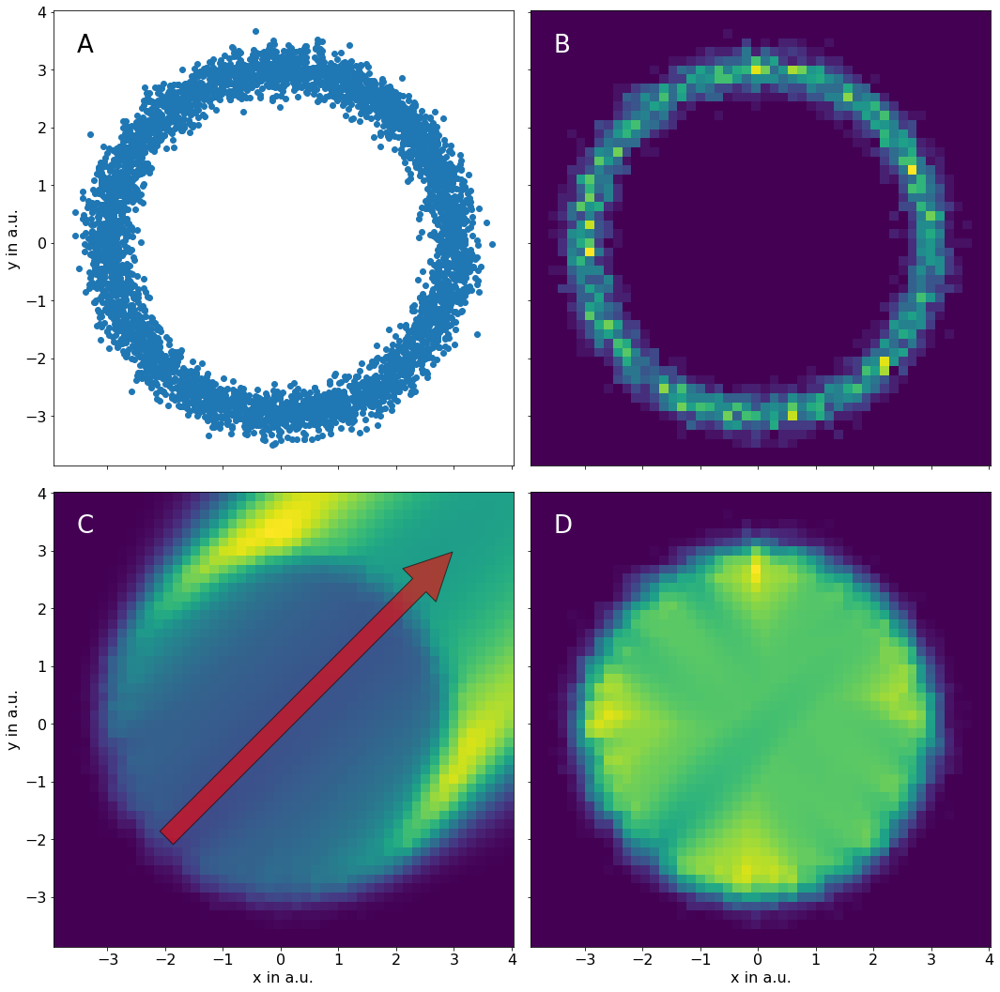

In [327]:
np.random.seed(seed=1)
# distribution between r=3.0
r = np.random.normal(loc=3.0, scale=.2, size=5000)
# random values between 0 and 2pi
phi = np.random.random(5000) * 2 * np.pi
circ = np.stack([r, phi]).T
# x = r × cos( θ )
# y = r × sin( θ )
x = circ[:,0] * np.cos(circ[:,1])
y = circ[:,0] * np.sin(circ[:,1])
xy = np.stack([x, y]).T

# plot
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True)
fig.set_size_inches(15, 15)
ax1.scatter(*xy.T)
ax1.set_aspect('equal')
ax1.set_ylabel('y in a.u.')
txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=26, verticalalignment='top', color='k')

# calculations
nbins=50
propagation_factor = 1.0
threshold = -0.1
range_ = np.array([ax1.get_xlim(), ax2.get_ylim()])
H, xedges, yedges = np.histogram2d(*xy.T, bins=nbins, range=range_)
x_bins = H.shape[0]
y_bins = H.shape[1]

histo_out, values, iter_bubbles = gen_cumulative_histograms(H)

# density
X, Y = np.meshgrid(xedges, yedges)
with np.errstate(divide = 'ignore'): # ignore division by zero error
    F = -np.log(H)
# ax2.hist2d(*xy.T, bins=50)
ax2.pcolormesh(X, Y, H.T)
ax2.set_aspect('equal')
ax2.set_facecolor(plt.cm.viridis(0))
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='w')

# value bubble
ax3.set_aspect('equal')
ax3.set_xlabel('x in a.u.')
ax3.set_ylabel('y in a.u.')
X, Y = np.meshgrid(xedges, yedges)
ax3.pcolormesh(X, Y, values[0].T)
ax3.set_facecolor(plt.cm.viridis(0))
arrow = mpl.patches.FancyArrowPatch((-2, -2), (3, 3),
                                 mutation_scale=100, facecolor='red', alpha=0.6, edgecolor='k')
ax3.add_patch(arrow)
txt = ax3.text(0.05, 0.95, 'C', transform=ax3.transAxes, fontsize=26, verticalalignment='top', color='w')

# final
X, Y = np.meshgrid(xedges, yedges)
with np.errstate(divide = 'ignore'): # ignore division by zero error
    F = -np.log(histo_out)
ax4.pcolormesh(X, Y, histo_out.T)
ax4.set_aspect('equal')
ax4.set_xlabel('x in a.u.')
ax4.set_facecolor(plt.cm.viridis(0))
txt = ax4.text(0.05, 0.95, 'D', transform=ax4.transAxes, fontsize=26, verticalalignment='top', color='w')

plt.tight_layout()

plt.savefig("/home/kevin/projects/living_ppt/penetration_scoring/2D_cumulative_historgams_example.png")

# Earth mover and MDS

https://stackoverflow.com/questions/49234682/python-earth-movers-distance

In [294]:
import pyemd

/home/kevin/.conda/envs/work_3.7/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/home/kevin/.conda/envs/work_3.7/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


In [295]:
histograms = []

for ubq in trajs.common_str:
    where = np.where([True if ubq in traj.basename else False for traj in trajs])[0]
    _ = trajs[where]
    hist, xedges, yedges = np.histogram2d(*_.lowd.T, bins=200, range=[[-150, 150], [-150, 150]], density=True)
    hist = hist.astype(np.float64)
    histograms.append(hist)

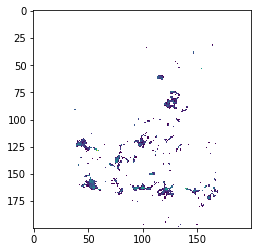

In [298]:
plt.imshow(hist, norm=mpl.colors.LogNorm())

In [299]:
wasserstein_distances = np.zeros(shape=(len(histograms), len(histograms)))

mgrid = np.meshgrid(np.arange(200), np.arange(200))
metric = np.abs(mgrid[0] - mgrid[1]).astype(np.float64)

for i, j in itertools.combinations(range(len(histograms)), 2):
    dist = scipy.stats.wasserstein_distance(histograms[i].ravel(), histograms[j].ravel())
    # dist2 = pyemd.emd_samples(histograms[i].ravel(), histograms[j].ravel())
    # dist = pyemd.emd(histograms[i], histograms[j], metric)
    wasserstein_distances[i, j] = dist
    wasserstein_distances[j, i] = dist

In [3]:
# wasserstein_distances = wasserstein_distances * 1e5
wasserstein_distances = np.load("wassertsein_distances.npy")

In [4]:
print(wasserstein_distances[:4,:4])
# np.save("wassertsein_distances.npy", wasserstein_distances)

[[0.         0.41708299 0.59947108 0.99922461]
 [0.41708299 0.         0.56282288 1.22314192]
 [0.59947108 0.56282288 0.         0.72613045]
 [0.99922461 1.22314192 0.72613045 0.        ]]


## MDS with them

TRhe classical MDS rest on the fact, that the cooridnate matrix $\mathbf{X}$ can be derived by eigenvalue decomposition from the scalar product matrix $\mathbf{B} = \mathbf{XX'}$. The problem of constructing $\mathbf{B}$ from the prosximity matrix $\mathbf{P}$ is solved by multiplying the squared proximities with the matrix $\mathbf{J} = \mathbf{I} - n^{-1}\mathbf{11'}$. This procedure is called double centering. The following steps summarize the algorithm of classical MDS:

1) Set up the matrix of squared proximities: $\mathbf{P^{(2)}} = \left[ p^2 \right]$.

In [5]:
P = wasserstein_distances ** 2

2) Apply the double centering: $\mathbf{B} = -\frac{1}{2}\mathbf{JP^{(2)}J}$ using the matrix $\mathbf{J} = \mathbf{I} - n^{-1}\mathbf{11'}$.

In [6]:
n = wasserstein_distances.shape[0]
diag_one = np.eye(n)
fill_one = np.ones(n)

J = diag_one - n ** -1 * fill_one

B = - (1/2) * np.matmul(np.matmul(J, P), J)

3) Extract the m largest positive eigenvalues $λ_1 . . . λ_m$ of $\mathbf{B}$ and the corresponding $m$ eigenvectors $\mathbf{e_1} . . . \mathbf{e_m}$.

In [7]:
eigen =np.linalg.eig(B)
eigen1, eigen2 = eigen[0][:2]
print(eigen1, eigen2)

1.5942917001369932 0.4141847352212709


4) A m-dimensional spatial configuration of the n objects is derived from the

coordinate matrix X = EmΛ1/2
m , where Em is the matrix of m eigenvectors
and Λm is the diagonal matrix of m eigenvalues of B, respectively.

In [8]:
two_d_eigenmatrix = eigen[1][:,:2]

X = np.matmul(two_d_eigenmatrix, np.array([[np.sqrt(eigen1), 0], [0, np.sqrt(eigen2)]]))
data = X

## Plot

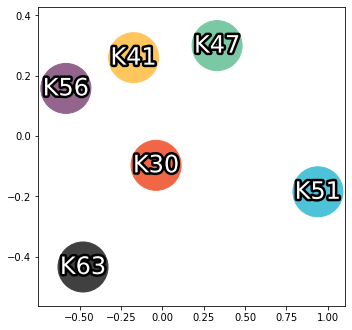

In [9]:
import matplotlib.patheffects as PathEffects

fig, ax = plt.subplots()
fig.set_size_inches(5.5, 5.5)

colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
ubqs = ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']

ax.scatter(X[:,0], -X[:,1], c=colors, s=2500)
for i, s in enumerate(ubqs):
    txt = ax.text(X[i,0], -X[i,1], s, fontsize=24, color='w', va='center', ha='center')
    # txt = ax4.text(*trajs.lowd[indices[i]] + 0.8, iter_ + 1, fontsize=24, color='w')
    txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])
# ax.set_xticks([])
# ax.set_yticks([])
# [k.set_linewidth(0) for k in ax.spines.values()]

plt.savefig("MDS_of_EMD.png", dpi=600, tranparent=True)
plt.savefig("/home/kevin/projects/living_ppt/EMD/MDS_of_EMD.png", dpi=600, tranparent=True)

## As contour plots

In [10]:
cm = mpl.colors.ListedColormap(['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040'], name='from_list')

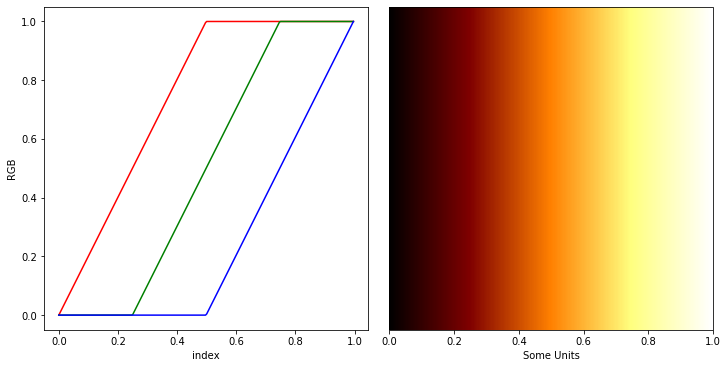

In [12]:
cdict = {'red':   [[0.0,  0.0, 0.0],
                   [0.5,  1.0, 1.0],
                   [1.0,  1.0, 1.0]],
         'green': [[0.0,  0.0, 0.0],
                   [0.25, 0.0, 0.0],
                   [0.75, 1.0, 1.0],
                   [1.0,  1.0, 1.0]],
         'blue':  [[0.0,  0.0, 0.0],
                   [0.5,  0.0, 0.0],
                   [1.0,  1.0, 1.0]]}


def plot_linearmap(cdict):
    newcmp = mpl.colors.LinearSegmentedColormap('testCmap', segmentdata=cdict, N=256)
    rgba = newcmp(np.linspace(0, 1, 256))
    fig, (ax1, ax2) = plt.subplots(constrained_layout=True, ncols=2)
    fig.set_size_inches(10, 5)
    col = ['r', 'g', 'b']
    for xx in [0.25, 0.5, 0.75]:
        ax.axvline(xx, color='0.7', linestyle='--')
    for i in range(3):
        ax1.plot(np.arange(256)/256, rgba[:, i], color=col[i])
    ax1.set_xlabel('index')
    ax1.set_ylabel('RGB')
    fig.colorbar(mpl.cm.ScalarMappable(cmap=mpl.colors.LinearSegmentedColormap('testCmap', segmentdata=cdict, N=256)),
             cax=ax2, orientation='horizontal', label='Some Units')
    
    plt.show()

plot_linearmap(cdict)

0.0 (0.9450980392156862, 0.403921568627451, 0.27058823529411763)
0.2 (1.0, 0.7764705882352941, 0.36470588235294116)
0.4 (0.4823529411764706, 0.7843137254901961, 0.6431372549019608)
0.6000000000000001 (0.2980392156862745, 0.7647058823529411, 0.8509803921568627)
0.8 (0.5764705882352941, 0.39215686274509803, 0.5529411764705883)
1.0 (0.25098039215686274, 0.25098039215686274, 0.25098039215686274)


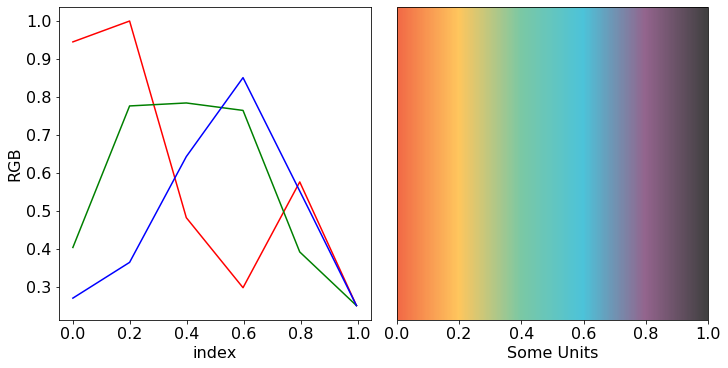

In [165]:
colors_html = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
red = []
green = []
blue = []
for c, i in zip(colors_html, np.linspace(0, 1, len(colors_html))):
    print(i, mpl.colors.hex2color(c))
    red.append([i, mpl.colors.hex2color(c)[0], mpl.colors.hex2color(c)[0]])
    green.append([i, mpl.colors.hex2color(c)[1], mpl.colors.hex2color(c)[1]])
    blue.append([i, mpl.colors.hex2color(c)[2], mpl.colors.hex2color(c)[2]])
cdict = {'red': red, 'green': green, 'blue': blue}
plot_linearmap(cdict)
cmap = mpl.colors.LinearSegmentedColormap('ubq_transitions', cdict, N=256)

TypeError: unhashable type: 'slice'

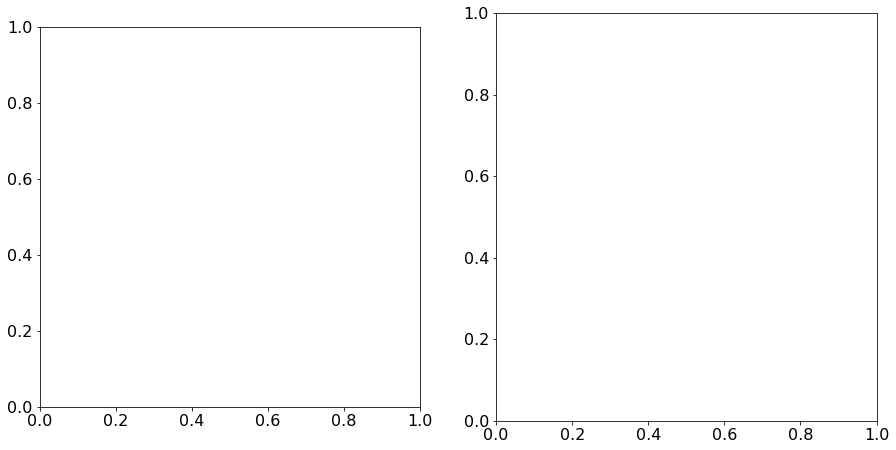

In [26]:
mpl.rcParams.update({'font.size': 16})
fig, (ax, ax2) = plt.subplots(ncols=2)
fig.set_size_inches(15, 7.5)
ax.set_aspect('equal')

# define ranges
xrange = np.ptp(data[:,0])
x = np.linspace(data[:,0].min() - xrange / 3 - .2, data[:,0].max() + xrange / 3 - .5, 500)
yrange = np.ptp(data[:,1])
y = np.linspace(data[:,1].min() - yrange, data[:,1].max() + yrange, 500)
ax.set_xlim([x.min(), x.max()])
ax.set_ylim([y.min(), y.max()])

# meshgrid
(X,Y) = np.meshgrid(x,y)

# stack some gaussians
a = np.zeros(X.shape)
sigma = 200
gaussians = []
positions = []
for i, d in enumerate(data):
    gauss = np.exp(-(np.full(Y.shape, sigma) * (X+d[0])**2 + np.full(Y.shape, sigma) * (Y+d[1])**2)/2)
    gaussians.append(gauss)
    positions.append([X.ravel()[gauss.argmax()], Y.ravel()[gauss.argmax()]])
    a += (i+1) * gauss
    
# plot the stacked gaussians
# a = np.ma.masked_where(a < 0.05, a)
# c = ax.contourf(x,y,np.flip(a)[::-1,:], cmap=cmap)

# plot every gaussian for itself
for i, (c, g) in enumerate(zip(colors_html, gaussians)):
    c = mpl.colors.hex2color(c)
    cdict = {'red': [[0, 1, 1], [.2, c[0], c[0]], [1, c[0], c[0]]], 'green': [[0, 1, 1], [.2, c[1], c[1]], [1, c[1], c[1]]],
             'blue': [[0, 1, 1], [.2, c[2], c[2]], [1, c[2], c[2]]], 'alpha': [[0, 0, 0], [.5, .3, .3], [.98, 1, 1], [1, 1, 1]]}
    cmap = mpl.colors.LinearSegmentedColormap('ubq_transitions', cdict, N=256)
    cmap.set_bad('w')
    g = np.ma.masked_where(g < 1e-5, g)
    cnt = ax.contourf(x, y, g[:,::-1], cmap=cmap, norm=mpl.colors.LogNorm(), zorder=-i, levels=256)
    for c in cnt.collections:
        c.set_edgecolor("face")
        c.set_linewidth(1e-25)
    for c in cnt.collections:
        c.set_edgecolor("face")
        c.set_linewidth(1e-25)
        
# annotate
for i, s in enumerate(ubqs):
    txt = ax.text(data[i,0], -data[i,1], s, fontsize=24, color='k', va='center', ha='right', transform=ax.transData)
    # txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])

#remove ticks
ax.set_xticks([])
ax.set_yticks([])

# ax2
ax2_bins = 200

H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=ax2_bins)

xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

for i in range(ax2_bins):
    for j in range(ax2_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
for i in range(1, ax2_bins - 1):
    for j in range(1, ax2_bins - 1):
        _ = (H[i-1, j] == 1 or H[i, j-1] == 1 or H[i-1, j-1] == 1 or H[i+1, j] == 1 or H[i, j+1] == 1 or H[i+1, j+1] == 1)
        if _:
            H_new[i, j] = 1

ax2.contour(X, Y, H_new.T, cmap=plt.cm.Greys, levels=2, zorder=1)

index = ['K63' in name for name in trajs.name_arr]

H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=ax2_bins)

xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

for i in range(ax2_bins):
    for j in range(ax2_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
            
cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', ['#93648D', '#93648D'], N=2)
cmap.set_bad('w', alpha=0)
H_new = np.ma.masked_where(H_new == 0, H_new)
            
ax2.contourf(X, Y, H_new.T, cmap=cmap, levels=2, zorder=-1)

index = ['K51' in name for name in trajs.name_arr]

H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=ax2_bins)

xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

for i in range(ax2_bins):
    for j in range(ax2_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
            
cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', ['#4CC3D9', '#4CC3D9'], N=2)
cmap.set_bad('w', alpha=0)
H_new = np.ma.masked_where(H_new == 0, H_new)
            
ax2.contourf(X, Y, H_new.T, cmap=cmap, levels=2, zorder=-1)

index = ['K41' in name for name in trajs.name_arr]

H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=ax2_bins)

xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

for i in range(ax2_bins):
    for j in range(ax2_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
            
cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', ['#FFC65D', '#FFC65D'], N=2)
cmap.set_bad('w', alpha=0)
H_new = np.ma.masked_where(H_new == 0, H_new)
            
ax2.contourf(X, Y, H_new.T, cmap=cmap, levels=2, zorder=-1)

ax2.set_xlabel('x in a.u.')
ax2.set_ylabel('y in a.u.')

# A and B annotations
txt = ax.text(0.05, 0.95, 'A', transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=26, verticalalignment='top', color='k')

plt.tight_layout()

plt.savefig("MDS_of_EMD.png", dpi=600, tranparent=True)
plt.savefig("/home/kevin/projects/living_ppt/EMD/MDS_of_EMD.png", dpi=600, tranparent=True)

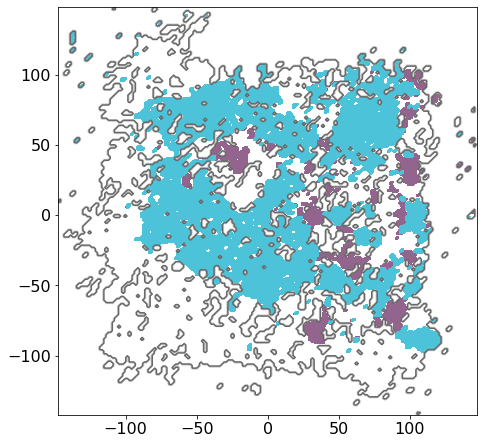

In [248]:
mpl.rcParams.update({'font.size': 16})
fig, ax2 = plt.subplots()
fig.set_size_inches(7.5, 7.5)
ax.set_aspect('equal')

ax2_bins = 200

H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=ax2_bins)

xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

for i in range(ax2_bins):
    for j in range(ax2_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
for i in range(1, ax2_bins - 1):
    for j in range(1, ax2_bins - 1):
        _ = (H[i-1, j] == 1 or H[i, j-1] == 1 or H[i-1, j-1] == 1 or H[i+1, j] == 1 or H[i, j+1] == 1 or H[i+1, j+1] == 1)
        if _:
            H_new[i, j] = 1

ax2.contour(X, Y, H_new.T, cmap=plt.cm.Greys, levels=2, zorder=1)

index = ['K63' in name for name in trajs.name_arr]

H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=ax2_bins)

xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

for i in range(ax2_bins):
    for j in range(ax2_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
for i in range(1, ax2_bins - 1):
    for j in range(1, ax2_bins - 1):
        _ = (H[i-1, j] == 1 or H[i, j-1] == 1 or H[i-1, j-1] == 1 or H[i+1, j] == 1 or H[i, j+1] == 1 or H[i+1, j+1] == 1)
        if _:
            H_new[i, j] = 1
            
cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', ['#93648D', '#93648D'], N=2)
cmap.set_bad('w', alpha=0)
H_new = np.ma.masked_where(H_new == 0, H_new)
            
ax2.contourf(X, Y, H_new.T, cmap=cmap, levels=2, zorder=-1)

index = ['K51' in name for name in trajs.name_arr]

H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=ax2_bins)

xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

for i in range(ax2_bins):
    for j in range(ax2_bins):
        if H[i,j] > 0:
            H[i,j] = 1
H_new = copy.deepcopy(H)
for i in range(1, ax2_bins - 1):
    for j in range(1, ax2_bins - 1):
        _ = (H[i-1, j] == 1 or H[i, j-1] == 1 or H[i-1, j-1] == 1 or H[i+1, j] == 1 or H[i, j+1] == 1 or H[i+1, j+1] == 1)
        if _:
            H_new[i, j] = 1
            
cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', ['#4CC3D9', '#4CC3D9'], N=2)
cmap.set_bad('w', alpha=0)
H_new = np.ma.masked_where(H_new == 0, H_new)
            
ax2.contourf(X, Y, H_new.T, cmap=cmap, levels=2, zorder=-1)

-1.089995426579783 1.448146516239007
-1.0331251169081854 1.1679793469878748


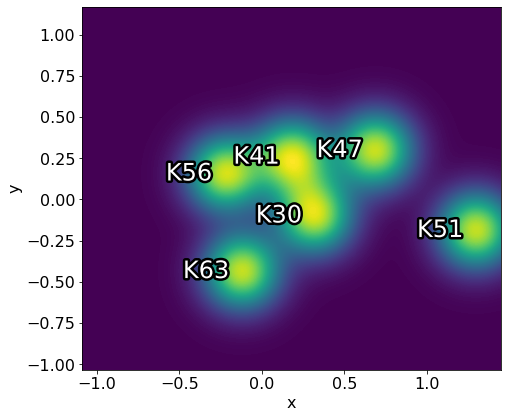

In [151]:
mpl.rcParams.update({'font.size': 16})
fig, ax = plt.subplots()
fig.set_size_inches(7.5, 7.5)
ax.set_aspect('equal')

xrange = np.ptp(data[:,0])
x = np.linspace(data[:,0].min() - xrange / 3, data[:,0].max() + xrange / 3, 500)
print(x[0], x[-1])
yrange = np.ptp(data[:,1])
y = np.linspace(data[:,1].min() - yrange, data[:,1].max() + yrange, 500)
print(y[0], y[-1])
ax.set_xlim([x.min(), x.max()])
ax.set_ylim([y.min(), y.max()])

cmap = mpl.colors.LinearSegmentedColormap('ubq_transitions', cdict, N=256)

(X,Y) = np.meshgrid(x,y)
a = np.zeros(X.shape)
sigma = 200
gaussians = []
positions = []
for i, d in enumerate(data):
    gauss = np.exp(-(np.full(Y.shape, sigma) * (X+d[0])**2 + np.full(Y.shape, sigma) * (Y+d[1])**2)/10)
    gaussians.append(gauss)
    positions.append([X.ravel()[gauss.argmax()], Y.ravel()[gauss.argmax()]])
    a += gauss
# a = np.ma.masked_where(a <, a)
c = ax.contourf(x,y,np.flip(a)[::-1,:], cmap=plt.cm.viridis, levels=200)
lx = ax.set_xlabel("x")
ly = ax.set_ylabel("y")

for i, s in enumerate(ubqs):
    txt = ax.text(data[i,0], -data[i,1], s, fontsize=24, color='w', va='center', ha='left', transform=ax.transData)
    txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])

plt.show()

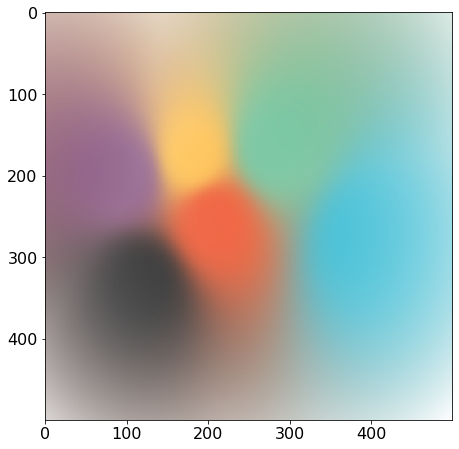

In [163]:
mpl.rcParams.update({'font.size': 16})
fig, ax = plt.subplots()
fig.set_size_inches(7.5, 7.5)
ax.set_aspect('equal')

npixels = 500

colors_html = ['F16745', 'FFC65D', '7BC8A4', '4CC3D9', '93648D', '404040']
colors_html = [s.lower() for s in colors_html]

xrange = np.ptp(data[:,0])
x, xstep = np.linspace(data[:,0].min() - xrange / 3, data[:,0].max() + xrange / 3, npixels, retstep=True)
yrange = np.ptp(data[:,1])
y, ystep = np.linspace(data[:,1].min() - yrange, data[:,1].max() + yrange, npixels, retstep=True)

(X,Y) = np.meshgrid(x,y)

def combine_hex_values(d):
    d_items = sorted(d.items())
    tot_weight = sum(d.values())
    red = int(sum([int(k[:2], 16)*v for k, v in d_items])/tot_weight)
    green = int(sum([int(k[2:4], 16)*v for k, v in d_items])/tot_weight)
    blue = int(sum([int(k[4:6], 16)*v for k, v in d_items])/tot_weight)
    zpad = lambda x: x if len(x)==2 else '0' + x
    return zpad(hex(red)[2:]) + zpad(hex(green)[2:]) + zpad(hex(blue)[2:])

a = np.zeros(X.shape)
sigma = 200
gaussians = []
positions = []
for i, d in enumerate(data):
    gauss = np.exp(-(np.full(Y.shape, sigma) * (X+d[0])**2 + np.full(Y.shape, sigma) * (Y+d[1])**2)/10)
    gaussians.append(gauss)
    positions.append([X.ravel()[gauss.argmax()], Y.ravel()[gauss.argmax()]])
    a += gauss
a = a**12
norm = mpl.colors.LogNorm(a.min(), a.max())

C = np.empty((npixels, npixels, 4))

for i in range(npixels):
    for j in range(npixels):
        center = np.array([X[i, j] + xstep , Y[i,j] + ystep])
        feed_dict = dict(zip(colors_html, [1/np.linalg.norm(d - center)**4 for d in data]))
        C[i, j, :3] = mpl.colors.hex2color('#' + combine_hex_values(feed_dict))
        C[i, j, 3] = norm(a[i, j])

ax.imshow(C)

In [116]:
data

array([[-0.03728951,  0.09727732],
       [-0.17324981, -0.25956203],
       [ 0.33132703, -0.29942363],
       [ 0.94051813,  0.18506492],
       [-0.58236704, -0.15763444],
       [-0.47893881,  0.43427786]])

# Sketch map of individual sims.

In [74]:
trajs_tmp_list = []
for ubq in ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']:
    xtcs = glob.glob(f"/home/kevin/master/analysis_and_pics/all_trajs/*{ubq}*.xtc")
    ref = glob.glob(f"/home/kevin/master/analysis_and_pics/{ubq}/{ubq}_*_no*.pdb")
    if len(ref) == 0:
        print(ubq)
        raise Exception("no ref found")
    ref = ref[0]
    trajs_tmp = ep.Info_all(xtcs, [ref for i in xtcs], common_str=[ubq])
    for traj in trajs_tmp:
        if '_nosolv' in traj.basename:
            traj.basename = traj.basename.split('_nosolv')[0]
        # find lowd
        if 'K47' in traj.basename or 'K51' in traj.basename:
            if os.path.isfile(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/{ubq}/10th_run/Analysis/sketch/projs_new_after_3rd_1st-10th_run/lowd_{ubq}_dists_{traj.basename}"):
                traj.lowd = np.loadtxt(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/{ubq}/10th_run/Analysis/sketch/projs_new_after_3rd_1st-10th_run/lowd_{ubq}_dists_{traj.basename}")[:,:2]
            elif os.path.isfile(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/{ubq}/10th_run/Analysis/sketch/projs_new_after_2nd_1st-10th_run/lowd_{ubq}_dists_{traj.basename}"):
                traj.lowd = np.loadtxt(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/{ubq}/10th_run/Analysis/sketch/projs_new_after_2nd_1st-10th_run/lowd_{ubq}_dists_{traj.basename}")[:,:2]
            elif os.path.isfile(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/sketch_K47-K51/{ubq}/{ubq}_dists_{traj.basename}"):
                traj.lowd = np.loadtxt(f"/home/kevin/hiwi_project/h1ubi/analysis_sasa_sketchmap/sketch_K47-K51/{ubq}/{ubq}_dists_{traj.basename}")[:,:2]
            else:
                raise Exception(f"could not find file {traj.basename}")
        else:
            if os.path.isfile(f"/home/kevin/master/molsim/10th_run/analysis/1GHC/{ubq}/sketch_1st_2nd_3rd_4th_5th_6th_7th_8th_9th_scaled/lowd_{traj.basename}_mindistres"):
                traj.lowd = np.loadtxt(f"/home/kevin/master/molsim/10th_run/analysis/1GHC/{ubq}/sketch_1st_2nd_3rd_4th_5th_6th_7th_8th_9th_scaled/lowd_{traj.basename}_mindistres")[:,:2]
            elif os.path.isfile(f"/home/kevin/master/molsim/10th_run/analysis/1GHC/{ubq}/sketch_10th_scaled/lowd_{traj.basename}_mindistres"):
                traj.lowd = np.loadtxt(f"/home/kevin/master/molsim/10th_run/analysis/1GHC/{ubq}/sketch_10th_scaled/lowd_{traj.basename}_mindistres")[:,:2]
            else:
                raise Exception(f"could not find file {traj.basename}")
    trajs_tmp.lowd_ = np.vstack([traj.lowd for traj in trajs_tmp])
    trajs_tmp_list.append(trajs_tmp)
# trajs_tmp_list[-1]._gen_index_arr()
# trajs_tmp_list[-1].dim = 2
trajs_tmp_list[-1].generate_pandas(boundary=50, overwrite=True)
# trajs_tmp_list[-1].lowd = trajs_tmp_list[-1].df[['x', 'y']].values

Scaled 325 points. Finding (x,y) duplicates. This might take some time.


AttributeError: can't set attribute

In [72]:
dir(trajs_tmp_list[-1])

['Dim',
 '__add__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__next__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_get_full_common_str_and_ref',
 '_inherit_sigmoids',
 '_pyemma_indexing',
 '_return_trajs_by_index',
 '_string_summary',
 '_traj_files',
 'backend',
 'basenames',
 'boundary',
 'common_str',
 'df',
 'dim',
 'dump_pandas',
 'from_list',
 'generate_pandas',
 'get_single_frame',
 'highd',
 'highd_landmarks',
 'index',
 'index_arr',
 'load',
 'load_highd',
 'load_lowd',
 'load_trajs',
 'locations',
 'lowd',
 'lowd_',
 'lowd_landmarks',
 'n_frames',
 'n_trajs',
 'name_arr',
 'ref_pdbs',
 'references',
 'save_highd',
 'save_lowd',
 'set_cluster_exemplars

In [ ]:
ep.misc.scale_projs(trajs_tmp_list[-1], 50)

In [ ]:
trajs_tmp_list[-1].df[['x', 'y']] = trajs_tmp_list[-1].lowd

**Get angles**

In [63]:
angle_colors = [[] for i in trajs_tmp_list]

angles = np.arange(-160, 181, 20).astype(int)
colors_rgba = plt.cm.twilight(np.linspace(0, 1, 18))

for i, trajs_ in enumerate(trajs_tmp_list):
    for traj_ in trajs_:
        if '1GHC' in traj_.basename:
            angle = int(traj_.basename.split('_')[2])
        else:
            angle = int(traj_.basename.split('_')[1])
        assert angle in angles
        color = colors_rgba[np.where(angles == angle)[0]].flatten().tolist()
        angle_colors[i].extend([color for _ in range(len(traj_.lowd))])

In [64]:
for i in angle_colors:
    print(len(i))

79398
79398
108198
82192
79398
79398


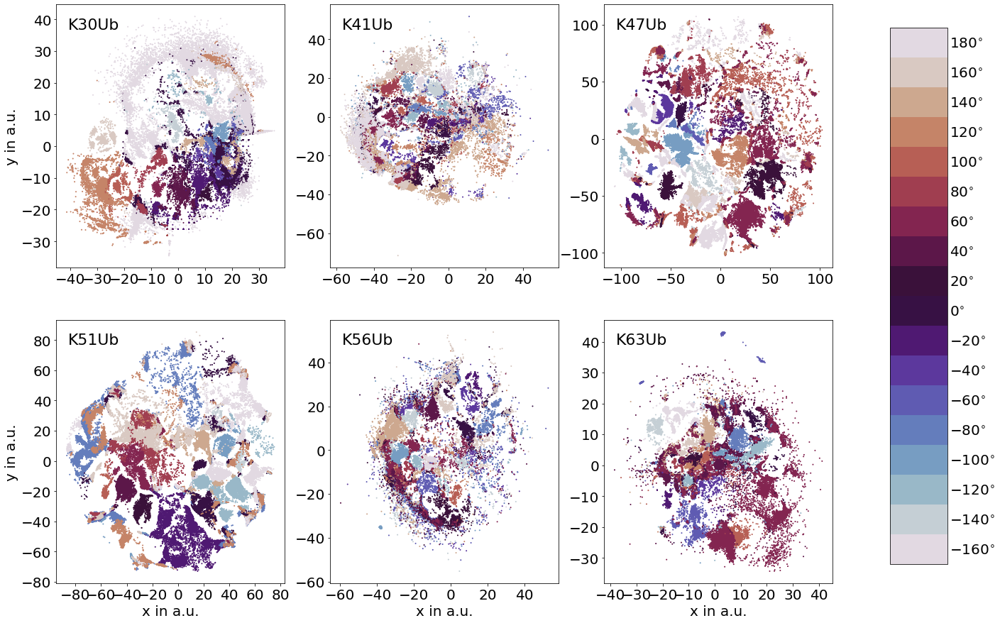

In [99]:
mpl.rcParams.update({'font.size': 20})

# UBQs
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
ubqs = ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']

# Angles
angles = np.arange(-160, 181, 20).astype(int)
colors_rgba = plt.cm.twilight(np.linspace(0, 1, 18))

plt.close('all')
fig, axes = plt.subplots(ncols=3, nrows=2)
fig.set_size_inches(22.5,15)

iter_ = 0
for i in range(2):
    for j in range(3):
        ax = axes[i, j]
        if i == 1 and j == 2:
            ax.scatter(*trajs_tmp_list[-1].df[['x', 'y']].values.T, c=angle_colors[iter_], s=1)
        else:
            ax.scatter(*trajs_tmp_list[iter_].lowd.T, c=angle_colors[iter_], s=1)
        ubq_ = list(set([traj.common_str for traj in trajs_tmp_list[iter_]]))
        assert len(ubq_)
        ubq_ = ubq_[0]
        txt = ax.text(0.05, 0.95, ubq_+'Ub', transform=ax.transAxes, fontsize=22, verticalalignment='top', color='k')
        if i == 0 and j == 0:
            ax.set_ylabel('y in a.u.')
        if i == 1 and j == 0:
            ax.set_ylabel('y in a.u.')
            ax.set_xlabel('x in a.u.')
        if i == 1 and j == 1 or i == 1 and j == 2:
            ax.set_xlabel('x in a.u.')
        iter_ += 1
        
# instead of axes divider use the adjust method
fig.subplots_adjust(right=0.8)
# create cax
cax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# colors_rgba = [mpl.colors.hex2color(color) for color in colors]
cm = mpl.colors.LinearSegmentedColormap.from_list('name', colors_rgba, N=len(angles))
norm = mpl.colors.Normalize(vmin=0, vmax=len(angles))
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
cmap_ticks = np.linspace(0, 1, len(angles) + 1) + 1.0/(len(angles) * 2)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=cmap_ticks)
# change yticklabels
ang_labels = [f"${i}" + r"^{\circ}$" for i in angles]
yticklabels = cb.ax.set_yticklabels(ang_labels + ['test'])
# remove tick length
cb.ax.tick_params(axis="y",direction="out", length=0)

plt.savefig("/home/kevin/projects/paper_2019/six_individual_sketchamps.highq.png", transparent=True, dpi=600)
plt.savefig("/home/kevin/projects/paper_2019/six_individual_sketchamps.png", transparent=True, dpi=200)
plt.savefig("/home/kevin/projects/living_ppt/dimred/six_individual_sketchamps.png", transparent=True, dpi=600)
mpl.rcParams.update({'font.size': 10})

# Density wihtout removing regions.

In [161]:
import pyemma

/home/kevin/.conda/envs/work_3/lib/python3.6/site-packages/matplotlib/contour.py:1000: UserWarning: The following kwargs were not used by contour: 'ncontours'
  s)
/home/kevin/.conda/envs/work_3/lib/python3.6/site-packages/matplotlib/contour.py:1000: UserWarning: The following kwargs were not used by contour: 'ncontours'
  s)


7398 69804


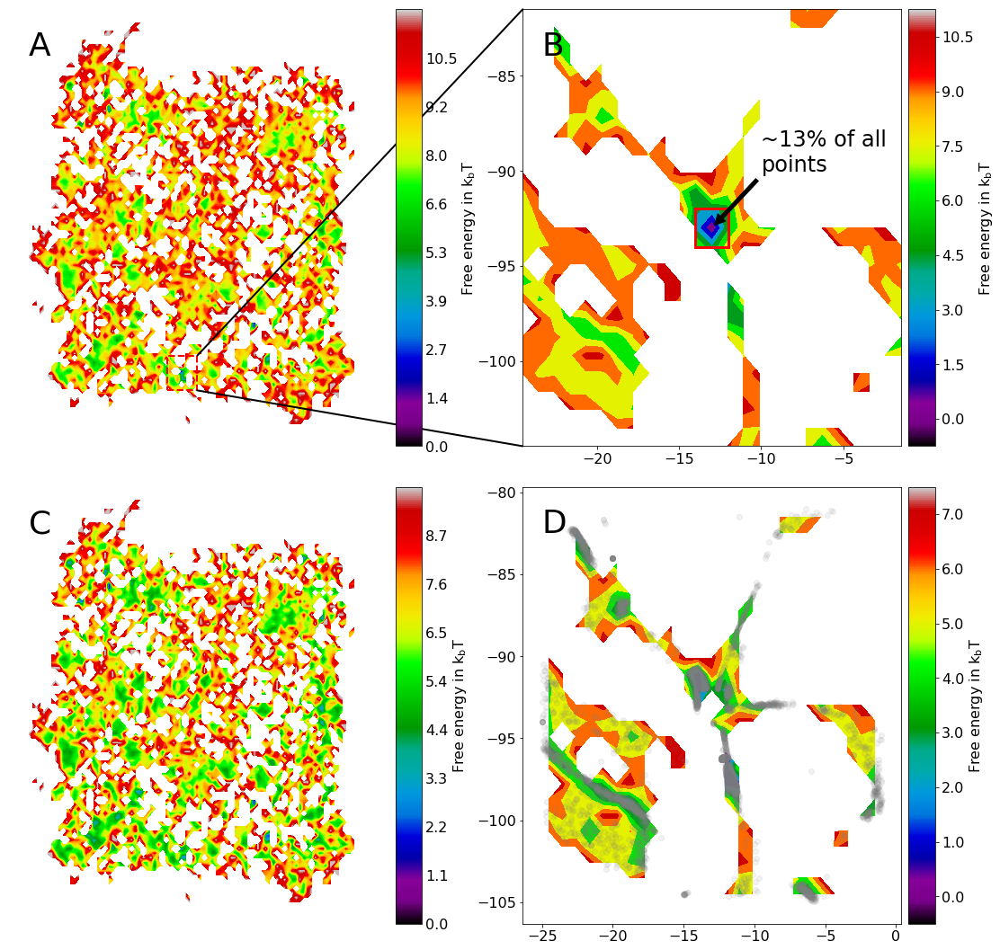

In [246]:
fig, ((ax1, ax2), (ax4, ax3)) = plt.subplots(ncols=2, nrows=2)

fig.set_size_inches(15, 15)

cmap = 'nipy_spectral'

ep.plotting.plot_density(trajs, ax=ax1, to_plot='free_energy', cmap='nipy_spectral')
ep.plotting.plot_density(trajs, to_plot='free_energy', cmap='nipy_spectral', ax=ax4, exclude_region=[[-14, -12, -94, -92], [42, 42.75, -61.5, -60.5]])
txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=36, verticalalignment='top', color='k')
txt = ax4.text(0.05, 0.95, 'C', transform=ax4.transAxes, fontsize=36, verticalalignment='top', color='k')
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=36, verticalalignment='top', color='k')
txt = ax3.text(0.05, 0.95, 'D', transform=ax3.transAxes, fontsize=36, verticalalignment='top', color='k')

# data for histogram
section = (trajs.lowd[:,0] >= -25) & (trajs.lowd[:,0] < -1) & (trajs.lowd[:,1] >= -105) & (trajs.lowd[:,1] < -81)
where = np.where(section)
full_data = trajs.lowd[where]

# histogram
H, xedges, yedges = np.histogram2d(*full_data.T, bins=25)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]] 
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)
kT = 1.0
F = pyemma.plots.plots2d._to_free_energy(H, minener_zero=True) * kT
mappable = ax2.contourf(xcenters, ycenters, F.T, ncontours=100, norm=None, vmin=None, vmax=None, cmap='nipy_spectral', levels=None)
# ax2.set_xlim([-14, -12])
# ax2.set_ylim([-94, -92])

# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax2)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
# get the number of independent colors in the mappable
mappable_values = np.unique(mappable.get_array())
no_ticks = 10
# define the ticks between 0 and 1
if len(mappable_values) < 10:
    cmap_ticks = np.linspace(0, 1, len(mappable_values))
else:
    cmap_ticks = np.linspace(0, 1, no_ticks)
cmap_ticks = cmap_ticks + (cmap_ticks[1] - cmap_ticks[0]) / 2
# if free_energy is selected omit the last tick (which should lie at inf)
cmap_ticks = cmap_ticks[:-1]
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=cmap_ticks)
# define the slice to slice the mappable values into 10 points.
idx = np.round(np.linspace(0, len(mappable_values) - 1, len(cmap_ticks))).astype(int)
# change yticklabels
idx = np.round(np.linspace(0, len(mappable_values) - 1, len(cmap_ticks) + 1)).astype(int)[:-1]
yticklabels = cb.ax.set_yticklabels(np.round(mappable_values[idx].astype(float), decimals=1))
cax.set_ylabel(r'Free energy in $\mathrm{k_bT}$')

# zooming box
ep.plotting.plotting._zoomingBoxManual(ax1, ax2)

# data for histogram
exclude = (full_data[:,0] >= -14) & (full_data[:,0] < -12) & (full_data[:,1] >= -94) & (full_data[:,1] < -92)
where = np.where(~exclude)[0]
print(len(where), len(full_data))
data = full_data[where]

# histogram
H, xedges, yedges = np.histogram2d(*data.T, bins=25)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]] 
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)
kT = 1.0
F = pyemma.plots.plots2d._to_free_energy(H, minener_zero=True) * kT
mappable = ax3.contourf(xcenters, ycenters, F.T, ncontours=100, norm=None, vmin=None, vmax=None, cmap='nipy_spectral', levels=None)
# ax2.set_xlim([-14, -12])
# ax2.set_ylim([-94, -92])

# use the axes divider method to add colorbar
ax_divider2 = make_axes_locatable(ax3)
# add colorbaraxis to work with ticks and whatnot
cax2 = ax_divider2.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
# get the number of independent colors in the mappable
mappable_values = np.unique(mappable.get_array())
no_ticks = 10
# define the ticks between 0 and 1
if len(mappable_values) < 10:
    cmap_ticks = np.linspace(0, 1, len(mappable_values))
else:
    cmap_ticks = np.linspace(0, 1, no_ticks)
cmap_ticks = cmap_ticks + (cmap_ticks[1] - cmap_ticks[0]) / 2
# if free_energy is selected omit the last tick (which should lie at inf)
cmap_ticks = cmap_ticks[:-1]
# initialize colormapr
cb = plt.colorbar(sm, cax=cax2, ticks=cmap_ticks)
# define the slice to slice the mappable values into 10 points.
idx = np.round(np.linspace(0, len(mappable_values) - 1, len(cmap_ticks))).astype(int)
# change yticklabels
idx = np.round(np.linspace(0, len(mappable_values) - 1, len(cmap_ticks) + 1)).astype(int)[:-1]
yticklabels = cb.ax.set_yticklabels(np.round(mappable_values[idx].astype(float), decimals=1))
cax2.set_ylabel(r'Free energy in $\mathrm{k_bT}$')

# plot the 
exclude_region=[[-14, -12, -94, -92], [42, 42.75, -61.5, -60.5]]
ax3.scatter(*data.T, c='grey', alpha=0.1)
# ax3.scatter(*full_data[np.where(exclude)].T, c='red', alpha=0.01)

patch = mpl.patches.Rectangle((-14, -94), 2, 2, ec='red', fc='none', lw=3)
ax2.add_artist(patch)

ax2.annotate('\n'.join(['~13% of all', 'points']), xy=(-13, -93), xytext=(-10, -90),
            arrowprops=dict(facecolor='black', shrink=0.05), fontsize=24,
            )

plt.savefig("/home/kevin/projects/paper_2019/density_without_removal.png", transparent=True, dpi=600)
plt.savefig("/home/kevin/projects/living_ppt/dimred/density_without_removal.png", transparent=True, dpi=600)

# Get the number of points in this region.

In [212]:
xy = trajs.df[['x', 'y']].values
extent = [-14, -12, -94, -92]
dense_region = np.where((xy[:,0] >= extent[0]) & (xy[:,0] < extent[1]) | (xy[:,1] >= extent[2]) & (xy[:,1] < extent[3]))[0]
print(f"{np.round(len(new) / xy.shape[0] * 100, 2)}% of points are in this super dense region.")

14.22% of points are in this super dense region.


In [204]:
logfile = "/home/kevin/projects/clustering/hdbscan_with_RMSD_correction/logfile.log"
with open(logfile, 'r') as f:
    logfile = f.readlines()[:1000]
for line in logfile:
    if 'very dense'in line:
        print(line)
    if 'Clustering with min_clust_size = 500.' in line:
        break

Removed a very dense region with a density of 2943.43 pts/area. Containing 0.24% of all points.

Removed a very dense region with a density of 20522.98 pts/area. Containing 0.91% of all points.

Removed a very dense region with a density of 10737.38 pts/area. Containing 0.44% of all points.

Removed a very dense region with a density of 34019.86 pts/area. Containing 2.11% of all points.

Removed a very dense region with a density of 19068.40 pts/area. Containing 0.3% of all points.

Removed a very dense region with a density of 34449.17 pts/area. Containing 0.85% of all points.

Removed a very dense region with a density of 50372.39 pts/area. Containing 3.03% of all points.

Removed a very dense region with a density of 33492.52 pts/area. Containing 0.93% of all points.

Removed a very dense region with a density of 54039.22 pts/area. Containing 1.36% of all points.

Removed a very dense region with a density of 23518.39 pts/area. Containing 0.35% of all points.

Removed a very dense r

# Starting angle divergence

Get some starting trajs

In [251]:
starting_trajs = []

for traj in trajs:
    basename = traj.basename
    if '1GHC_' in basename:
        basename = basename.split('1GHC_')[1]
    if len(basename.split('_')) == 2:
        starting_trajs.append(traj)
        
starting_trajs = np.random.choice(starting_trajs, 20)

In [266]:
angles = []
for traj in starting_trajs:
    indices = traj.traj.top.select('resname LYQ and (name CB or name CG or name CD or name CQ)').reshape(1, 4)
    angles.append(md.compute_dihedrals(traj.traj, indices=indices))

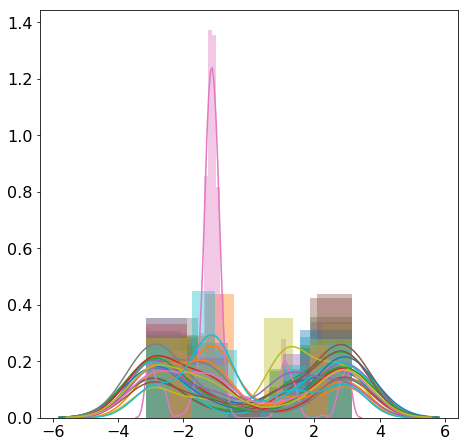

In [280]:
mpl.rcParams.update({'font.size': 16})

plt.close('all')
fig, ax = plt.subplots()
fig.set_size_inches(7.5, 7.5)

for a in angles:
    sns.distplot(a, ax=ax, hist=True)

In [273]:
_ = np.array(angles).reshape(20, 401)
print(_.shape)

(20, 401)


In [276]:
_.min()

-3.141542

# Veronika's sims and high correlation

**Set env variables**

In [27]:
try: ep.misc.set_gmx_environ_2020_cuda_shared_AVX_512_16_04()
except Exception:
    print(os.environ['PATH'])

/home/soft/gromacs/gromacs-2020/inst/cuda_shared_16.04/bin:/home/kevin/.t_coffee/bin/linux:/home/kevin/.t_coffee/bin/linux:/home/soft/AMBER/tools/acpype:/home/soft/GAMESS_US/gamess:/home/soft/PACE/GROMACS/programs/genpair:/home/soft/scripts/bin:/home/soft/ORCA/orca_3_0_3_linux_x86-64:/home/soft/plumo/plumo/cgtools:/home/soft/plumo/opt-mhm:/home/soft/plumo/peptideB:/home/soft/TimeScapes/TimeScapes-1.3.1/objs/Linux/x86_64/gcc-4.8/bin:/home/soft/xdrfile-1.1.1/bin:/home/soft/PLUMED/plumed-2.0.2/bin:/home/soft/TOOLS/moltemplate/moltemplate/scripts:/home/soft/TOOLS/moltemplate/moltemplate:/home/soft/VOTCA/VOTKA_CSG/bin:/home/soft/bin:/home/kevin/.t_coffee/bin/linux:/home/kevin/.t_coffee/bin/linux:/home/kevin/.conda/envs/work_3/bin:/home/kevin/anaconda3/condabin:/home/soft/AMBER/tools/acpype:/home/soft/GAMESS_US/gamess:/home/soft/PACE/GROMACS/programs/genpair:/home/soft/scripts/bin:/home/soft/ORCA/orca_3_0_3_linux_x86-64:/home/soft/plumo/plumo/cgtools:/home/soft/plumo/opt-mhm:/home/soft/plumo

## Some gmx trjconv

In [53]:
sims = glob.glob('/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K*/K*/3-NPT/protein_1micros.xtc')

os.chdir("/home/kevin/projects/paper_2019/")

for sim in sims:
    # dirs
    dir_ = os.path.split(sim)[0]
    current = "/home/kevin/projects/paper_2019/"
    name = sim.split('/')[8]
    out = "/home/kevin/projects/veronika_sims/" + name
    print(dir_)
    
    shutil.copyfile(f'{dir_}/topol.tpr', f'{out}/topol.tpr')
    
#     # makedirs
#     name = sim.split('/')[8]
#     out = current + '/' + name
#     os.makedirs(out, exist_ok=True)
#     tpr = f'{os.path.split(sim)[0]}/topol.tpr'
#     os.chdir(dir_)
#     print(tpr)
#     cmd = f'echo "1\n1" | gmx trjconv -f {sim} -s {tpr} -dt 50 -o {out}/{name}_1micros.xtc -pbc nojump -ur compact'
#     if not os.path.isfile(f'{out}/{name}_1micros.xtc'):
#         print(cmd)
#         proc = subprocess.Popen(cmd , stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE, shell=True)
#         out_proc = proc.stderr.read().decode('utf-8')
#         print(out_proc)
#     else:
#         print('already there')

/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K47/K47_-100/3-NPT
/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K47/K47_140/3-NPT
/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K47/K47_20/3-NPT
/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K51/K51_-120/3-NPT
/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K51/K51_0/3-NPT
/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K51/K51_120/3-NPT
/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K63/K63_-100/3-NPT
/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K63/K63_140/3-NPT
/mnt/scc/internship/veronika/Ubiquitination_of_H1_complexes/explicit_solvent_simulation/K63/K63_20/3-NPT


In [53]:
veronika_trajs = ep.Info_all(glob.glob("/home/kevin/projects/veronika_sims/K*/*.xtc"), trajs.references, common_str=['K47', 'K51', 'K63'])
# veronika_trajs.load()
veronika_trajs

BadError: (╯°□°)╯︵ ┻━┻ Class method `load_trajs` has been replaced by `load` to keep consistency to Info_single.

## COG distances

In [274]:
files = glob.glob("/home/kevin/projects/veronika_sims/K*/cog_distances.npy")
cog_distances = [np.load(f) for f in files]

# for traj in veronika_trajs:
#     dir_name = traj.basename.split('_1micros')[0]
#     ubq_index = trajs[0].traj.top.select("resid 0 to 75")
#     print("Resname of last residue in 1st subunit is {}".format(trajs[0].traj.top.atom(ubq_index[-1])))
#     H5_index = trajs[0].traj.top.select("resid 76 to 999")
#     cog1 = np.mean(traj.traj.xyz[:,ubq_index], axis=1)
#     cog2 = np.mean(traj.traj.xyz[:,H5_index], axis=1)
#     dists = cog2 - cog1
#     dists = np.stack([np.linalg.norm(d) for d in dists])
#     cog_distances.append(dists)
#     np.save(f"/home/kevin/projects/veronika_sims/{dir_name}/cog_distances.npy", dists)

## DSSP

In [145]:
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.axes_grid1.colorbar import colorbar
import matplotlib.patches as mpatches
import matplotlib.patheffects as PathEffects

In [180]:
for traj in veronika_trajs:
    if traj.basename == 'K47_20_1micros':
        break
print(traj)

dssp = md.compute_dssp(traj.traj, simplified=False)

mapping_dict = {' ': 0, 'E': 1, 'B': 2, 'S': 3, 'T': 4, 'H': 5, 'I': 6, 'G': 7}

for i, x in enumerate(dssp):
    if i == 0:
        data = np.array([mapping_dict[letter] for letter in x])
    else:
        new_array = np.array([mapping_dict[letter] for letter in x])
        data = np.vstack([data, new_array])

dssp_colors = ['white', 'red', 'black', 'green', 'yellow', 'blue', 'purple', 'gray']
dssp_names = ['Coil', r'$\beta$-Sheet', r'$\beta$-Bridge', 'Bend', 'Turn', r'$\alpha$-Helix', r'$\pi$-Helix', r'$3_{10}$-Helix']
cmap = mpl.colors.ListedColormap(dssp_colors)
bounds = [-0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

expansion_elephant.Info_single object. Current backend is mdtraj. Basename is K47_20_1micros. Not containing any highD or lowd data. Containing 1452 atoms. Containing 20001 frames. Common string is K47.


## Plot

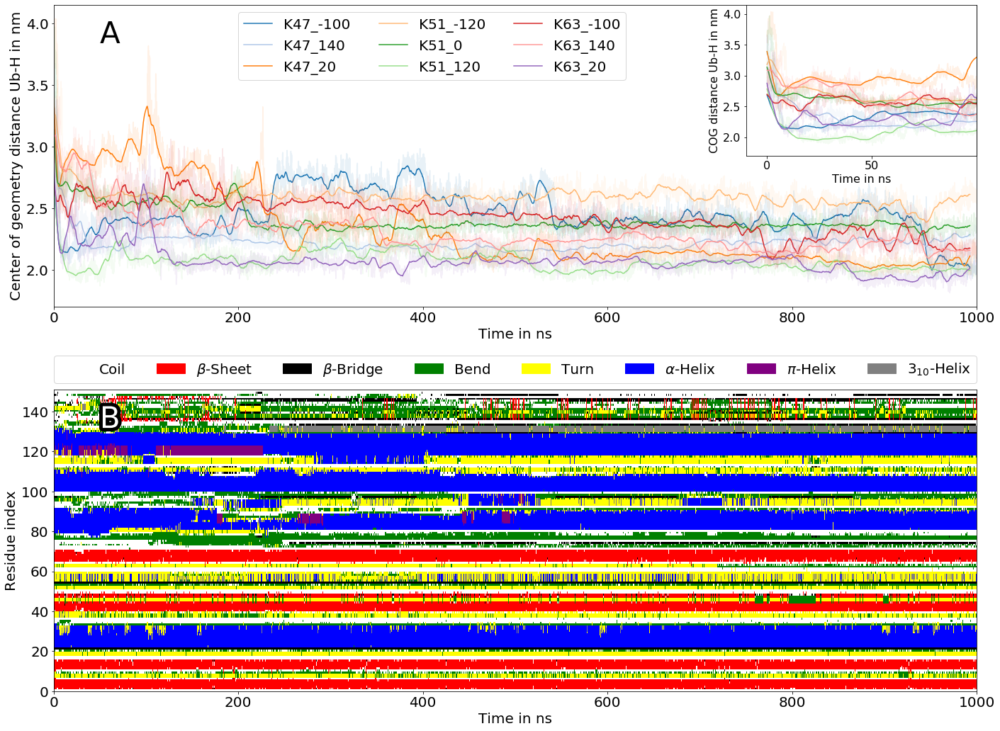

In [182]:
mpl.rcParams.update({'font.size': 20})

fig, (ax, ax2) = plt.subplots(nrows=2, sharex=False)
fig.set_size_inches(20, 15)

labels = list(map(lambda x: x.split('_1micros')[0], [traj.basename for traj in veronika_trajs]))

for i, d in enumerate(cog_distances):
    d = d[:20000]
    x = np.arange(0, len(d)) * 50
    c = plt.cm.tab20(i)
    ax.plot(x, d, alpha=0.1, c=c)
    N = 150
    y = np.convolve(d, np.ones((N,))/N, mode='valid')
    x = np.arange(0, len(y)) * 50
    ax.plot(x, y, alpha=1, c=c, label=labels[i])
    
ax.set_xlabel('Time in ns')
ax.set_xlim([0, 1000000])
ax.set_ylabel("Center of geometry distance Ub-H in nm")
ax.set_xticklabels(map(int, ax.get_xticks() / 1000))

ax.legend(loc=(0.2, 0.75), ncol=3)

axin = ax.inset_axes([0.75, 0.5, 0.25, 0.5], transform=ax.transAxes)

for i, d in enumerate(cog_distances):
    x = np.arange(0, len(d)) * 50
    c = plt.cm.tab20(i)
    axin.plot(x, d, alpha=0.1, c=c)
    N = 150
    y = np.convolve(d, np.ones((N,))/N, mode='valid')
    x = np.arange(0, len(y)) * 50
    axin.plot(x, y, alpha=1, c=c)
    
axin.set_xlim([-10000, 100000])
_ = axin.get_xticks()[:-1]
axin.set_xticks(_)
axin.set_xticklabels(map(int, axin.get_xticks() / 1000), fontsize=16)
axin.set_yticklabels([2.0, 2.0, 2.5, 3.0, 3.5, 4.0], fontsize=16)
axin.set_xlabel('Time in ns', fontsize=16)
axin.set_ylabel("COG distance Ub-H in nm", fontsize=16)
axin.set_xlim([-10000, 100000])
txt = ax.text(0.05, 0.95, 'A', transform=ax.transAxes, fontsize=42, verticalalignment='top', color='k')


# DSSP
values = np.unique(data.ravel())
im = ax2.pcolor(data.T, cmap=cmap, norm=norm)
colors = [ im.cmap(im.norm(value)) for value in values]
# create a patch (proxy artist) for every color 
patches = [ mpatches.Patch(color=colors[i], label=dssp_names[i] ) for i in range(len(values)) ]
# put those patched as legend-handles into the legend
ax2.legend(handles=patches, bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=8, mode="expand", borderaxespad=0.)

ax2.set_xlim([0, 20000])
ax2.set_xticks(np.linspace(0, 20000, 6))
ax2.set_xticklabels(map(int, ax.get_xticks() / 1000))
ax2.set_xlabel('Time in ns')
ax2.set_ylabel('Residue index')

txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=42, verticalalignment='top', color='w')
txt.set_path_effects([PathEffects.withStroke(linewidth=10, foreground='k')])

plt.tight_layout()
mpl.rcParams.update({'font.size': 16})

plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/long_sims_cog.png", transparent=True, dpi=600)
plt.savefig("/home/kevin/projects/paper_2019/long_sims_cog.png", transparent=True, dpi=600)

## Comparison with some expansion scheme sims.

In [275]:
# number_of_datapoints = 0
# comparison_cog_trajs = []
# while number_of_datapoints <= sum([len(c) for c in cog_distances]):
#     rand = np.random.randint(0, trajs.n_trajs)
#     print(len(comparison_cog_trajs))
#     comparison_cog_trajs.append(rand)
#     number_of_datapoints += trajs[rand].n_frames
# np.save("comparison_cog_trajs.npy", comparison_cog_trajs)
comparison_cog_trajs = np.load("comparison_cog_trajs.npy")
comparison_trajs = ep.Info_all([trajs[c] for c in comparison_cog_trajs])
print(comparison_trajs)
comparison_cog_distances = []
for traj in comparison_trajs:
    ubq_index = trajs[0].traj.top.select("resid 0 to 75")
    print("Resname of last residue in 1st subunit is {}".format(trajs[0].traj.top.atom(ubq_index[-1])))
    H5_index = trajs[0].traj.top.select("resid 76 to 999")
    cog1 = np.mean(traj.traj.xyz[:,ubq_index], axis=1)
    cog2 = np.mean(traj.traj.xyz[:,H5_index], axis=1)
    dists = cog2 - cog1
    dists = np.stack([np.linalg.norm(d) for d in dists])
    comparison_cog_distances.append(dists)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O


Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O
Resname of last residue in 1st subunit is GLQ76-O


In [277]:
cog_distances_normalized = np.concatenate(comparison_cog_distances)
div, remainder = divmod(cog_distances_normalized.shape[0], len(cog_distances[0]))
cog_distances_normalized = np.concatenate([cog_distances_normalized, np.full(len(cog_distances[0]) - remainder, np.nan)])
assert divmod(cog_distances_normalized.shape[0], len(cog_distances[0]))[1] == 0

cog_distances_normalized = cog_distances_normalized.reshape((10, -1))

NameError: name 'cog_distances_normalized' is not defined

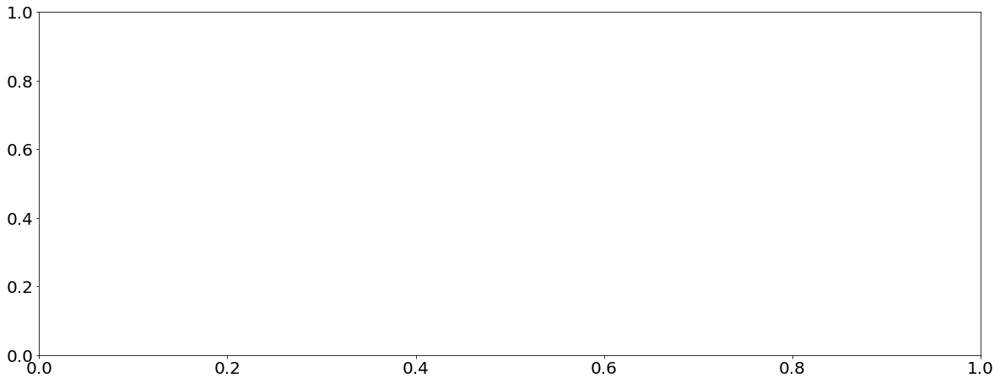

In [271]:
plt.close('all')
mpl.rcParams.update({'font.size': 20})

fig, ax = plt.subplots()
fig.set_size_inches(20, 7.5)
# colors = plt.cm.Greys(np.linspace(0, 255, len(comparison_cog_distances)))

start = 0
for i, d in enumerate(cog_distances_normalized):
    if np.any(np.isnan(d)):
        d = d[~np.isnan(d)]
    d = d[:20000]
    x = np.arange(start, start + len(d)) * 50
    c = plt.cm.Greys(i / len(comparison_cog_distances) * 256)
    ax.plot(x, d, alpha=0.1, c='k')
    N = 250
    y = np.convolve(d, np.ones((N,))/N, mode='valid')
    x = np.arange(start, start + len(y)) * 50
    ax.plot(x, y, alpha=1, c='k')
    start = start + len(d)
    if start >= 2001:
        start = 0
    # break
ax.set_xticks([])
ax.set_ylabel("COG distance Ub-H in nm", fontsize=16)
ax.set_xlabel(r"$\mathrm{\Rightarrow}$" + "Time" + r"$\mathrm{\Rightarrow}$", fontsize=16)

plt.savefig("/home/kevin/projects/living_ppt/expansion_scheme/comparison_cog.png", transparent=True, dpi=600)
plt.savefig("/home/kevin/projects/paper_2019/comparison_cog.png", transparent=True, dpi=600)

In [247]:
len(comparison_cog_distances)

425

In [250]:
print(sum([len(c) for c in comparison_cog_distances]))
print(sum([len(c) for c in cog_distances]))

181625
181545


# Scores comparison

In [258]:
rosetta_scores = pd.read_csv("/home/kevin/projects/h1_ub_chromatosome_penetration/rosetta_scores.csv")
ISAs = pd.read_csv("/home/kevin/projects/h1_ub_chromatosome_penetration/ISA_scores.csv")

cluster_ISAs = ISAs['ISA'].values[rosetta_scores['total_frame']]
assert len(cluster_ISAs) == len(rosetta_scores['total_score'].values), "Both scoring algorithms must contain the same number of data points."

In [259]:
x = rosetta_scores['total_score'].values
y = cluster_ISAs
cov = np.cov(x, y)
print(cov)
corr, _ = scipy.stats.pearsonr(x, y)
print(f"Pearson: {corr}")
corr, _ = scipy.stats.spearmanr(x, y)
print(f"Spearman: {corr}")

[[1.30433469e+09 2.62311266e+06]
 [2.62311266e+06 6.87101264e+03]]
Pearson: 0.8762177530772414
Spearman: 0.872393017012293


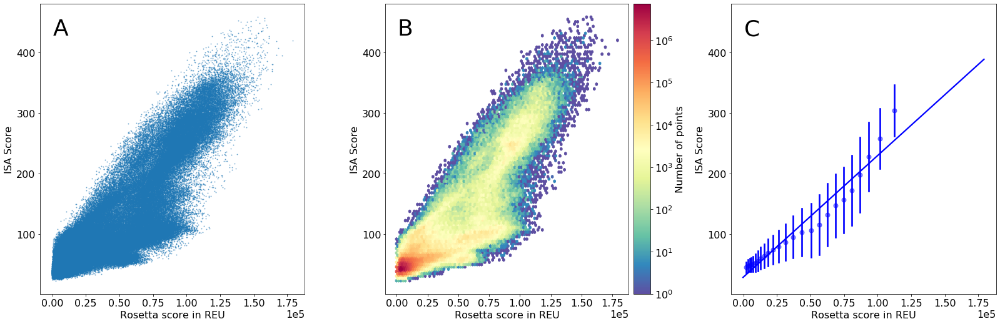

In [268]:
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.axes_grid1.colorbar import colorbar
from adjustText import adjust_text

plt.close('all')

mpl.rcParams.update({'font.size': 16})

plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, nrows=1)
fig.set_size_inches(22.5,7.5)

# set the data so its easier to reuse these snippets somewhere else
x = rosetta_scores['total_score'].values
y = cluster_ISAs

# scatter of the raw values
ax1.scatter(x=x, y=y, alpha=.5, s=1)
ax1.set_xlabel("Rosetta score in REU")
ax1.set_ylabel("ISA Score")
ax1.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

# denisty
bin_density = 1
log_density = True

x_bins = np.linspace(x.min(), x.max() / bin_density)
y_bins = np.linspace(y.min(), y.max() / bin_density)
H, xedges, yedges = np.histogram2d(x=x, y=y, bins=150)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]] 
xcenters = np.mean(np.vstack([xedges[0:-1],xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1],yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
if log_density:
    with np.errstate(divide = 'ignore'): # ignore division by zero error
        F = np.log(H)
else:
    F = H
mappable = ax2.hexbin(x=X.ravel(), y=Y.ravel(), C=F.T.ravel(), cmap=plt.cm.Spectral_r, extent=extent, norm=mpl.colors.PowerNorm(1))
ax2.set_xlabel("Rosetta score in REU")
ax2.set_ylabel("ISA Score")
ax2.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

# colorbar for ax2
# colorbar
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax2)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
# initialize colormapr
cb = plt.colorbar(mappable, cax=cax)
cax.set_yticklabels([r'$10^{' + str(int(i)) + r'}$' for i in cb.get_ticks()])
cax.set_ylabel("Number of points")

# color the points by cluster_membership
c = rosetta_scores['cluster_membership'].values
color_palette = sns.color_palette('Paired', int(c.max() + 1))
cluster_colors = np.array([color_palette[i] for i in c.astype(int)])
patches = []
for i, cluster_no in enumerate(range(int(c.max()))):
        where = np.where(c == cluster_no)[0].astype(int)
        hull = scipy.spatial.ConvexHull(points=np.stack([x[where], y[where]]).T)
        polygon = mpl.patches.Polygon(hull.points[hull.vertices], color=cluster_colors[where][0], alpha=.3)
        # ax3.add_artist(polygon)
        # ax3.scatter(x=x[where], y=y[where], c=c[where], alpha=.5, s=1)
# ax3.scatter(x=x, y=y, alpha=.5, s=1, c=cluster_colors)
# ax3.set_title("Colored by cluster membership")
# ax3.set_xlim(ax1.get_xlim())
# ax3.set_xticks([])
# ax3.set_yticks([])
# [k.set_linewidth(0) for k in ax3.spines.values()]
# ax3.set_ylim(ax1.get_ylim())
# ax3.text(0, 0.9, s="Pearson correlation coefficient: 0.88", transform=ax3.transAxes, fontdict={'size': 24})
# ax3.text(0, 0.8, s="Spearman correlation coefficient: 0.88", transform=ax3.transAxes, fontdict={'size': 24})
# ax3.text(0, 0.7, s="Total of 172328 points in", transform=ax3.transAxes, fontdict={'size': 24})
# ax3.text(0, 0.6, s="430 clusters.", transform=ax3.transAxes, fontdict={'size': 24})
# ax3.set_xlabel("Rosetta score in REU (Rosetta Energy Units)")
# ax3.set_ylabel("Penetration score calculated by ISA")

# regression with seaborn
ax3.set_xlim(ax1.get_xlim())
ax3.set_ylim(ax1.get_ylim())
sns.regplot(x=x, y=y, color="blue", x_bins=25, x_ci='sd', ci=5, scatter=True, ax=ax3, scatter_kws={"alpha": .5})
ax3.set_xlabel("Rosetta score in REU")
ax3.set_ylabel("ISA Score")
ax3.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

txt = ax1.text(0.05, 0.95, 'A', transform=ax1.transAxes, fontsize=36, verticalalignment='top', color='k')
txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=36, verticalalignment='top', color='k')
txt = ax3.text(0.05, 0.95, 'C', transform=ax3.transAxes, fontsize=36, verticalalignment='top', color='k')

plt.tight_layout()

os.makedirs("/home/kevin/projects/living_ppt/penetration_scoring/", exist_ok=True)
plt.savefig("/home/kevin/projects/living_ppt/penetration_scoring/comparison_rosetta_isa.png", dpi=300)
plt.savefig("/home/kevin/projects/h1_ub_chromatosome_penetration/comparison_rosetta_isa.png", dpi=300)

plt.show()

In [270]:
rosetta_scores['total_score'].max(), rosetta_scores['total_score'].min()

(179158.44564534558, -252.9732594701317)

# 1ZZB

## load

In [418]:
traj_1zbb = md.load_pdb("/home/kevin/projects/K30/1ZBB.pdb")
traj_1zbb_frames = md.load_pdb("/home/kevin/projects/K30/pdb_files/1zbb.pdb1")

## Create a dictionary of chromatosomes

Save the different chromatosomes as entries to a dictionary. The files loaded here are created from another ipynb file, where the alignment of chains was carried out. That's where the protein_df csv comes from. This csv file was created using biopython's pairwise2 module, which gives scores based on sequence similarity of two chains. Thus I could index all core histones and in all chromatosomes and use them as guides to align them into the tetranucleosome array.

In [419]:
import ast

chromatosomes = {}
chromatosomes_ids = ['5NL0', 'Bai', '5WCU', '4QLC']

# chain A to J is the NCP and the DNA. Chain Q is the linker histone. this corresponds to the following selection string chainid 0 to 9 or chainid 16
chromatosomes['5NL0'] = md.load_pdb("/home/kevin/projects/h1_ub_chromatosome_penetration/pdb_files/5nl0_aligned_princ.pdb")
# off dyad by Bai et al.)
chromatosomes['Bai'] = md.load("/home/kevin/projects/h1_ub_chromatosome_penetration/pdb_files/Bai_aligned_princ.pdb")
# chain A to J is the NCP and the DNA. Chain U is the linker histone.
chromatosomes['5WCU'] = md.load_pdb("/home/kevin/projects/h1_ub_chromatosome_penetration/pdb_files/5WCU_aligned_princ.pdb")
# Also on-dyad, but with shorter DNA linkers
chromatosomes['4QLC'] = md.load_pdb("/home/kevin/projects/h1_ub_chromatosome_penetration/pdb_files/4QLC_aligned_princ.pdb")

# Remove unwanted chains
# this doesn't need to be done with the aligned to princ files
# chromatosomes[0] = chromatosomes[0].atom_slice(chromatosomes[0].top.select('chainid 0 to 9 or chainid 16')) # remove assembly 2 which is not needed
# chromatosomes[2] = chromatosomes[2].atom_slice(chromatosomes[2].top.select('chainid 0 to 9 or chainid 20'))
# chromatosomes[3] = chromatosomes[3].atom_slice(chromatosomes[3].top.select('not chainid 11 and not chainid 12')) # remove citric acid

# rename chain 16 in 5NL0 to chain 10 and chain 20 in 5WCU
# chromatosomes[0].top.chain(10).index = 10
# chromatosomes[2].top.chain(10).index = 10

protein_df = pd.read_csv("/home/kevin/projects/K30/protein_dict_1ZBB.csv")
protein_df = protein_df.set_index("chromatosome_name")
protein_df = protein_df.applymap(ast.literal_eval)

nucleosomes = {}
for key, item in chromatosomes.items():
    index = np.delete(item.top.select('all'), protein_df['H1/5'][key])
    nucleosomes[key] = item.atom_slice(index)

chromatosomes['1ZBB'] = traj_1zbb
chromatosomes['1ZBB_frame_2'] = traj_1zbb_frames[1]
chromatosomes['1ZBB_bio_ass_1'] = traj_1zbb_frames[0].stack(traj_1zbb_frames[1])

In [ ]:
protein_df

In [ ]:
for key, value in chromatosomes.items():
    print(f"Chromatosome with the id {key} has {value.n_atoms} in {value.n_chains} chains")

## Create histone indices

Because the linker histones in the parent chromatosome structures need to to be aligned, we need to find the indexes of the atoms that will be used for alignment. The alignment is carried out using a fixed part (the 1ZBB) and a movable part (the other Cromatosomes (5WCU, 5NL0, 4QLC, Bai)) and both need to be indexed with identical number of atoms. This is done by using T-COFFEE for sequence alignment, which will be able to remove leading and/or trailing parts of the core histones GD and only give the part with the most sequence similarities.

For the linker histones something similar needs to be made. The sequence length of the linker histones of the chromatosomes and the one used in simulations (1GHC) can be different and some residues need to be excluded to align them with lists of CA atoms of identical length.

In [ ]:
print(protein_df.T.keys(), chromatosomes.keys())

In [75]:
traj = trajs[0]
traj.load_traj()
traj = traj[0].traj

print(traj.top.atom(traj.top.select('resid 76 to 152')[0]))
print(traj.top.atom(traj.top.select('resid 76 to 152')[-1]))

H5_CA_tmp = traj.top.select('resid 76 to 152 and name CA')

chr_CA = {}
H5_CA = {}
for i, (name, chr_) in enumerate(chromatosomes.items()):
    if '1ZBB' in name:
        continue
    print(i, name, chr_)
    CAs = [chromatosomes[name].top.atom(a).index for a in protein_df['H1/5'][i] if chromatosomes[name].top.atom(a).name == 'CA']
    if i == 0:
        chr_CA[name] = CAs
        H5_CA[name] = H5_CA_tmp[2:]
    elif i == 1:
        chr_CA[name] = CAs
        H5_CA[name] = H5_CA_tmp[:74]
    else:
        chr_CA[name] = CAs[1:]
        H5_CA[name] = H5_CA_tmp
        
for a, b in zip(H5_CA, chr_CA):
    assert len(a) == len(b)

MET77-N
LYS151-OXT
0 5NL0 <mdtraj.Trajectory with 1 frames, 14511 atoms, 1219 residues, and unitcells>
1 Bai <mdtraj.Trajectory with 1 frames, 18774 atoms, 1315 residues, without unitcells>
2 5WCU <mdtraj.Trajectory with 1 frames, 13301 atoms, 1158 residues, and unitcells>
3 4QLC <mdtraj.Trajectory with 1 frames, 13316 atoms, 1157 residues, and unitcells>


**Get the H1 positions**

Following adjustments needed to be made:

- On dyad:

| Alignment             | name in protein_df | index | Extra Info                                       |
|-----------------------|--------------------|-------|--------------------------------------------------|
| 5NL0 to core1 of 1ZBB | 1ZBB               | 0     | rotated 5NL0 +5 deg around first principal axis  |
| 5NL0 to core2 of 1ZBB | 1ZBB               | 1     | rotated 5NL0 +30 deg around first principal axis |
| 5NL0 to core3 of 1ZBB | 1ZBB_frame_2       | 0     | rotated 5NL0 -5 deg around first principal axis  |
| 5NL0 to core4 of 1ZBB | 1ZBB_frame_2       | 1     | rotated 5NL0 -30 deg around third principal axis |

- Off dyad:

| Alignment             | name in protein_df | index | Extra Info                                       |
|-----------------------|--------------------|-------|--------------------------------------------------|
| Bai to core1 of 1ZBB  | 1ZBB               | 0     | No additional adjustemts made                    |
| Bai to core2 of 1ZBB  | 1ZBB               | 1     | -15 deg around first princ axis                  |
| Bai to core3 of 1ZBB  | 1ZBB_frame_2       | 0     | No additional adjustmend made                    |
| Bai to core4 of 1ZBB  | 1ZBB_frame_2       | 1     | +5 deg around first principal axis               |

In [421]:
Hs = {}

for pos, i in itertools.product(['on_dyad', 'off_dyad'], [0, 1, 2, 3]):
    if pos == 'on_dyad':
        Hs[f'{pos}_{i}'] = md.load_pdb(f"/home/kevin/projects/K30/H1_aligned_to_1ZBB_{i+1}.pdb")
    else:
        Hs[f'{pos}_{i}'] = md.load_pdb(f"/home/kevin/projects/K30/H1_aligned_to_1ZBB_{i+1}_off_dyad.pdb")

## Transformations

In [422]:
traj = copy.deepcopy(chromatosomes['1ZBB_bio_ass_1'])
trans_mat = ep.structure_building.align_principal_axes_mdtraj(traj, return_trans_mat=True)

Hs_aligned = {}

for key, t in Hs.items():
    _ = copy.deepcopy(t)
    padded = np.pad(_.xyz[0], ((0, 0), (0, 1)), mode='constant', constant_values=1)
    new_points = trans_mat.dot(padded.T).T[:,:3]
    _.xyz[0] = new_points
    Hs_aligned[key] = _

## What principal axis is rotated?

From the sub-project K30 the principal axes were enumerated as follows:

```python
inertia_tensor = md.compute_inertia_tensor(traj)
eigvals, eigvs = np.linalg.eig(inertia_tensor)
# Because eigvs is of shape (1, 3, 3) remove the 0th axis to get a proper 3x3 matrix
eigvs = eigvs[0]
first_princ_axis = eigvs[0]
# and so on
```

So load the 5NL0 aligned to principal axes and check the direction of the eigenvalues, and the moment of inertia along these.

In [430]:
chromatosome_5nl0_aligned = chromatosomes['5NL0']
view = ngl.show_mdtraj(chromatosome_5nl0_aligned)
view.shape.add_arrow([0, 0, 0], [20, 0, 0], [1, 0, 0], 5) # along x is red
view.shape.add_arrow([0, 0, 0], [0, 20, 0], [0, 1, 0], 5) # along y is green
view.shape.add_arrow([0, 0, 0], [0, 0, 20], [0, 0, 1], 5) # along z is blue
view

NGLWidget()

Now get the moments of inertia along these vectors, as they are the diagonal elements of the inertia tensor (moments of inertia along the basis):

\begin{equation}
\mathbf{I} = \begin{bmatrix}
I_{xx} & I_{yx} & I_{zx} \\
I_{xy} & I_{yy} & I_{zy} \\
I_{xz} & I_{yz} & I_{zz} 
\end{bmatrix}
\end{equation}

In [431]:
md.compute_inertia_tensor(chromatosome_5nl0_aligned)

array([[[ 1.50158735e+06,  7.99969959e-02, -8.78975390e-02],
        [ 7.99969960e-02,  3.37113055e+06, -2.30563762e-01],
        [-8.78975391e-02, -2.30563762e-01,  4.10972543e+06]]])

From this we can deduce that z has the highest moment of inertia and thus the blue axis is the first principal axis. So let's check the eigenvectors:

In [436]:
eigvals, eigvs = np.linalg.eig(md.compute_inertia_tensor(chromatosome_5nl0_aligned))
print(eigvs[0][0])
print(eigvs[0][1])
print(eigvs[0][2])

[ 1.00000000e+00 -3.37012694e-08  4.27895802e-08]
[-4.27895908e-08 -3.12165397e-07  1.00000000e+00]
[3.37012560e-08 1.00000000e+00 3.12165397e-07]


Here, we can see, that the sequence is x, z, y, so 3rd, 2nd, 1st principal axis.

Take a look at the alignments.

Here, the tetranucleosome array 1ZBB and the aligned histones are put into the same nglview object. Note, that there are 8 histones in this view, because there are on- and off-dyad structures present.

In [108]:
for i, t in Hs.items():
    if 'off' in i:
        continue
    else:
        if '0' in i:
            stacked = t
        else:
            stacked = stacked.stack(t)
for i, t in Hs_aligned.items():
    if 'off' in i:
        continue
    else:
        stacked = stacked.stack(t)
stacked = stacked.stack(chromatosomes['1ZBB_bio_ass_1'])
view = ngl.show_mdtraj(stacked)
view

NGLWidget()

## Instantiate ISA

In [134]:
# traj = dopy.deepcopy(nucleosome)
# traj = copy.deepcopy(chromatosomes['1ZBB'])
traj = copy.deepcopy(chromatosomes['1ZBB_bio_ass_1'])
custom_functions.align_principal_axes_mdtraj(traj)
scorer = ISA.ISA(traj.xyz[0])
scorer.set_init_bins(25)
scorer.set_propagation_factor(1.0)
scorer.gen_histogram()
scorer.gen_cumulative_histograms()

creating ISA object with 53702 points.


## Define parallel scoring

In [135]:
def get_score_parallel(traj, fixed_CA, movable_CA, reference, scorer):
    # define some stuff
    xtc_file = traj.location
    name = traj.basename
    pdb_file = traj.reference
    nframes = traj.n_frames
    
    # load a new backend if not already
    traj.load_traj('mdtraj')

    # superpose
    to_superpose = copy.deepcopy(traj.traj)
    superposed = to_superpose.superpose(reference=reference, atom_indices=movable_CA, ref_atom_indices=fixed_CA)

    # score with ISA
    out_list = []
    for line_number in range(nframes):
        values = []
        out = 0.0
        for x, y, z in superposed.xyz[line_number]:
            # print('checking point x: '+str(x)+', y: '+str(y)+', z:'+str(z))
            try:
                x_b = (x <= scorer.edges[0]).tolist().index(True)
                if x_b == 25:
                    x_b = 24
            except ValueError: # means the x coordinate is outside the histogram boundaries
                if x > scorer.edges[0][25]: # right outside bounds
                    x_b = 24
                else: # left outside bounds
                    x_b = 0
            try:
                y_b = (y <= scorer.edges[1]).tolist().index(True)
                if y_b == 25:
                    y_b = 24
            except ValueError: # means the y coordinate is outside the histogram boundaries
                if y > scorer.edges[1][25]: # right outside bounds
                    y_b = 24
                else: # left outside bounds
                    y_b = 0
            try:
                z_b = (z <= scorer.edges[2]).tolist().index(True)
                if z_b == 25:
                    z_b = 24
            except ValueError: # means the z coordinate is outside the histogram boundaries
                if z > scorer.edges[2][25]: # right outside bounds
                    z_b = 24
                else: # left outside bounds
                    z_b = 0
            # print('This point is inside bin ('+str(x_b)+', '+str(y_b)+', '+str(z_b)+')')
            # print('The value of this bin is: '+str(scorer.histo_out[x_b][y_b][z_b]))
            values.append(scorer.histo_out[x_b][y_b][z_b])
            out = out + scorer.histo_out[x_b][y_b][z_b]

            # print('cumulative scorer currently at '+str(out))
            """This can to be changed so that it divides the total scorer
            by the number of atoms in non-zero bins. If this would be
            advantageous, needs to be discussed.

            """
        no_of_non_zero_bins = len(np.where(np.array(values) > 0.0)[0])
        if no_of_non_zero_bins == 0:
            out_list.append([name, line_number, out])
        else:
            out_list.append([name, line_number, out])
    # print('Fin')
    out_arr = np.array([i[2] for i in out_list])
    return out_list

## Score parallel

In [ ]:
from joblib import Parallel, delayed
trajs.load()

In [136]:
for key, t in Hs_aligned.items():
    if 'on_dyad' in key:
        movable_CA = H5_CA['5NL0']
        fixed_CA = t.top.select('name CA')
    else:
        movable_CA = H5_CA['Bai']
        fixed_CA = t.top.select('name CA')
        
    assert len(fixed_CA) == len(movable_CA), print(len(movable_CA), len(movable_CA))
    r = Parallel(n_jobs=20)(delayed(get_score_parallel)(traj, fixed_CA, movable_CA, t, scorer) for traj in trajs[:2])
    r = np.vstack(r)
    r = np.hstack([np.full(len(r), key).reshape(len(r), 1), r])
    
    break
    
    if key == list(Hs_aligned.keys())[0]:
        pass
        # scores_1ZBB = pd.DataFrame(r, columns=['1ZBB_core', 'traj_name', 'frame', 'score']).astype({'frame': int, 'score': float})
    else:
        pass
        # scores_1ZBB = scores_1ZBB.append(pd.DataFrame(r, columns=['1ZBB_core', 'traj_name', 'frame', 'score']).astype({'frame': int, 'score': float}))
# scores_1ZBB.to_csv("scores_1ZBB.csv", index=False)

In [252]:
scores_1ZBB = pd.read_csv("scores_1ZBB.csv")
# scores_1ZBB.to_csv("scores_1ZBB.csv", index=False)
scores_1ZBB

,1ZBB_core,traj_name,frame,score,cluster_average_scores,cluster_memberships
0,on_dyad_0,1GHC_K30_-100_20000,0,301.711260,-1.0,-1
1,on_dyad_0,1GHC_K30_-100_20000,1,300.325898,-1.0,-1
2,on_dyad_0,1GHC_K30_-100_20000,2,285.165358,-1.0,-1
3,on_dyad_0,1GHC_K30_-100_20000,3,318.555234,-1.0,-1
4,on_dyad_0,1GHC_K30_-100_20000,4,324.579139,-1.0,-1
...,...,...,...,...,...,...
3871859,off_dyad_3,K63_80,396,110.919870,-1.0,-1
3871860,off_dyad_3,K63_80,397,122.346167,-1.0,-1
3871861,off_dyad_3,K63_80,398,125.143538,-1.0,-1
3871862,off_dyad_3,K63_80,399,113.529660,-1.0,-1


## Add cluster average scores

In [32]:
cluster_average_scores = np.full(len(scores_1ZBB), -1.0)
cluster_memberships = np.full(len(scores_1ZBB), -1)

for cluster_num in range(int(memberships.max())):
    # for traj in pd.unique(df_on_dyad['traj_name']):
    where = np.where(trajs.df['cluster_membership'].values == cluster_num)[0]
    sub_df = scores_1ZBB.iloc[where]
    avg_score = np.mean(sub_df['score'].values)
    cluster_average_scores[where] = avg_score
    cluster_memberships[where] = cluster_num
    for i in range(7):
        where += trajs.n_frames
        sub_df = scores_1ZBB.iloc[where]
        avg_score = np.mean(sub_df['score'].values)
        cluster_average_scores[where] = avg_score
        cluster_memberships[where] = cluster_num
        
scores_1ZBB['cluster_average_scores'] = cluster_average_scores
scores_1ZBB['cluster_memberships'] = cluster_memberships

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(3871864,)


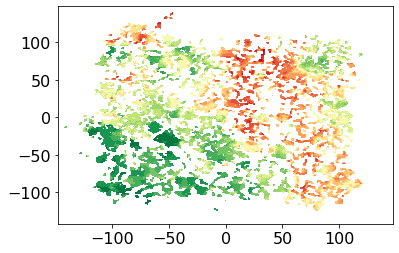

In [369]:
plt.close('all')

fig, ax1 = plt.subplots()

# ax1 is gonna be the colored sketchmap with contourf
x = np.hstack([trajs.lowd[:,0] for i in range(8)])
y = np.hstack([trajs.lowd[:,1] for i in range(8)])

print(x.shape)

# digitize to fill bins wiht average values
digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=scores_1ZBB['score'], bins=bins, statistic='median')

H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=bins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

# contourf with .T
ax1.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)

## Plotting

In [257]:
UBQ_SITES = ['K30', 'K41', 'K47', 'K51', 'K56', 'K63']

def add_ubq_site(row):
    index = [ubq_site in row for ubq_site in UBQ_SITES].index(True)
    ubq_site = UBQ_SITES[index]
    return ubq_site
    
scores_1ZBB['ubq_site'] = scores_1ZBB['traj_name'].apply(add_ubq_site)
scores_1ZBB

,1ZBB_core,traj_name,frame,score,cluster_average_scores,cluster_memberships,ubq_site
0,on_dyad_0,1GHC_K30_-100_20000,0,301.711260,-1.0,-1,K30
1,on_dyad_0,1GHC_K30_-100_20000,1,300.325898,-1.0,-1,K30
2,on_dyad_0,1GHC_K30_-100_20000,2,285.165358,-1.0,-1,K30
3,on_dyad_0,1GHC_K30_-100_20000,3,318.555234,-1.0,-1,K30
4,on_dyad_0,1GHC_K30_-100_20000,4,324.579139,-1.0,-1,K30
...,...,...,...,...,...,...,...
3871859,off_dyad_3,K63_80,396,110.919870,-1.0,-1,K63
3871860,off_dyad_3,K63_80,397,122.346167,-1.0,-1,K63
3871861,off_dyad_3,K63_80,398,125.143538,-1.0,-1,K63
3871862,off_dyad_3,K63_80,399,113.529660,-1.0,-1,K63


In [263]:
scores_1ZBB['on'] = scores_1ZBB['1ZBB_core'].str.contains('on_dyad')

In [264]:
sub_df = scores_1ZBB[scores_1ZBB['on']]
sub_df

,1ZBB_core,traj_name,frame,score,cluster_average_scores,cluster_memberships,ubq_site,on
0,on_dyad_0,1GHC_K30_-100_20000,0,301.711260,-1.0,-1,K30,True
1,on_dyad_0,1GHC_K30_-100_20000,1,300.325898,-1.0,-1,K30,True
2,on_dyad_0,1GHC_K30_-100_20000,2,285.165358,-1.0,-1,K30,True
3,on_dyad_0,1GHC_K30_-100_20000,3,318.555234,-1.0,-1,K30,True
4,on_dyad_0,1GHC_K30_-100_20000,4,324.579139,-1.0,-1,K30,True
...,...,...,...,...,...,...,...,...
1935927,on_dyad_3,K63_80,396,423.563604,-1.0,-1,K63,True
1935928,on_dyad_3,K63_80,397,438.327808,-1.0,-1,K63,True
1935929,on_dyad_3,K63_80,398,434.127109,-1.0,-1,K63,True
1935930,on_dyad_3,K63_80,399,424.475597,-1.0,-1,K63,True


0th lowest scored scluster is cluster no 670 in core on_dyad_0 has average score of 60.66560529604939
0th lowest scored scluster is cluster no 697 in core on_dyad_1 has average score of 43.10961169516513
0th lowest scored scluster is cluster no 483 in core on_dyad_2 has average score of 56.24411584470751
0th lowest scored scluster is cluster no 1291 in core on_dyad_3 has average score of 77.65281838322974


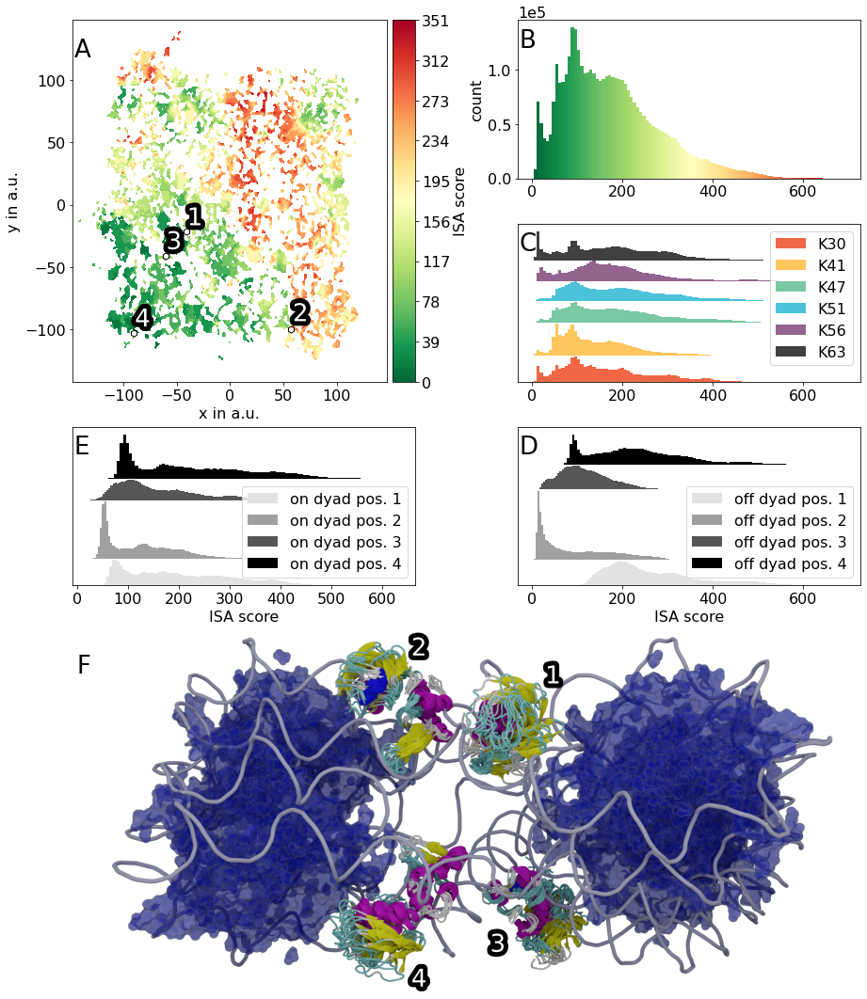

In [281]:
from string import ascii_uppercase
from encodermap.plot.plotting import render_vmd
import matplotlib.patheffects as PathEffects

avg_1zbb_scores = []
per_core_scores = {}
on_dyad_mean = []
off_dyad_mean = []
for v in scores_1ZBB['1ZBB_core'].value_counts().index:
    _ = scores_1ZBB.loc[scores_1ZBB['1ZBB_core'] == v, 'score'].values
    avg_1zbb_scores.append(_)
    per_core_scores[v] = scores_1ZBB.loc[scores_1ZBB['1ZBB_core'] == v, 'score'].values
    per_core_scores[v] = scores_1ZBB.loc[scores_1ZBB['1ZBB_core'] == v, 'score'].values
    if 'on' in v:
        on_dyad_mean.extend(per_core_scores[v])
    else:
        off_dyad_mean.extend(per_core_scores[v])
on_dyad_mean = np.mean(on_dyad_mean)
off_dyad_mean = np.mean(off_dyad_mean)
avg_1zbb_scores = np.vstack(avg_1zbb_scores).T
avg_1zbb_scores = np.mean(avg_1zbb_scores, axis=1)

mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig = plt.figure(figsize=(15, 19))

gs = mpl.gridspec.GridSpec(nrows=10, ncols=2, hspace=0.8, wspace=0.3)

ax1 = fig.add_subplot(gs[:4, 0])
ax2 = fig.add_subplot(gs[:2, 1])
ax3 = fig.add_subplot(gs[2:4, 1], sharex=ax2)
ax4 = fig.add_subplot(gs[4:6, 1], sharex=ax2)
ax5 = fig.add_subplot(gs[4:6, 0])
ax6 = fig.add_subplot(gs[6:, :])

axes = [ax1, ax2, ax3, ax4, ax5, ax6]

for ax, letter in zip(axes, ascii_uppercase):
    txt = ax.text(0.005, 0.95, letter, transform=ax.transAxes, fontsize=26, verticalalignment='top', color='k')
    
# define bins for digitizing
bins = 200

# ax1 is gonna be the colored sketchmap with contourf
x = np.hstack([trajs.lowd[:,0] for i in range(8)])
y = np.hstack([trajs.lowd[:,1] for i in range(8)])

# digitize to fill bins wiht average values
digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=scores_1ZBB['score'], bins=bins, statistic='median')

# some histogram plotting purposes
H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=bins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

# contourf with .T
ax1.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)

# color bar
cm = plt.cm.get_cmap('RdYlGn_r')
norm = mpl.colors.Normalize(vmin=0, vmax=avg_1zbb_scores.max())
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax1)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size="7%", pad="2%")
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
ticks = np.linspace(0, 1, 10)
ticklabels = np.round(np.linspace(start=0, stop=avg_1zbb_scores.max(), num=10)).astype(int)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ticklabels)
# remove tick length
# cb.ax.tick_params(axis="y", rotation=45)

cax.set_ylabel("ISA score")
ax1.set_xlabel('x in a.u.')
ax1.set_ylabel('y in a.u.')

# ax2 is the histogram
# get a colormap
norm = mpl.colors.Normalize(vmin=0, vmax=scores_1ZBB['score'].max())
cm = plt.cm.get_cmap('RdYlGn_r')
# plot the hist
values = scores_1ZBB['score'].values
index = np.hstack([trajs.df['cluster_membership'] >= 0 for i in range(8)])
values_clusters = scores_1ZBB[index]['score'].values
H, bins, patches = ax2.hist(values, bins=100)
# change the color
for b, p in zip(bins, patches):
    plt.setp(p, 'facecolor', cm(norm(b)))
ax2.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
ax2.set_ylabel('count')

# per ubq-site
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
for i, (color, (ubq_site, sub_df)) in enumerate(zip(colors, scores_1ZBB.groupby('ubq_site'))):
    if i == 0:
        H, bins, patches = ax3.hist(sub_df['score'], bins=100, range=(scores_1ZBB['score'].min(), scores_1ZBB['score'].max()), fc=color, label=ubq_site)
        lower = H.max() + 500
    else:
        H, bins, patches = ax3.hist(sub_df['score'], bottom=lower, bins=100, range=(scores_1ZBB['score'].min(), scores_1ZBB['score'].max()), fc=color, label=ubq_site)
        lower += H.max() + 500
        
ax3.legend()
ax3.yaxis.set_visible(False)
ax3.set_ylabel('count')
        
        
# per core
sub_df = scores_1ZBB[scores_1ZBB['on']]
no_of_cores = len(np.unique(sub_df['1ZBB_core']))
colors = mpl.cm.get_cmap('Greys')(np.linspace(0.2, 1, no_of_cores))
for i, (color, (core_name, rows)) in enumerate(zip(colors, sub_df.groupby('1ZBB_core'))):
    if i == 0:
        H, bins, patches = ax5.hist(rows['score'], bins=100, range=(rows['score'].min(), rows['score'].max()), fc=color, label=f'on dyad pos. {i + 1}')
        lower = H.max() + 800
    else:
        H, bins, patches = ax5.hist(rows['score'], bottom=lower, bins=100, range=(rows['score'].min(), rows['score'].max()), fc=color, label=f'on dyad pos. {i + 1}')
        lower += H.max() + 800
    
ax5.legend()
ax5.yaxis.set_visible(False)
ax5.set_xlabel('ISA score')

# per core
sub_df = scores_1ZBB[~scores_1ZBB['on']]
no_of_cores = len(np.unique(sub_df['1ZBB_core']))
colors = mpl.cm.get_cmap('Greys')(np.linspace(0.2, 1, no_of_cores))
for i, (color, (core_name, rows)) in enumerate(zip(colors, sub_df.groupby('1ZBB_core'))):
    if i == 0:
        H, bins, patches = ax4.hist(rows['score'], bins=100, range=(rows['score'].min(), rows['score'].max()), fc=color, label=f'off dyad pos. {i + 1}')
        lower = H.max() + 800
    else:
        H, bins, patches = ax4.hist(rows['score'], bottom=lower, bins=100, range=(rows['score'].min(), rows['score'].max()), fc=color, label=f'off dyad pos. {i + 1}')
        lower += H.max() + 800
    
ax4.legend()
ax4.yaxis.set_visible(False)
ax4.set_xlabel('ISA score')

image = plt.imread("1zbb_render/1zbb_rendered_reduced.png")
ax6.imshow(image)
ax6.axis('off')

positions = [[0.6, 0.92], [0.43, 1], [0.53, 0.15], [0.43, 0.05]]
texts = ['1', '2', '3', '4']

for pos, lbl in zip(positions, texts):
    txt = ax6.text(*pos, lbl, transform=ax6.transAxes, fontsize=26, verticalalignment='top', color='w')
    txt.set_path_effects([PathEffects.withStroke(linewidth=10, foreground='k')])

argindex = 0
cluster_centroids_on_sketchmap = []
cluster_rects_on_sketchmap = []
    
for v in scores_1ZBB['1ZBB_core'].value_counts().index:
    if 'on' in v:
        key = '5NL0'
        sub_df = scores_1ZBB[scores_1ZBB['1ZBB_core'] == v]
        uniques = np.unique(sub_df['cluster_average_scores'].values)[1::] # don't use the outliers with -1

        where = np.where(sub_df['cluster_average_scores'].values == uniques[argindex])[0]
        cluster_no = sub_df['cluster_memberships'].values[where]

        assert np.all(cluster_no == cluster_no[0])
        cluster_no = cluster_no[0]

        print(f"{argindex}th lowest scored scluster is cluster no {cluster_no} in core {v} has average score of {uniques[argindex]}")
        
        where = np.where(trajs.df['cluster_membership'] == cluster_no)[0]
        cluster_centroids_on_sketchmap.append(np.mean(trajs.lowd[where], axis=0))
        rect = np.array([trajs.lowd[where,0].min(), trajs.lowd[where,1].min(), np.ptp(trajs.lowd[where,0]), np.ptp(trajs.lowd[where,1])])
        cluster_rects_on_sketchmap.append(rect)
        
for i, (limits, centroid) in enumerate(zip(cluster_rects_on_sketchmap, cluster_centroids_on_sketchmap)):
    roiKwargs = dict([('fill',False), ('linestyle','solid'), ('color','red'), ('linewidth',2)])
    # rect = mpl.patches.Rectangle(limits[:2] - 2, limits[2] + 2, limits[3] + 2, **roiKwargs)
    ax1.scatter(centroid[0], centroid[1], marker='h', c='w', s=50, edgecolors='k', zorder=20)
    txt = ax1.text(*(limits[:2] + 2), i + 1, transform=ax1.transData, fontsize=26, va='bottom', ha='left', color='w')
    txt.set_path_effects([PathEffects.withStroke(linewidth=10, foreground='k')])
    # ax1.add_patch(rect)

img_name = 'scores_tetranucleosome'
living_ppt_dir = 'penetration_scoring'
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/paper_2019/{img_name}.pdf")
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.highq.png", dpi=600, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.png", dpi=300, transparent=True)
plt.savefig(f"/home/kevin/projects/living_ppt/{living_ppt_dir}/{img_name}.pdf")
    
plt.show()

## Cores and UBQ coloration

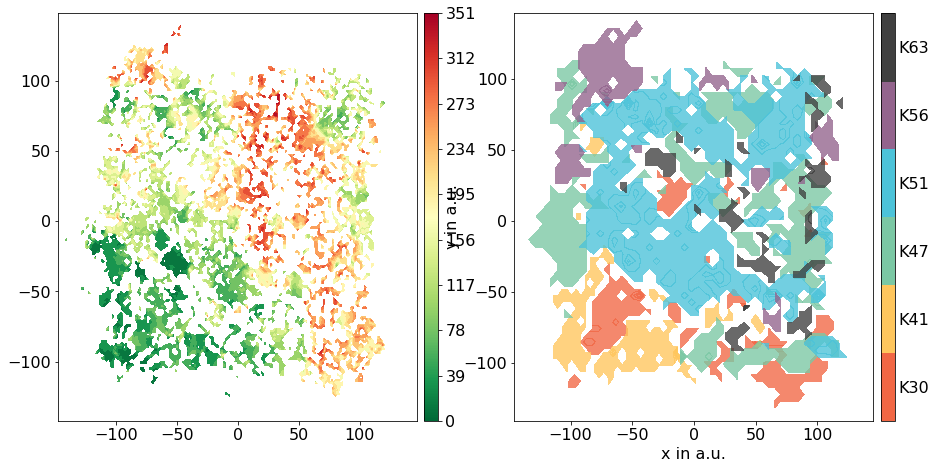

In [398]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.patches import ConnectionPatch

mpl.rcParams.update({'font.size': 16})

plt.close('all')

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 7.5))

# define bins for digitizing
bins = 200

# ax1 is gonna be the colored sketchmap with contourf
x = np.hstack([trajs.lowd[:,0] for i in range(8)])
y = np.hstack([trajs.lowd[:,1] for i in range(8)])

# digitize to fill bins wiht average values
digitized = scipy.stats.binned_statistic_2d(x=x, y=y, values=scores_1ZBB['score'], bins=bins, statistic='median')

# some histogram plotting purposes
H, xedges, yedges = np.histogram2d(*trajs.lowd.T, bins=bins)
xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
X, Y = np.meshgrid(xcenters, ycenters)

# contourf with .T
ax1.contourf(X, Y, digitized[0].T, cmap=plt.cm.RdYlGn_r, levels=20, zorder=1)

# color bar
cm = plt.cm.get_cmap('RdYlGn_r')
norm = mpl.colors.Normalize(vmin=0, vmax=avg_1zbb_scores.max())
# use the axes divider method to add colorbar
ax_divider = make_axes_locatable(ax1)
# add colorbaraxis to work with ticks and whatnot
cax = ax_divider.append_axes("right", size=0.2, pad=0.1)
# define colorbar norm. I like to work with values between 0 and 1
norm = mpl.colors.Normalize(vmin=0, vmax=1)
# create empty mappable to fake input for colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
# define the ticks between 0 and 1
ticks = np.linspace(0, 1, 10)
ticklabels = np.round(np.linspace(start=0, stop=avg_1zbb_scores.max(), num=10)).astype(int)
# initialize colormapr
cb = plt.colorbar(sm, cax=cax, ticks=ticks)
# change yticklabels
yticklabels = cb.ax.set_yticklabels(ticklabels)
# remove tick length
# cb.ax.tick_params(axis="y", rotation=45)



ubq_site_axis = ax2
color_to_hex = lambda x: str(hex(x))[-2:].upper()
common_str = trajs.common_str
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
n_bins = 50
for cs, color in zip(trajs.common_str, colors):
    index = [cs in name for name in trajs.name_arr]

    H, xedges, yedges = np.histogram2d(*trajs.lowd[index].T, bins=n_bins)

    xcenters = np.mean(np.vstack([xedges[0:-1], xedges[1:]]), axis=0)
    ycenters = np.mean(np.vstack([yedges[0:-1], yedges[1:]]), axis=0)
    X, Y = np.meshgrid(xcenters, ycenters)
    
    # map values of H to colors
    min_ = 200; max_ = 255
    H_ = np.interp(H, (H.min(), H.max()), (min_, max_)).astype(int)
    levels = np.unique(H_)
    mapping = {k: v + 1 for v, k in enumerate(levels)}
    H_new = np.vectorize(mapping.get)(H_)
    H_new[H == 0] = 0
    colors_ = [f"{color}{color_to_hex(i)}" for i in levels]

    cmap = mpl.colors.LinearSegmentedColormap.from_list('cmap', colors_)
    cmap.set_bad('w', alpha=0)
    H_new = np.ma.masked_where(H_new == 0, H_new)
    ubq_site_axis.contourf(X, Y, H_new.T, cmap=cmap, zorder=-1)
    
# ep.plotting.plot_common_str(trajs, ax=ax3, fontsize=16, remove_ticks=False)
ubq_site_axis.set_xlabel('x in a.u.', fontsize=16)
ubq_site_axis.set_ylabel('y in a.u.', fontsize=16)
# colormap
divider = make_axes_locatable(ubq_site_axis)
ubq_site_axis_cax = divider.append_axes("right", size=0.2, pad=0.1)#, sharey=ax1)
colors_rgba = [mpl.colors.hex2color(color) for color in colors]
cm = mpl.colors.LinearSegmentedColormap.from_list('name', colors_rgba, N=len(common_str))
norm = mpl.colors.Normalize(vmin=0, vmax=len(common_str))
norm = mpl.colors.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
sm.set_array([])
cmap_ticks = np.linspace(0, 1, len(common_str) + 1)[:-1] + 1.0/(len(common_str) * 2)
cb = plt.colorbar(sm, cax=ubq_site_axis_cax, ticks=cmap_ticks)
yticklabels = cb.ax.set_yticklabels(common_str, fontsize=16)
cb.ax.tick_params(axis="y",direction="out", length=0)

In [409]:
scores_1ZBB

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,1ZBB_core,traj_name,frame,score,cluster_average_scores,cluster_memberships
0,on_dyad_0,1GHC_K30_-100_20000,0,301.711260,-1.0,-1
1,on_dyad_0,1GHC_K30_-100_20000,1,300.325898,-1.0,-1
2,on_dyad_0,1GHC_K30_-100_20000,2,285.165358,-1.0,-1
3,on_dyad_0,1GHC_K30_-100_20000,3,318.555234,-1.0,-1
4,on_dyad_0,1GHC_K30_-100_20000,4,324.579139,-1.0,-1
...,...,...,...,...,...,...
3871859,off_dyad_3,K63_80,396,110.919870,-1.0,-1
3871860,off_dyad_3,K63_80,397,122.346167,-1.0,-1
3871861,off_dyad_3,K63_80,398,125.143538,-1.0,-1
3871862,off_dyad_3,K63_80,399,113.529660,-1.0,-1


/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0.5, 1.0, 'off_dyad')

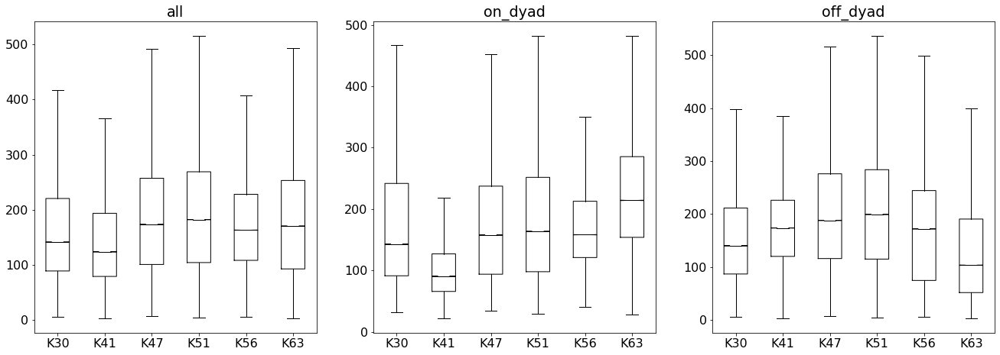

In [410]:
plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(22.5, 7.5))

per_ubq_tetranuc_scores = []
per_ubq_tetranuc_scores_on_dyad = []
per_ubq_tetranuc_scores_off_dyad = []

color_to_hex = lambda x: str(hex(x))[-2:].upper()
common_str = trajs.common_str
colors = ['#F16745', '#FFC65D', '#7BC8A4', '#4CC3D9', '#93648D', '#404040']
n_bins = 50
for cs, color in zip(trajs.common_str, colors):
    index = scores_1ZBB['traj_name'].str.contains(cs)
    per_ubq_tetranuc_scores.append(scores_1ZBB[index]['score'])
    ind = index & scores_1ZBB['1ZBB_core'].str.contains('on_dyad')
    per_ubq_tetranuc_scores_on_dyad.append(scores_1ZBB[ind]['score'])
    index = scores_1ZBB['traj_name'].str.contains(cs)
    ind = index & scores_1ZBB['1ZBB_core'].str.contains('off_dyad')
    per_ubq_tetranuc_scores_off_dyad.append(scores_1ZBB[ind]['score'])
    
    
ax1.boxplot(per_ubq_tetranuc_scores, notch=True, medianprops=dict(color='k'), showfliers=False) 
ax1.set_xticklabels(common_str)
ax1.set_title('all')

ax2.boxplot(per_ubq_tetranuc_scores_on_dyad, notch=True, medianprops=dict(color='k'), showfliers=False) 
ax2.set_xticklabels(common_str)
ax2.set_title('on_dyad')

ax3.boxplot(per_ubq_tetranuc_scores_off_dyad, notch=True, medianprops=dict(color='k'), showfliers=False) 
ax3.set_xticklabels(common_str)
ax3.set_title('off_dyad')

## Render a core form the off-dyad dataset

## Render

In [224]:
Hs_aligned

{'on_dyad_0': <mdtraj.Trajectory with 1 frames, 558 atoms, 73 residues, and unitcells at 0x7fce3daf1c10>,
 'on_dyad_1': <mdtraj.Trajectory with 1 frames, 558 atoms, 73 residues, and unitcells at 0x7fce3eb66850>,
 'on_dyad_2': <mdtraj.Trajectory with 1 frames, 558 atoms, 73 residues, and unitcells at 0x7fce3ebb5f10>,
 'on_dyad_3': <mdtraj.Trajectory with 1 frames, 558 atoms, 73 residues, and unitcells at 0x7fce3ec04cd0>,
 'off_dyad_0': <mdtraj.Trajectory with 1 frames, 710 atoms, 74 residues, without unitcells at 0x7fce3ec56b90>,
 'off_dyad_1': <mdtraj.Trajectory with 1 frames, 710 atoms, 74 residues, without unitcells at 0x7fce3ec26590>,
 'off_dyad_2': <mdtraj.Trajectory with 1 frames, 710 atoms, 74 residues, without unitcells at 0x7fce3ec6c790>,
 'off_dyad_3': <mdtraj.Trajectory with 1 frames, 710 atoms, 74 residues, without unitcells at 0x7fce3ecb3a90>}

In [165]:
for v in scores_1ZBB['1ZBB_core'].value_counts().index:
    print(v)

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


on_dyad_1
off_dyad_2
off_dyad_1
off_dyad_0
on_dyad_0
on_dyad_3
off_dyad_3
on_dyad_2


In [175]:
argindex = 0

stacked = chromatosomes['1ZBB_bio_ass_1']

os.makedirs('1zbb_render', exist_ok=True)
stacked.save_pdb(f'1zbb_render/receptor.pdb')

for v in scores_1ZBB['1ZBB_core'].value_counts().index:
    if 'on' in v:
        pass
#         key = '5NL0'
#         sub_df = scores_1ZBB[scores_1ZBB['1ZBB_core'] == v]
#         uniques = np.unique(sub_df['cluster_average_scores'].values)[1::] # don't use the outliers with -1

#         where = np.where(sub_df['cluster_average_scores'].values == uniques[argindex])[0]
#         cluster_no = sub_df['cluster_memberships'].values[where]

#         assert np.all(cluster_no == cluster_no[0])
#         cluster_no = cluster_no[0]

#         print(f"{argindex}th lowest scored scluster is cluster no {cluster_no} in core {v} has average score of {uniques[argindex]}")

#         view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_no, align_string='resid 76 to 152 and name CA', shorten=True, superpose=True, stack_atoms=False, nglview=True)

#         to_superpose = dummy_traj
#         superposed = to_superpose.superpose(Hs[v], atom_indices=H5_CA[key], ref_atom_indices=Hs[v].top.select('name CA'))
#         superposed.save_pdb(f'1zbb_render/{v}_ligand.pdb')
        
#         for frame in superposed:
#             stacked = stacked.stack(frame)
    if v == 'off_dyad_2':
        key = 'Bai'
        sub_df = scores_1ZBB[scores_1ZBB['1ZBB_core'] == v]
        uniques = np.unique(sub_df['cluster_average_scores'].values)[1::] # don't use the outliers with -1
        where = np.where(sub_df['cluster_average_scores'].values == uniques[argindex])[0]
        cluster_no = sub_df['cluster_memberships'].values[where]
        assert np.all(cluster_no == cluster_no[0])
        cluster_no = cluster_no[0]
        print(f"{argindex}th lowest scored scluster is cluster no {cluster_no} in core {v} has average score of {uniques[argindex]}")
        view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_no, align_string='resid 76 to 152 and name CA', shorten=True, superpose=True, stack_atoms=False, nglview=True)
        to_superpose = dummy_traj
        superposed = to_superpose.superpose(Hs[v], atom_indices=H5_CA[key], ref_atom_indices=Hs[v].top.select('name CA'))
        superposed.save_pdb(f'1zbb_render/{v}_ligand.pdb')
    
        
# view = ngl.show_mdtraj(stacked)
# view

# os.makedirs("cluster_5NL0_lowest_avg_score", exist_ok=True)
# nucleosomes[key].save_pdb("cluster_5NL0_lowest_avg_score/receptor.pdb")
# superposed.save_pdb("cluster_5NL0_lowest_avg_score/ligand.pdb")

0th lowest scored scluster is cluster no 534 in core off_dyad_2 has average score of 31.384457127895786
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.


# UBQ and DNA interactions?

In [23]:
df_on_dyad[df_on_dyad['chr_name'] == '5NL0']

,chr_name,traj_name,frame,score
,,,,
0,5NL0,1GHC_K30_-100_20000,0,112.446670
1,5NL0,1GHC_K30_-100_20000,1,110.231565
2,5NL0,1GHC_K30_-100_20000,2,115.024846
3,5NL0,1GHC_K30_-100_20000,3,124.769549
4,5NL0,1GHC_K30_-100_20000,4,139.093300
...,...,...,...,...
483978,5NL0,K63_80,396,142.450931
483979,5NL0,K63_80,397,190.727111
483980,5NL0,K63_80,398,184.572212


In [57]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

In [184]:
UBQ_CA_closeness = []
key = '5NL0'

df = df_on_dyad[df_on_dyad['chr_name'] == key]

check = False
overwrite = False
if not os.path.isfile('UBQ_CA_closeness.npy') or check or overwrite:
    i = 0
    if os.path.isfile('UBQ_CA_closeness.npy'):
        UBQ_CA_closeness = np.load('UBQ_CA_closeness.npy').tolist()
        check = np.load('UBQ_CA_closeness.npy')[:,0].astype(int)
    for cluster_no in range(int(np.max(df['score']))):
        print('cluster_no:', cluster_no)
        if cluster_no <= check.max() and not overwrite:
            print('cluster already checked')
            i += 1
            continue

        # check whether score is under 100
        avg_score = np.unique(df[df['cluster_memberships'] == cluster_no]['cluster_average_scores'])
        assert len(avg_score) == 1
        avg_score = avg_score[0]
        if avg_score > 150:
            print(f'Too high of a score {avg_score}')
            i += 1
            continue
        else:
            print(f'Avergae score is {avg_score}')
        # get centroid
        view, dummy_traj = ep.clustering.gen_dummy_traj(trajs, cluster_no, max_frames=100, superpose=True, stack_atoms=False, nglview=False, align_string='resSeq >= 77 and name CA')
        _, __, centroid = ep.clustering.rmsd_centroid_of_cluster(dummy_traj)

        # superpose with chromatosome
        stacked = chromatosomes[key]
        index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
        stacked = chromatosomes[key].atom_slice(index)
        to_superpose = centroid
        superposed = to_superpose.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
        stacked = stacked.stack(centroid)

        # distances
        dyad = stacked.top.select('chainid 8 or chainid 9')
        dyad = stacked.xyz[0,dyad]
        # dyad = np.mean(dyad, axis=0)
        Ubq_CAs = superposed.top.select('resSeq 1 to 76 and name CA')
        CAs = superposed.xyz[0,Ubq_CAs]
        # dists = scipy.spatial.distance.cdist(CAs, np.expand_dims(dyad, 0))
        dists = scipy.spatial.distance.cdist(CAs, dyad).min(axis=1)
        UBQ_CA_closeness.append([cluster_no] + dists.flatten().tolist())
        if i % 20 == 0 and i != 20:
            _ = np.array(UBQ_CA_closeness)
            np.save('UBQ_CA_closeness.npy', _)
        i += 1
    else:
        np.save('UBQ_CA_closeness.npy', np.asarray(UBQ_CA_closeness))
else:
    UBQ_CA_closeness = np.load('UBQ_CA_closeness.npy')

/home/kevin/.conda/envs/tf2_38/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


cluster_no: 0
Avergae score is 74.07790188013433
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 1
Avergae score is 23.958032289781624
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 2
Too high of a score 157.7336406605825
cluster_no: 3
Avergae score is 135.54113321752956
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 4
Avergae score is 50.67370501808808
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 5
Avergae score is 22.902586713454177
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 6
Avergae score is 129.1485423286802
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 7
Avergae score is 67.19405408399885
Provided alignment string result

cluster_no: 63
Avergae score is 20.925577225458454
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 64
Avergae score is 43.21573084633547
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 65
Avergae score is 60.002026907410716
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 66
Avergae score is 47.466726942645856
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 67
Avergae score is 96.79283663407706
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 68
Avergae score is 145.40765838480402
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 69
Too high of a score 170.17725735600965
cluster_no: 70
Avergae score is 142.048955842119
Provided alignment stri

cluster_no: 127
Too high of a score 174.40968786964842
cluster_no: 128
Avergae score is 130.06590116169144
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 129
Avergae score is 77.07105883514006
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 130
Too high of a score 166.38768014016264
cluster_no: 131
Avergae score is 54.02472223535696
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 132
Avergae score is 45.396600680535364
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 133
Avergae score is 139.721503172677
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 134
Avergae score is 50.442752155524175
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 

cluster_no: 194
Avergae score is 99.34311835063527
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 195
Avergae score is 71.9006270307542
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 196
Too high of a score 190.97149338314625
cluster_no: 197
Avergae score is 56.88324122482352
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 198
Avergae score is 22.593035469347864
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 199
Avergae score is 126.19133192759548
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 200
Avergae score is 43.742164260387334
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 201
Avergae score is 56.02367191099925
Provided alignme

Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 265
Avergae score is 68.2971567003513
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 266
Avergae score is 48.39772113059922
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 267
Avergae score is 82.23301181071146
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 268
Avergae score is 104.01979812984379
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 269
Avergae score is 34.53593747006233
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 270
Avergae score is 84.05718427835104
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 271
Too high of a

Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 323
Avergae score is 141.94452715685225
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 324
Avergae score is 131.2976545828255
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 325
Avergae score is 137.57894756216714
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 326
Too high of a score 202.48523026985117
cluster_no: 327
Too high of a score 167.26548422748593
cluster_no: 328
Too high of a score 188.67749994432285
cluster_no: 329
Too high of a score 266.0887988523327
cluster_no: 330
Too high of a score 256.4358857816241
cluster_no: 331
Too high of a score 219.70556168587007
cluster_no: 332
Avergae score is 113.25571974410062
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is L

cluster_no: 389
Avergae score is 44.26352295987613
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 390
Avergae score is 107.72191433864054
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 391
Avergae score is 41.570171961333315
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 392
Avergae score is 33.55422897677343
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 393
Too high of a score 180.6394602525712
cluster_no: 394
Avergae score is 20.97944581213518
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 395
Avergae score is 20.98749071473878
Provided alignment string results in 75 atoms. First atom is MET77-CA. Last atom is LYS151-CA.
cluster_no: 396
Avergae score is 97.47355185454234
Provided alignmen

In [209]:
UBQ_CA_closeness = []
key = '5NL0'

index = np.delete(chromatosomes[key].top.select('all'), protein_df['H1/5'][key])
nucleosome = chromatosomes[key].atom_slice(index)

DNA_pos = nucleosome.xyz[0, nucleosome.top.select('chainid 8 or chainid 9')]
Ubq_CAs_ind = trajs[0].traj.top.select('resSeq 1 to 76 and name CA')

overwrite = False
if not os.path.isfile('UBQ_CA_closeness_all.npy') or overwrite:
    for i, traj in enumerate(trajs):
        if i % 20 == 0:
            print(i, ' of ', trajs.n_trajs)
        superposed = traj.traj.superpose(chromatosomes[key], atom_indices=H5_CA[key], ref_atom_indices=chr_CA[key])
        dists = np.vstack([scipy.spatial.distance.cdist(superposed.xyz[i, Ubq_CAs_ind], DNA_pos).min(axis=1) for i in range(superposed.n_frames)])
        UBQ_CA_closeness.append(dists)
    UBQ_CA_closeness = np.vstack(UBQ_CA_closeness)
    np.save('UBQ_CA_closeness_all.npy', UBQ_CA_closeness)
else:
    UBQ_CA_closeness = np.load('UBQ_CA_closeness_all.npy')

0  of  1183
20  of  1183
40  of  1183
60  of  1183
80  of  1183
100  of  1183
120  of  1183
140  of  1183
160  of  1183
180  of  1183
200  of  1183
220  of  1183
240  of  1183
260  of  1183
280  of  1183
300  of  1183
320  of  1183
340  of  1183
360  of  1183
380  of  1183
400  of  1183
420  of  1183
440  of  1183
460  of  1183
480  of  1183
500  of  1183
520  of  1183
540  of  1183
560  of  1183
580  of  1183
600  of  1183
620  of  1183
640  of  1183
660  of  1183
680  of  1183
700  of  1183
720  of  1183
740  of  1183
760  of  1183
780  of  1183
800  of  1183
820  of  1183
840  of  1183
860  of  1183
880  of  1183
900  of  1183
920  of  1183
940  of  1183
960  of  1183
980  of  1183
1000  of  1183
1020  of  1183
1040  of  1183
1060  of  1183
1080  of  1183
1100  of  1183
1120  of  1183
1140  of  1183
1160  of  1183
1180  of  1183


In [210]:
UBQ_CA_closeness.shape

(483983, 76)

In [211]:
closeness_means = np.mean(UBQ_CA_closeness, axis=0)

In [213]:
np.round(np.linspace(closeness_means.min(), closeness_means.max(), 6), 2)

array([0.63, 0.74, 0.84, 0.95, 1.05, 1.15])

/tmp/ipykernel_2016760/4280130630.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  cax.set_xticklabels([str(i) for i in np.round(np.linspace(closeness_means.min(), closeness_means.max(), 6), 2)])


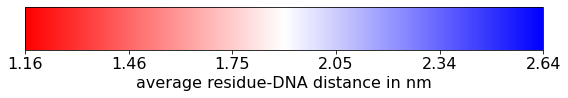

In [228]:
plt.close('all')

UBQ_CA_closeness = np.load('UBQ_CA_closeness.npy')
closeness_means = np.mean(UBQ_CA_closeness, axis=0)[1:]

a = np.array([[0, 1]])
plt.figure(figsize=(9, 1))
img = plt.imshow(a, cmap="bwr_r")
plt.gca().set_visible(False)
cax = plt.axes([0.1, 0.2, 0.8, 0.6])
plt.colorbar(orientation="horizontal", cax=cax)
cax.set_xticklabels([str(i) for i in np.round(np.linspace(closeness_means.min(), closeness_means.max(), 6), 2)])
cax.set_xlabel('average residue-DNA distance in nm')
plt.savefig("Ubi_DNA_distance_colorbar.pdf")
plt.savefig("/home/kevin/projects/living_ppt/penetration_scoring/Ubi_DNA_distance_colorbar.pdf")

In [230]:
UBQ_CA_closeness = np.load('UBQ_CA_closeness.npy')
closeness_means = np.mean(UBQ_CA_closeness, axis=0)[1:]
closeness_means_normed_to_256 = ((closeness_means - closeness_means.min()) / (closeness_means.max() - closeness_means.min()) * 256).astype(int)
print(closeness_means_normed_to_256)

def _set_color_by_residue(self, colors, component_index=0, repr_index=0):
        self._remote_call('setColorByResidue',
                           target='Widget',
                           args=[colors, component_index, repr_index])

ubq = md.load_pdb('https://files.rcsb.org/view/1ubq.pdb')
ubq = ubq.atom_slice(ubq.top.select('protein'))
cmap_values = closeness_means_normed_to_256
cmap = mpl.cm.get_cmap('bwr_r')

colors = ['0x' + mpl.colors.to_hex(cmap(i))[1:7].upper() for i in cmap_values]

[249 233 205 189 153 145 122 105 126 146 165 179 177 199 186 213 202 222
 220 210 178 146 123 105 130 132 102 110 134 119 103 128 139 115  94  76
  58  58  41  42  63  73  99 121 155 180 160 144 114 117 105  97 117 142
 167 181 214 198 188 221 209 243 256 242 218 191 155 131 101  81  59  41
  31  20   8   0]


In [231]:
view = ngl.show_mdtraj(ubq, gui=True)
view._set_color_by_residue = _set_color_by_residue
view._set_color_by_residue(view, colors, component_index=0, repr_index=0)
view

/home/kevin/.conda/envs/py39_tf2/lib/python3.9/site-packages/ipywidgets/widgets/widget.py:412: DeprecationWarning: Passing unrecognized arguments to super(NGLWidget).__init__(gui=True).
object.__init__() takes exactly one argument (the instance to initialize)
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


NGLWidget()

/home/kevin/.conda/envs/py39_tf2/lib/python3.9/site-packages/ipywidgets/widgets/widget_button.py:70: DeprecationWarning: icons names no longer start with 'fa-', just use the class name itself (for example, 'check' instead of 'fa-check')
  warnings.warn("icons names no longer start with 'fa-', "


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7ff4ec058a60>


In [219]:
view = ngl.show_mdtraj(stacked)
view.add_representation('ball+stick', selection=sel, color='green')
view

OSError: [Errno 28] No space left on device

# Here's how I do it

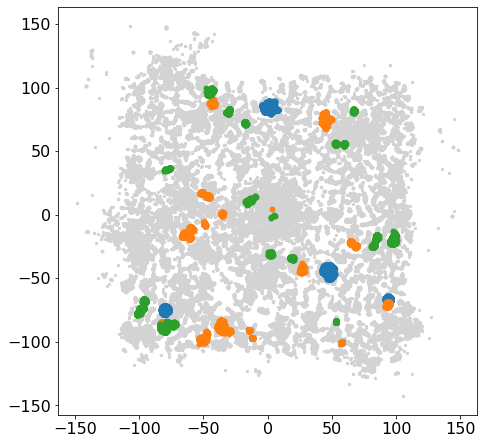

In [60]:
mpl.rcParams.update({'font.size': 16})
fig, ax = plt.subplots()
fig.set_size_inches(7.5, 7.5)
ax.scatter(*trajs.lowd.T, s=5, c='lightgrey')
where = np.where((trajs.df['cluster_membership'].values <= 4) & (trajs.df['cluster_membership'].values > 0))[0]
ax.scatter(*trajs.lowd[where].T, s=25, c='C0')
where = np.where((trajs.df['cluster_membership'].values <= 100) & (trajs.df['cluster_membership'].values > 80))[0]
ax.scatter(*trajs.lowd[where].T, s=25, c='C1')
where = np.where((trajs.df['cluster_membership'].values <= 200) & (trajs.df['cluster_membership'].values > 180))[0]
ax.scatter(*trajs.lowd[where].T, s=25, c='C2')
plt.savefig("/home/kevin/projects/living_ppt/heres_how_i_do_it_data_visualization/square.png", dpi=600, transparent=False)

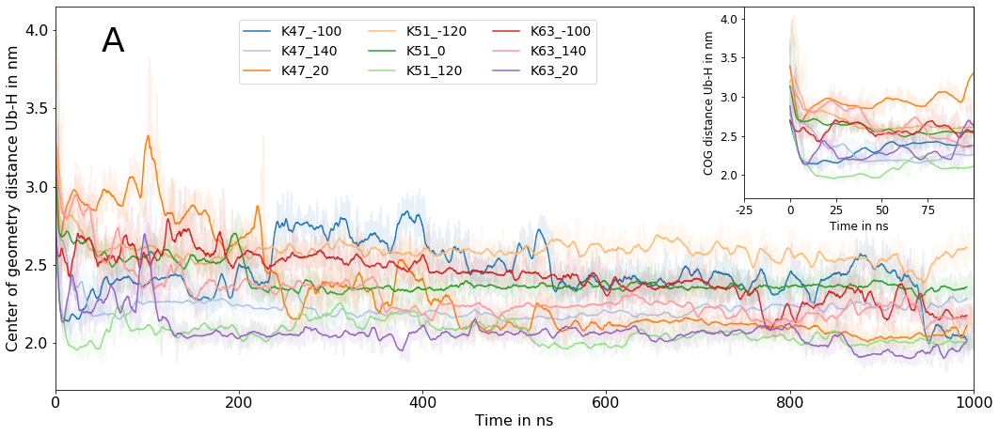

In [99]:
mpl.rcParams.update({'font.size': 16})
plt.close('all')
fig, ax = plt.subplots()
fig.set_size_inches(17.5, 7.5)

labels = list(map(lambda x: x.split('_1micros')[0], [traj.basename for traj in veronika_trajs]))

for i, d in enumerate(cog_distances):
    d = d[:20000]
    x = np.arange(0, len(d)) * 50
    c = plt.cm.tab20(i)
    ax.plot(x, d, alpha=0.1, c=c)
    N = 150
    y = np.convolve(d, np.ones((N,))/N, mode='valid')
    x = np.arange(0, len(y)) * 50
    ax.plot(x, y, alpha=1, c=c, label=labels[i])
    
ax.set_xlabel('Time in ns')
ax.set_xlim([0, 1000000])
ax.set_ylabel("Center of geometry distance Ub-H in nm")
ax.set_xticklabels(map(int, ax.get_xticks() / 1000))

ax.legend(loc=(0.2, 0.8), ncol=3, fontsize=14)

axin = ax.inset_axes([0.75, 0.5, 0.25, 0.5], transform=ax.transAxes)

for i, d in enumerate(cog_distances):
    x = np.arange(0, len(d)) * 50
    c = plt.cm.tab20(i)
    axin.plot(x, d, alpha=0.1, c=c)
    N = 150
    y = np.convolve(d, np.ones((N,))/N, mode='valid')
    x = np.arange(0, len(y)) * 50
    axin.plot(x, y, alpha=1, c=c)
    
axin.set_xlim([-10000, 100000])
_ = axin.get_xticks()[:-1]
axin.set_xticks(_)
axin.set_xticklabels(map(int, axin.get_xticks() / 1000), fontsize=12)
axin.set_yticklabels([2.0, 2.0, 2.5, 3.0, 3.5, 4.0], fontsize=12)
axin.set_xlabel('Time in ns', fontsize=12)
axin.set_ylabel("COG distance Ub-H in nm", fontsize=12)

txt = ax.text(0.05, 0.95, 'A', transform=ax.transAxes, fontsize=36, verticalalignment='top', color='k')

# plt.savefig("/home/kevin/projects/living_ppt/heres_how_i_do_it_data_visualization/21_9.png", dpi=600, transparent=False)

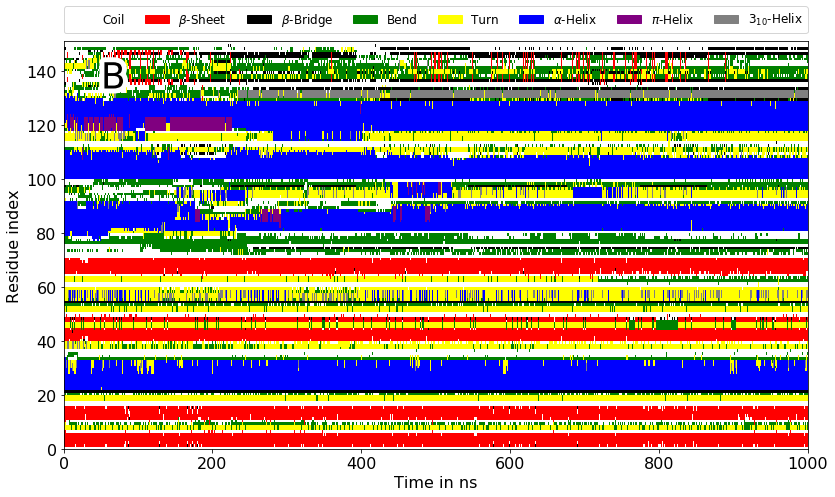

In [101]:
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.axes_grid1.colorbar import colorbar
import matplotlib.patches as mpatches
import matplotlib.patheffects as PathEffects

mpl.rcParams.update({'font.size': 16})
plt.close('all')
fig, ax2 = plt.subplots()
fig.set_size_inches(13.33, 7.5)

# DSSP
values = np.unique(data.ravel())
im = ax2.pcolor(data.T, cmap=cmap, norm=norm)
colors = [ im.cmap(im.norm(value)) for value in values]
# create a patch (proxy artist) for every color 
patches = [ mpatches.Patch(color=colors[i], label=dssp_names[i] ) for i in range(len(values)) ]
# put those patched as legend-handles into the legend
ax2.legend(handles=patches, bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=8, mode="expand", borderaxespad=0., fontsize=12)

ax2.set_xlim([0, 20000])
ax2.set_xticks(np.linspace(0, 20000, 6))
ax2.set_xticklabels(map(int, ax.get_xticks() / 1000))
ax2.set_xlabel('Time in ns')
ax2.set_ylabel('Residue index')

txt = ax2.text(0.05, 0.95, 'B', transform=ax2.transAxes, fontsize=36, verticalalignment='top', color='k')
txt.set_path_effects([PathEffects.withStroke(linewidth=10, foreground='w')])

plt.savefig("/home/kevin/projects/living_ppt/heres_how_i_do_it_data_visualization/16_9.png", dpi=600, transparent=False)

In [103]:
from matplotlib.cbook import *